# Physiological Sepsis Phenotyping for 5-5min segments in Pitt Data 
## Stage 2: Data preprocessing and phenotype identification

# With limited dataset (when matched with target vectors)



In [1]:
# rm -rf ~/.cache

In [7]:
# !pip uninstall -y scikit-learn imbalanced-learn
# !pip install scikit-learn==1.4.2 
# !pip install imbalanced-learn==0.12.0

In [1]:
import numpy as np
np.__version__

'1.26.4'

In [2]:
import sklearn
print(sklearn.__version__)

import imblearn
print(imblearn.__version__)

1.7.2
0.14.0


In [2]:
# %pip install scipy==1.11.4
# import tc_tabular_consensus_clusters_pipeline

In [1]:
import pandas as pd
from datetime import datetime
import os
import numpy as np
from scipy.io import loadmat
import glob
import json
import matplotlib.pyplot as plt
import time
from multiprocessing import Pool
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

# Rest of the workflow is as follows:

In [4]:
#
'''
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.cluster import KMeans
from torch.utils.data import DataLoader, TensorDataset

# ===== Step 1: Autoencoder Backbone =====
class Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dims, latent_dim):
        super().__init__()
        dims = [input_dim] + hidden_dims
        self.encoder = nn.Sequential(*[nn.Linear(dims[i], dims[i+1]) for i in range(len(dims)-1)])
        self.latent = nn.Linear(dims[-1], latent_dim)

    def forward(self, x):
        h = F.relu(self.encoder(x))
        z = self.latent(h)
        return z

class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dims, output_dim):
        super().__init__()
        dims = [latent_dim] + hidden_dims[::-1]
        self.decoder = nn.Sequential(*[nn.Linear(dims[i], dims[i+1]) for i in range(len(dims)-1)])
        self.output = nn.Linear(dims[-1], output_dim)

    def forward(self, z):
        h = F.relu(self.decoder(z))
        return self.output(h)

class Autoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dims, latent_dim):
        super().__init__()
        self.encoder = Encoder(input_dim, hidden_dims, latent_dim)
        self.decoder = Decoder(latent_dim, hidden_dims, input_dim)

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z), z

# ===== Step 2: Deep Embedded Clustering Module =====
class DEC(nn.Module):
    def __init__(self, ae, n_clusters):
        super().__init__()
        self.ae = ae
        self.n_clusters = n_clusters
        self.cluster_centers = nn.Parameter(torch.Tensor(n_clusters, ae.encoder.latent.out_features))
        nn.init.xavier_uniform_(self.cluster_centers.data)

    def target_distribution(self, q):
        weight = q ** 2 / q.sum(0)
        return (weight.t() / weight.sum(1)).t()

    def soft_assign(self, z):
        q = 1.0 / (1.0 + torch.sum((z.unsqueeze(1) - self.cluster_centers)**2, dim=2))
        q = q / q.sum(1, keepdim=True)
        return q

    def forward(self, x):
        _, z = self.ae(x)
        q = self.soft_assign(z)
        return q, z

# ===== Step 3: Training =====
def train_dec(model, data_tensor, n_clusters=4, pretrain_epochs=20, dec_epochs=50, batch_size=64):
    dataloader = DataLoader(TensorDataset(data_tensor), batch_size=batch_size, shuffle=True)
    optimizer = torch.optim.Adam(model.ae.parameters(), lr=1e-3)

    # --- Pretrain Autoencoder ---
    for epoch in range(pretrain_epochs):
        for batch in dataloader:
            x = batch[0]
            x_hat, _ = model.ae(x)
            loss = F.mse_loss(x_hat, x)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    # --- Initialize Clusters ---
    with torch.no_grad():
        latent = model.ae.encoder(data_tensor)
    kmeans = KMeans(n_clusters=n_clusters, n_init=20)
    model.cluster_centers.data.copy_(torch.tensor(kmeans.fit(latent.detach().numpy()).cluster_centers_))

    # --- Train DEC ---
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    for epoch in range(dec_epochs):
        for batch in dataloader:
            x = batch[0]
            q, z = model(x)
            p = model.target_distribution(q.detach())
            loss_kl = F.kl_div(q.log(), p, reduction='batchmean')
            x_hat, _ = model.ae(x)
            loss_recon = F.mse_loss(x_hat, x)
            loss = loss_kl + loss_recon
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    return model

# ===== Step 4: Usage Example =====
# Assume `X_tensor` is a torch.FloatTensor of shape (N, 87) with snapshot physiomarkers
# input_dim = 87
# hidden_dims = [64, 32]
# latent_dim = 10
# n_clusters = 4

# ae = Autoencoder(input_dim, hidden_dims, latent_dim)
# dec = DEC(ae, n_clusters)
# dec = train_dec(dec, X_tensor, n_clusters=n_clusters)
# dec


from sklearn.datasets import make_blobs
import torch
import numpy as np

# Parameters
n_samples = 300
n_features = 87  # same as your physiomarker count
n_clusters = 4   # for 4 phenotypes
random_state = 42

# Generate synthetic data
X_np, y_true = make_blobs(n_samples=n_samples, centers=n_clusters, 
                          n_features=n_features, cluster_std=1.5, random_state=random_state)

# Convert to PyTorch tensor
X_tensor = torch.tensor(X_np, dtype=torch.float32)

input_dim = n_features
hidden_dims = [64, 32]
latent_dim = 10
n_clusters = 4

ae = Autoencoder(input_dim, hidden_dims, latent_dim)
dec = DEC(ae, n_clusters)
dec = train_dec(dec, X_tensor, n_clusters=n_clusters)



from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce to 2D for visualization
X_pca = PCA(n_components=2).fit_transform(X_np)

# Plot ground truth clusters
plt.figure(figsize=(6, 5))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_true, cmap='viridis', s=20)
plt.title("Simulated Physiophenotypes (Ground Truth)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.show()

'''
# end

'\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\nfrom sklearn.cluster import KMeans\nfrom torch.utils.data import DataLoader, TensorDataset\n\n# ===== Step 1: Autoencoder Backbone =====\nclass Encoder(nn.Module):\n    def __init__(self, input_dim, hidden_dims, latent_dim):\n        super().__init__()\n        dims = [input_dim] + hidden_dims\n        self.encoder = nn.Sequential(*[nn.Linear(dims[i], dims[i+1]) for i in range(len(dims)-1)])\n        self.latent = nn.Linear(dims[-1], latent_dim)\n\n    def forward(self, x):\n        h = F.relu(self.encoder(x))\n        z = self.latent(h)\n        return z\n\nclass Decoder(nn.Module):\n    def __init__(self, latent_dim, hidden_dims, output_dim):\n        super().__init__()\n        dims = [latent_dim] + hidden_dims[::-1]\n        self.decoder = nn.Sequential(*[nn.Linear(dims[i], dims[i+1]) for i in range(len(dims)-1)])\n        self.output = nn.Linear(dims[-1], output_dim)\n\n    def forward(self, z):\n        h = 

In [ ]:
AllSuperTable_1 = pd.read_csv('Data_folder/df_step1_physiomarkers_presepsis6hrs_5minWindow_new_v5.csv')
AllSuperTable_1.drop(columns=['Unnamed: 0'],axis=1,inplace=True)
AllSuperTable_1 

In [ ]:
AllSuperTable_perfect = AllSuperTable_1[AllSuperTable_1.status=='perfect']
AllSuperTable_perfect

In [7]:
del AllSuperTable_1

In [8]:
len(AllSuperTable_perfect.fin.unique()), len(AllSuperTable_perfect.studyID.unique())

(2199, 2130)

<Axes: >

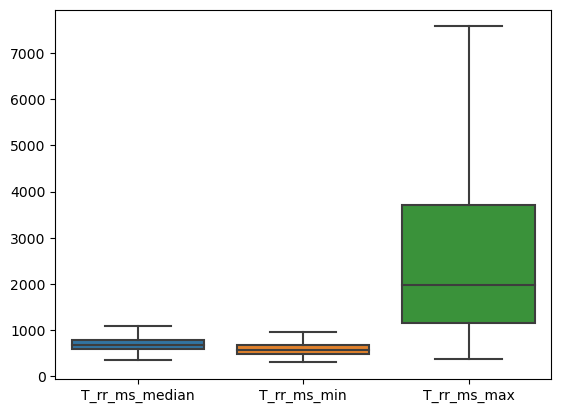

In [9]:
import seaborn as sns
sns.boxplot(AllSuperTable_perfect[['T_rr_ms_median', 'T_rr_ms_min', 'T_rr_ms_max']], showfliers=False)

In [ ]:
AllSuperTable_2 = AllSuperTable_perfect.drop_duplicates()
AllSuperTable_2.reset_index(drop=True, inplace=True)
AllSuperTable_2

In [11]:
del AllSuperTable_perfect

In [12]:
AllSuperTable_2[AllSuperTable_2.segmentID==0].shape, AllSuperTable_2[AllSuperTable_2.segmentID==0].fin.nunique()

((2195, 1351), 2195)

In [13]:
AllSuperTable_2.columns[:50]

Index(['Unnamed: 0.1', 'index', 'segmentID', 'waveID', 'fin', 'year_sepsis',
       'studyID', 't_origin', 't_sepsis', 'sofa', 'T_rr_ms_mean',
       'T_rr_ms_median', 'T_rr_ms_std', 'T_rr_ms_mad', 'T_rr_ms_iqr',
       'T_rr_ms_min', 'T_rr_ms_max', 'T_rr_ms_p25', 'T_rr_ms_p75',
       'T_rr_ms_skewness', 'T_rr_ms_kurtosis', 'T_rr_ms_entropy',
       'T_rr_ms_slope', 'T_rr_ms_autocorr_lag1', 'T_rr_ms_gini_index',
       'T_rr_ms_valid_n', 'HR_bpm_mean', 'HR_bpm_median', 'HR_bpm_std',
       'HR_bpm_mad', 'HR_bpm_iqr', 'HR_bpm_min', 'HR_bpm_max', 'HR_bpm_p25',
       'HR_bpm_p75', 'HR_bpm_skewness', 'HR_bpm_kurtosis', 'HR_bpm_entropy',
       'HR_bpm_slope', 'HR_bpm_autocorr_lag1', 'HR_bpm_gini_index',
       'HR_bpm_valid_n', 'edr_rate_Bpm_mean', 'edr_rate_Bpm_median',
       'edr_rate_Bpm_std', 'edr_rate_Bpm_mad', 'edr_rate_Bpm_iqr',
       'edr_rate_Bpm_min', 'edr_rate_Bpm_max', 'edr_rate_Bpm_p25'],
      dtype='object')

In [14]:
AllSuperTable_2.columns[50:]

Index(['edr_rate_Bpm_p75', 'edr_rate_Bpm_skewness', 'edr_rate_Bpm_kurtosis',
       'edr_rate_Bpm_entropy', 'edr_rate_Bpm_slope',
       'edr_rate_Bpm_autocorr_lag1', 'edr_rate_Bpm_gini_index',
       'edr_rate_Bpm_valid_n', 'atrialSys_phase_mean',
       'atrialSys_phase_median',
       ...
       'ShockIndex_p25', 'ShockIndex_p75', 'ShockIndex_skewness',
       'ShockIndex_kurtosis', 'ShockIndex_entropy', 'ShockIndex_slope',
       'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n', 'status'],
      dtype='object', length=1301)

In [15]:
AllSuperTable_2.fin.nunique()

2199

### Datatype handling

In [16]:
import re
'''Curation of studyID column if it carries "XXXX.0" sort of entries'''
def clean_mixed_column(val):
    # Convert to string
    val_str = str(val)
    
    # If it matches float with .0 (e.g., 1308267.0 or '1308267.0')
    if re.match(r'^\d+\.0$', val_str):
        return val_str.split('.')[0]  # Remove .0
    else:
        return val_str

AllSuperTable_2['studyID'] = AllSuperTable_2['studyID'].apply(clean_mixed_column)

In [17]:
AllSuperTable_2['fin'] = AllSuperTable_2['fin'].astype('int')
AllSuperTable_2['studyID'] = AllSuperTable_2['studyID'].astype('str')

In [18]:
AllSuperTable_2['t_sepsis'] = pd.to_datetime(AllSuperTable_2['t_sepsis'])

## Add qSOFAs as feature variable: qSOFA_sbp, qSOFA_rr, qSOFA_gcs

GCS < 15, Respiratory rate ≥ 22, Systolic BP ≤ 100

In [19]:
path = '../pitts_emr_data'

vitals_gcs = pd.read_csv(path + '/vitals_GCS_new.csv', low_memory=False)
vitals_rr = pd.read_csv(path + '/vitals_resp_rate.csv', low_memory=False)
vitals_sbp = pd.read_csv(path + '/vitals_sbp.csv', low_memory=False, on_bad_lines='skip')

In [20]:
# with open(path + '/vitals_sbp_new.csv', 'r') as f:
#     for i, line in enumerate(f):
#         if 2607000 <= i <= 2607015:
#             print(f"Line {i}: {line}")

In [21]:
# vitals4.shape, vitals7.shape, vitals8.shape

In [22]:
vitals_gcs['fin'] = vitals_gcs.FIN_study_id.astype('int')
vitals_gcs['studyID'] = vitals_gcs.study_id.astype('str')
vitals_gcs['chartdate'] = pd.to_datetime(vitals_gcs['chartdate'])

vitals_rr['fin'] = vitals_rr.FIN_study_id.astype('int')
vitals_rr['studyID'] = vitals_rr.study_id.astype('str')
vitals_rr['chartdate'] = pd.to_datetime(vitals_rr['chartdate'])

vitals_sbp['fin'] = vitals_sbp.FIN_study_id.astype('int')
vitals_sbp['studyID'] = vitals_sbp.study_id.astype('str')
vitals_sbp['chartdate'] = pd.to_datetime(vitals_sbp['chartdate'])

In [23]:
# v = [vitals4, vitals7, vitals8]
# v_matched = pd.DataFrame()
# for v_i in v:
#     v_i.reset_index(inplace=True, drop=True)
#     v_i['fin'] = v_i.FIN_study_id.values
#     v_i['studyID'] = v_i.study_id.values
#     v_i['chartdate'] = pd.to_datetime(v_i['chartdate'])
#     v_i_matched = AllSuperTable_2.merge(v_i[['fin','studyID','chartdate','result_val', 'result_unit', 
#                                  'Vitals']], on=['fin', 'studyID'], how='left')
#     v_i_matched = v_i_matched[~v_i_matched.Vitals.isnull()]
#     v_matched = pd.concat([v_matched, v_i_matched])
# v_matched.reset_index(inplace=True, drop=True)
# ## v_matched

In [24]:
# v = [vitals4, vitals7, vitals8]
# v_concat = pd.concat(v)

# v_concat.reset_index(inplace=True, drop=True)
# v_concat['fin'] = v_concat.FIN_study_id.values
# v_concat['studyID'] = v_concat.study_id.values
# v_concat['chartdate'] = pd.to_datetime(v_concat['chartdate'])
# v_concat

# v_matched = AllSuperTable_2.merge(v_concat[['fin','studyID','chartdate','result_val', 'result_unit', 
                                 # 'Vitals']], on=['fin'], how='left')

In [25]:
vitals_gcs.fin.nunique(), vitals_rr.fin.nunique(), vitals_sbp.fin.nunique(), AllSuperTable_2.fin.nunique()

(18989, 20875, 20860, 2199)

In [26]:
vitals_gcs_matched = vitals_gcs[vitals_gcs.fin.isin(AllSuperTable_2.fin)].drop_duplicates()
vitals_gcs_matched.shape

(162345, 10)

In [27]:
vitals_rr_matched = vitals_rr[vitals_rr.fin.isin(AllSuperTable_2.fin)].drop_duplicates()
vitals_rr_matched.shape

(591215, 10)

In [28]:
vitals_sbp_matched = vitals_sbp[vitals_sbp.fin.isin(AllSuperTable_2.fin)].drop_duplicates()
vitals_sbp_matched.shape

(538870, 10)

In [29]:
del vitals_gcs, vitals_rr, vitals_sbp
print("Unique FINs in AllSuperTable_2:", AllSuperTable_2['fin'].nunique())
print("Unique FINs in vitals_gcs_matched:", vitals_gcs_matched['fin'].nunique())
print("Unique FINs in vitals_rr_matched:", vitals_rr_matched['fin'].nunique())
print("Unique FINs in vitals_sbp_matched:", vitals_sbp_matched['fin'].nunique())

Unique FINs in AllSuperTable_2: 2199
Unique FINs in vitals_gcs_matched: 2067
Unique FINs in vitals_rr_matched: 2069
Unique FINs in vitals_sbp_matched: 2067


In [30]:
v_matched_gcs = AllSuperTable_2[['studyID', 'fin', 'segmentID', 't_sepsis']].merge(vitals_gcs_matched[['fin','studyID','chartdate','result_val', 'result_unit', 
                                 'Vitals']], on=['fin'], how='inner').drop_duplicates()
v_matched_gcs.shape

(2178791, 9)

In [31]:
v_matched_rr = AllSuperTable_2[['studyID', 'fin', 'segmentID', 't_sepsis']].merge(vitals_rr_matched[['fin','studyID','chartdate','result_val', 'result_unit', 
                                 'Vitals']], on=['fin'], how='inner').drop_duplicates()
v_matched_rr.shape

(8153084, 9)

In [32]:
v_matched_sbp = AllSuperTable_2[['studyID', 'fin', 'segmentID', 't_sepsis']].merge(vitals_sbp_matched[['fin','studyID','chartdate','result_val', 'result_unit', 
                                 'Vitals']], on=['fin'], how='inner').drop_duplicates()
v_matched_sbp.shape

(6889652, 9)

In [33]:
del vitals_gcs_matched, vitals_rr_matched, vitals_sbp_matched

In [34]:
# grouped = v_matched.groupby('Vitals')
# qSOFA_gcs = grouped.get_group('GCS')[['studyID','fin','chartdate','result_val']]
# qSOFA_gcs = qSOFA_gcs[qSOFA_gcs.result_val!=' ']

In [35]:
qSOFA_gcs = v_matched_gcs[['studyID_x','fin','chartdate','result_val']]
qSOFA_gcs['studyID'] = qSOFA_gcs['studyID_x'].astype('str')
qSOFA_gcs = qSOFA_gcs[qSOFA_gcs.result_val!=' ']
qSOFA_gcs['qSOFA_gcs'] = pd.Series(qSOFA_gcs['result_val'].astype('float') < 15, dtype=int)
qSOFA_gcs = qSOFA_gcs[['studyID', 'fin', 'chartdate', 'qSOFA_gcs']]
qSOFA_gcs.drop_duplicates(inplace=True)
qSOFA_gcs.reset_index(inplace=True, drop=True)

In [36]:
qSOFA_rr1 = v_matched_rr[['studyID_x','fin','chartdate','result_val']]
qSOFA_rr1['studyID'] = qSOFA_rr1['studyID_x'].astype('str')
qSOFA_rr1 = qSOFA_rr1[qSOFA_rr1.result_val!=' ']
qSOFA_rr1['qSOFA_rr'] = pd.Series(qSOFA_rr1['result_val'].astype('float') >= 22, dtype=int)
qSOFA_rr1 = qSOFA_rr1[['studyID', 'fin', 'chartdate', 'qSOFA_rr']]
qSOFA_rr1.drop_duplicates(inplace=True)
qSOFA_rr1.reset_index(inplace=True, drop=True)
qSOFA_rr = qSOFA_rr1.copy()

In [37]:
qSOFA_sbp1 = v_matched_sbp[['studyID_x','fin','chartdate','result_val']]
qSOFA_sbp1['studyID'] = qSOFA_sbp1['studyID_x'].astype('str')
qSOFA_sbp1 = qSOFA_sbp1[qSOFA_sbp1.result_val!=' ']
qSOFA_sbp1['qSOFA_sbp'] = pd.Series(qSOFA_sbp1['result_val'].astype('float') <= 100, dtype=int)
qSOFA_sbp1 = qSOFA_sbp1[['studyID', 'fin', 'chartdate', 'qSOFA_sbp']]
qSOFA_sbp1.drop_duplicates(inplace=True)
qSOFA_sbp1.reset_index(inplace=True, drop=True)
qSOFA_sbp = qSOFA_sbp1.copy()

In [38]:
# qSOFA_dbp = grouped.get_group('dbp')[['studyID','fin','chartdate','result_val']]
# qSOFA_dbp['dbp'] = qSOFA_dbp.result_val.values
# qSOFA_dbp = qSOFA_dbp[qSOFA_dbp.result_val!=' ']
# qSOFA_dbp.reset_index(inplace=True, drop=True)
# qSOFA_dbp.drop(columns=['result_val'], inplace=True)

# qSOFA_map = grouped.get_group('map')[['studyID','fin','chartdate','result_val']]
# qSOFA_map['map'] = qSOFA_map.result_val.values
# qSOFA_map = qSOFA_map[qSOFA_map.result_val!=' ']
# qSOFA_map.reset_index(inplace=True, drop=True)
# qSOFA_map.drop(columns=['result_val'], inplace=True)

# qSOFA_map_dbp = qSOFA_map.merge(qSOFA_dbp, on=['studyID','fin','chartdate'], how='left')
# qSOFA_map_dbp = qSOFA_map_dbp[~qSOFA_map_dbp.dbp.isnull()]
# qSOFA_map_dbp['sbp'] = (3*qSOFA_map_dbp['map'].astype('float')) - (2*qSOFA_map_dbp['dbp'].astype('float'))
# qSOFA_map_dbp['qSOFA_sbp'] = pd.Series(qSOFA_map_dbp['sbp']<=100, dtype=int)
# qSOFA_sbp = qSOFA_map_dbp[['studyID', 'fin', 'chartdate', 'qSOFA_sbp']]
# qSOFA_sbp.drop_duplicates(inplace=True)
# qSOFA_sbp.reset_index(inplace=True, drop=True)


In [39]:
AllSuperTable_2.fin.nunique(), qSOFA_sbp.fin.nunique(), qSOFA_rr.fin.nunique(), qSOFA_gcs.fin.nunique()

(2199, 2067, 2069, 2067)

In [40]:
sbp_rr = qSOFA_sbp.merge(qSOFA_rr, on=['studyID', 'fin', 'chartdate'], how='left')
sbp_rr_gcs = sbp_rr.merge(qSOFA_gcs, on=['studyID', 'fin', 'chartdate'], how='left')
sbp_rr_gcs.drop_duplicates(inplace=True)
sbp_rr_gcs.columns, sbp_rr_gcs.shape

(Index(['studyID', 'fin', 'chartdate', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs'], dtype='object'),
 (534140, 6))

In [41]:
AllSuperTable_wqSOFA = AllSuperTable_2[['studyID', 'fin', 'segmentID', 't_sepsis']].merge(sbp_rr_gcs, on=['studyID', 'fin'], how='left')
#AllSuperTable_wqSOFA = AllSuperTable_wqSOFA[~AllSuperTable_wqSOFA.qSOFA_total.isnull()]

In [ ]:
AllSuperTable_wqSOFA

In [43]:
AllSuperTable_2[['fin','segmentID']].drop_duplicates().shape, AllSuperTable_2.shape, #AllSuperTable_wqSOFA.fin.nunique()

((29727, 2), (29727, 1351))

In [44]:
# for individual encounter/fin and a given segmentID
def qSOFA_nearest_to_segment(df):
    df['diff_date'] = df['chartdate'] - df['t_sepsis'] - (df['segmentID']*pd.Timedelta('0 days 00:05:00'))
    if df[['qSOFA_sbp','qSOFA_rr','qSOFA_gcs']].isnull().all().all():
        mf = df.iloc[0]
    else: 
        if (df['diff_date']>=pd.Timedelta(0)).all(): # if all true
            minD = df['diff_date'].min() #Latest to tsepsis
        else:
            minD = df['diff_date'][df['diff_date']<pd.Timedelta(0)].max() #Latest to tsepsis
        mf = df.iloc[np.where(df['diff_date']==minD)[0][0]]
    return mf    

In [45]:
df_all = pd.DataFrame([])
for i in tqdm(range(AllSuperTable_2.shape[0])):
    fin_i = AllSuperTable_2.iloc[i]['fin']
    segmentID_i = AllSuperTable_2.iloc[i]['segmentID']
    df_fin = AllSuperTable_wqSOFA[AllSuperTable_wqSOFA.fin==fin_i]
    df_fin = df_fin.ffill()
    df_fin = df_fin.bfill()
    df_fin_seg = df_fin[df_fin.segmentID==segmentID_i]
    df_row = pd.DataFrame(qSOFA_nearest_to_segment(df_fin_seg)).T
    df_all = pd.concat([df_all, df_row])

100%|██████████| 29727/29727 [07:47<00:00, 63.59it/s]


In [ ]:
df_all.reset_index(inplace=True, drop=True)
df_all['qSOFA_total'] = df_all['qSOFA_sbp'] + df_all['qSOFA_rr'] + df_all['qSOFA_gcs'] 
df_all_2 = df_all[['studyID','fin','segmentID','t_sepsis','qSOFA_sbp','qSOFA_rr','qSOFA_gcs','qSOFA_total']]
df_all_2

In [47]:
df_all_2['t_sepsis'] = pd.to_datetime(df_all_2['t_sepsis'])
df_all_2.qSOFA_total.isnull().sum(), df_all_2.qSOFA_total.value_counts()

(1408,
 qSOFA_total
 1.0    13471
 2.0     7896
 0.0     5646
 3.0     1306
 Name: count, dtype: int64)

In [48]:
AllSuperTable_2new = AllSuperTable_2.merge(df_all_2, on=['studyID','fin','segmentID','t_sepsis'], how='left')

In [ ]:
AllSuperTable_2new

In [50]:
AllSuperTable_2new.drop(columns = ['status'], axis=1, inplace=True)

In [51]:
AllSuperTable_2new.columns

Index(['Unnamed: 0.1', 'index', 'segmentID', 'waveID', 'fin', 'year_sepsis',
       'studyID', 't_origin', 't_sepsis', 'sofa',
       ...
       'ShockIndex_kurtosis', 'ShockIndex_entropy', 'ShockIndex_slope',
       'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs',
       'qSOFA_total'],
      dtype='object', length=1354)

In [52]:
AllSuperTable_2new[~AllSuperTable_2new.qSOFA_gcs.isnull()].fin.nunique()

2056

In [53]:
AllSuperTable_2new.columns[7:]

Index(['t_origin', 't_sepsis', 'sofa', 'T_rr_ms_mean', 'T_rr_ms_median',
       'T_rr_ms_std', 'T_rr_ms_mad', 'T_rr_ms_iqr', 'T_rr_ms_min',
       'T_rr_ms_max',
       ...
       'ShockIndex_kurtosis', 'ShockIndex_entropy', 'ShockIndex_slope',
       'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs',
       'qSOFA_total'],
      dtype='object', length=1347)

# Outlier Rejection: using IQR method (considering non-normal nature of feature data)

In [54]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].isnull().sum().sum()

12215349

In [55]:
AllSuperTable_2new.DN_exists.isnull().sum()

5793

In [56]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].describe().iloc[:,:32]

,T_rr_ms_mean,T_rr_ms_median,T_rr_ms_std,T_rr_ms_mad,T_rr_ms_iqr,T_rr_ms_min,T_rr_ms_max,T_rr_ms_p25,T_rr_ms_p75,T_rr_ms_skewness,...,HR_bpm_max,HR_bpm_p25,HR_bpm_p75,HR_bpm_skewness,HR_bpm_kurtosis,HR_bpm_entropy,HR_bpm_slope,HR_bpm_autocorr_lag1,HR_bpm_gini_index,HR_bpm_valid_n
count,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,...,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000
mean,806.025151,715.565857,288.509281,129.734947,151.571660,584.755079,3056.864712,679.133591,830.705251,5.492338,...,109.427205,82.861366,92.803898,-2.747096,33.680083,1.084809,0.000681,0.118970,0.064157,371.003348
std,409.383431,247.707839,539.597344,299.404177,450.247406,152.052677,4040.113291,165.024941,540.909342,5.569542,...,27.788184,23.864192,20.125731,4.311530,68.926202,0.652590,0.284781,0.290818,0.068101,146.186375
min,365.452876,353.000000,0.725174,0.487805,0.000000,301.000000,380.000000,316.000000,357.000000,-18.074505,...,25.125628,3.122236,17.162471,-25.250719,-1.999501,0.009700,-12.822271,-0.996867,0.000777,4.000000
25%,614.032990,590.000000,48.440034,14.561644,12.000000,471.000000,1144.000000,569.000000,613.750000,1.661942,...,89.552239,69.524913,78.636959,-4.540452,-0.000037,0.562836,-0.005669,-0.038343,0.013963,285.000000
50%,720.089372,680.000000,148.176251,43.687500,23.000000,571.000000,1970.000000,660.000000,713.000000,3.847367,...,105.078809,84.151473,90.909091,-1.384020,5.376128,1.001010,-0.000157,0.052260,0.035246,390.000000
75%,896.604230,793.000000,355.214855,144.596386,80.000000,670.000000,3718.000000,763.000000,863.000000,8.330827,...,127.388535,97.759723,105.448155,-0.138513,33.342016,1.710493,0.005475,0.214309,0.100865,472.000000
max,12478.800000,7794.000000,13899.762873,9447.200000,16021.000000,2388.000000,119345.000000,3496.000000,19217.000000,27.318083,...,199.335548,168.067227,189.873418,21.865189,682.633643,2.274316,24.887594,0.996584,0.586842,817.000000


In [57]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].describe().iloc[:,32:50]

,edr_rate_Bpm_mean,edr_rate_Bpm_median,edr_rate_Bpm_std,edr_rate_Bpm_mad,edr_rate_Bpm_iqr,edr_rate_Bpm_min,edr_rate_Bpm_max,edr_rate_Bpm_p25,edr_rate_Bpm_p75,edr_rate_Bpm_skewness,edr_rate_Bpm_kurtosis,edr_rate_Bpm_entropy,edr_rate_Bpm_slope,edr_rate_Bpm_autocorr_lag1,edr_rate_Bpm_gini_index,edr_rate_Bpm_valid_n,atrialSys_phase_mean,atrialSys_phase_median
count,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,22101.000000,22101.000000
mean,17.060392,16.536058,5.591293,4.234913,7.059912,7.879220,35.566199,13.061490,20.121401,0.833497,2.112762,1.863762,0.000837,0.024873,0.176130,65.721357,145.429443,143.987851
std,2.261769,2.709334,1.629246,1.126218,2.386610,1.912837,11.634978,2.564578,2.797120,0.996061,5.632666,0.285572,0.524841,0.177520,0.044293,19.535557,39.703881,40.897427
min,6.746121,6.250108,0.006755,0.006755,0.006755,1.698658,8.913980,5.416848,7.617275,-5.313071,-2.000000,0.229523,-19.743818,-0.879487,0.000291,2.000000,77.926509,3.000000
25%,15.575244,14.862522,4.704713,3.609260,5.660377,6.780427,29.083858,11.162791,18.348624,0.303265,-0.361956,1.753672,-0.026526,-0.081917,0.153549,60.000000,124.236957,122.000000
50%,17.093590,16.551971,5.516075,4.267721,7.090697,7.692308,33.688939,13.008167,20.140987,0.682116,0.473430,1.935607,0.000481,0.024762,0.177183,70.000000,138.166172,137.000000
75%,18.532235,18.192844,6.383583,4.930167,8.499540,8.693132,39.241334,14.646729,21.937843,1.157555,2.181971,2.057275,0.028070,0.138074,0.203492,78.000000,158.231481,157.000000
max,27.643192,29.268634,21.615115,11.218451,18.626746,26.513478,123.966942,26.611566,31.429234,9.236552,91.931064,2.287840,17.854068,0.825790,0.423617,123.000000,923.181818,998.000000


In [58]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].describe().iloc[:,50:85]

,atrialSys_phase_std,atrialSys_phase_mad,atrialSys_phase_iqr,atrialSys_phase_min,atrialSys_phase_max,atrialSys_phase_p25,atrialSys_phase_p75,atrialSys_phase_skewness,atrialSys_phase_kurtosis,atrialSys_phase_entropy,...,ventSys_phase_entropy,ventSys_phase_slope,ventSys_phase_autocorr_lag1,ventSys_phase_gini_index,ventSys_phase_valid_n,P_duration_mean,P_duration_median,P_duration_std,P_duration_mad,P_duration_iqr
count,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,...,22030.000000,22030.000000,22030.000000,22030.000000,22030.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000
mean,15.187569,10.617542,17.018981,108.524863,205.276503,136.173703,153.192684,0.933493,12.345051,1.494481,...,0.770589,52.974009,0.037577,0.271737,331.983749,66.826343,64.945229,19.945300,14.566461,24.259162
std,18.188010,13.531291,25.563191,30.170872,80.015867,37.623059,47.035828,2.573426,31.811004,0.469646,...,0.509012,3947.993728,0.131657,0.198456,150.433592,22.825513,25.627805,10.450473,8.607913,18.332733
min,0.497494,0.250000,0.000000,1.000000,82.000000,2.000000,79.000000,-19.243986,-1.977069,0.012309,...,0.010147,-116134.500000,-0.874065,0.001559,2.000000,20.160271,18.000000,0.730150,0.493225,0.000000
25%,5.145126,3.538618,5.000000,87.000000,154.000000,116.000000,129.000000,-0.179256,-0.117094,1.166143,...,0.355713,-0.121786,-0.028669,0.077915,242.000000,50.725086,45.000000,12.701586,8.312500,9.000000
50%,9.070161,5.942308,9.000000,106.000000,189.000000,131.000000,145.000000,0.504628,1.923838,1.580454,...,0.720884,0.002348,0.012848,0.259756,352.000000,64.489676,62.000000,19.022107,13.607623,21.000000
75%,19.911886,13.302326,20.000000,125.000000,238.000000,150.000000,167.000000,1.604557,9.867340,1.873368,...,1.090368,0.135005,0.089698,0.438986,438.750000,79.597633,80.000000,26.155285,19.862416,35.000000
max,413.714421,370.896552,783.500000,616.000000,1542.000000,910.000000,1207.000000,22.515780,529.454676,2.291163,...,2.266579,264489.000000,0.848662,0.893243,796.000000,410.100000,436.000000,204.014415,162.678571,381.250000


In [59]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].describe().iloc[:,85:100]

,P_duration_min,P_duration_max,P_duration_p25,P_duration_p75,P_duration_skewness,P_duration_kurtosis,P_duration_entropy,P_duration_slope,P_duration_autocorr_lag1,P_duration_gini_index,P_duration_valid_n,QRS_duration_mean,QRS_duration_median,QRS_duration_std,QRS_duration_mad
count,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22101.000000,22088.000000,22088.000000,22088.000000,22088.000000
mean,27.450930,138.374236,53.629202,77.888365,0.674560,4.876127,1.603384,-0.001708,0.073391,0.162170,371.243292,102.725951,98.766661,28.102361,20.871945
std,15.374372,47.256983,23.479738,27.648128,1.703797,14.522984,0.377882,0.227156,0.152882,0.080219,145.035253,37.965856,39.816279,16.057853,13.280477
min,6.000000,31.000000,15.000000,20.000000,-17.200708,-1.970936,0.023267,-8.791176,-0.765560,0.005621,7.000000,36.736434,37.000000,0.000000,0.000000
25%,19.000000,108.000000,35.000000,58.000000,-0.170073,-0.306048,1.384120,-0.010394,-0.014841,0.097811,286.000000,74.873992,71.000000,17.448157,11.911985
50%,23.000000,132.000000,49.000000,75.000000,0.633771,1.101639,1.677713,-0.000164,0.042445,0.168338,389.000000,96.666783,92.000000,27.311662,20.000000
75%,30.000000,159.000000,68.000000,94.000000,1.406865,4.574423,1.889315,0.010596,0.127197,0.219249,471.000000,123.335470,119.500000,35.858541,28.127349
max,343.000000,876.000000,409.500000,464.500000,19.526296,417.266811,2.266963,6.531708,0.963523,0.488310,802.000000,817.766667,992.500000,261.848258,235.650350


In [60]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].describe().iloc[:,100:]

,QRS_duration_iqr,QRS_duration_min,QRS_duration_max,QRS_duration_p25,QRS_duration_p75,QRS_duration_skewness,QRS_duration_kurtosis,QRS_duration_entropy,QRS_duration_slope,QRS_duration_autocorr_lag1,...,ShockIndex_max,ShockIndex_p25,ShockIndex_p75,ShockIndex_skewness,ShockIndex_kurtosis,ShockIndex_entropy,ShockIndex_slope,ShockIndex_autocorr_lag1,ShockIndex_gini_index,ShockIndex_valid_n
count,22088.000000,22088.000000,22088.000000,22088.000000,22088.000000,22033.000000,22033.000000,22038.000000,22038.000000,22033.000000,...,2508.000000,2508.000000,2508.000000,2508.000000,2508.000000,2508.000000,2508.000000,2508.000000,2508.000000,2508.000000
mean,36.675525,55.534136,190.139488,82.696860,119.372385,0.904285,5.199328,1.518712,-0.025669,0.033094,...,1.365716,0.757847,0.850799,1.157417,18.905357,1.379862,0.000064,0.197282,0.058046,389.403509
std,29.364961,23.011136,73.150343,33.640235,48.336330,1.885694,21.380028,0.445615,2.332047,0.123633,...,0.739706,0.216758,0.271212,3.042524,36.801914,0.504230,0.001336,0.353458,0.055101,145.073135
min,0.000000,13.000000,40.000000,23.000000,38.000000,-13.293501,-2.000000,0.000000,-121.000000,-0.724975,...,0.366682,0.061970,0.161258,-10.870544,-1.974310,0.018426,-0.015365,-0.857394,0.003240,5.000000
25%,14.750000,42.000000,146.000000,56.000000,85.000000,0.052741,-0.746918,1.239458,-0.019023,-0.027010,...,0.835890,0.618034,0.663634,-0.262432,0.275295,1.003614,-0.000057,-0.075811,0.021832,345.000000
50%,34.000000,49.000000,183.000000,78.000000,112.000000,0.636762,0.292207,1.605648,-0.001059,0.026154,...,1.116469,0.729297,0.810580,0.491805,5.175160,1.367779,0.000005,0.158787,0.038551,422.000000
75%,52.000000,63.000000,227.000000,99.000000,145.000000,1.392179,3.258315,1.872598,0.013355,0.088740,...,1.713895,0.894484,0.972558,2.186615,18.603299,1.860412,0.000079,0.453128,0.076945,483.000000
max,482.500000,588.000000,1133.000000,634.000000,999.000000,22.992809,586.351495,2.272385,115.000000,0.882567,...,5.000913,1.818338,2.024489,18.624460,353.438156,2.263568,0.041293,0.984824,0.442989,727.000000


<Axes: >

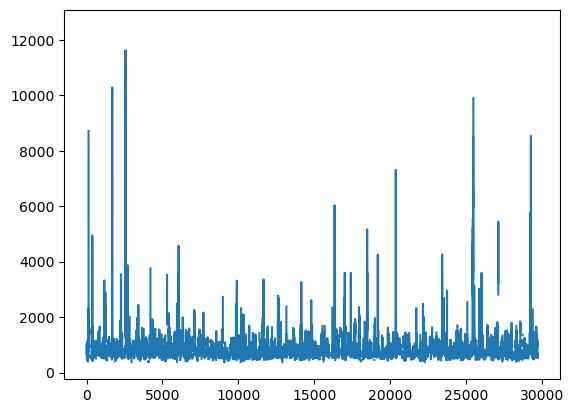

In [61]:
AllSuperTable_2new.T_rr_ms_mean.plot()

<Axes: >

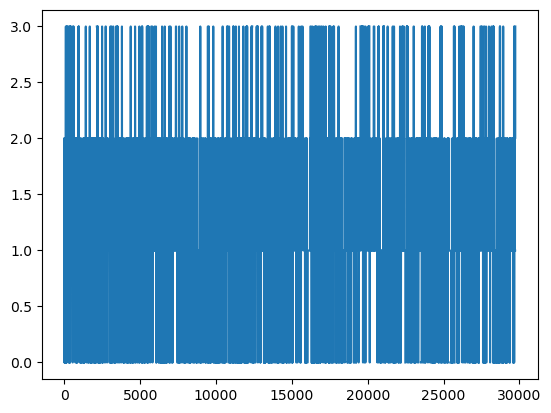

In [62]:
AllSuperTable_2new.qSOFA_total.plot()

In [63]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].isnull().sum().sum(), AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].shape

(12215349, (29727, 1344))

In [64]:
AllSuperTable_2new = AllSuperTable_2new.replace([np.inf, -np.inf], np.nan)
# AllSuperTable_2['hrv_dfa_alpha2'] = AllSuperTable_2['hrv_dfa_alpha2'].apply(lambda x: np.nan if x == '[]' else x).astype(float)


In [65]:
AllSuperTable_2new.columns[9:]

Index(['sofa', 'T_rr_ms_mean', 'T_rr_ms_median', 'T_rr_ms_std', 'T_rr_ms_mad',
       'T_rr_ms_iqr', 'T_rr_ms_min', 'T_rr_ms_max', 'T_rr_ms_p25',
       'T_rr_ms_p75',
       ...
       'ShockIndex_kurtosis', 'ShockIndex_entropy', 'ShockIndex_slope',
       'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs',
       'qSOFA_total'],
      dtype='object', length=1345)

In [66]:
'''
Don't do the outlier-rejection in categorial and ordinal numeric variables

DN_exists, ppg_class, qSOFA_xx
'''
for i in AllSuperTable_2new.loc[:,'T_rr_ms_mean':'ShockIndex_valid_n'].columns: #ShockIndex
    if (i!='DN_exists') and (i!='ppg_class'):
        print(i)
        percentile25 = AllSuperTable_2new[i].quantile(0.25)
        percentile75 = AllSuperTable_2new[i].quantile(0.75)
        iqr = percentile75 - percentile25
        upper_limit = percentile75 + 1.5 * iqr
        lower_limit = percentile25 - 1.5 * iqr
        
        ### METHODS: Trimming or Caping or Replacing by nans
        ### Selected "Replacing by nans" method  
        uL = np.where(AllSuperTable_2new[i] > upper_limit)[0]
        lL = np.where(AllSuperTable_2new[i] < lower_limit)[0]
        
        AllSuperTable_2new.loc[uL,i] = np.nan
        AllSuperTable_2new.loc[lL,i] = np.nan



T_rr_ms_mean
T_rr_ms_median
T_rr_ms_std
T_rr_ms_mad
T_rr_ms_iqr
T_rr_ms_min
T_rr_ms_max
T_rr_ms_p25
T_rr_ms_p75
T_rr_ms_skewness
T_rr_ms_kurtosis
T_rr_ms_entropy
T_rr_ms_slope
T_rr_ms_autocorr_lag1
T_rr_ms_gini_index
T_rr_ms_valid_n
HR_bpm_mean
HR_bpm_median
HR_bpm_std
HR_bpm_mad
HR_bpm_iqr
HR_bpm_min
HR_bpm_max
HR_bpm_p25
HR_bpm_p75
HR_bpm_skewness
HR_bpm_kurtosis
HR_bpm_entropy
HR_bpm_slope
HR_bpm_autocorr_lag1
HR_bpm_gini_index
HR_bpm_valid_n
edr_rate_Bpm_mean
edr_rate_Bpm_median
edr_rate_Bpm_std
edr_rate_Bpm_mad
edr_rate_Bpm_iqr
edr_rate_Bpm_min
edr_rate_Bpm_max
edr_rate_Bpm_p25
edr_rate_Bpm_p75
edr_rate_Bpm_skewness
edr_rate_Bpm_kurtosis
edr_rate_Bpm_entropy
edr_rate_Bpm_slope
edr_rate_Bpm_autocorr_lag1
edr_rate_Bpm_gini_index
edr_rate_Bpm_valid_n
atrialSys_phase_mean
atrialSys_phase_median
atrialSys_phase_std
atrialSys_phase_mad
atrialSys_phase_iqr
atrialSys_phase_min
atrialSys_phase_max
atrialSys_phase_p25
atrialSys_phase_p75
atrialSys_phase_skewness
atrialSys_phase_kurtosis
atr

In [67]:
AllSuperTable_2new.loc[:,'T_rr_ms_mean':'qSOFA_total'].isnull().sum().sum()

13773833

<Axes: >

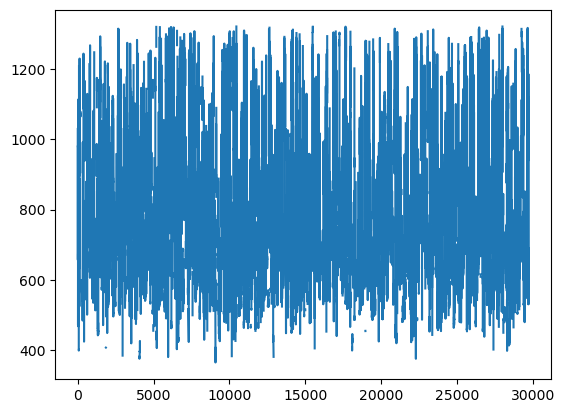

In [68]:
AllSuperTable_2new.T_rr_ms_mean.plot()

In [69]:
AllSuperTable_2new.reset_index(inplace=True, drop=True)
AllSuperTable_2new.shape

(29727, 1354)

In [70]:
# df_Sepsis_demo.reset_index(inplace=True, drop=True)

In [71]:
AllSuperTable_2new.columns[:100]

Index(['Unnamed: 0.1', 'index', 'segmentID', 'waveID', 'fin', 'year_sepsis',
       'studyID', 't_origin', 't_sepsis', 'sofa', 'T_rr_ms_mean',
       'T_rr_ms_median', 'T_rr_ms_std', 'T_rr_ms_mad', 'T_rr_ms_iqr',
       'T_rr_ms_min', 'T_rr_ms_max', 'T_rr_ms_p25', 'T_rr_ms_p75',
       'T_rr_ms_skewness', 'T_rr_ms_kurtosis', 'T_rr_ms_entropy',
       'T_rr_ms_slope', 'T_rr_ms_autocorr_lag1', 'T_rr_ms_gini_index',
       'T_rr_ms_valid_n', 'HR_bpm_mean', 'HR_bpm_median', 'HR_bpm_std',
       'HR_bpm_mad', 'HR_bpm_iqr', 'HR_bpm_min', 'HR_bpm_max', 'HR_bpm_p25',
       'HR_bpm_p75', 'HR_bpm_skewness', 'HR_bpm_kurtosis', 'HR_bpm_entropy',
       'HR_bpm_slope', 'HR_bpm_autocorr_lag1', 'HR_bpm_gini_index',
       'HR_bpm_valid_n', 'edr_rate_Bpm_mean', 'edr_rate_Bpm_median',
       'edr_rate_Bpm_std', 'edr_rate_Bpm_mad', 'edr_rate_Bpm_iqr',
       'edr_rate_Bpm_min', 'edr_rate_Bpm_max', 'edr_rate_Bpm_p25',
       'edr_rate_Bpm_p75', 'edr_rate_Bpm_skewness', 'edr_rate_Bpm_kurtosis',
       'e

In [72]:
AllSuperTable_2new.columns[100:200]

Index(['P_duration_kurtosis', 'P_duration_entropy', 'P_duration_slope',
       'P_duration_autocorr_lag1', 'P_duration_gini_index',
       'P_duration_valid_n', 'QRS_duration_mean', 'QRS_duration_median',
       'QRS_duration_std', 'QRS_duration_mad', 'QRS_duration_iqr',
       'QRS_duration_min', 'QRS_duration_max', 'QRS_duration_p25',
       'QRS_duration_p75', 'QRS_duration_skewness', 'QRS_duration_kurtosis',
       'QRS_duration_entropy', 'QRS_duration_slope',
       'QRS_duration_autocorr_lag1', 'QRS_duration_gini_index',
       'QRS_duration_valid_n', 'T_duration_mean', 'T_duration_median',
       'T_duration_std', 'T_duration_mad', 'T_duration_iqr', 'T_duration_min',
       'T_duration_max', 'T_duration_p25', 'T_duration_p75',
       'T_duration_skewness', 'T_duration_kurtosis', 'T_duration_entropy',
       'T_duration_slope', 'T_duration_autocorr_lag1', 'T_duration_gini_index',
       'T_duration_valid_n', 'pr_interval_ms_mean', 'pr_interval_ms_median',
       'pr_interval_ms_s

In [73]:
AllSuperTable_2new.columns[200:]

Index(['st_segment_ms_gini_index', 'st_segment_ms_valid_n',
       'qt_interval_ms_mean', 'qt_interval_ms_median', 'qt_interval_ms_std',
       'qt_interval_ms_mad', 'qt_interval_ms_iqr', 'qt_interval_ms_min',
       'qt_interval_ms_max', 'qt_interval_ms_p25',
       ...
       'ShockIndex_kurtosis', 'ShockIndex_entropy', 'ShockIndex_slope',
       'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs',
       'qSOFA_total'],
      dtype='object', length=1154)

In [74]:
df_Sepsis_final = AllSuperTable_2new.copy()



# [['waveID', 'fin', 'segmentID', 'year_sepsis', 'studyID', 't_origin',
#        't_sepsis', 'sofa', 'DN_exists', 'ppg_class', 'T_rr_ms', 'HR_bpm', 'edr_rate_Bpm',
#        'atrialSys_phase', 'ventSys_phase', 'P_duration', 'QRS_duration',
#        'T_duration', 'pr_interval_ms', 'pr_segment_ms', 'st_interval_ms',
#        'st_segment_ms', 'qt_interval_ms', 'qtc_interval_ms',
#        'ecgBeatCenterFreq', 'ecgInterbeat_eigval1', 'ecgInterbeat_eigval2',
#        'ecgInterbeat_eigval3', 'HRV_rqa_REC', 'HRV_rqa_DET', 'HRV_rqa_LAM',
#        'HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_SDNNI1', 'HRV_SDANN2',
#        'HRV_SDNNI2', 'HRV_SDANN5', 'HRV_SDNNI5', 'HRV_RMSSD', 'HRV_SDSD',
#        'HRV_CVNN', 'HRV_CVSD', 'HRV_MedianNN', 'HRV_MadNN', 'HRV_MCVNN',
#        'HRV_IQRNN', 'HRV_SDRMSSD', 'HRV_Prc20NN', 'HRV_Prc80NN', 'HRV_pNN50',
#        'HRV_pNN20', 'HRV_MinNN', 'HRV_MaxNN', 'HRV_HTI', 'HRV_TINN', 'HRV_ULF',
#        'HRV_VLF', 'HRV_LF', 'HRV_HF', 'HRV_VHF', 'HRV_TP', 'HRV_LFHF',
#        'HRV_LFn', 'HRV_HFn', 'HRV_LnHF', 'HRV_SD1', 'HRV_SD2', 'HRV_SD1SD2',
#        'HRV_S', 'HRV_CSI', 'HRV_CVI', 'HRV_CSI_Modified', 'HRV_PIP',
#        'HRV_IALS', 'HRV_PSS', 'HRV_PAS', 'HRV_GI', 'HRV_SI', 'HRV_AI',
#        'HRV_PI', 'HRV_C1d', 'HRV_C1a', 'HRV_SD1d', 'HRV_SD1a', 'HRV_C2d',
#        'HRV_C2a', 'HRV_SD2d', 'HRV_SD2a', 'HRV_Cd', 'HRV_Ca', 'HRV_SDNNd',
#        'HRV_SDNNa', 'HRV_DFA_alpha1', 'HRV_MFDFA_alpha1_Width',
#        'HRV_MFDFA_alpha1_Peak', 'HRV_MFDFA_alpha1_Mean',
#        'HRV_MFDFA_alpha1_Max', 'HRV_MFDFA_alpha1_Delta',
#        'HRV_MFDFA_alpha1_Asymmetry', 'HRV_MFDFA_alpha1_Fluctuation', 
#        'HRV_MFDFA_alpha1_Increment', 'HRV_DFA_alpha2',
#        'HRV_MFDFA_alpha2_Width', 'HRV_MFDFA_alpha2_Peak',
#        'HRV_MFDFA_alpha2_Mean', 'HRV_MFDFA_alpha2_Max',
#        'HRV_MFDFA_alpha2_Delta', 'HRV_MFDFA_alpha2_Asymmetry',
#        'HRV_MFDFA_alpha2_Fluctuation', 'HRV_MFDFA_alpha2_Increment',
#        'HRV_ApEn', 'HRV_SampEn', 'HRV_ShanEn', 'HRV_FuzzyEn', 'HRV_MSEn',
#        'HRV_CMSEn', 'HRV_RCMSEn', 'HRV_CD', 'HRV_HFD', 'HRV_KFD', 'HRV_LZC',
#        'MSE_0', 'MSE_1', 'MSE_2', 'MSE_3', 'MSE_4', 'MSE_5', 'MSE_6', 'MSE_7',
#        'MSE_8', 'MSE_9', 'MSE_10', 'MSE_11', 'MSE_12', 'MSE_13', 'MSE_14',
#        'MSE_15', 'MSE_16', 'MSE_17', 'MSE_18', 'MSE_19', 'AUC_pulse_nu',
#        'AUC_sys_nu', 'AUC_dias_nu', 'IPA', 'AUCow_nu', 'AUCwo_nu', 'AUCos_nu',
#        'AUCso_nu', 'Tsys_ms', 'Tdias_ms', 'T_ow_ms', 'T_wo_ms', 'T_os_ms',
#        'T_so_ms', 'T_so_cd_ms', 'A_AC', 'A_off', 'A_sp', 'A_dn',
#        'Ton_off_ms', 'Tsp_sp_ms', 'PR', 'mean_slope_os', 'mean_slope_so',
#        'Delta_T_sd', 'RI', 'SI', 'Delta_A_dn_dp', 'T_dn_dp_ms',
#        'max_upslope', 'pat_ms', 'dpat_ms', 'Delta_A_sp_sp',
#        'Augmentation_index', 'center_freq_ppg_Hz', 'mean_ppg', 'median_ppg',
#        'variance_ppg', 'skewness_ppg', 'kurtosis_ppg', 'std_ppg',
#        'entropy_ppg', 'energy_ppg', 'PW_10', 'PW_25', 'PW_33', 'PW_50',
#        'PW_66', 'PW_75', 'ppgBeatCenterFreq', 'ppgInterbeat_eigval1',
#        'ppgInterbeat_eigval2', 'ppgInterbeat_eigval3', 'insp_time', 'exp_time',
#        'insp_exp_ratio', 'resp_width_PPresp_s', 'resp_rate_Bpm', 'qSOFA_sbp', 'qSOFA_rr',
#        'qSOFA_gcs', 'qSOFA_total', 'SBP', 'DBP', 'HR_ABP', 
#        'MAP', 'PP_ABP', 'CO', 'TPR','ShockIndex']]
       
       

In [ ]:
df_Sepsis_final

In [76]:
# df_Sepsis_demo['csn'].equals(df_Sepsis_final['csn'])

In [77]:
df_Sepsis_final.ppg_class.unique()

array(['Class3', nan, 'Class2', 'Class1'], dtype=object)

# Step 1: Data Preprocessing (unimputed data)

In [78]:
df_Sepsis_final.replace([np.inf, -np.inf], np.nan, inplace=True)

In [79]:
# pip install seaborn

In [80]:
# df_Sepsis_final.shape, len(df_Sepsis_final.waveID.unique()), len(df_Sepsis_final.csn.unique()), len(df_Sepsis_final.pat_id.unique()), df_Sepsis_final.year.unique()



In [81]:
df_Sepsis_final.columns

Index(['Unnamed: 0.1', 'index', 'segmentID', 'waveID', 'fin', 'year_sepsis',
       'studyID', 't_origin', 't_sepsis', 'sofa',
       ...
       'ShockIndex_kurtosis', 'ShockIndex_entropy', 'ShockIndex_slope',
       'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs',
       'qSOFA_total'],
      dtype='object', length=1354)

In [82]:
df_Sepsis_final.loc[:,'T_rr_ms_mean':].isnull().sum()

T_rr_ms_mean           8723
T_rr_ms_median         8290
T_rr_ms_std            8958
T_rr_ms_mad            9667
T_rr_ms_iqr           11358
                      ...  
ShockIndex_valid_n    27483
qSOFA_sbp              1275
qSOFA_rr               1287
qSOFA_gcs              1401
qSOFA_total            1408
Length: 1344, dtype: int64

In [83]:
df_Sepsis_final.DN_exists.value_counts()

DN_exists
True     20941
False     2993
Name: count, dtype: int64

In [84]:
AllSuperTable_2[AllSuperTable_2.T_rr_ms_median.isnull()][['index','T_rr_ms_median','edr_rate_Bpm_median','Tsp_sp_ms_median']]

,index,T_rr_ms_median,edr_rate_Bpm_median,Tsp_sp_ms_median
12,10,NaN,NaN,NaN
13,10,NaN,NaN,NaN
17,25,NaN,NaN,666.0
18,25,NaN,NaN,670.0
19,25,NaN,NaN,668.0
...,...,...,...,...
29583,4020,NaN,NaN,NaN
29584,4020,NaN,NaN,NaN
29634,4026,NaN,NaN,NaN
29715,4037,NaN,NaN,886.0


## Rejection of Features: Check the missingness (%) for every variables: discard if >85%

In [85]:
ix_list = []
indx = list(df_Sepsis_final.columns).index('T_rr_ms_mean')
for ix, i in enumerate(df_Sepsis_final.columns[indx:]):
    missing_percent = np.round(100*df_Sepsis_final[i].isnull().sum()/len(df_Sepsis_final),2)
    if missing_percent >= 85:
        ix_list.append(indx+ix)
    print(i+':  ', missing_percent,'%')
df_Sepsis_final.columns[ix_list]

T_rr_ms_mean:   29.34 %
T_rr_ms_median:   27.89 %
T_rr_ms_std:   30.13 %
T_rr_ms_mad:   32.52 %
T_rr_ms_iqr:   38.21 %
T_rr_ms_min:   26.82 %
T_rr_ms_max:   29.65 %
T_rr_ms_p25:   27.06 %
T_rr_ms_p75:   33.0 %
T_rr_ms_skewness:   28.59 %
T_rr_ms_kurtosis:   33.81 %
T_rr_ms_entropy:   25.65 %
T_rr_ms_slope:   43.54 %
T_rr_ms_autocorr_lag1:   37.01 %
T_rr_ms_gini_index:   27.33 %
T_rr_ms_valid_n:   25.81 %
HR_bpm_mean:   26.22 %
HR_bpm_median:   26.7 %
HR_bpm_std:   26.12 %
HR_bpm_mad:   27.59 %
HR_bpm_iqr:   39.89 %
HR_bpm_min:   28.54 %
HR_bpm_max:   26.25 %
HR_bpm_p25:   27.04 %
HR_bpm_p75:   26.48 %
HR_bpm_skewness:   30.19 %
HR_bpm_kurtosis:   34.93 %
HR_bpm_entropy:   25.65 %
HR_bpm_slope:   38.1 %
HR_bpm_autocorr_lag1:   33.77 %
HR_bpm_gini_index:   27.56 %
HR_bpm_valid_n:   25.81 %
edr_rate_Bpm_mean:   27.79 %
edr_rate_Bpm_median:   28.45 %
edr_rate_Bpm_std:   30.27 %
edr_rate_Bpm_mad:   29.09 %
edr_rate_Bpm_iqr:   28.36 %
edr_rate_Bpm_min:   29.85 %
edr_rate_Bpm_max:   30.08 %
e

Index(['HRV_SDANN2', 'HRV_SDNNI2', 'HRV_SDANN5', 'HRV_SDNNI5', 'HRV_ULF',
       'SBP_mean', 'SBP_median', 'SBP_std', 'SBP_mad', 'SBP_iqr',
       ...
       'ShockIndex_max', 'ShockIndex_p25', 'ShockIndex_p75',
       'ShockIndex_skewness', 'ShockIndex_kurtosis', 'ShockIndex_entropy',
       'ShockIndex_slope', 'ShockIndex_autocorr_lag1', 'ShockIndex_gini_index',
       'ShockIndex_valid_n'],
      dtype='object', length=133)

In [86]:
list(df_Sepsis_final.columns[ix_list])

['HRV_SDANN2',
 'HRV_SDNNI2',
 'HRV_SDANN5',
 'HRV_SDNNI5',
 'HRV_ULF',
 'SBP_mean',
 'SBP_median',
 'SBP_std',
 'SBP_mad',
 'SBP_iqr',
 'SBP_min',
 'SBP_max',
 'SBP_p25',
 'SBP_p75',
 'SBP_skewness',
 'SBP_kurtosis',
 'SBP_entropy',
 'SBP_slope',
 'SBP_autocorr_lag1',
 'SBP_gini_index',
 'SBP_valid_n',
 'DBP_mean',
 'DBP_median',
 'DBP_std',
 'DBP_mad',
 'DBP_iqr',
 'DBP_min',
 'DBP_max',
 'DBP_p25',
 'DBP_p75',
 'DBP_skewness',
 'DBP_kurtosis',
 'DBP_entropy',
 'DBP_slope',
 'DBP_autocorr_lag1',
 'DBP_gini_index',
 'DBP_valid_n',
 'HR_ABP_mean',
 'HR_ABP_median',
 'HR_ABP_std',
 'HR_ABP_mad',
 'HR_ABP_iqr',
 'HR_ABP_min',
 'HR_ABP_max',
 'HR_ABP_p25',
 'HR_ABP_p75',
 'HR_ABP_skewness',
 'HR_ABP_kurtosis',
 'HR_ABP_entropy',
 'HR_ABP_slope',
 'HR_ABP_autocorr_lag1',
 'HR_ABP_gini_index',
 'HR_ABP_valid_n',
 'MAP_mean',
 'MAP_median',
 'MAP_std',
 'MAP_mad',
 'MAP_iqr',
 'MAP_min',
 'MAP_max',
 'MAP_p25',
 'MAP_p75',
 'MAP_skewness',
 'MAP_kurtosis',
 'MAP_entropy',
 'MAP_slope',
 'MAP

In [87]:
'''
All avove >85% missing features are from ABP,
Let's not discard them for now. Maybe we can create a subcohort for similar study


Missingness variables: df_Sepsis_final.columns[ix_list]
'''






# df_Sepsis_final.drop(df_Sepsis_final.columns[ix_list], axis=1, inplace=True)
df_Sepsis_final.drop(list(df_Sepsis_final.columns[ix_list]), axis=1, inplace=True)

## Rejection of Patients: Check the missingness (%) for all patients: discard if >80%

In [88]:
pat_ix = np.where(100*df_Sepsis_final.loc[:,'T_rr_ms_mean':].T.isnull().sum()/len(df_Sepsis_final.loc[:,'T_rr_ms_mean':].columns) > 80)
pat_ix

(array([   12,    13,    22, ..., 29583, 29584, 29634]),)

In [89]:
pd.Series(100*df_Sepsis_final.loc[:,'T_rr_ms_mean':].T.isnull().sum()/len(df_Sepsis_final.loc[:,'T_rr_ms_mean':].columns)).describe()

count    29727.000000
mean        28.115332
std         29.201122
min          0.165153
25%          5.615194
50%         18.662263
75%         36.581338
max        100.000000
dtype: float64

In [90]:
len(pat_ix[0]), df_Sepsis_final.iloc[pat_ix[0]].fin.nunique()

(2978, 569)

In [ ]:
df_Sepsis_final.iloc[pat_ix[0]]

In [92]:
4806-4041

765

In [93]:
df_Sepsis_final.drop(pat_ix[0], axis=0, inplace=True)

In [94]:
df_Sepsis_final.loc[0,'T_rr_ms_mean':].isnull().sum()

83

In [95]:
df_Sepsis_final.shape,  df_Sepsis_final.fin.nunique(), df_Sepsis_final.studyID.nunique()

((26749, 1221), 2185, 2100)

In [ ]:
df_Sepsis_unimputed = df_Sepsis_final.copy()
df_Sepsis_unimputed.reset_index(drop=True, inplace=True)
df_Sepsis_unimputed

In [97]:
len(df_Sepsis_unimputed.studyID.unique()), len(df_Sepsis_unimputed.fin.unique())

(2100, 2185)

In [98]:
df_Sepsis_unimputed.columns[10:29], df_Sepsis_unimputed.columns[100:]

(Index(['T_rr_ms_mean', 'T_rr_ms_median', 'T_rr_ms_std', 'T_rr_ms_mad',
        'T_rr_ms_iqr', 'T_rr_ms_min', 'T_rr_ms_max', 'T_rr_ms_p25',
        'T_rr_ms_p75', 'T_rr_ms_skewness', 'T_rr_ms_kurtosis',
        'T_rr_ms_entropy', 'T_rr_ms_slope', 'T_rr_ms_autocorr_lag1',
        'T_rr_ms_gini_index', 'T_rr_ms_valid_n', 'HR_bpm_mean', 'HR_bpm_median',
        'HR_bpm_std'],
       dtype='object'),
 Index(['P_duration_kurtosis', 'P_duration_entropy', 'P_duration_slope',
        'P_duration_autocorr_lag1', 'P_duration_gini_index',
        'P_duration_valid_n', 'QRS_duration_mean', 'QRS_duration_median',
        'QRS_duration_std', 'QRS_duration_mad',
        ...
        'resp_rate_Bpm_kurtosis', 'resp_rate_Bpm_entropy',
        'resp_rate_Bpm_slope', 'resp_rate_Bpm_autocorr_lag1',
        'resp_rate_Bpm_gini_index', 'resp_rate_Bpm_valid_n', 'qSOFA_sbp',
        'qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total'],
       dtype='object', length=1121))

# Imputation Scheme
- Level 1: For a same patient fin, do ffill then bfill for missing entries 
- Level 2: Then, perform median imputation after that

In [99]:
df_Sepsis_unimputed.loc[:, list(df_Sepsis_unimputed.loc[:, 'T_rr_ms_mean':'qSOFA_total'].columns)] 
                        #+ list(df_Sepsis_unimputed.loc[:, 'mse20_1':'mse20_20'].columns)]

,T_rr_ms_mean,T_rr_ms_median,T_rr_ms_std,T_rr_ms_mad,T_rr_ms_iqr,T_rr_ms_min,T_rr_ms_max,T_rr_ms_p25,T_rr_ms_p75,T_rr_ms_skewness,...,resp_rate_Bpm_kurtosis,resp_rate_Bpm_entropy,resp_rate_Bpm_slope,resp_rate_Bpm_autocorr_lag1,resp_rate_Bpm_gini_index,resp_rate_Bpm_valid_n,qSOFA_sbp,qSOFA_rr,qSOFA_gcs,qSOFA_total
0,1028.939929,741.0,NaN,NaN,NaN,618.0,7340.0,669.00,855.50,4.372936,...,-0.534318,2.141615,-0.004803,0.283972,0.048410,85.0,1.0,0.0,1.0,2.0
1,657.130435,655.0,14.783376,11.869565,18.00,626.0,681.0,648.00,666.00,0.091778,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2,737.527228,703.0,250.831650,51.304455,29.00,655.0,4701.0,689.00,718.00,11.264568,...,1.157533,1.985100,-0.007549,-0.269124,0.192508,73.0,0.0,0.0,1.0,1.0
3,692.020930,677.0,233.718847,33.444186,30.00,632.0,5338.0,660.00,690.00,NaN,...,0.117581,2.012003,-0.026687,-0.020981,0.210158,83.0,0.0,0.0,1.0,1.0
4,695.413876,676.0,266.193976,31.753589,20.00,640.0,5912.0,665.00,685.00,18.182683,...,-0.966189,2.029437,-0.030091,0.024395,0.198563,90.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26744,549.940959,508.0,108.643091,71.719557,95.25,409.0,1154.0,479.25,574.50,1.763988,...,NaN,1.257421,-0.020762,0.358209,0.028835,NaN,0.0,1.0,1.0,2.0
26745,533.688109,500.0,94.581360,61.341131,80.00,411.0,1010.0,473.00,553.00,2.069842,...,-1.038969,1.567874,0.016646,0.013791,0.154777,91.0,0.0,1.0,1.0,2.0
26746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.293486,NaN,NaN,0.200982,0.101163,NaN,0.0,1.0,1.0,2.0
26747,605.818182,605.5,6.386323,5.636364,10.50,597.0,619.0,600.25,610.75,0.324514,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,3.0


In [100]:
from tc_MissingnessReport import missingness_report

In [101]:
# Example DataFrame with artificial missingness
df = pd.DataFrame({
    'heart_rate': [75, 80, np.nan, 70, 65, np.nan, 90],
    'resp_rate': [np.nan]*7,
    'spo2': [98, 97, 99, np.nan, 96, 95, 94],
    'age': [60, 55, 70, 65, np.nan, 75, 68],
    'lactate': [np.nan, 1.2, 1.1, np.nan, np.nan, 2.0, 1.4]
})

report = missingness_report(df)
df

🧪 Missingness Report by Column:

            Missing %     Risk Level
resp_rate      100.00       High (🚫)
lactate         42.86  Moderate (⚠️)
heart_rate      28.57       Low (✔️)
spo2            14.29       Low (✔️)
age             14.29       Low (✔️)


,heart_rate,resp_rate,spo2,age,lactate
0,75.0,NaN,98.0,60.0,NaN
1,80.0,NaN,97.0,55.0,1.2
2,NaN,NaN,99.0,70.0,1.1
3,70.0,NaN,NaN,65.0,NaN
4,65.0,NaN,96.0,NaN,NaN
5,NaN,NaN,95.0,75.0,2.0
6,90.0,NaN,94.0,68.0,1.4


In [102]:
df_report = missingness_report(df_Sepsis_unimputed.loc[:,'T_rr_ms_mean':'qSOFA_total']).iloc[:50]
df_report

🧪 Missingness Report by Column:

                            Missing % Risk Level
Augmentation_index_slope        63.20   High (🚫)
AUC_sys_nu_slope                63.16   High (🚫)
Tsys_ms_slope                   63.15   High (🚫)
IPA_slope                       62.88   High (🚫)
AUC_dias_nu_slope               62.69   High (🚫)
...                               ...        ...
HRV_FuzzyEn                      0.69   Low (✔️)
HRV_ApEn                         0.60   Low (✔️)
HRV_MFDFA_alpha1_Asymmetry       0.60   Low (✔️)
HRV_pNN50                        0.53   Low (✔️)
HRV_pNN20                        0.19   Low (✔️)

[1211 rows x 2 columns]


,Missing %,Risk Level
Augmentation_index_slope,63.20,High (🚫)
AUC_sys_nu_slope,63.16,High (🚫)
Tsys_ms_slope,63.15,High (🚫)
IPA_slope,62.88,High (🚫)
AUC_dias_nu_slope,62.69,High (🚫)
Tdias_ms_slope,62.44,High (🚫)
Delta_T_sd_slope,61.89,High (🚫)
Delta_A_dn_dp_slope,60.50,High (🚫)
SI_slope,60.31,High (🚫)
RI_slope,60.29,High (🚫)


## Final Discard variables having >15% of missingness, and then perform ffill-MICE-mixed imputation

In [103]:
remove_list = list(df_report[df_report['Missing %']>=15].index)
len(remove_list), remove_list

(50,
 ['Augmentation_index_slope',
  'AUC_sys_nu_slope',
  'Tsys_ms_slope',
  'IPA_slope',
  'AUC_dias_nu_slope',
  'Tdias_ms_slope',
  'Delta_T_sd_slope',
  'Delta_A_dn_dp_slope',
  'SI_slope',
  'RI_slope',
  'A_dn_slope',
  'T_dn_dp_ms_slope',
  'Augmentation_index_max',
  'MSE_19',
  'Augmentation_index_valid_n',
  'Augmentation_index_kurtosis',
  'Augmentation_index_skewness',
  'Augmentation_index_p75',
  'Tsys_ms_kurtosis',
  'Tdias_ms_kurtosis',
  'MSE_18',
  'Tsys_ms_skewness',
  'Tsys_ms_iqr',
  'Tdias_ms_skewness',
  'IPA_kurtosis',
  'MSE_17',
  'AUC_sys_nu_kurtosis',
  'AUC_dias_nu_kurtosis',
  'IPA_skewness',
  'AUC_sys_nu_median',
  'AUC_sys_nu_p75',
  'AUC_sys_nu_mean',
  'Delta_T_sd_kurtosis',
  'IPA_iqr',
  'Tsys_ms_mad',
  'AUC_dias_nu_iqr',
  'Augmentation_index_mad',
  'AUC_sys_nu_skewness',
  'Augmentation_index_gini_index',
  'Augmentation_index_median',
  'MSE_16',
  'Augmentation_index_iqr',
  'Augmentation_index_std',
  'Delta_T_sd_skewness',
  'Augmentation_i

In [ ]:
df_Sepsis_unimputed.drop(columns=remove_list, inplace=True)
df_Sepsis_unimputed

In [105]:
df_Sepsis_unimputed.loc[:, list(df_Sepsis_unimputed.loc[:, 'T_rr_ms_mean':].columns)].isnull().sum().sum()  
     

6041909

In [106]:
df_Sepsis_unimputed.columns[9:]

Index(['sofa', 'T_rr_ms_mean', 'T_rr_ms_median', 'T_rr_ms_std', 'T_rr_ms_mad',
       'T_rr_ms_iqr', 'T_rr_ms_min', 'T_rr_ms_max', 'T_rr_ms_p25',
       'T_rr_ms_p75',
       ...
       'resp_rate_Bpm_kurtosis', 'resp_rate_Bpm_entropy',
       'resp_rate_Bpm_slope', 'resp_rate_Bpm_autocorr_lag1',
       'resp_rate_Bpm_gini_index', 'resp_rate_Bpm_valid_n', 'qSOFA_sbp',
       'qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total'],
      dtype='object', length=1162)

In [107]:
col_to_move = 'DN_exists'
new_position = 10

# Get a list of columns
cols = df_Sepsis_unimputed.columns.tolist()

# Remove the column to move and insert it at the new position
cols.insert(new_position, cols.pop(cols.index(col_to_move)))

# Reorder DataFrame
df_Sepsis_unimputed = df_Sepsis_unimputed[cols]

In [108]:
col_to_move = 'ppg_class'
new_position = 10

# Get a list of columns
cols = df_Sepsis_unimputed.columns.tolist()

# Remove the column to move and insert it at the new position
cols.insert(new_position, cols.pop(cols.index(col_to_move)))

# Reorder DataFrame
df_Sepsis_unimputed = df_Sepsis_unimputed[cols]

In [109]:
df_Sepsis_unimputed.columns[9:]

Index(['sofa', 'ppg_class', 'DN_exists', 'T_rr_ms_mean', 'T_rr_ms_median',
       'T_rr_ms_std', 'T_rr_ms_mad', 'T_rr_ms_iqr', 'T_rr_ms_min',
       'T_rr_ms_max',
       ...
       'resp_rate_Bpm_kurtosis', 'resp_rate_Bpm_entropy',
       'resp_rate_Bpm_slope', 'resp_rate_Bpm_autocorr_lag1',
       'resp_rate_Bpm_gini_index', 'resp_rate_Bpm_valid_n', 'qSOFA_sbp',
       'qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total'],
      dtype='object', length=1162)

In [110]:
column_list_to_impute = list(df_Sepsis_unimputed.loc[:,'T_rr_ms_mean':].columns)
len(column_list_to_impute)

1159

In [111]:
column_list_to_impute

['T_rr_ms_mean',
 'T_rr_ms_median',
 'T_rr_ms_std',
 'T_rr_ms_mad',
 'T_rr_ms_iqr',
 'T_rr_ms_min',
 'T_rr_ms_max',
 'T_rr_ms_p25',
 'T_rr_ms_p75',
 'T_rr_ms_skewness',
 'T_rr_ms_kurtosis',
 'T_rr_ms_entropy',
 'T_rr_ms_slope',
 'T_rr_ms_autocorr_lag1',
 'T_rr_ms_gini_index',
 'T_rr_ms_valid_n',
 'HR_bpm_mean',
 'HR_bpm_median',
 'HR_bpm_std',
 'HR_bpm_mad',
 'HR_bpm_iqr',
 'HR_bpm_min',
 'HR_bpm_max',
 'HR_bpm_p25',
 'HR_bpm_p75',
 'HR_bpm_skewness',
 'HR_bpm_kurtosis',
 'HR_bpm_entropy',
 'HR_bpm_slope',
 'HR_bpm_autocorr_lag1',
 'HR_bpm_gini_index',
 'HR_bpm_valid_n',
 'edr_rate_Bpm_mean',
 'edr_rate_Bpm_median',
 'edr_rate_Bpm_std',
 'edr_rate_Bpm_mad',
 'edr_rate_Bpm_iqr',
 'edr_rate_Bpm_min',
 'edr_rate_Bpm_max',
 'edr_rate_Bpm_p25',
 'edr_rate_Bpm_p75',
 'edr_rate_Bpm_skewness',
 'edr_rate_Bpm_kurtosis',
 'edr_rate_Bpm_entropy',
 'edr_rate_Bpm_slope',
 'edr_rate_Bpm_autocorr_lag1',
 'edr_rate_Bpm_gini_index',
 'edr_rate_Bpm_valid_n',
 'atrialSys_phase_mean',
 'atrialSys_phase_me

In [123]:
from tc_Missingness_Imputation import mice_numeric_impute, timeseries_impute, median_numeric_impute

In [113]:
df_Sepsis_imputed1 = timeseries_impute(df_Sepsis_unimputed, pat_enc_id='fin', column_list_to_impute=column_list_to_impute)

100%|██████████| 2185/2185 [01:45<00:00, 20.73it/s]


In [114]:
# df_Sepsis_imputed2 = mice_impute(df_Sepsis_imputed1, column_list_to_impute, verbose=2)

In [ ]:
df_Sepsis_imputed1[df_Sepsis_imputed1.qSOFA_gcs.isnull()]

In [116]:
# df_Sepsis_imputed2[['T_rr_ms','qSOFA_sbp','qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total']].describe()

In [118]:
df_Sepsis_imputed1[['T_rr_ms_mean','qSOFA_sbp','qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total']].describe()

,T_rr_ms_mean,qSOFA_sbp,qSOFA_rr,qSOFA_gcs,qSOFA_total
count,26129.000000,25712.000000,25704.000000,25592.000000,25586.000000
mean,760.695469,0.195240,0.388850,0.584753,1.167513
std,207.519550,0.396393,0.487499,0.492774,0.795189
min,365.452876,0.000000,0.000000,0.000000,0.000000
25%,609.909091,0.000000,0.000000,0.000000,1.000000
50%,712.640288,0.000000,0.000000,1.000000,1.000000
75%,883.687500,0.000000,1.000000,1.000000,2.000000
max,1320.179372,1.000000,1.000000,1.000000,3.000000


In [119]:
df_Sepsis_unimputed.qSOFA_gcs.value_counts()

qSOFA_gcs
1.0    14965
0.0    10627
Name: count, dtype: int64

### Unsatisfied with MICE for whole mixed data

### Instead MICE-binary, MICE-ordinal, MICE-linear are used now

In [120]:
from tc_Missingness_Imputation import mice_mixed_type_data_impute

In [122]:
column_list_to_impute = list(df_Sepsis_imputed1.loc[:,'T_rr_ms_mean':].columns)
print(len(column_list_to_impute))
# df_Sepsis_mice_mixed_imputed =  mice_mixed_type_data_impute(df_Sepsis_imputed1, column_list_to_impute=column_list_to_impute)

1159
[IterativeImputer] Completing matrix with shape (26749, 1155)



KeyboardInterrupt



In [ ]:
df_Sepsis_imputed2_median = median_numeric_impute(df_Sepsis_imputed1, column_list_to_impute)
df_Sepsis_imputed2_median

In [126]:
df_Sepsis_imputed2_median[['T_rr_ms_mean','qSOFA_sbp','qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total']].describe()

,T_rr_ms_mean,qSOFA_sbp,qSOFA_rr,qSOFA_gcs,qSOFA_total
count,26749.000000,26749.000000,26749.000000,26749.000000,26749.000000
mean,759.581625,0.187671,0.373659,0.602714,1.160230
std,205.227798,0.390456,0.483784,0.489345,0.778459
min,365.452876,0.000000,0.000000,0.000000,0.000000
25%,611.917864,0.000000,0.000000,0.000000,1.000000
50%,712.640288,0.000000,0.000000,1.000000,1.000000
75%,877.736402,0.000000,1.000000,1.000000,2.000000
max,1320.179372,1.000000,1.000000,1.000000,3.000000


In [127]:
df_Sepsis_imputed2_median.qSOFA_total.value_counts(), df_Sepsis_imputed2_median.qSOFA_sbp.value_counts()

(qSOFA_total
 1.0    13354
 2.0     7090
 0.0     5138
 3.0     1167
 Name: count, dtype: int64,
 qSOFA_sbp
 0.0    21729
 1.0     5020
 Name: count, dtype: int64)

In [ ]:
# from tqdm import tqdm   ### Perform for the same patient
# df_Sepsis_imputed1 = pd.DataFrame([])
# for i in tqdm(df_Sepsis_unimputed.fin.unique()):
#     df_i = df_Sepsis_unimputed[df_Sepsis_unimputed.fin==i]
#     dfA_i = df_i.loc[:,:'ppg_class']
#     # dfB_i = df_i.loc[:,'T_rr_ms':'resp_rate_Bpm']
#     dfB_i = df_i.loc[:, list(df_i.loc[:, 'T_rr_ms':'qSOFA_total'].columns)]# + 
#                         #list(df_i.loc[:, 'mse20_1':'mse20_20'].columns)] #Avoiding ABP features
#     dfC_i = df_i.loc[:,'SBP':'ShockIndex']
#     dfB_i.fillna(method='ffill', inplace=True) 
#     dfB_i.fillna(method='bfill', inplace=True) 
#     dfABC_i = pd.concat([dfA_i, dfB_i, dfC_i], axis=1)
#     df_Sepsis_imputed1 = pd.concat([df_Sepsis_imputed1, dfABC_i], axis=0)
# df_Sepsis_imputed1.loc[:,'T_rr_ms':'qSOFA_total'].isnull().sum().sum()


In [132]:
list(df_Sepsis_unimputed.columns[:13])

['Unnamed: 0.1',
 'index',
 'segmentID',
 'waveID',
 'fin',
 'year_sepsis',
 'studyID',
 't_origin',
 't_sepsis',
 'sofa',
 'ppg_class',
 'DN_exists',
 'T_rr_ms_mean']

In [134]:
col_list = list(df_Sepsis_unimputed.columns[1:12]) + list(df_Sepsis_imputed1.loc[:,'T_rr_ms_mean':].columns)
len(col_list)

1170

In [137]:
df_Sepsis_latest = df_Sepsis_imputed2_median[col_list].drop_duplicates()

In [ ]:
df_Sepsis_latest

In [146]:
df_Sepsis_latest['qSOFA_total'].value_counts()

qSOFA_total
1.0    13354
2.0     7090
0.0     5138
3.0     1167
Name: count, dtype: int64

In [147]:
df_Sepsis_latest['qSOFA_gcs'] = df_Sepsis_latest['qSOFA_gcs'].astype(int)
df_Sepsis_latest['qSOFA_rr'] = df_Sepsis_latest['qSOFA_rr'].astype(int)
df_Sepsis_latest['qSOFA_sbp'] = df_Sepsis_latest['qSOFA_sbp'].astype(int)
df_Sepsis_latest['qSOFA_total'] = df_Sepsis_latest['qSOFA_total'].astype(int)

# Step 2: After imputation

In [2]:
# df_Sepsis_latest.to_csv('Data_folder/df_step2_TS_pitts_sepsis3_ffillMedian_imputed_physiomarkers_2016-2022_new_v7.csv')
# df_Sepsis_unimputed.to_csv('Data_folder/df_step2_TS_pitts_sepsis3_rawUnimputed_physiomarkers_2016-2022_new_v7.csv')













df_Sepsis_latest = pd.read_csv('Data_folder/df_step2_TS_pitts_sepsis3_ffillMedian_imputed_physiomarkers_2016-2022_new_v7.csv')
df_Sepsis_unimputed = pd.read_csv('Data_folder/df_step2_TS_pitts_sepsis3_rawUnimputed_physiomarkers_2016-2022_new_v7.csv')


In [3]:
df_Sepsis_latest['studyID'] = df_Sepsis_latest.studyID.astype('str')
df_Sepsis_latest['fin'] = df_Sepsis_latest.fin.astype('int')
df_Sepsis_latest['t_sepsis'] = pd.to_datetime(df_Sepsis_latest['t_sepsis'])

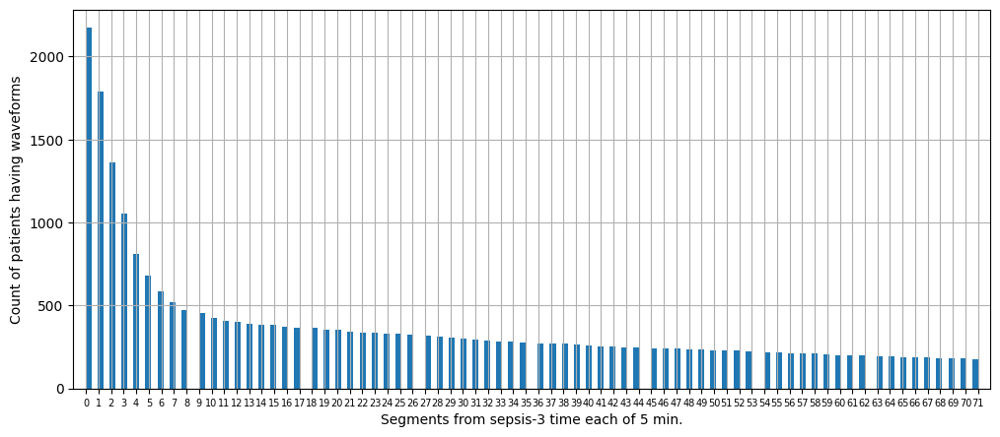

In [4]:
df_Sepsis_latest.segmentID.hist(bins=150, figsize=(12,5))
plt.xlabel('Segments from sepsis-3 time each of 5 min.')
plt.ylabel('Count of patients having waveforms')
plt.xlim([-1, 72])
plt.xticks(np.arange(72), size=7)
plt.show()

# Step 3: Map with target variables (Short term mortality, VPFD, VFD, ICU LOS)

In [5]:
df_Sepsis_latest.fin.nunique(), df_Sepsis_latest.studyID.nunique(), df_Sepsis_latest.shape

(2185, 2100, (26749, 1171))

In [6]:
df_Sepsis_latest['t_sepsis'] = pd.to_datetime(df_Sepsis_latest.t_sepsis)

In [7]:
# ==== Short term Septic shock Status ==== 

df_SShock = pd.read_csv('Data_folder/Event_Table/septicShock_encounters_final_Pitt.csv')
df_SShock['studyID'] = df_SShock.StudyID.astype('str')
df_SShock['fin'] = df_SShock.FIN.astype('int')
df_SShock.drop_duplicates(inplace=True)
df_SShock.reset_index(inplace=True, drop=True)

df_SShock['earliest_VP_On'] = pd.to_datetime(df_SShock['earliest_VP_On'])
df_SShock['earliest_lacticAcid>2'] = pd.to_datetime(df_SShock['earliest_lacticAcid>2'])
# Create SS_time as the maximum of the two
df_SShock['SS_time'] = df_SShock[['earliest_VP_On', 'earliest_lacticAcid>2']].max(axis=1)
df_SShock = df_SShock[['studyID','fin','SS_time']]
df_SShock['SS'] = True
df_SShock.shape

(33283, 4)

In [ ]:
### For SS Analysis Table

df_Sepsis_latest_SS = df_Sepsis_latest.merge(df_SShock, on=['fin'], how='left')
df_Sepsis_latest_SS['SS_time'] = pd.to_datetime(df_Sepsis_latest_SS.SS_time)
df_Sepsis_latest_SS[df_Sepsis_latest_SS.SS.isnull()] = False
print(df_Sepsis_latest_SS.SS.unique(), df_Sepsis_latest_SS.SS.isnull().sum(), df_Sepsis_latest_SS.shape)

### s_SS_Xd_final: Descriptive short-term SS table patient encounter wise.

s_SS = df_Sepsis_latest_SS[['fin','t_sepsis','SS_time','SS']].drop_duplicates()
s_SS.reset_index(drop=True, inplace=True)

def SS_X_days(df, Xdays=28):
    df['SS_time'] = pd.to_datetime(df['SS_time'], errors='coerce')
    df['t_sepsis'] = pd.to_datetime(df['t_sepsis'], errors='coerce')
    delT_sep_SS = (df['SS_time']-df['t_sepsis']).dt.days #SS day would be 100% after the sepsis3 time
    delT_sep_SS[delT_sep_SS>Xdays] = np.nan
    delT_sep_SS[df['SS']==False] = np.nan
    df['delT_sep_SS'] = delT_sep_SS
    s_SS_Xd = df[~df['delT_sep_SS'].isnull()]
    s_SS_Xd['day_postS3'] = s_SS_Xd['delT_sep_SS'].astype(int)
    s_SS_Xd[f'SS_{Xdays}'] = s_SS_Xd['SS'].astype(int)
    s_SS_Xd_final = s_SS_Xd[['fin','day_postS3',f'SS_{Xdays}']]
    s_SS_Xd_final.reset_index(drop=True, inplace=True)
    print(s_SS_Xd_final.head(), s_SS_Xd_final.shape, s_SS_Xd_final.fin.nunique())
    return s_SS_Xd_final

df = s_SS.copy()
s_SS_28d_final = SS_X_days(df, Xdays=28)
s_SS_7d_final = SS_X_days(df, Xdays=7)
s_SS_2d_final = SS_X_days(df, Xdays=2)
s_SS_1d_final = SS_X_days(df, Xdays=1)


s_SS_28_7d = s_SS_28d_final.merge(s_SS_7d_final, how='left', on=['fin','day_postS3'])
s_SS_28_7_2d = s_SS_28_7d.merge(s_SS_2d_final, how='left', on=['fin','day_postS3'])
s_SS_28_7_2d_1d = s_SS_28_7_2d.merge(s_SS_1d_final, how='left', on=['fin','day_postS3'])
s_SS_28_7_2d_1d.loc[:,'SS_7'][s_SS_28_7_2d_1d['SS_7'].isnull()] = 0
s_SS_28_7_2d_1d.loc[:,'SS_2'][s_SS_28_7_2d_1d['SS_2'].isnull()] = 0
s_SS_28_7_2d_1d.loc[:,'SS_1'][s_SS_28_7_2d_1d['SS_1'].isnull()] = 0
s_SS_28_7_2d_1d['SS_7'] = s_SS_28_7_2d_1d['SS_7'].astype(int)
s_SS_28_7_2d_1d['SS_2'] = s_SS_28_7_2d_1d['SS_2'].astype(int)
s_SS_28_7_2d_1d['SS_1'] = s_SS_28_7_2d_1d['SS_1'].astype(int)
s_SS_28_7_2d_1d = s_SS_28_7_2d_1d.drop_duplicates()
s_SS_28_7_2d_1d.reset_index(inplace=True, drop=True)
s_SS_28_7_2d_1d


In [9]:
# ==== Short term mortality =====


demo = pd.read_csv('Data_folder/Event_Table/tcdemographics_mladi24_new.csv')
demo['studyID'] = demo.study_id.astype('str')
demo['fin'] = demo.FIN_study_id.astype('int')
demo.drop_duplicates(inplace=True)
demo.reset_index(inplace=True, drop=True)
death = demo.disch_disp.str.contains('CTB')
demo['death'] = death.values
demo.loc[:,'death'][demo.death.isnull()] = False

# # For Creating Demographics Table One 
# s_demographic = demo[demo.fin.isin(df_Sepsis_latest.fin)].drop_duplicates(subset='studyID',keep='first')
# s_demographic.reset_index(inplace=True, drop=True)
# s_demographic.columns, s_demographic.shape


In [ ]:
### For Mortality Analysis Table

df_Sepsis_latest_demo = df_Sepsis_latest.merge(demo, on=['fin'], how='left') #Just to carry demographic data as well
df_Sepsis_latest_demo['disch_date'] = pd.to_datetime(df_Sepsis_latest_demo.disch_date)
df_Sepsis_latest_demo.loc[:,'death'][df_Sepsis_latest_demo.death.isnull()] = False
print(df_Sepsis_latest_demo.death.unique(), df_Sepsis_latest_demo.death.isnull().sum(), df_Sepsis_latest_demo.shape)

### s_death_Xd_final: Descriptive short-term mortality/death table patient encounter wise.

s_death = df_Sepsis_latest_demo[['fin','t_sepsis','disch_date','death']].drop_duplicates()
s_death.reset_index(drop=True, inplace=True)

def STM_X_days(df, Xdays=28):
    delT_sep_death = (df['disch_date']-df['t_sepsis']).dt.days #Death day would be 100% after the sepsis3 time
    delT_sep_death[delT_sep_death>Xdays] = np.nan
    delT_sep_death[df['death']==False] = np.nan
    df['delT_sep_death'] = delT_sep_death
    s_death_Xd = df[~df['delT_sep_death'].isnull()]
    s_death_Xd['day_postS3'] = s_death_Xd['delT_sep_death'].astype(int)
    s_death_Xd[f'death_{Xdays}'] = s_death_Xd['death'].astype(int)
    s_death_Xd_final = s_death_Xd[['fin','day_postS3',f'death_{Xdays}']]
    s_death_Xd_final.reset_index(drop=True, inplace=True)
    print(s_death_Xd_final.head(), s_death_Xd_final.shape, s_death_Xd_final.fin.nunique())
    return s_death_Xd_final

df = s_death.copy()
s_death_28d_final = STM_X_days(df, Xdays=28)
s_death_7d_final = STM_X_days(df, Xdays=7)
s_death_2d_final = STM_X_days(df, Xdays=2)
s_death_1d_final = STM_X_days(df, Xdays=1)

s_death_28_7d = s_death_28d_final.merge(s_death_7d_final, how='left', on=['fin','day_postS3'])
s_death_28_7_2d = s_death_28_7d.merge(s_death_2d_final, how='left', on=['fin','day_postS3'])
s_death_28_7_2d_1d = s_death_28_7_2d.merge(s_death_1d_final, how='left', on=['fin','day_postS3'])
s_death_28_7_2d_1d.loc[:,'death_7'][s_death_28_7_2d_1d['death_7'].isnull()] = 0
s_death_28_7_2d_1d.loc[:,'death_2'][s_death_28_7_2d_1d['death_2'].isnull()] = 0
s_death_28_7_2d_1d.loc[:,'death_1'][s_death_28_7_2d_1d['death_1'].isnull()] = 0
s_death_28_7_2d_1d['death_7'] = s_death_28_7_2d_1d['death_7'].astype(int)
s_death_28_7_2d_1d['death_2'] = s_death_28_7_2d_1d['death_2'].astype(int)
s_death_28_7_2d_1d['death_1'] = s_death_28_7_2d_1d['death_1'].astype(int)
s_death_28_7_2d_1d = s_death_28_7_2d_1d.drop_duplicates()
s_death_28_7_2d_1d.reset_index(inplace=True, drop=True)
s_death_28_7_2d_1d

In [ ]:

# ==== Vasopressor-free days (VPFD) ====

# The number of days a patient survives and remains without requiring the use of vasopressor medications.
# Procedure: VPFD are typically counted as the number of consecutive days a patient is alive and does not require vasopressor therapy.
# VPFD = 0, if patient died within 28 days window.
df_VP = pd.read_csv('Data_folder/Event_Table/sepsis_all_VP_Before28D.csv')
df_VP.drop(df_VP.columns[df_VP.columns.str.contains('unnamed', case=False)], axis=1, inplace=True)
df_VP['studyID'] = df_VP['studyID'].astype('str')
df_VP['fin'] = df_VP['fin'].astype('int')
df_VP['T_vp_postS3'] = pd.to_datetime(df_VP['T_vp_postS3'])
df_VP['t_sepsis'] = pd.to_datetime(df_VP['t_sepsis'])
print(df_VP.columns, df_VP.shape)


### For VPFD Analysis Table on patient encounter level
df_s = df_Sepsis_latest_demo[['fin','t_sepsis','segmentID']].drop_duplicates()
s_vp = df_s.merge(df_VP, on=['fin','t_sepsis'], how='left') #,'studyID','t_sepsis'
s_vp_seg0 = s_vp[s_vp['segmentID']==0]
s_vp_seg0.reset_index(inplace=True, drop=True)
print(s_vp_seg0.shape, s_vp_seg0.fin.nunique(), s_vp_seg0.studyID.nunique())


### s_vpfd_Xd_final: Descriptive VPFD table
def VPFD_X_days(df, Xdays=28):
    s_vpfd = df[['fin','t_sepsis','T_vp_postS3']].drop_duplicates()
    s_vpfd.reset_index(drop=True, inplace=True)
    s_vpfd['delT_sep_vp'] = (s_vpfd['T_vp_postS3']-s_vpfd['t_sepsis']).dt.days #T_vp_postS3 day may be before or after the sepsis3 time
    s_vpfd_Xd = s_vpfd[(s_vpfd['delT_sep_vp']>=0) & (s_vpfd['delT_sep_vp']<=Xdays)] #tracking 0 to Xdays days after S3
    # No need to check if expired before X days. If expired, VP would have not been given.
    s_vpfd_Xd['day_postS3'] = s_vpfd_Xd['delT_sep_vp'].astype(int)
    s_vpfd_Xd[f'vp_{Xdays}'] = 1
    s_vpfd_Xd_final = s_vpfd_Xd[['fin','day_postS3',f'vp_{Xdays}']]
    s_vpfd_Xd_final.reset_index(drop=True, inplace=True)
    print(s_vpfd_Xd_final.head(), s_vpfd_Xd_final.shape, s_vpfd_Xd_final.fin.nunique())
    return s_vpfd_Xd_final

df = s_vp_seg0.copy()
s_vpfd_28d_final = VPFD_X_days(df, Xdays=28)
s_vpfd_7d_final = VPFD_X_days(df, Xdays=7)
s_vpfd_2d_final = VPFD_X_days(df, Xdays=2)
# s_vpfd_1d_final = VPFD_X_days(df, Xdays=1)

s_vpfd_28_7d = s_vpfd_28d_final.merge(s_vpfd_7d_final, how='left', on=['fin','day_postS3'])
s_vpfd_28_7_2d = s_vpfd_28_7d.merge(s_vpfd_2d_final, how='left', on=['fin','day_postS3'])

# s_vpfd_28_7_2_1d = s_vpfd_28_7_2d.merge(s_vpfd_1d_final, how='left', on=['fin','day_postS3'])
# s_vpfd_28_7_2_1d.loc[:,'vp_7'][s_vpfd_28_7_2_1d['vp_7'].isnull()] = 0
# s_vpfd_28_7_2_1d.loc[:,'vp_2'][s_vpfd_28_7_2_1d['vp_2'].isnull()] = 0
# s_vpfd_28_7_2_1d.loc[:,'vp_1'][s_vpfd_28_7_2_1d['vp_1'].isnull()] = 0
# s_vpfd_28_7_2_1d['vp_7'] = s_vpfd_28_7_2_1d['vp_7'].astype(int)
# s_vpfd_28_7_2_1d['vp_2'] = s_vpfd_28_7_2_1d['vp_2'].astype(int)
# s_vpfd_28_7_2_1d['vp_1'] = s_vpfd_28_7_2_1d['vp_1'].astype(int)
# s_vpfd_28_7_2_1d = s_vpfd_28_7_2_1d.drop_duplicates()
# s_vpfd_28_7_2_1d.reset_index(inplace=True, drop=True)
# s_vpfd_28_7_2_1d

s_vpfd_28_7_2d.loc[:,'vp_7'][s_vpfd_28_7_2d['vp_7'].isnull()] = 0
s_vpfd_28_7_2d.loc[:,'vp_2'][s_vpfd_28_7_2d['vp_2'].isnull()] = 0
s_vpfd_28_7_2d['vp_7'] = s_vpfd_28_7_2d['vp_7'].astype(int)
s_vpfd_28_7_2d['vp_2'] = s_vpfd_28_7_2d['vp_2'].astype(int)
s_vpfd_28_7_2d = s_vpfd_28_7_2d.drop_duplicates()
s_vpfd_28_7_2d.reset_index(inplace=True, drop=True)
s_vpfd_28_7_2d

In [12]:
f_imv = pd.read_csv('../pitts_emr_data/vitals_IMVvent.csv')
f_imv.columns

Index(['study_id', 'FIN_study_id', 'chartdate', 'UTCOffset', 'event_name',
       'result_val', 'result_unit', 'vent_status'],
      dtype='object')

In [ ]:

# ==== Vent-free days (VFD) ====
# The number of days a patient survives and remains without requiring the use of IMV.

df_imv = pd.read_csv('../pitts_emr_data/vitals_IMVvent.csv')
df_imv.drop(df_imv.columns[df_imv.columns.str.contains('unnamed', case=False)], axis=1, inplace=True)
df_imv['studyID'] = df_imv.study_id.astype('str')
df_imv['fin'] = df_imv.FIN_study_id.astype('int')
df_imv['T_imv_postS3'] = pd.to_datetime(df_imv.chartdate)
print(df_imv.shape, df_imv.columns)

### For VFD Analysis Table on patient encounter level
df_imv = df_imv[['studyID','fin','T_imv_postS3']]
s_imv = df_Sepsis_latest_demo.merge(df_imv, on=['fin'], how='left')
s_imv_seg0 = s_imv[s_imv['segmentID']==0]
s_imv_seg0.reset_index(inplace=True, drop=True)
print(s_imv_seg0.shape, s_imv_seg0.fin.nunique(), s_imv_seg0.studyID.nunique())

### s_vfd_28d_final: Descriptive VFD table
def VFD_X_days(df, Xdays=28):
    s_vfd = df[['fin','t_sepsis','T_imv_postS3']].drop_duplicates()
    s_vfd.reset_index(drop=True, inplace=True)
    s_vfd['delT_sep_imv'] = (s_vfd['T_imv_postS3']-s_vfd['t_sepsis']).dt.days #T_imv_postS3 day may be before or after the sepsis3 time
    s_vfd_Xd = s_vfd[(s_vfd['delT_sep_imv']>=0) & (s_vfd['delT_sep_imv']<=Xdays)] #tracking 0 to X days after S3
    # No need to check if expired before X days. If expired, they would have not been ventilated.
    s_vfd_Xd['day_postS3'] = s_vfd_Xd['delT_sep_imv'].astype(int)
    s_vfd_Xd[f'vent_{Xdays}'] = 1
    s_vfd_Xd_final = s_vfd_Xd[['fin','day_postS3',f'vent_{Xdays}']]
    s_vfd_Xd_final.reset_index(drop=True, inplace=True)
    print(s_vfd_Xd_final.head(), s_vfd_Xd_final.shape)
    return s_vfd_Xd_final

df = s_imv_seg0.copy()
s_vfd_28d_final = VFD_X_days(df, Xdays=28)
s_vfd_7d_final = VFD_X_days(df, Xdays=7)
s_vfd_2d_final = VFD_X_days(df, Xdays=2) 
s_vfd_1d_final = VFD_X_days(df, Xdays=1)

s_vfd_28_7d = s_vfd_28d_final.merge(s_vfd_7d_final, how='left', on=['fin','day_postS3'])
s_vfd_28_7_2d = s_vfd_28_7d.merge(s_vfd_2d_final, how='left', on=['fin','day_postS3'])

s_vfd_28_7_2_1d = s_vfd_28_7_2d.merge(s_vfd_1d_final, how='left', on=['fin','day_postS3'])
s_vfd_28_7_2_1d.loc[:,'vent_7'][s_vfd_28_7_2_1d['vent_7'].isnull()] = 0
s_vfd_28_7_2_1d.loc[:,'vent_2'][s_vfd_28_7_2_1d['vent_2'].isnull()] = 0
s_vfd_28_7_2_1d.loc[:,'vent_1'][s_vfd_28_7_2_1d['vent_1'].isnull()] = 0
s_vfd_28_7_2_1d['vent_7'] = s_vfd_28_7_2_1d['vent_7'].astype(int)
s_vfd_28_7_2_1d['vent_2'] = s_vfd_28_7_2_1d['vent_2'].astype(int)
s_vfd_28_7_2_1d['vent_1'] = s_vfd_28_7_2_1d['vent_1'].astype(int)
s_vfd_28_7_2_1d = s_vfd_28_7_2_1d.drop_duplicates()
s_vfd_28_7_2_1d.reset_index(inplace=True, drop=True)
s_vfd_28_7_2_1d

# s_vfd_28_7_2d.loc[:,'vent_7'][s_vfd_28_7_2d['vent_7'].isnull()] = 0
# s_vfd_28_7_2d.loc[:,'vent_2'][s_vfd_28_7_2d['vent_2'].isnull()] = 0
# s_vfd_28_7_2d['vent_7'] = s_vfd_28_7_2d['vent_7'].astype(int)
# s_vfd_28_7_2d['vent_2'] = s_vfd_28_7_2d['vent_2'].astype(int)
# s_vfd_28_7_2d = s_vfd_28_7_2d.drop_duplicates()
# s_vfd_28_7_2d.reset_index(inplace=True, drop=True)
# s_vfd_28_7_2d

In [14]:
s_vfd_28_7d.shape

(74108, 4)

In [ ]:
# === Bolus free days =====
df_bolus = pd.read_csv('Data_folder/Event_Table/sepsis_all_bolus_Before28D.csv')
df_bolus.drop(df_bolus.columns[df_bolus.columns.str.contains('unnamed', case=False)], axis=1, inplace=True)
df_bolus['studyID'] = df_bolus.studyID.astype('str')
df_bolus['fin'] = df_bolus.fin.astype('int')
df_bolus['T_bolus_postS3'] = pd.to_datetime(df_bolus['T_bolus_postS3'])
df_bolus['t_sepsis'] = pd.to_datetime(df_bolus['t_sepsis'])
print(df_bolus.columns, df_bolus.shape)


### For BFD Analysis Table on patient encounter level

s_b = df_Sepsis_latest_demo.merge(df_bolus, on=['fin','t_sepsis'], how='left') #'studyID','t_sepsis'
s_b_seg0 = s_b[s_b['segmentID']==0]
s_b_seg0.reset_index(inplace=True, drop=True)
print(s_b_seg0.shape, s_b_seg0.fin.nunique(), s_b_seg0.studyID.nunique())


### s_bfd_28d_final: Descriptive VPFD table
def BFD_X_days(df, Xdays=28):
    s_bfd = df[['fin','t_sepsis','T_bolus_postS3']].drop_duplicates()
    s_bfd.reset_index(drop=True, inplace=True)
    s_bfd['delT_sep_b'] = (s_bfd['T_bolus_postS3']-s_bfd['t_sepsis']).dt.days #T_bolus_postS3 day may be before or after the sepsis3 time
    s_bfd_Xd = s_bfd[(s_bfd['delT_sep_b']>=0) & (s_bfd['delT_sep_b']<=Xdays)] #tracking 0 to X days after S3
    # No need to check if expired before X days. If expired, VP would have not been given.
    s_bfd_Xd['day_postS3'] = s_bfd_Xd['delT_sep_b'].astype(int)
    s_bfd_Xd[f'bolus_{Xdays}'] = 1
    s_bfd_Xd_final = s_bfd_Xd[['fin','day_postS3',f'bolus_{Xdays}']]
    s_bfd_Xd_final.reset_index(drop=True, inplace=True)
    print(s_bfd_Xd_final.head(), s_bfd_Xd_final.shape, s_bfd_Xd_final.fin.nunique())
    return s_bfd_Xd_final

df = s_b_seg0.copy()
s_bfd_28d_final = BFD_X_days(df, Xdays=28)
s_bfd_7d_final = BFD_X_days(df, Xdays=7)
s_bfd_2d_final = BFD_X_days(df, Xdays=2)  

s_bfd_28_7d = s_bfd_28d_final.merge(s_bfd_7d_final, how='left', on=['fin','day_postS3'])
s_bfd_28_7_2d = s_bfd_28_7d.merge(s_bfd_2d_final, how='left', on=['fin','day_postS3'])
s_bfd_28_7_2d.loc[:,'bolus_7'][s_bfd_28_7_2d['bolus_7'].isnull()] = 0
s_bfd_28_7_2d.loc[:,'bolus_2'][s_bfd_28_7_2d['bolus_2'].isnull()] = 0
s_bfd_28_7_2d['bolus_7'] = s_bfd_28_7_2d['bolus_7'].astype(int)
s_bfd_28_7_2d['bolus_2'] = s_bfd_28_7_2d['bolus_2'].astype(int)
s_bfd_28_7_2d = s_bfd_28_7_2d.drop_duplicates()
s_bfd_28_7_2d.reset_index(inplace=True, drop=True)
s_bfd_28_7_2d



In [16]:
# ==== Vent status ====








In [17]:
# ==== ICU length of stay (LOS) ====








In [18]:
s_death_28d_final.columns, s_vpfd_28d_final.columns, s_vfd_28d_final.columns, s_bfd_28d_final.columns

(Index(['fin', 'day_postS3', 'death_28'], dtype='object'),
 Index(['fin', 'day_postS3', 'vp_28'], dtype='object'),
 Index(['fin', 'day_postS3', 'vent_28'], dtype='object'),
 Index(['fin', 'day_postS3', 'bolus_28'], dtype='object'))

In [21]:
s_SS_28_7_2d_1d.shape, s_death_28_7_2d_1d.shape, s_vpfd_28_7_2d.shape, s_vfd_28_7_2_1d.shape, s_bfd_28_7_2d.shape

((1269, 6), (451, 6), (5195, 5), (8014, 6), (1763, 5))

In [22]:
value_counts_per_column = {colms: s_death_28_7_2d_1d[colms].value_counts() for colms in s_death_28_7_2d_1d.columns[2:]}
value_counts_per_column

{'death_28': death_28
 1    451
 Name: count, dtype: int64,
 'death_7': death_7
 0    249
 1    202
 Name: count, dtype: int64,
 'death_2': death_2
 0    376
 1     75
 Name: count, dtype: int64,
 'death_1': death_1
 0    404
 1     47
 Name: count, dtype: int64}

In [ ]:
df_death_vp = s_death_28_7_2d_1d.merge(s_vpfd_28_7_2d, on=['fin','day_postS3'], how='outer')
df_death_vp_vent = df_death_vp.merge(s_vfd_28_7_2_1d, on=['fin','day_postS3'], how='outer')
df_death_vp_vent_bfd = df_death_vp_vent.merge(s_bfd_28_7_2d, on=['fin','day_postS3'], how='outer')
df_death_vp_vent_bfd_SS = df_death_vp_vent_bfd.merge(s_SS_28_7_2d_1d, on=['fin','day_postS3'], how='outer')
df_death_vp_vent_bfd_SS_final = df_death_vp_vent_bfd_SS.sort_values(by=['fin','day_postS3'])
df_death_vp_vent_bfd_SS_final.reset_index(inplace=True, drop=True)
df_death_vp_vent_bfd_SS_final

In [24]:
df_death_vp_vent_bfd_SS_final.fin.nunique(), df_death_vp_vent_bfd_SS_final.fin.unique()[:20]

(1669,
 array([1000018, 1000031, 1000056, 1000060, 1000063, 1000153, 1000195,
        1000230, 1000256, 1000258, 1000284, 1000285, 1000290, 1000292,
        1000312, 1000334, 1000369, 1000387, 1000399, 1000451], dtype=object))

In [25]:
df_death_vp_vent_bfd_SS_final[df_death_vp_vent_bfd_SS_final.fin==1000256]

,fin,day_postS3,death_28,death_7,death_2,death_1,vp_28,vp_7,vp_2,vent_28,vent_7,vent_2,vent_1,bolus_28,bolus_7,bolus_2,SS_28,SS_7,SS_2,SS_1
59,1000256,0,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0
60,1000256,1,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0
61,1000256,2,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0
62,1000256,3,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,1000256,4,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
64,1000256,5,1.0,1.0,0.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,1.0,1.0,0.0,0.0


In [26]:
df_death_vp_vent_bfd_SS_final[df_death_vp_vent_bfd_SS_final.isnull()] = 0

In [27]:
for i in df_death_vp_vent_bfd_SS_final.columns:
    if i!='fin':
        df_death_vp_vent_bfd_SS_final[i] = df_death_vp_vent_bfd_SS_final[i].astype(int)

In [ ]:
df_death_vp_vent_bfd_SS_final

In [ ]:

''' ### ==== FINAL TARGET TABLE CREATION ==== '''

# # Example Data: Data for 3 patients over 5 days, including death info
# data = {
#     'fin': [1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3],
#     'day': [1, 2, 3, 4, 5, 1, 2, 3, 4, 5, 1, 2, 3, 4, 5],
#     'vasopressor': [1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],  # 1 indicates vasopressor usage, 0 indicates no usage
#     'ventilator': [1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1],   # 1 indicates ventilator usage, 0 indicates no usage
#     'bolus': [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1],
#     'death': [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]         # 1 indicates death, 0 indicates no death
# }
# df = pd.DataFrame(data)

df = df_death_vp_vent_bfd_SS_final.copy()

'''
# death = 1, if died within 28 day window

# vpfd = 28 - x, x: days on receiving VP
# vpfd = 0, if patient died within 28 day window

# bfd = 28 - x, x: days on receiving boluses
# bfd = 0, if patient died within 28 day window

# vfd = 28 - x, x: days on receiving vent
# vfd = 0, if patient died within 28 day window
# vfd = 0, if patient is not librated (final extubated) from vent (ignored this as extubation info is not found)
'''

def vasopressor_free_days(patient_data, max_days=28):
    death_column = f'death_{max_days}'
    vp_column = f'vp_{max_days}'
    if patient_data[death_column].max() == 1:
        return 0
    else:
        days_on_vp = patient_data[vp_column].sum()
        return max(0, max_days - days_on_vp)

def ventilator_free_days(patient_data, max_days=28):
    death_column = f'death_{max_days}'
    vent_column = f'vent_{max_days}'
    if patient_data[death_column].max() == 1:
        return 0
    else:
        vent_yes = (patient_data[vent_column] == 1).sum()
        return max(0, max_days - vent_yes)

def bolus_free_days(patient_data, max_days=28):
    death_column = f'death_{max_days}'
    bolus_column = f'bolus_{max_days}'
    if patient_data[death_column].max() == 1:
        return 0
    else:
        bolus_yes = (patient_data[bolus_column] == 1).sum()
        return max(0, max_days - bolus_yes)

# Check if a patient has died (at least once)
def death_status(patient_data, max_days=28):
    death_column = f'death_{max_days}'
    return patient_data[death_column].max()  # 1 if the patient has died, 0 if not

# Check if a patient has died (at least once)
def SShock_status(patient_data, max_days=28):
    SS_column = f'SS_{max_days}'
    return patient_data[SS_column].max()  # 1 if the patient has died, 0 if not

# Check if a patient has died (at least once)
def vaso_need_status(patient_data, max_days=28):
    vp_column = f'vp_{max_days}'
    return patient_data[vp_column].max()  # 1 if the patient has died, 0 if not

# Check if a patient has died (at least once)
def vent_need_status(patient_data, max_days=28):
    vent_column = f'vent_{max_days}'
    return patient_data[vent_column].max()  # 1 if the patient has died, 0 if not

# Group by patient_id and apply the functions
vpfd_28 = df.groupby('fin').apply(lambda x: vasopressor_free_days(x, max_days=28)).reset_index(name='vp_free_days')
vpfd_7 = df.groupby('fin').apply(lambda x: vasopressor_free_days(x, max_days=7)).reset_index(name='vp_free_days')
vpfd_2 = df.groupby('fin').apply(lambda x: vasopressor_free_days(x, max_days=2)).reset_index(name='vp_free_days')

vfd_28 = df.groupby('fin').apply(lambda x: ventilator_free_days(x, max_days=28)).reset_index(name='vent_free_days')
vfd_7 = df.groupby('fin').apply(lambda x: ventilator_free_days(x, max_days=7)).reset_index(name='vent_free_days')
vfd_2 = df.groupby('fin').apply(lambda x: ventilator_free_days(x, max_days=2)).reset_index(name='vent_free_days')

d_28 = df.groupby('fin').apply(lambda x: death_status(x, max_days=28)).reset_index(name='d_status')
d_7 = df.groupby('fin').apply(lambda x: death_status(x, max_days=7)).reset_index(name='d_status')
d_2 = df.groupby('fin').apply(lambda x: death_status(x, max_days=2)).reset_index(name='d_status')
d_1 = df.groupby('fin').apply(lambda x: death_status(x, max_days=1)).reset_index(name='d_status')

bfd_28 = df.groupby('fin').apply(lambda x: bolus_free_days(x, max_days=28)).reset_index(name='b_free_days')
bfd_7 = df.groupby('fin').apply(lambda x: bolus_free_days(x, max_days=7)).reset_index(name='b_free_days')
bfd_2 = df.groupby('fin').apply(lambda x: bolus_free_days(x, max_days=2)).reset_index(name='b_free_days')

ss_28 = df.groupby('fin').apply(lambda x: SShock_status(x, max_days=28)).reset_index(name='ss_status')
ss_7 = df.groupby('fin').apply(lambda x: SShock_status(x, max_days=7)).reset_index(name='ss_status')
ss_2 = df.groupby('fin').apply(lambda x: SShock_status(x, max_days=2)).reset_index(name='ss_status')
ss_1 = df.groupby('fin').apply(lambda x: SShock_status(x, max_days=1)).reset_index(name='ss_status')

vp_28 = df.groupby('fin').apply(lambda x: vaso_need_status(x, max_days=28)).reset_index(name='vp_need_status')
vp_7 = df.groupby('fin').apply(lambda x: vaso_need_status(x, max_days=7)).reset_index(name='vp_need_status')
vp_2 = df.groupby('fin').apply(lambda x: vaso_need_status(x, max_days=2)).reset_index(name='vp_need_status')
# vp_1 = df.groupby('fin').apply(lambda x: vaso_need_status(x, max_days=1)).reset_index(name='vp_need_status')

v_28 = df.groupby('fin').apply(lambda x: vent_need_status(x, max_days=28)).reset_index(name='v_need_status')
v_7 = df.groupby('fin').apply(lambda x: vent_need_status(x, max_days=7)).reset_index(name='v_need_status')
v_2 = df.groupby('fin').apply(lambda x: vent_need_status(x, max_days=2)).reset_index(name='v_need_status')
v_1 = df.groupby('fin').apply(lambda x: vent_need_status(x, max_days=1)).reset_index(name='v_need_status')


# Combine both results into a new DataFrame
df_target = pd.DataFrame({
    'fin': vpfd_28.fin.values,
    'Death28': d_28.d_status.values, 'Death7': d_7.d_status.values, 'Death2': d_2.d_status.values,'Death1': d_1.d_status.values, 
    'vpfd28': vpfd_28.vp_free_days.values, 'vpfd7': vpfd_7.vp_free_days.values, 'vpfd2': vpfd_2.vp_free_days.values, 
    'vfd28': vfd_28.vent_free_days.values, 'vfd7': vfd_7.vent_free_days.values, 'vfd2': vfd_2.vent_free_days.values,
    'bfd28': bfd_28.b_free_days.values, 'bfd7': bfd_7.b_free_days.values, 'bfd2': bfd_2.b_free_days.values, 
    'ss28': ss_28.ss_status.values, 'ss7': ss_7.ss_status.values, 'ss2': ss_2.ss_status.values,'ss1': ss_1.ss_status.values, 
    'vp28': vp_28.vp_need_status.values, 'vp7': vp_7.vp_need_status.values, 'vp2': vp_2.vp_need_status.values, #'vp1': vp_1.vp_need_status.values,
    'v28': v_28.v_need_status.values, 'v7': v_7.v_need_status.values, 'v2': v_2.v_need_status.values, 'v1': v_1.v_need_status.values
})
df_target







In [30]:
df_target.fin.nunique()

1669

In [31]:
df_Sepsis_latest_wTarget = df_Sepsis_latest.merge(df_target, on='fin', how='left')

In [ ]:
df_Sepsis_latest_wTarget

In [33]:
df_Sepsis_latest_wTarget['v1'].isnull().sum()

7835

In [34]:
# Define the groups of columns
column_groups = {
    'Death': ['Death28', 'Death7', 'Death2', 'Death1'],
    'vpfd': ['vpfd28', 'vpfd7', 'vpfd2'],
    'vfd': ['vfd28', 'vfd7', 'vfd2'],
    'bfd': ['bfd28', 'bfd7', 'bfd2'],
    'ss': ['ss28', 'ss7', 'ss2', 'ss1'],
    'vp': ['vp28', 'vp7', 'vp2'],
    'v': ['v28', 'v7', 'v2', 'v1']
}

# Loop over each group and column
for group, columns in column_groups.items():
    for col in columns:
        df_Sepsis_latest_wTarget.loc[:, col] = df_Sepsis_latest_wTarget[col].fillna(0).astype(int)


In [35]:
df_Sepsis_latest_wTarget['v1'].isnull().sum()

0

In [31]:
# df_Sepsis_latest_wTarget.loc[:,'Death28'][df_Sepsis_latest_wTarget['Death28'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'Death7'][df_Sepsis_latest_wTarget['Death7'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'Death2'][df_Sepsis_latest_wTarget['Death2'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'Death1'][df_Sepsis_latest_wTarget['Death1'].isnull()] = 0
# df_Sepsis_latest_wTarget['Death28'] = df_Sepsis_latest_wTarget['Death28'].astype(int)
# df_Sepsis_latest_wTarget['Death7'] = df_Sepsis_latest_wTarget['Death7'].astype(int)
# df_Sepsis_latest_wTarget['Death2'] = df_Sepsis_latest_wTarget['Death2'].astype(int)
# df_Sepsis_latest_wTarget['Death1'] = df_Sepsis_latest_wTarget['Death1'].astype(int)

# df_Sepsis_latest_wTarget.loc[:,'vpfd28'][df_Sepsis_latest_wTarget['vpfd28'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'vpfd7'][df_Sepsis_latest_wTarget['vpfd7'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'vpfd2'][df_Sepsis_latest_wTarget['vpfd2'].isnull()] = 0
# df_Sepsis_latest_wTarget['vpfd28'] = df_Sepsis_latest_wTarget['vpfd28'].astype(int)
# df_Sepsis_latest_wTarget['vpfd7'] = df_Sepsis_latest_wTarget['vpfd7'].astype(int)
# df_Sepsis_latest_wTarget['vpfd2'] = df_Sepsis_latest_wTarget['vpfd2'].astype(int)

# df_Sepsis_latest_wTarget.loc[:,'vfd28'][df_Sepsis_latest_wTarget['vfd28'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'vfd7'][df_Sepsis_latest_wTarget['vfd7'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'vfd2'][df_Sepsis_latest_wTarget['vfd2'].isnull()] = 0
# df_Sepsis_latest_wTarget['vfd28'] = df_Sepsis_latest_wTarget['vfd28'].astype(int)
# df_Sepsis_latest_wTarget['vfd7'] = df_Sepsis_latest_wTarget['vfd7'].astype(int)
# df_Sepsis_latest_wTarget['vfd2'] = df_Sepsis_latest_wTarget['vfd2'].astype(int)

# df_Sepsis_latest_wTarget.loc[:,'bfd28'][df_Sepsis_latest_wTarget['bfd28'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'bfd7'][df_Sepsis_latest_wTarget['bfd7'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'bfd2'][df_Sepsis_latest_wTarget['bfd2'].isnull()] = 0
# df_Sepsis_latest_wTarget['bfd28'] = df_Sepsis_latest_wTarget['bfd28'].astype(int)
# df_Sepsis_latest_wTarget['bfd7'] = df_Sepsis_latest_wTarget['bfd7'].astype(int)
# df_Sepsis_latest_wTarget['bfd2'] = df_Sepsis_latest_wTarget['bfd2'].astype(int)

# df_Sepsis_latest_wTarget.loc[:,'ss28'][df_Sepsis_latest_wTarget['ss28'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'ss7'][df_Sepsis_latest_wTarget['ss7'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'ss2'][df_Sepsis_latest_wTarget['ss2'].isnull()] = 0
# df_Sepsis_latest_wTarget.loc[:,'ss1'][df_Sepsis_latest_wTarget['ss1'].isnull()] = 0
# df_Sepsis_latest_wTarget['ss28'] = df_Sepsis_latest_wTarget['ss28'].astype(int)
# df_Sepsis_latest_wTarget['ss7'] = df_Sepsis_latest_wTarget['ss7'].astype(int)
# df_Sepsis_latest_wTarget['ss2'] = df_Sepsis_latest_wTarget['ss2'].astype(int)
# df_Sepsis_latest_wTarget['ss1'] = df_Sepsis_latest_wTarget['ss1'].astype(int)

# # df_Sepsis_latest_wTarget.loc[:,'vp28'][df_Sepsis_latest_wTarget['ss28'].isnull()] = 0
# # df_Sepsis_latest_wTarget.loc[:,'vp7'][df_Sepsis_latest_wTarget['ss7'].isnull()] = 0
# # df_Sepsis_latest_wTarget.loc[:,'ss2'][df_Sepsis_latest_wTarget['ss2'].isnull()] = 0
# # df_Sepsis_latest_wTarget.loc[:,'ss1'][df_Sepsis_latest_wTarget['ss1'].isnull()] = 0
# # df_Sepsis_latest_wTarget['ss28'] = df_Sepsis_latest_wTarget['ss28'].astype(int)
# # df_Sepsis_latest_wTarget['ss7'] = df_Sepsis_latest_wTarget['ss7'].astype(int)
# # df_Sepsis_latest_wTarget['ss2'] = df_Sepsis_latest_wTarget['ss2'].astype(int)
# # df_Sepsis_latest_wTarget['ss1'] = df_Sepsis_latest_wTarget['ss1'].astype(int)

In [ ]:
df_Sepsis_latest_wTarget

In [38]:
df_Sepsis_latest_wTarget.columns[-24:]

Index(['Death28', 'Death7', 'Death2', 'Death1', 'vpfd28', 'vpfd7', 'vpfd2',
       'vfd28', 'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2', 'ss28', 'ss7', 'ss2',
       'ss1', 'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2', 'v1'],
      dtype='object')

# Saving df_Sepsis_latest with Target variables

In [2]:
# df_Sepsis_latest_wTarget.to_csv('Data_folder/df_step2_TS_pitts_s3_MEDIANimp_physiomarkers_2016-2022_wTargets_v8.csv')












df_Sepsis_latest_wTarget = pd.read_csv('Data_folder/df_step2_TS_pitts_s3_MEDIANimp_physiomarkers_2016-2022_wTargets_v8.csv')

In [3]:
mapping_df = pd.read_csv('mapping.csv')
mapping_df.head()

,fid,Feature
0,ECG_T_rr_ms_mean,T_rr_ms_mean
1,ECG_T_rr_ms_median,T_rr_ms_median
2,ECG_T_rr_ms_std,T_rr_ms_std
3,ECG_T_rr_ms_mad,T_rr_ms_mad
4,ECG_T_rr_ms_iqr,T_rr_ms_iqr


In [4]:
feature_to_fid = dict(zip(mapping_df['Feature'], mapping_df['fid']))

# Rename df_B's columns using this mapping
df_Sepsis_latest_wTarget = df_Sepsis_latest_wTarget.rename(columns=feature_to_fid)

In [ ]:
df_presepsis_5min = df_Sepsis_latest_wTarget[df_Sepsis_latest_wTarget.segmentID==0]
df_presepsis_5min.reset_index(inplace=True, drop=True)
df_presepsis_5min

# Step 4: Build a phenotype predictor model with 1st 5min segment data prior to sepsis-3 time

In [6]:
# droplist = ['SBP', 'DBP', 'HR_ABP', 'MAP', 'PP_ABP', 'CO', 'TPR', 'ShockIndex']

In [7]:
df_Sepsis_latest_wTarget.columns[-28:]

Index(['qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total', 'Death28',
       'Death7', 'Death2', 'Death1', 'vpfd28', 'vpfd7', 'vpfd2', 'vfd28',
       'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2', 'ss28', 'ss7', 'ss2', 'ss1',
       'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2', 'v1'],
      dtype='object')

In [8]:
df_Sepsis_latest_wTarget.loc[:,'ECG_T_rr_ms_mean':'qSOFA_total'].shape #.drop(droplist, axis=1)

(26749, 1159)

In [9]:
'PPG_pat_ms_mean' in df_Sepsis_latest_wTarget.columns

True

In [10]:
feature_cols = list(df_Sepsis_latest_wTarget.loc[:,'ECG_T_rr_ms_mean':'qSOFA_total'].columns)
# remove_list = ['pat_ms', 'dpat_ms']
# feature_cols = list(filter(lambda x: x not in remove_list, feature_cols))

# feature_cols = [f for f in feature_cols if 'valid_n' not in f]
feature_cols = [f for f in feature_cols if 'valid_n' not in f and 'MSE_' not in f] # and 'qSOFA' not in f]

len(feature_cols)











1076

In [11]:
# import missingno as msno
# msno.matrix(df_presepsis_5min)
# plt.show()

In [12]:
# !pip install umap-learn>=0.5.5


In [13]:
# pip install scipy==1.9.3

In [14]:
# pip install scikit-learn<=1.3

### features = ['mean', 'p25', 'p75', 'skewness', 'entropy']
This gives - center + spread + shape + uniformity — good coverage without major redundancy.

In [15]:
stats = ['_mad', '_iqr', '_median', '_min', '_max', '_std',
            '_kurtosis', '_slope', '_autocorr_lag1','_gini_index']

feature_cols = [f for f in feature_cols if not any(f.endswith(s) for s in stats)]

len(feature_cols)


429

In [16]:
feature_cols[:16]

['ECG_T_rr_ms_mean',
 'ECG_T_rr_ms_p25',
 'ECG_T_rr_ms_p75',
 'ECG_T_rr_ms_skewness',
 'ECG_T_rr_ms_entropy',
 'ECG_HR_bpm_mean',
 'ECG_HR_bpm_p25',
 'ECG_HR_bpm_p75',
 'ECG_HR_bpm_skewness',
 'ECG_HR_bpm_entropy',
 'ECG_edr_rate_Bpm_mean',
 'ECG_edr_rate_Bpm_p25',
 'ECG_edr_rate_Bpm_p75',
 'ECG_edr_rate_Bpm_skewness',
 'ECG_edr_rate_Bpm_entropy',
 'ECG_atrialSys_phase_mean']

# Clustering Process: 
 - **Feature Filtering:** VIF + Correlation Filter, 
 - **Feature Representation (or Embeddings):** No Transformation/PCA/Deep VAE/FT-Transformer Encoder,
 - **Consensus Clustering:** UMAP + Aglomerative Hierarchiel Consensus Clustering,
 - **Phenotype Interpretation:** LLM-powered SHAP importance-based and deviation-based characterization, 
 - **Phenotype Predictor Modeling:** XGB classifier

In [24]:
# import tc_tabular_consensus_clustering_pipeline_v4 as TCC
# '''Building phenotype predictor'''
# '''
# # dim_reduce_method: Dimensionality reduction method (default:None - no dim reduction): 'pca', 'umap', 'custom_embedding'
# # embedding_type: name of the method created embedding. (dafault: None): 'None', 'rbm'
# '''
# xgbmodel, metrics, cluster_labels, feature_list = TCC.clustering_and_prediction(df_presepsis_5min, 
#                                                                                 feature_cols, 
#                                                                                 standard_minmax='standard', var_thresh=0.04, corr_thresh=0.9, 
#                                                                                 verbose=1, 
#                                                                                 dim_reduce_method='umap', 
#                                                                                 embedding_type=None,
#                                                                                 k_opt=4
#                                                                                )

In [ ]:
# 1. Import all required modules
# from tc_tabular_consensus_clustering_pipeline_v4 import clustering_and_prediction
# from TCC import clustering_and_prediction
# from integrated_sepsis_pipeline import IntegratedSepsisAnalysisPipeline, run_full_sepsis_analysis_with_llm
from sepsis_analysis_utils import run_complete_sepsis_analysis_workflow, load_analysis_results

# 2. Set up your API key (OpenAI or Claude)
API_PROVIDER = 'openai'
API_KEY = 'sk-.......................' 
MODEL_NAME = 'gpt-4o'


🚀 Starting Complete Sepsis Analysis Workflow
🚀 Starting Integrated Sepsis Phenotyping Analysis

📊 Step 1: Performing Consensus Clustering...
run_complete_analysis - var_thresh: 0.01, corr_thresh: 0.85, dim_reduce_method: umap, embedding_type: None
UMAP Method


Computing consensus matrices: 100%|██████████| 8/8 [00:00<00:00, 24053.36it/s]


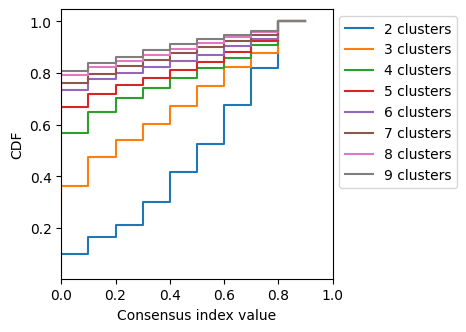

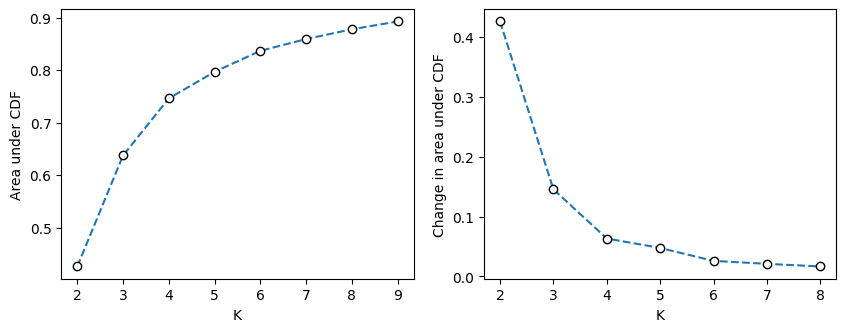

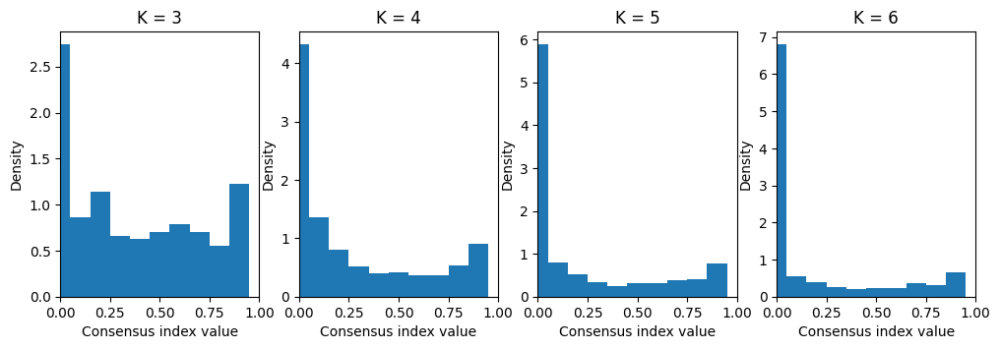

Best k from change in AUC: 2, and from AUC knee point: 4
Initial feature.shape: (2174, 429)
After VIF and dropping highly correlated features, feature.shape: (2174, 272)


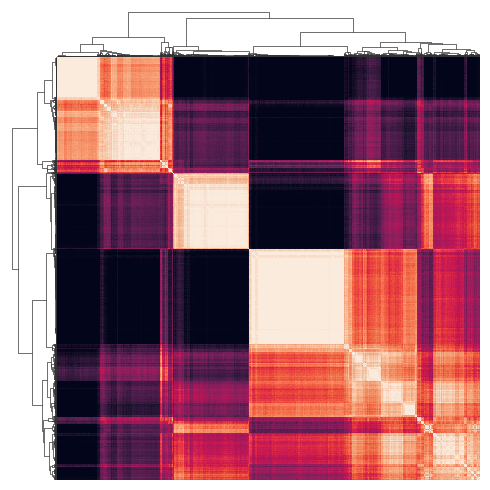

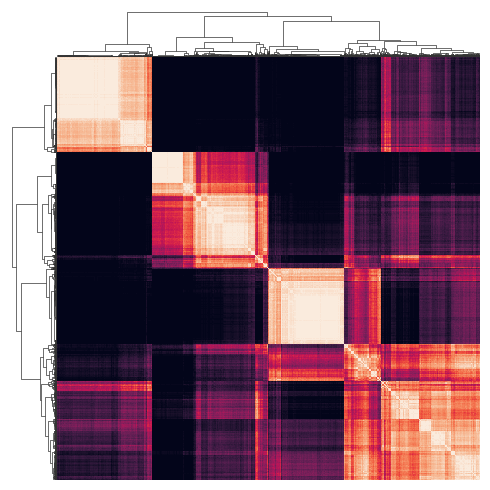

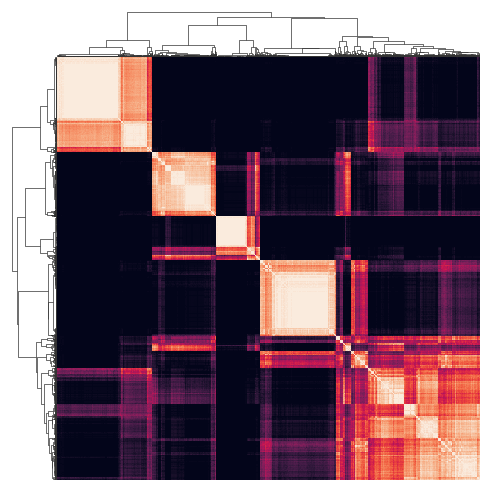

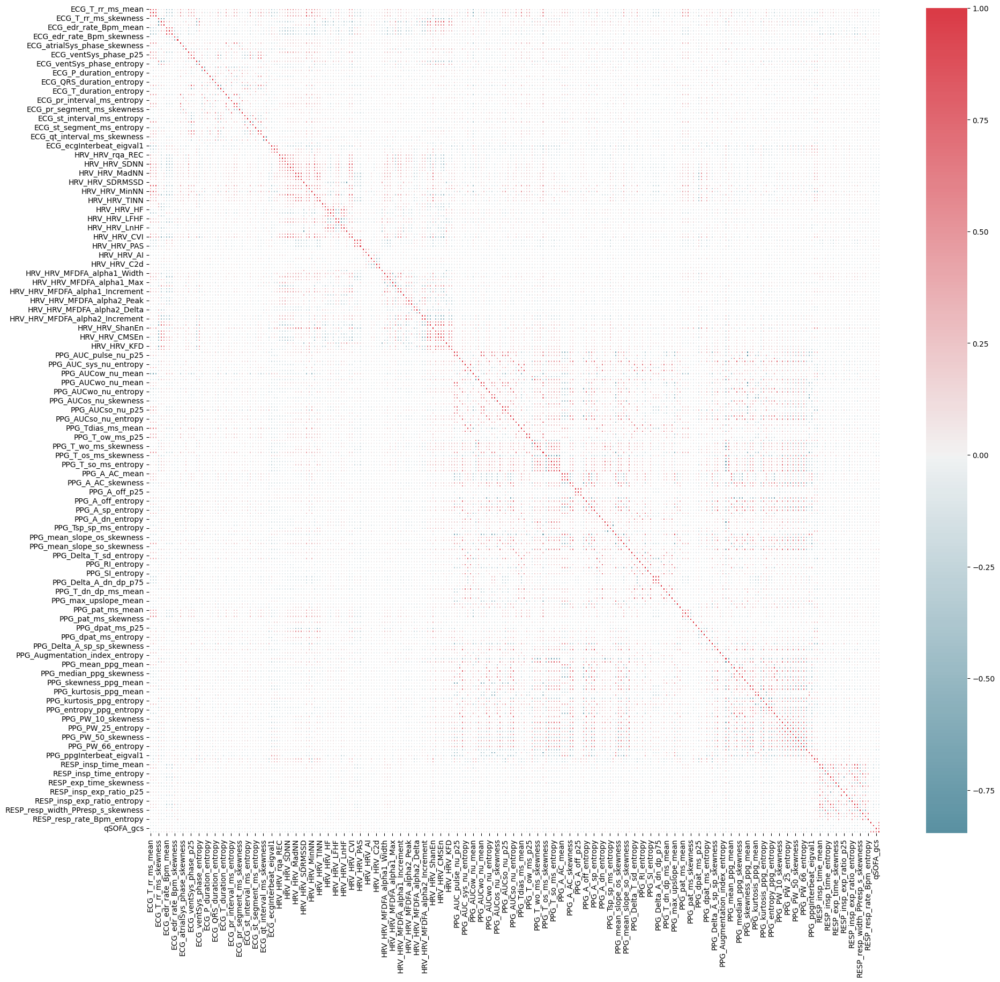

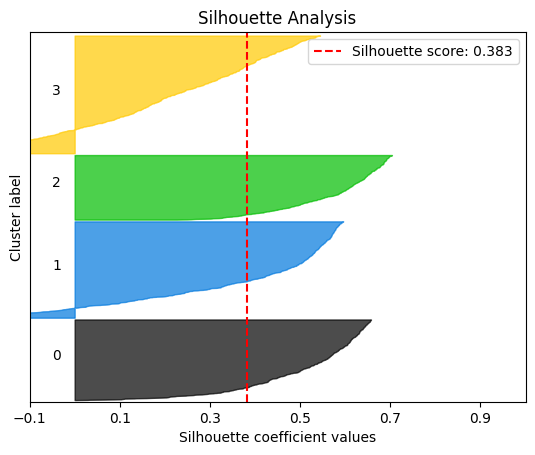

SS, DB, CH: 0.383, 0.876, 2111.101
3    712
1    583
0    488
2    391
Name: count, dtype: int64


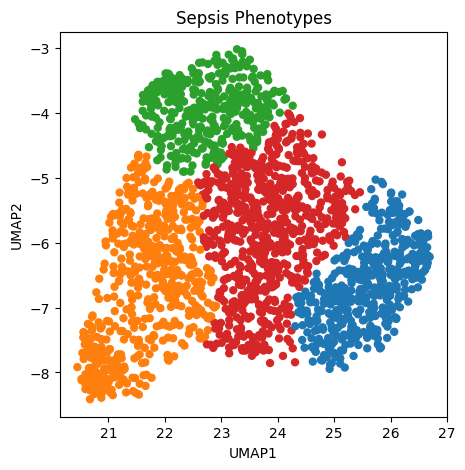

Shape of shap_values: (2174, 272, 4)
Shape of mean_abs_shap: (272,)
Length of sel_feature_list: 272
Number of features input to the model: 272
Train-test split: 1739 train, 435 test
Confusion matrix:
[[ 94   0   0   1]
 [  1 119   2  11]
 [  0   3  61   6]
 [  6  13  12 106]]
Overall accuracy: 0.874
Precision: [0.931 0.881 0.813 0.855]
Recall: [0.989 0.895 0.871 0.774]
F1-score: [0.959 0.888 0.841 0.812]
Accuracy per class: [0.989 0.895 0.871 0.774]
Predicted clusters on test set: Counter({3: 137, 1: 133, 0: 95, 2: 70})
selected feature list after filtering: 272

Top 5 features (overall):
             feature  importance
74         HRV_HRV_S    0.505963
59     HRV_HRV_pNN50    0.381070
109       HRV_HRV_CD    0.358313
51      HRV_HRV_SDNN    0.283468
106  HRV_HRV_FuzzyEn    0.242826

Top 5 features per class:
Class 0:
                  feature  importance
74              HRV_HRV_S    1.934226
109            HRV_HRV_CD    0.944828
51           HRV_HRV_SDNN    0.894553
75            HRV_

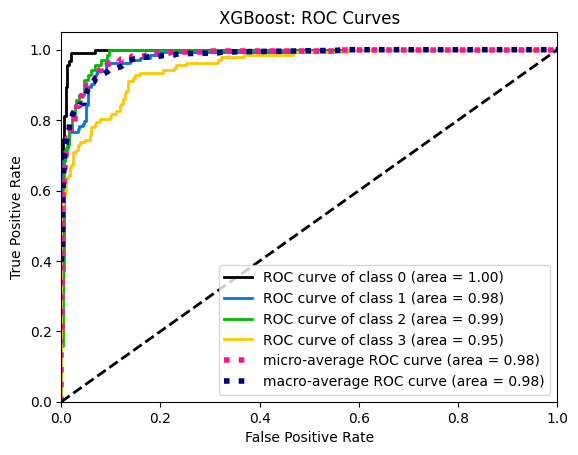

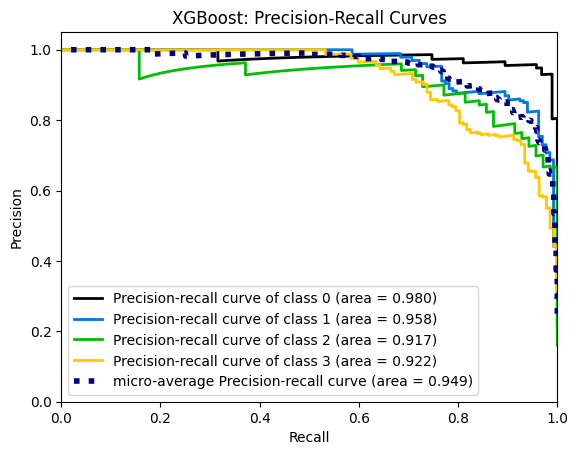

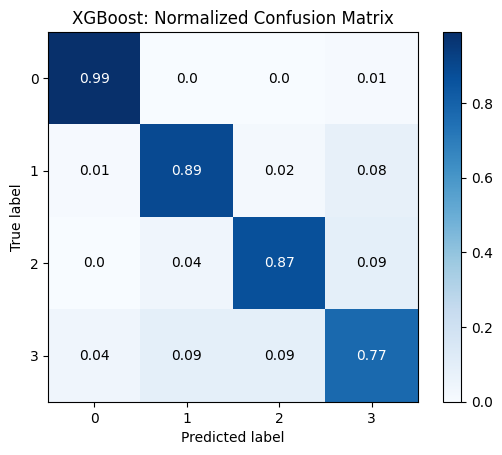

SHAP summary plot for phenotype 0


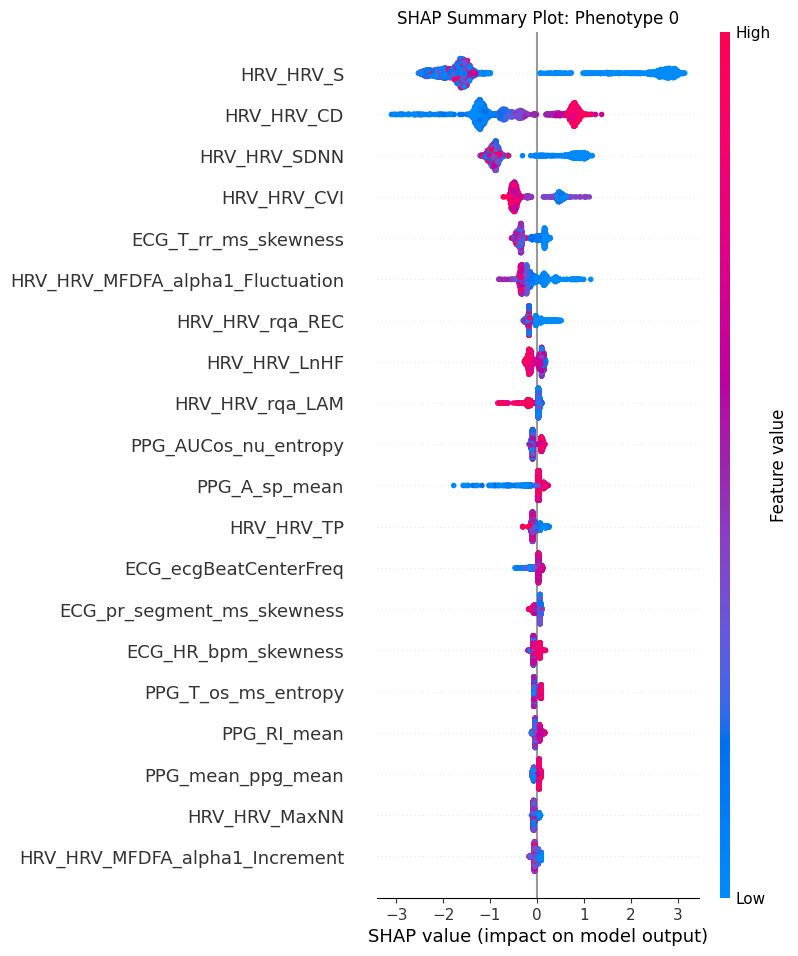

SHAP summary plot for phenotype 1


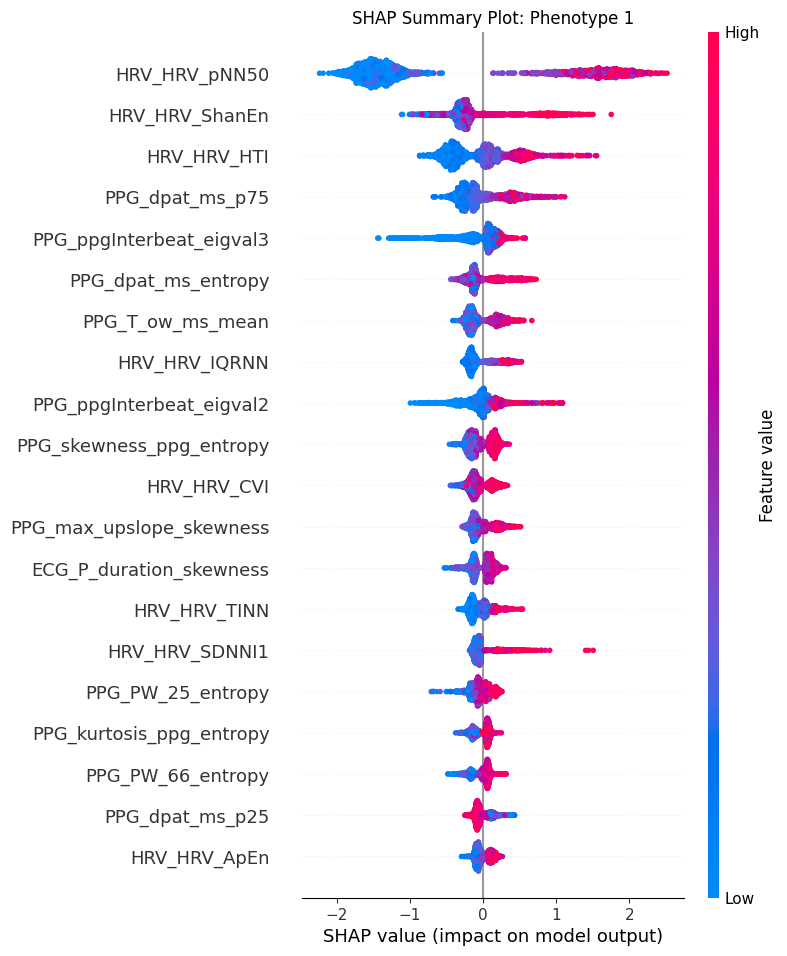

SHAP summary plot for phenotype 2


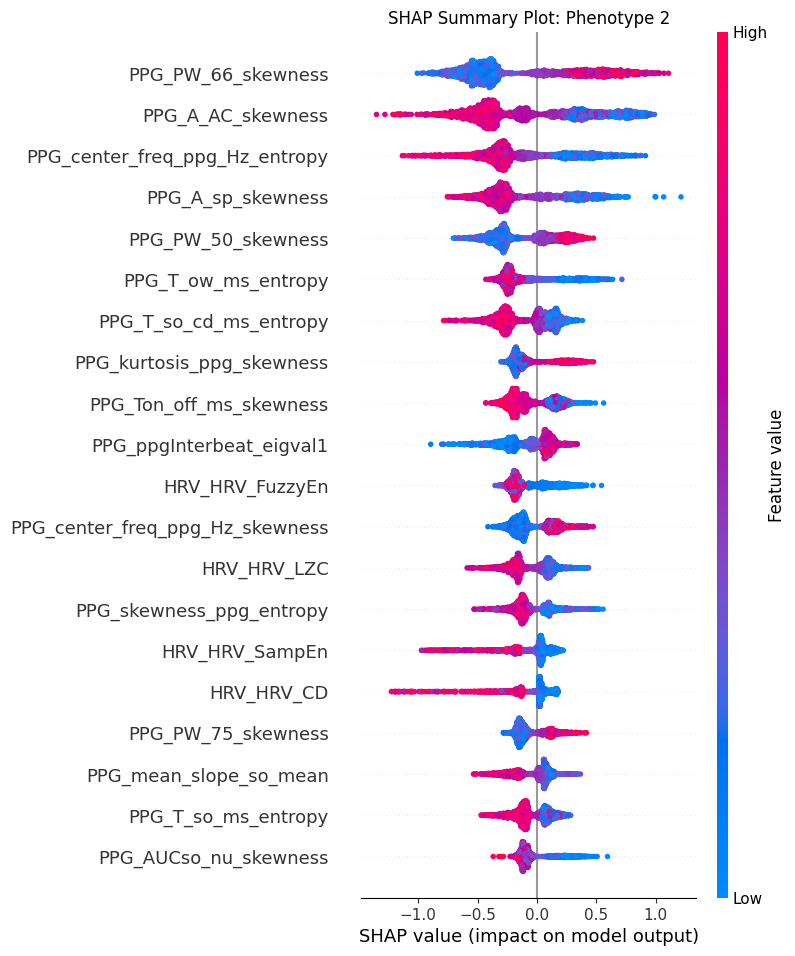

SHAP summary plot for phenotype 3


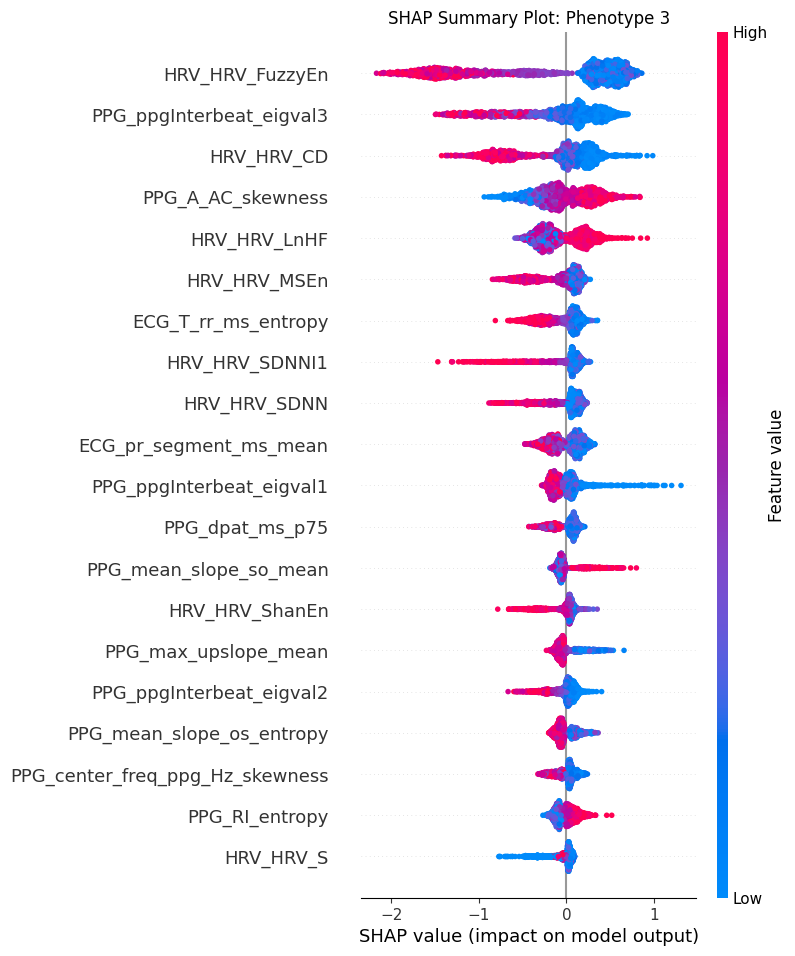

🔍 SHAP Values Debug Info:
Type: <class 'numpy.ndarray'>
Shape: (2174, 272, 4)
Number of dimensions: 3
Feature indices: 272 features
Sample feature indices: [('ECG_T_rr_ms_mean', 0), ('ECG_T_rr_ms_p25', 1), ('ECG_T_rr_ms_p75', 2), ('ECG_T_rr_ms_skewness', 3), ('ECG_T_rr_ms_entropy', 4)]
✅ Clustering complete: 4 phenotypes identified
   - 2174 patients analyzed
   - 272 features selected
   - Top SHAP features with mean absolute values per class: {0:                 feature  importance
0             HRV_HRV_S    1.934226
1            HRV_HRV_CD    0.944828
2          HRV_HRV_SDNN    0.894553
3           HRV_HRV_CVI    0.478277
4  ECG_T_rr_ms_skewness    0.284027, 1:                     feature  importance
0             HRV_HRV_pNN50    1.486736
1            HRV_HRV_ShanEn    0.385305
2               HRV_HRV_HTI    0.348561
3           PPG_dpat_ms_p75    0.256782
4  PPG_ppgInterbeat_eigval3    0.208417, 2:                           feature  importance
0              PPG_PW_66_skewness    

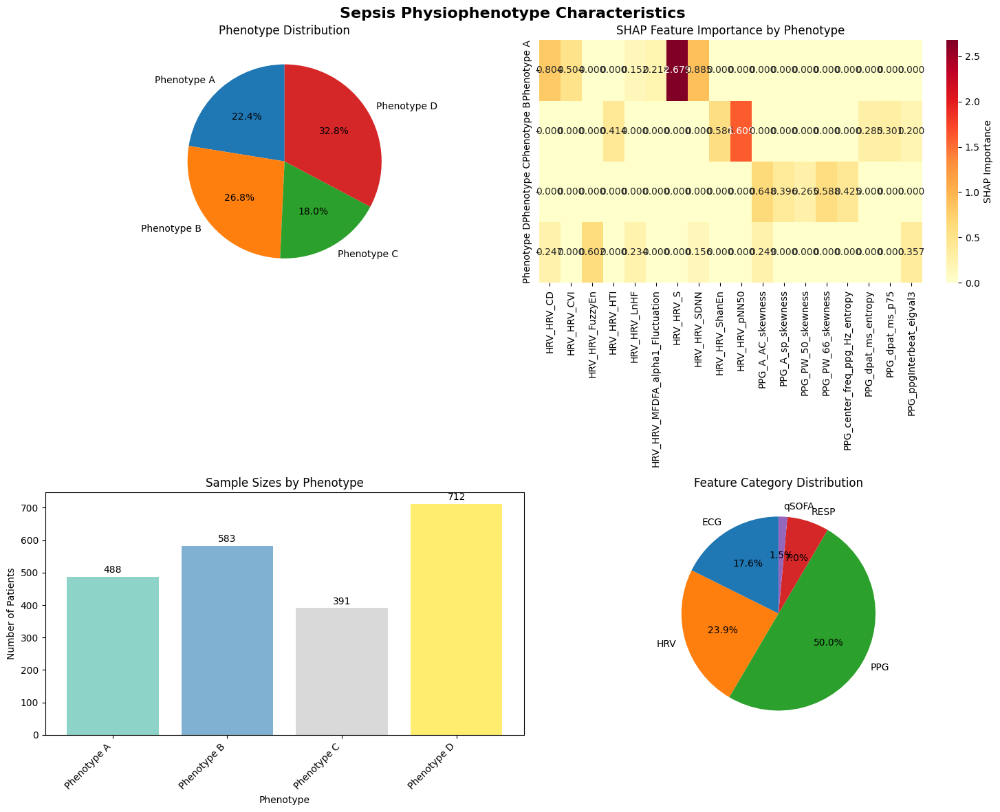

Results exported to: ./sepsis_phenotype_study_results/All_umap_latest/analysis_results/

SEPSIS PHENOTYPE ANALYSIS COMPLETE

Identified Sepsis Physiophenotypes:
• Cluster 0: Reduced HRV with Elevated Peripheral Perfusion (488 patients, 22.4%)
• Cluster 1: Enhanced Parasympathetic Complexity with Peripheral Variability (583 patients, 26.8%)
• Cluster 2: Reduced Pulse Strength with Prolonged Pulse Width (391 patients, 18.0%)
• Cluster 3: Reduced Complexity with Enhanced Pulse Strength (712 patients, 32.8%)

All results saved to: ./sepsis_phenotype_study_results/All_umap_latest/analysis_results/
✅ LLM interpretation complete
   - Phenotype names generated
   - Clinical interpretations created

📋 Step 3: Creating Analysis Summary...

💾 Step 4: Saving Results to ./sepsis_phenotype_study_results/All_umap_latest/analysis_results/
   ✅ Analysis summary: analysis_summary.json
   ✅ Cluster assignments: cluster_assignments.csv
   ✅ Selected features: selected_features.csv
   ✅ Trained model: trai

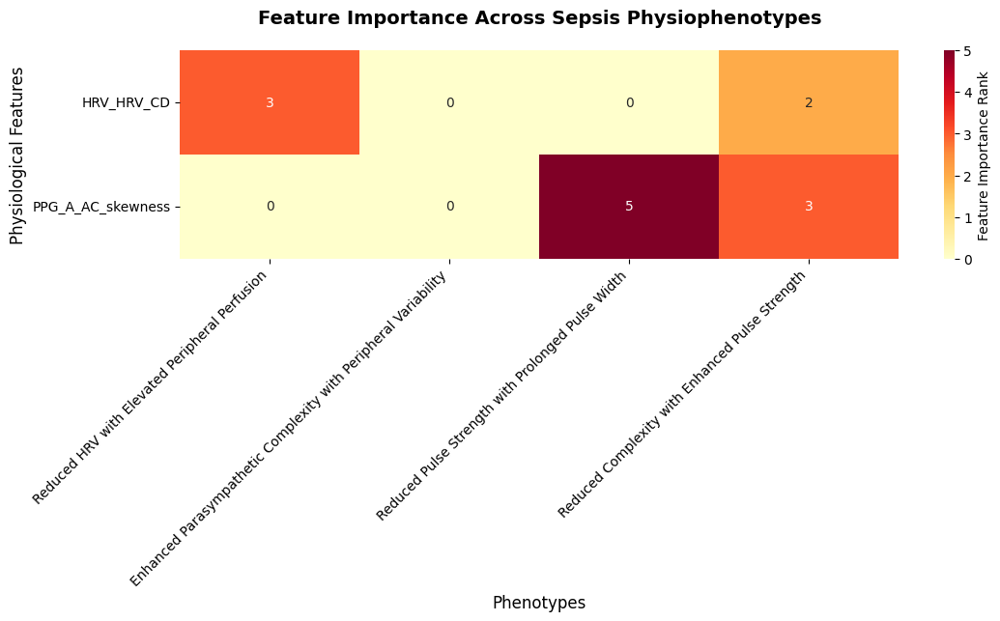

In [14]:
# 3. Run the complete workflow
results, validation_report, comparison_table, summary_cards = run_complete_sepsis_analysis_workflow(
    df_data=df_presepsis_5min,  # 2074 patients × 400+ features .iloc[:200,:]
    feature_columns=feature_cols,  # Your physiological features
    standard_minmax = 'standard',
    var_thresh = 0.01,
    corr_thresh = 0.85,
    dim_reduce_method = 'umap', 
    embedding_type = None,
    k_opt = 4,
    verbose = 1, 
    api_provider = API_PROVIDER,
    api_key = API_KEY,
    model_name = MODEL_NAME,
    clinical_outcomes=None,  # Optional: mortality, LOS, etc. outcomes_data
    output_base_dir="./sepsis_phenotype_study_results/All_umap_latest"
)


# 4. Access the generated phenotype names
phenotype_names = results['phenotype_names']
print("Generated Sepsis Phenotype Names:")
for cluster_id, name in phenotype_names.items():
    print(f"  Cluster {cluster_id}: {name}")

    
import pickle
output_base_dir="./sepsis_phenotype_study_results/All_umap_latest"
with open(f"{output_base_dir}/results.pkl", "wb") as f:
    pickle.dump(results, f)
    
    
# with open(f"{output_base_dir}\results.pkl", "rb") as f:
#     results = pickle.load(f)

In [16]:
from integrated_sepsis_pipeline import IntegratedSepsisAnalysisPipeline as isap 

clust = isap().restore_consensus_clust_json_load(json_path='./sepsis_phenotype_study_results/All_umap_latest/analysis_results/consensus_clust.json', model_path=None)
clust.keys()

dict_keys(['metrics', 'cluster_labels', 'selected_features', 'top_5_features_per_class', 'shap_values', 'feature_indices'])

Creating comprehensive phenotype interpretation report using SHAP...
Analyzing cluster characteristics using SHAP values...
🔍 SHAP values shape: (2174, 272, 4)
🔍 Cluster labels shape: (2174,)
🔍 Number of unique clusters: 4
🔍 Cluster 0: 488 samples, SHAP shape: (488, 272)
🔍 Cluster 1: 577 samples, SHAP shape: (577, 272)
🔍 Cluster 2: 392 samples, SHAP shape: (392, 272)
🔍 Cluster 3: 717 samples, SHAP shape: (717, 272)
Generating LLM-based phenotype interpretations with SHAP-based feature importance...
Interpreting Cluster_0...
feature_data: {'feature': 'HRV_HRV_S', 'importance': 3.0129419269620397}
summary_lines: ['1. HRV_HRV_S: ↓ Lower values (High importance, SHAP=3.0129). Clinical meaning: Area of Poincaré ellipse - overall HRV scatter area', '']
feature_data: {'feature': 'HRV_HRV_CD', 'importance': 0.7826688148875217}
summary_lines: ['1. HRV_HRV_S: ↓ Lower values (High importance, SHAP=3.0129). Clinical meaning: Area of Poincaré ellipse - overall HRV scatter area', '', '2. HRV_HRV_CD:

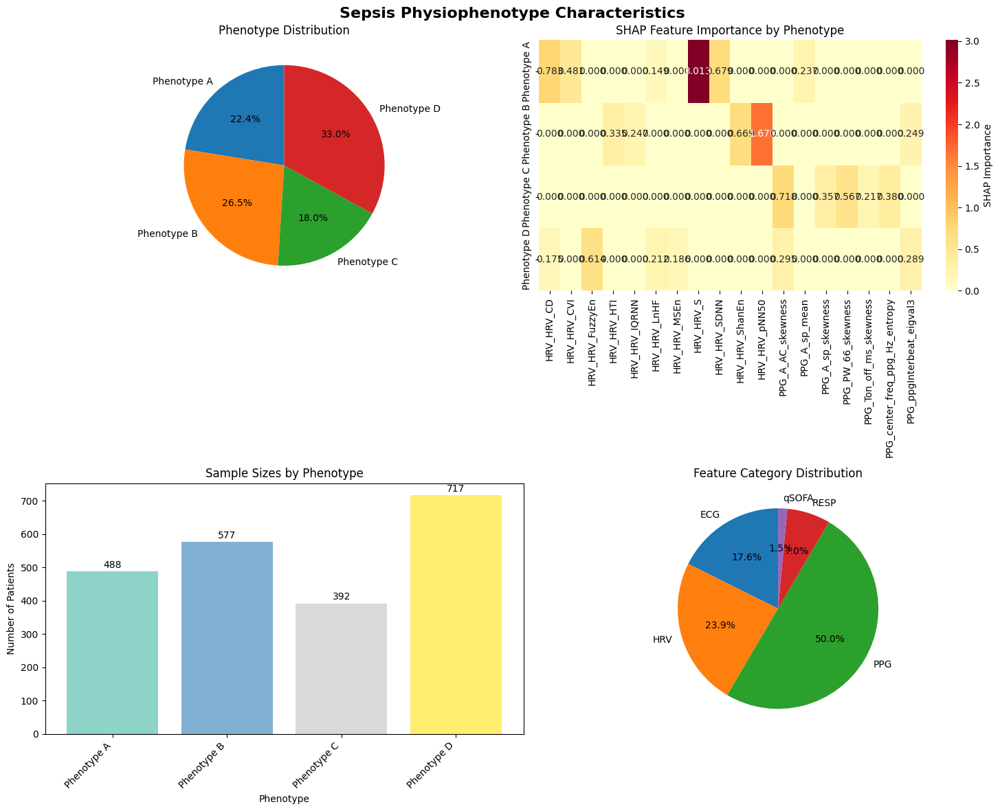

Results exported to: xyz/recent

SEPSIS PHENOTYPE ANALYSIS COMPLETE

Identified Sepsis Physiophenotypes:
• Cluster 0: Reduced HRV with Elevated Peripheral Perfusion (488 patients, 22.4%)
• Cluster 1: Enhanced Parasympathetic Complexity with Peripheral Variability (577 patients, 26.5%)
• Cluster 2: PHENOTYPE NAME (392 patients, 18.0%)
• Cluster 3: Reduced Complexity with Enhanced Pulse Strength (717 patients, 33.0%)

All results saved to: xyz/recent
Phenotype Names: {0: 'Reduced HRV with Elevated Peripheral Perfusion', 1: 'Enhanced Parasympathetic Complexity with Peripheral Variability', 2: 'PHENOTYPE NAME', 3: 'Reduced Complexity with Enhanced Pulse Strength'}


In [17]:
from sepsis_phenotype_interpreter import *

# Run the complete analysis with SHAP
interpreter, report = run_sepsis_phenotype_interpretation(
    data=df_presepsis_5min,
    cluster_labels=clust['cluster_labels'],
    feature_columns=clust['selected_features'],
    top_5_features_per_class=None,
    shap_values=clust['shap_values'],
    feature_indices=clust['feature_indices'],
    api_provider='openai',  # or 'anthropic'
    api_key=API_KEY,
    model_name='gpt-4o',  # or 'claude-3-sonnet-20240229'
    output_dir="xyz/recent"
)

# Access phenotype names
phenotype_names = interpreter.get_phenotype_names()
print("Phenotype Names:", phenotype_names)

In [20]:
# import pandas as pd
# import numpy as np

# # Mock _get_feature_context
# class MockPipeline:
#     def _get_feature_context(self, feature):
#         context_map = {
#             'ECG_T_rr_ms_mean': 'RR interval (successive R-peaks interval) - reflects heart rhythm regularity',
#             'ECG_HR_bpm_p25': 'Heart Rate - primary cardiac vital sign',
#             'HRV_HRV_SDNNI1': 'Standard deviation of NN intervals - overall HRV, autonomic balance',
#             'ECG_T_rr_ms_p75': 'RR interval (successive R-peaks interval) - reflects heart rhythm regularity',
#             'HRV_HRV_ShanEn': 'Feature context not available'
#         }
#         return context_map.get(feature, 'Feature context not available')
    
#     def _create_enhanced_feature_summary(self, top_features: pd.DataFrame, shap_values, feature_indices: dict) -> str:
#         """
#         Create a feature summary with clinical context and directionality using SHAP-based feature importances.

#         Parameters:
#         - top_features: pandas DataFrame with columns 'feature' and 'importance' (mean absolute SHAP values).
#         - shap_values: SHAP values for the cluster (2D array: samples × features, or list/3D array for multi-class).
#         - feature_indices: Dictionary mapping feature names to their indices in shap_values.

#         Returns:
#         - str: Formatted feature summary string with directionality.
#         """
#         summary_lines = []

#         # Define importance thresholds (adjust as needed based on SHAP values)
#         max_importance = top_features['importance'].max()
#         high_threshold = max_importance * 0.66  # Top 33% of max importance
#         moderate_threshold = max_importance * 0.33  # Middle 33% of max importance

#         # Compute mean (non-absolute) SHAP values for directionality
#         mean_shap = np.mean(shap_values, axis=0)  # Mean across samples for this cluster

#         for i, row in enumerate(top_features.itertuples(), 1):
#             feature = row.feature
#             importance = row.importance

#             # Categorize importance
#             if importance >= high_threshold:
#                 importance_label = "High"
#             elif importance >= moderate_threshold:
#                 importance_label = "Moderate"
#             else:
#                 importance_label = "Low"

#             # Determine directionality
#             feature_idx = feature_indices.get(feature)
#             if feature_idx is None:
#                 raise ValueError(f"Feature {feature} not found in feature_indices")
#             direction = "↑ Higher" if mean_shap[feature_idx] > 0 else "↓ Lower"

#             # Get clinical context
#             context = self._get_feature_context(feature)

#             # Format summary line
#             summary_lines.append(
#                 f"{i}. {feature}: {direction} values ({importance_label} importance, SHAP={importance:.4f}). Clinical meaning: {context}"
#             )
#             # summary_lines.append(f"   Clinical meaning: {context}")
#             summary_lines.append("")  # Empty line for readability

#         return "\n".join(summary_lines)

# # Test data
# top_features_df = pd.DataFrame({
#     'feature': ['ECG_T_rr_ms_mean', 'ECG_HR_bpm_p25', 'HRV_HRV_SDNNI1', 'ECG_T_rr_ms_p75', 'HRV_HRV_ShanEn'],
#     'importance': [0.1234, 0.0987, 0.0765, 0.0543, 0.0432]
# })
# shap_values = np.random.randn(100, 5)  # Mock SHAP values (100 samples, 5 features)
# shap_values[:, 0] += 0.1  # Make ECG_T_rr_ms_mean positive
# shap_values[:, 1] -= 0.1  # Make ECG_HR_bpm_p25 negative
# feature_indices = {f: i for i, f in enumerate(top_features_df['feature'])}

# # Create instance and test
# pipeline = MockPipeline()
# summary = pipeline._create_enhanced_feature_summary(top_features_df, shap_values, feature_indices)
# print(summary)

1. ECG_T_rr_ms_mean: ↓ Lower values (High importance, SHAP=0.1234). Clinical meaning: RR interval (successive R-peaks interval) - reflects heart rhythm regularity

2. ECG_HR_bpm_p25: ↓ Lower values (High importance, SHAP=0.0987). Clinical meaning: Heart Rate - primary cardiac vital sign

3. HRV_HRV_SDNNI1: ↑ Higher values (Moderate importance, SHAP=0.0765). Clinical meaning: Standard deviation of NN intervals - overall HRV, autonomic balance

4. ECG_T_rr_ms_p75: ↑ Higher values (Moderate importance, SHAP=0.0543). Clinical meaning: RR interval (successive R-peaks interval) - reflects heart rhythm regularity

5. HRV_HRV_ShanEn: ↑ Higher values (Moderate importance, SHAP=0.0432). Clinical meaning: Feature context not available



🚀 Starting Complete Sepsis Analysis Workflow
🚀 Starting Integrated Sepsis Phenotyping Analysis

📊 Step 1: Performing Consensus Clustering...
run_complete_analysis - var_thresh: 0.01, corr_thresh: 0.85, dim_reduce_method: pca_umap, embedding_type: None
PCA Method


Computing consensus matrices: 100%|██████████| 8/8 [00:00<00:00, 19819.51it/s]


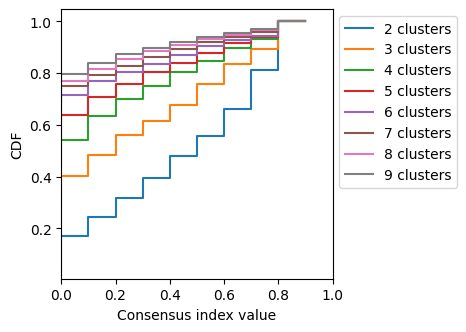

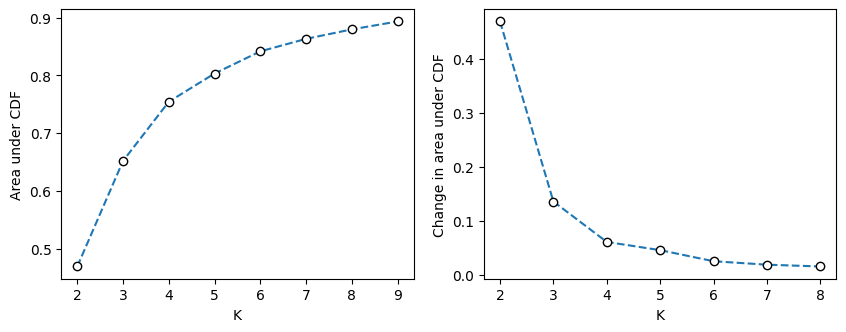

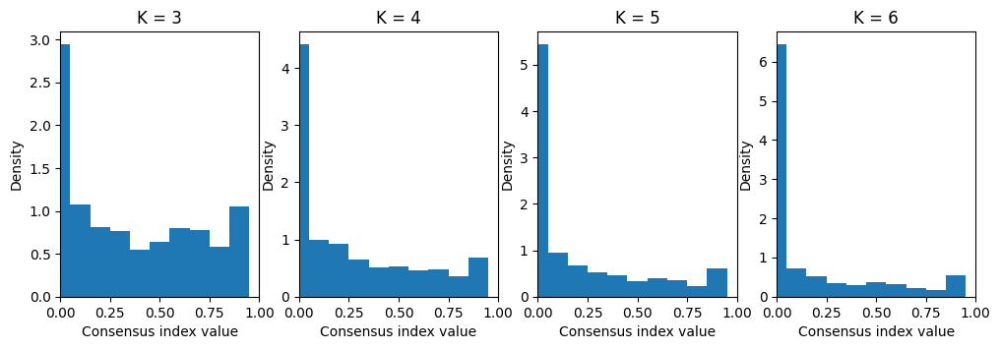

Best k from change in AUC: 2, and from AUC knee point: 4
Initial feature.shape: (2174, 429)
After VIF and dropping highly correlated features, feature.shape: (2174, 272)


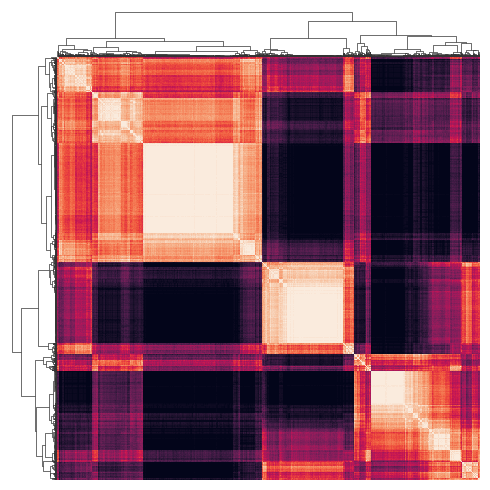

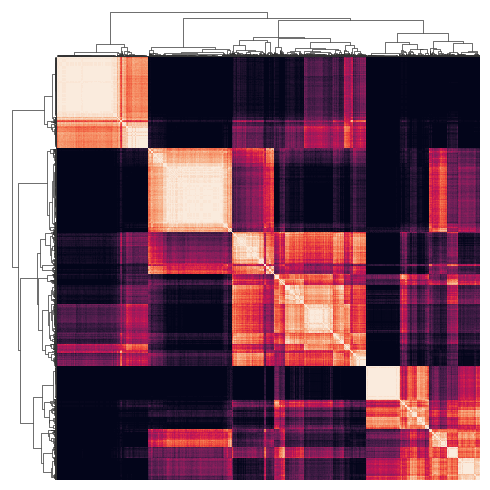

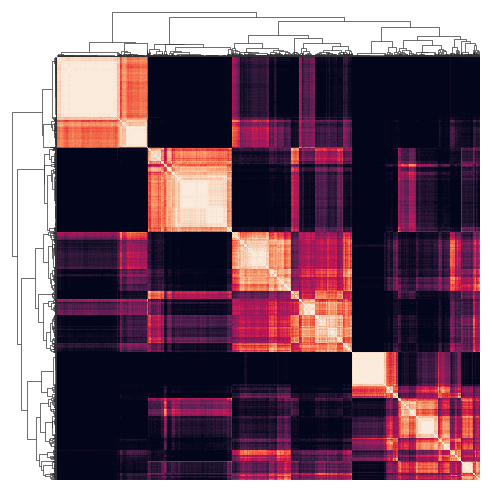

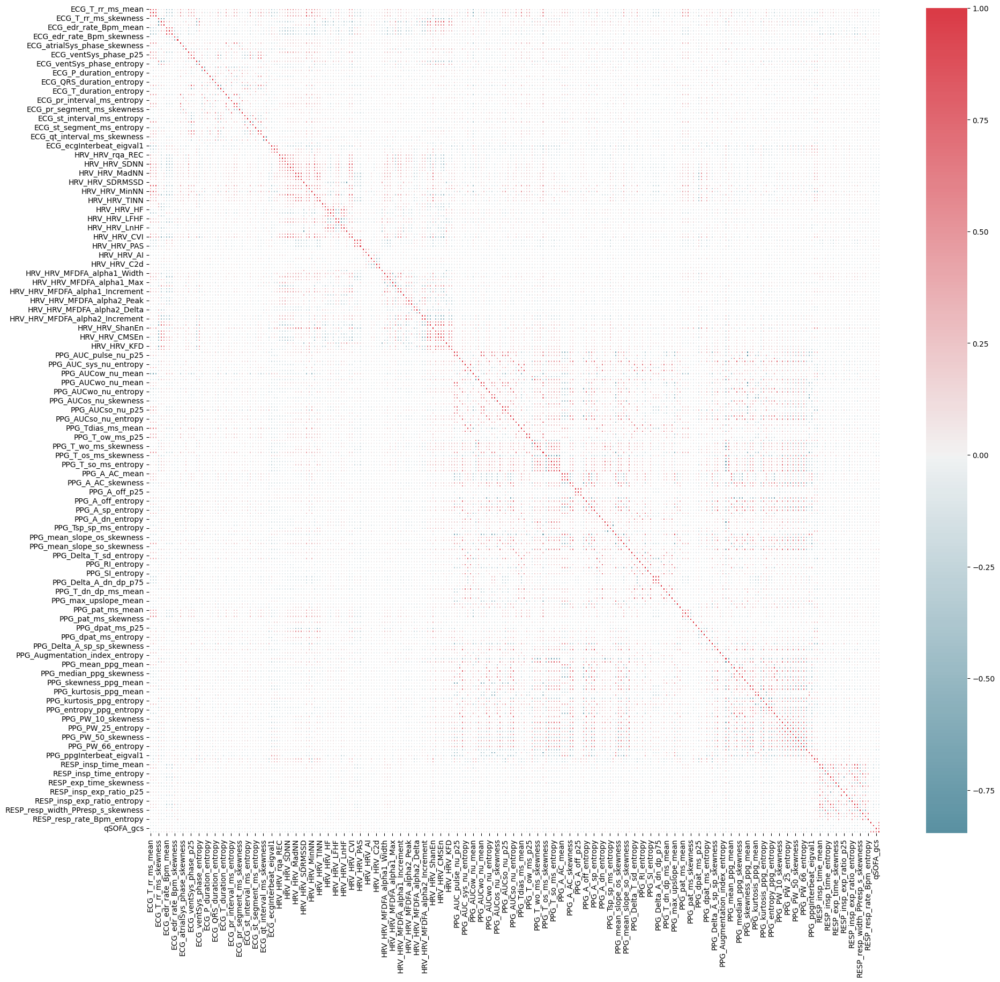

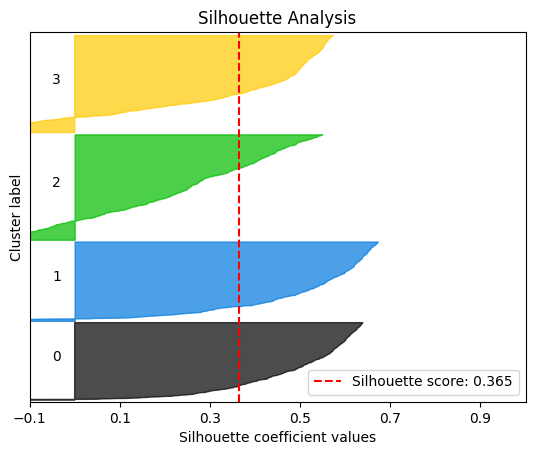

SS, DB, CH: 0.365, 0.916, 1951.772
2    638
3    587
1    480
0    469
Name: count, dtype: int64


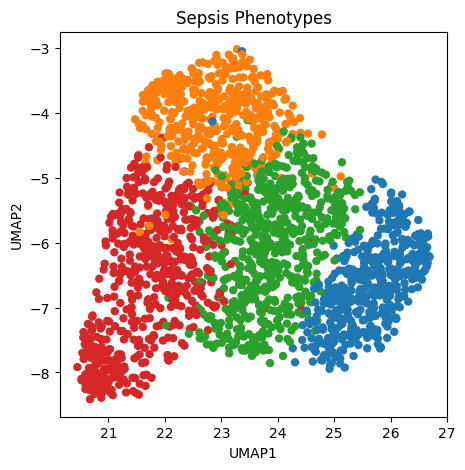

Shape of shap_values: (2174, 272, 4)
Shape of mean_abs_shap: (272,)
Length of sel_feature_list: 272
Number of features input to the model: 272
Train-test split: 1739 train, 435 test
Confusion matrix:
[[ 87   1   2   1]
 [  1  76   6   7]
 [  7   8  99   7]
 [  1   2   8 122]]
Overall accuracy: 0.883
Precision: [0.906 0.874 0.861 0.891]
Recall: [0.956 0.844 0.818 0.917]
F1-score: [0.93  0.859 0.839 0.904]
Accuracy per class: [0.956 0.844 0.818 0.917]
Predicted clusters on test set: Counter({3: 133, 2: 121, 0: 91, 1: 90})
selected feature list after filtering: 272

Top 5 features (overall):
                feature  importance
74            HRV_HRV_S    0.469955
51         HRV_HRV_SDNN    0.377428
59        HRV_HRV_pNN50    0.347798
109          HRV_HRV_CD    0.338999
242  PPG_PW_66_skewness    0.200981

Top 5 features per class:
Class 0:
          feature  importance
74      HRV_HRV_S    1.761809
51   HRV_HRV_SDNN    1.289094
109    HRV_HRV_CD    0.816623
72   HRV_HRV_LnHF    0.205661
75

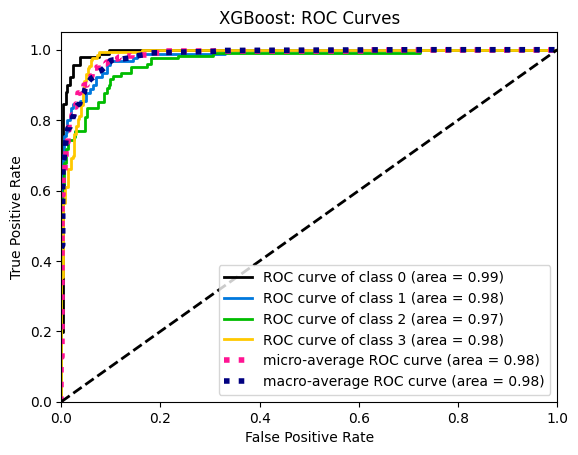

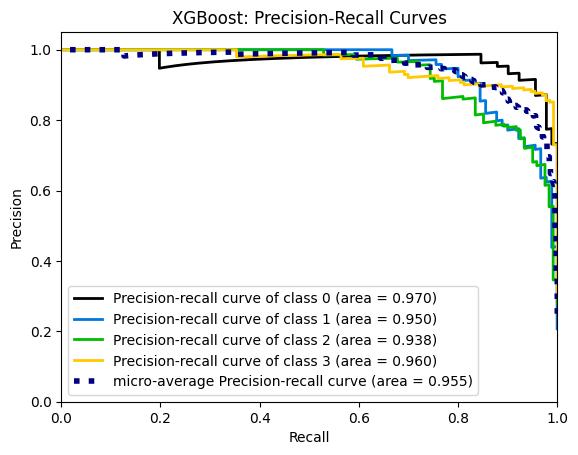

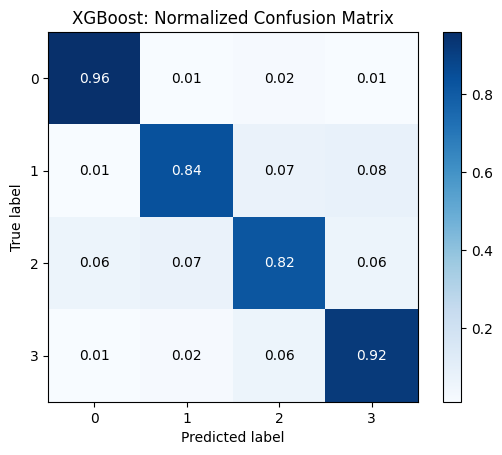

SHAP summary plot for phenotype 0


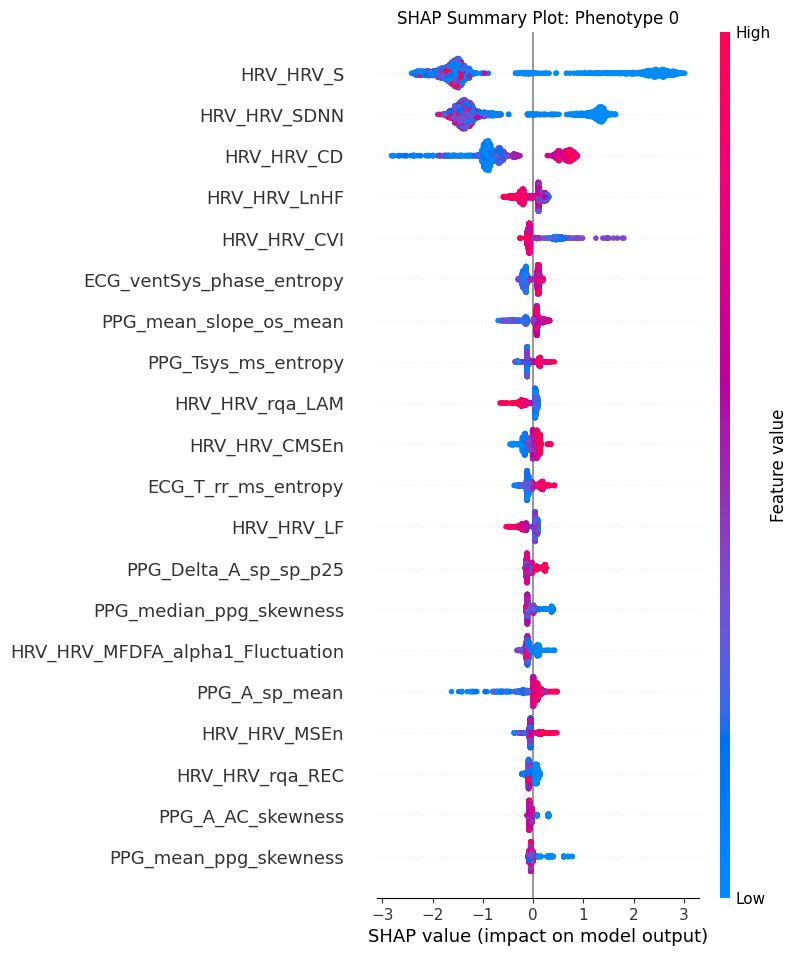

SHAP summary plot for phenotype 1


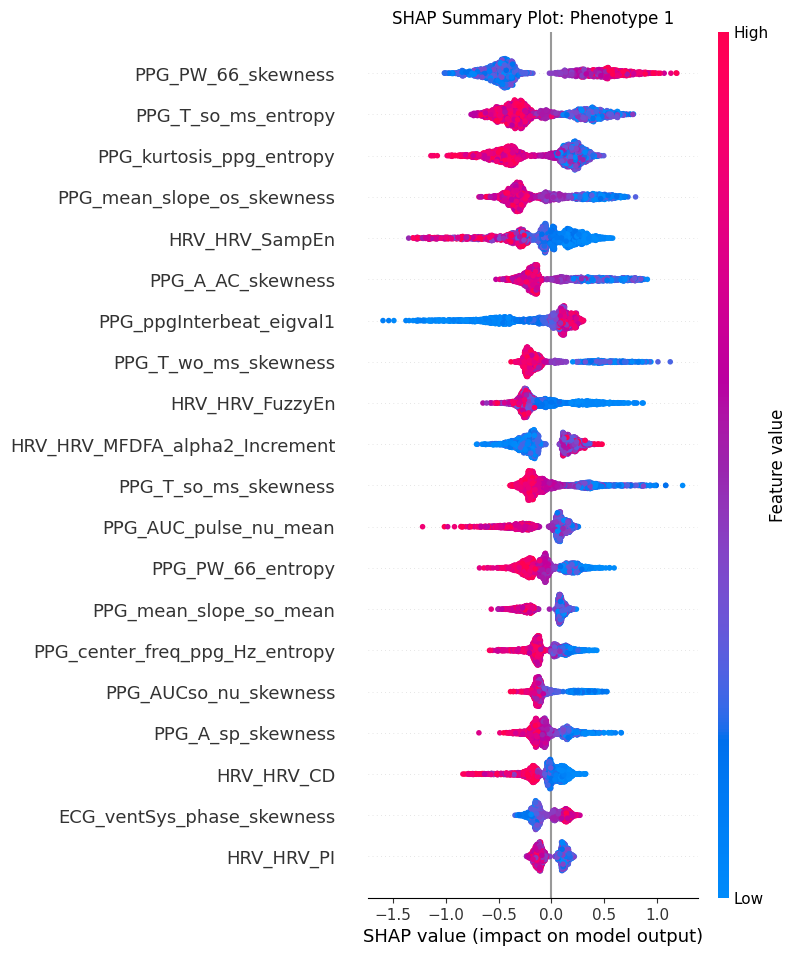

SHAP summary plot for phenotype 2


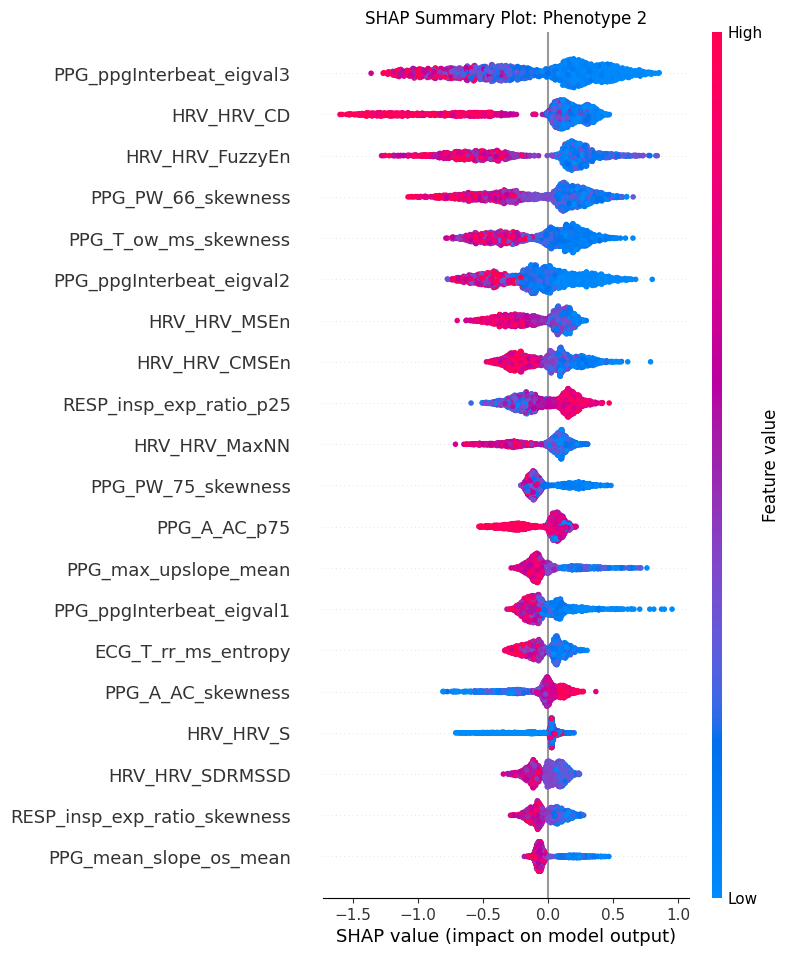

SHAP summary plot for phenotype 3


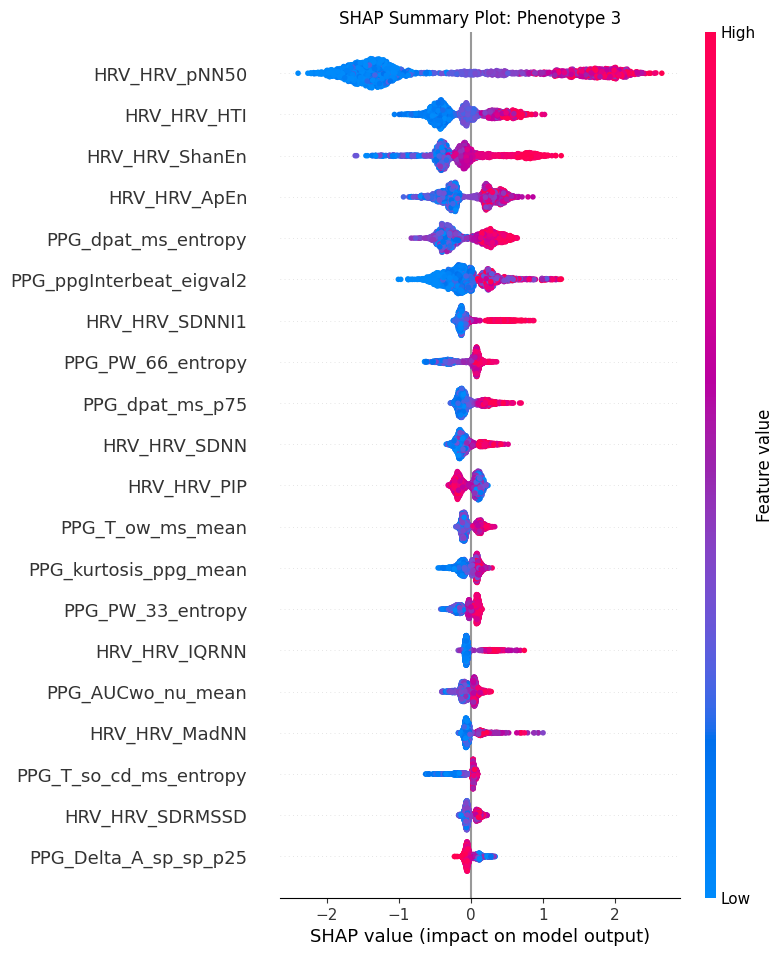

🔍 SHAP Values Debug Info:
Type: <class 'numpy.ndarray'>
Shape: (2174, 272, 4)
Number of dimensions: 3
Feature indices: 272 features
Sample feature indices: [('ECG_T_rr_ms_mean', 0), ('ECG_T_rr_ms_p25', 1), ('ECG_T_rr_ms_p75', 2), ('ECG_T_rr_ms_skewness', 3), ('ECG_T_rr_ms_entropy', 4)]
✅ Clustering complete: 4 phenotypes identified
   - 2174 patients analyzed
   - 272 features selected
   - Top SHAP features with mean absolute values per class: {0:         feature  importance
0     HRV_HRV_S    1.761809
1  HRV_HRV_SDNN    1.289094
2    HRV_HRV_CD    0.816623
3  HRV_HRV_LnHF    0.205661
4   HRV_HRV_CVI    0.195957, 1:                       feature  importance
0          PPG_PW_66_skewness    0.491978
1         PPG_T_so_ms_entropy    0.356444
2    PPG_kurtosis_ppg_entropy    0.324796
3  PPG_mean_slope_os_skewness    0.310077
4              HRV_HRV_SampEn    0.279085, 2:                     feature  importance
0  PPG_ppgInterbeat_eigval3    0.442012
1                HRV_HRV_CD    0.384744

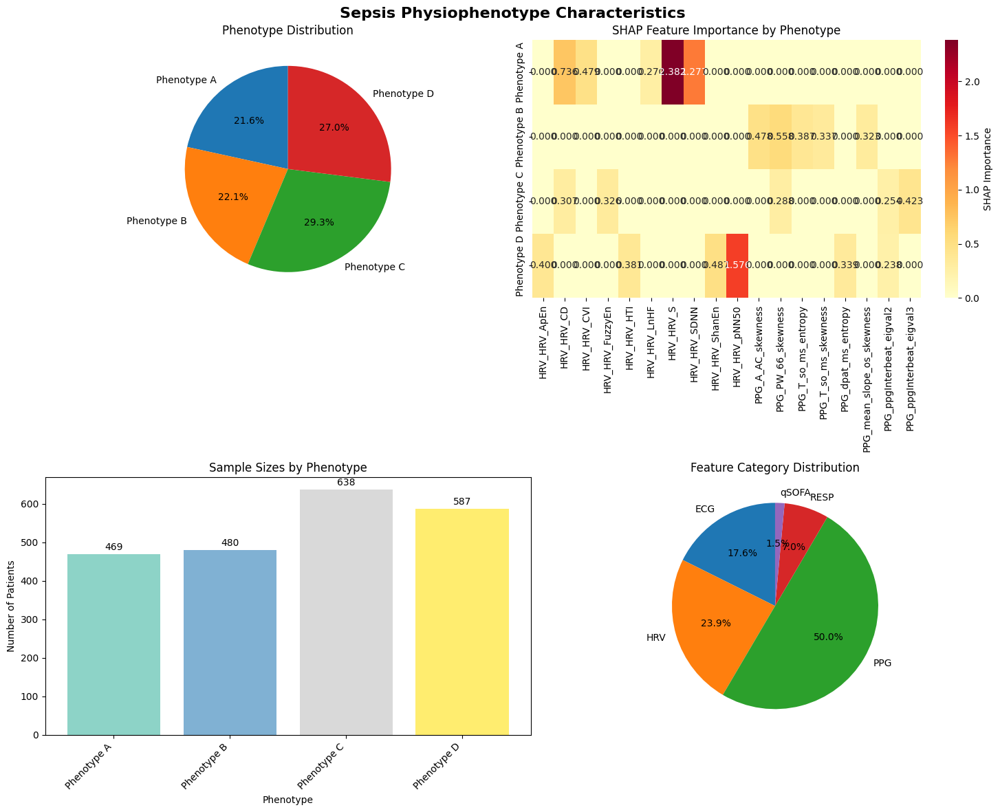

Results exported to: ./sepsis_phenotype_study_results/PCA_umap_latest/analysis_results/

SEPSIS PHENOTYPE ANALYSIS COMPLETE

Identified Sepsis Physiophenotypes:
• Cluster 0: Reduced HRV with Enhanced Peripheral Pulse (469 patients, 21.6%)
• Cluster 1: Skewed Pulse Dynamics with Autonomic Imbalance (480 patients, 22.1%)
• Cluster 2: Reduced Complexity with Impaired Perfusion (638 patients, 29.3%)
• Cluster 3: Enhanced Parasympathetic Complexity with Peripheral Variability (587 patients, 27.0%)

All results saved to: ./sepsis_phenotype_study_results/PCA_umap_latest/analysis_results/
✅ LLM interpretation complete
   - Phenotype names generated
   - Clinical interpretations created

📋 Step 3: Creating Analysis Summary...

💾 Step 4: Saving Results to ./sepsis_phenotype_study_results/PCA_umap_latest/analysis_results/
   ✅ Analysis summary: analysis_summary.json
   ✅ Cluster assignments: cluster_assignments.csv
   ✅ Selected features: selected_features.csv
   ✅ Trained model: trained_model.pk

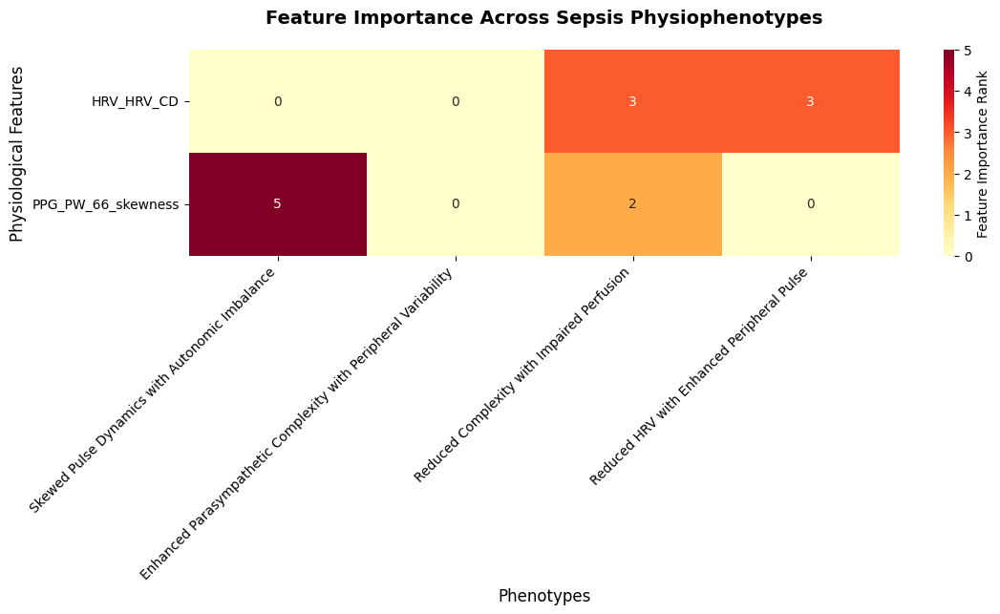

In [15]:
# 3. Run the complete workflow
results, validation_report, comparison_table, summary_cards = run_complete_sepsis_analysis_workflow(
    df_data=df_presepsis_5min,  # 2074 patients × 400+ features
    feature_columns=feature_cols,  # Your physiological features
    standard_minmax = 'standard',
    var_thresh = 0.01,
    corr_thresh = 0.85,
    dim_reduce_method = 'pca_umap',
    embedding_type = None,
    k_opt = 4,
    verbose = 1, 
    api_provider = API_PROVIDER,
    api_key = API_KEY,
    model_name = MODEL_NAME,
    clinical_outcomes=None,  # Optional: mortality, LOS, etc. outcomes_data
    output_base_dir="./sepsis_phenotype_study_results/PCA_umap_latest"
)


# 4. Access the generated phenotype names
phenotype_names = results['phenotype_names']
print("Generated Sepsis Phenotype Names:")
for cluster_id, name in phenotype_names.items():
    print(f"  Cluster {cluster_id}: {name}")

    

    
import pickle
output_base_dir="./sepsis_phenotype_study_results/PCA_umap_latest"
with open(f"{output_base_dir}/results.pkl", "wb") as f:
    pickle.dump(results, f)
    
    
# with open(f"{output_base_dir}/results.pkl", "rb") as f:
#     results = pickle.load(f)

# Fetch Best-performing Model Parameters (FTT_umap_latest)

In [17]:
"""
Phenotype interpretation if you have clustering results ready.

"""

# from integrated_sepsis_pipeline import IntegratedSepsisAnalysisPipeline as isap 

# clust = isap().restore_consensus_clust_json_load(json_path='./sepsis_phenotype_study_results/FTT_umap_latest/analysis_results/consensus_clust.json', model_path=None)
# print(clust.keys())


# from sepsis_phenotype_interpreter import *

# # Run the complete analysis with SHAP
# interpreter, report = run_sepsis_phenotype_interpretation(
#     data=df_presepsis_5min,
#     cluster_labels=clust['cluster_labels'],
#     feature_columns=clust['selected_features'],
#     top_5_features_per_class=None,
#     shap_values=clust['shap_values'],
#     feature_indices=clust['feature_indices'],
#     api_provider='openai',  # or 'anthropic'
#     api_key=API_KEY,
#     model_name='gpt-4o',  # or 'claude-3-sonnet-20240229'
#     output_dir="xyz/latest"
# )

# # Access phenotype names
# phenotype_names = interpreter.get_phenotype_names()
# print("Phenotype Names:", phenotype_names)

'\nPhenotype interpretation if you have clustering results ready.\n\n'

In [17]:
folder_name = 'FTT_umap_latest'

In [18]:
path0 = './sepsis_phenotype_study_results/'+folder_name+'/analysis_results/'

In [19]:
import pickle
with open(path0+'trained_model.pkl', 'rb') as f:
    xgbmodel = pickle.load(f)

In [20]:
cluster_labels = pd.read_csv(path0+'cluster_assignments.csv')['cluster_label'].values  

In [21]:
feature_list = pd.read_csv(path0+'selected_features.csv')['feature_name'].values 

In [22]:
len(feature_list)

272

In [26]:
# import tc_tabular_consensus_clustering_pipeline_v3 as TCC
# '''Building phenotype predictor'''
# '''
# # dim_reduce_method: Dimensionality reduction method (default:None - no dim reduction): 'pca', 'umap', 'custom_embedding'
# # embedding_type: name of the method created embedding. (dafault: None): 'None', 'rbm'
# '''
# xgbmodel, metrics, cluster_labels, feature_list = TCC.clustering_and_prediction(df_presepsis_5min, 
#                                                                                 feature_cols, 
#                                                                                 standard_minmax='standard', var_thresh=0.04, corr_thresh=0.9, 
#                                                                                 verbose=1, 
#                                                                                 dim_reduce_method='umap', 
#                                                                                 embedding_type=None,
#                                                                                 k_opt=4
#                                                                                )

In [19]:
len(feature_list)

272

In [20]:
feature_list

array(['ECG_T_rr_ms_mean', 'ECG_T_rr_ms_p25', 'ECG_T_rr_ms_p75',
       'ECG_T_rr_ms_skewness', 'ECG_T_rr_ms_entropy',
       'ECG_HR_bpm_skewness', 'ECG_edr_rate_Bpm_mean',
       'ECG_edr_rate_Bpm_p25', 'ECG_edr_rate_Bpm_p75',
       'ECG_edr_rate_Bpm_skewness', 'ECG_edr_rate_Bpm_entropy',
       'ECG_atrialSys_phase_mean', 'ECG_atrialSys_phase_skewness',
       'ECG_atrialSys_phase_entropy', 'ECG_ventSys_phase_mean',
       'ECG_ventSys_phase_p25', 'ECG_ventSys_phase_p75',
       'ECG_ventSys_phase_skewness', 'ECG_ventSys_phase_entropy',
       'ECG_P_duration_mean', 'ECG_P_duration_skewness',
       'ECG_P_duration_entropy', 'ECG_QRS_duration_mean',
       'ECG_QRS_duration_skewness', 'ECG_QRS_duration_entropy',
       'ECG_T_duration_mean', 'ECG_T_duration_skewness',
       'ECG_T_duration_entropy', 'ECG_pr_interval_ms_mean',
       'ECG_pr_interval_ms_skewness', 'ECG_pr_interval_ms_entropy',
       'ECG_pr_segment_ms_mean', 'ECG_pr_segment_ms_p25',
       'ECG_pr_segment_ms_skewn

In [21]:
df_presepsis_5min.columns[:30]

Index(['Unnamed: 0.1', 'Unnamed: 0', 'index', 'segmentID', 'waveID', 'fin',
       'year_sepsis', 'studyID', 't_origin', 't_sepsis', 'sofa',
       'PPG_ppg_class', 'PPG_DN_exists', 'ECG_T_rr_ms_mean',
       'ECG_T_rr_ms_median', 'ECG_T_rr_ms_std', 'ECG_T_rr_ms_mad',
       'ECG_T_rr_ms_iqr', 'ECG_T_rr_ms_min', 'ECG_T_rr_ms_max',
       'ECG_T_rr_ms_p25', 'ECG_T_rr_ms_p75', 'ECG_T_rr_ms_skewness',
       'ECG_T_rr_ms_kurtosis', 'ECG_T_rr_ms_entropy', 'ECG_T_rr_ms_slope',
       'ECG_T_rr_ms_autocorr_lag1', 'ECG_T_rr_ms_gini_index',
       'ECG_T_rr_ms_valid_n', 'ECG_HR_bpm_mean'],
      dtype='object')

In [30]:

# import pickle

# with open('Data_folder/feature_list_used_for_clustering_v3.pickle', 'wb') as f:
#     pickle.dump(feature_list, f)
    
    
    
    
    

    
    
# with open('Data_folder/feature_list_used_for_clustering_v3.pickle', 'rb') as f:
#     feature_list = pickle.dump(feature_list, f)
       
    

In [26]:

# np.save('Data_folder/cluster_labels_presepsis_5min_v5.npy', cluster_labels)









# cluster_labels = np.load('Data_folder/cluster_labels_presepsis_5min_v5.npy')

In [23]:
df_presepsis_5min['label'] = cluster_labels

In [24]:
df_presepsis_5min.shape

(2174, 1197)

In [40]:
df_local = df_presepsis_5min.copy()
df_local["sofa_group"] = pd.cut(
    df_local["sofa"],
    bins=[-1, 1, 6, df_local["sofa"].max()],
    labels=["0–1", "2–6", ">6"]
)


# df_local["sofa_group"] = pd.cut(
#     df_local["sofa"],
#     bins=[-1, 1, 5, 10, df_local["sofa"].max()],
#     labels=["<2", "2–5", "6–10", ">10"]
# )
pd.crosstab(df_local["label"], df_local["sofa_group"], normalize="index")

sofa_group,0–1,2–6,>6
label,,,
0,0.520690,0.393103,0.086207
1,0.543689,0.384189,0.072122
2,0.544093,0.374376,0.081531
3,0.562500,0.367647,0.069853


In [41]:
df_local[["sofa","sofa_group"]].iloc[10:20]

,sofa,sofa_group
10,0.0,0–1
11,0.0,0–1
12,11.0,>6
13,0.0,0–1
14,0.0,0–1
15,4.0,2–6
16,5.0,2–6
17,6.0,2–6
18,4.0,2–6
19,1.0,0–1


In [42]:


from tableone import TableOne

colss = ['sofa_group','vpfd28', 'vpfd7', 'vpfd2', 'vfd28', 'vfd7', 'vfd2', 
         'bfd28', 'bfd7', 'bfd2', 'ss28','ss7', 'ss2', 'ss1', 'vp28', 'vp7','vp2','v28', 'v7','v2','v1']
categorical=['sofa_group','ss28','ss7', 'ss2','ss1','vp28', 'vp7','vp2','v28', 'v7','v2','v1']
nonnormal = []
groupby = 'label'
TableOne_med = TableOne(df_local.copy(), decimals=3, missing=False, groupby=groupby, columns=colss, categorical=categorical,pval=True, htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med

Grouped by label                                                                                           
                               Overall                0                1                2                3 P-Value           Test
n                                 2174              580              721              601              272                       
sofa_group, n (%) 0–1    1174 (54.002)     302 (52.069)     392 (54.369)     327 (54.409)     153 (56.250)   0.893    Chi-squared
                  2–6     830 (38.178)     228 (39.310)     277 (38.419)     225 (37.438)     100 (36.765)                       
                  >6       170 (7.820)       50 (8.621)       52 (7.212)       49 (8.153)       19 (6.985)                       
vpfd28, mean (SD)      14.178 (12.916)  14.500 (12.904)  13.558 (13.074)  14.471 (12.844)  14.485 (12.686)   0.478  One-way ANOVA
vpfd7, mean (SD)         3.462 (3.022)    3.453 (3.004)    3.361 (3.067)    3.601 (3.023)    3.445 (2.940)   0.554  One-way ANOVA
vpfd2, mean (SD)         0.829 (0.946)    0.788 (0.941)    0.809 (0.943)    0.897 (0.955)    0.824 (0.940)   0.210  One-way ANOVA
vfd28, mean (SD)       12.852 (12.675)  13.202 (12.744)  12.179 (12.704)  13.063 (12.593)  13.426 (12.626)   0.362  One-way ANOVA
vfd7, mean (SD)          3.073 (3.169)    3.079 (3.121)    2.907 (3.192)    3.188 (3.184)    3.243 (3.169)   0.314  One-way ANOVA
vfd2, mean (SD)          0.831 (0.956)    0.805 (0.950)    0.774 (0.944)    0.882 (0.965)    0.926 (0.969)   0.060  One-way ANOVA
bfd28, mean (SD)       14.984 (13.388)  15.314 (13.392)  14.158 (13.441)  15.346 (13.267)  15.669 (13.472)   0.236  One-way ANOVA
bfd7, mean (SD)          4.232 (3.082)    4.203 (3.090)    3.963 (3.147)    4.479 (2.989)    4.463 (3.049)   0.012  One-way ANOVA
bfd2, mean (SD)          1.138 (0.899)    1.152 (0.902)    1.047 (0.906)    1.225 (0.872)    1.158 (0.914)   0.004  One-way ANOVA
ss28, n (%)       0.0    1465 (67.387)     389 (67.069)     534 (74.064)     371 (61.730)     171 (62.868)  <0.001    Chi-squared
                  1.0     709 (32.613)     191 (32.931)     187 (25.936)     230 (38.270)     101 (37.132)                       
ss7, n (%)        0.0    1588 (73.045)     420 (72.414)     573 (79.473)     408 (67.887)     187 (68.750)  <0.001    Chi-squared
                  1.0     586 (26.955)     160 (27.586)     148 (20.527)     193 (32.113)      85 (31.250)                       
ss2, n (%)        0.0    1677 (77.139)     437 (75.345)     593 (82.247)     443 (73.710)     204 (75.000)  <0.001    Chi-squared
                  1.0     497 (22.861)     143 (24.655)     128 (17.753)     158 (26.290)      68 (25.000)                       
ss1, n (%)        0.0    1699 (78.151)     442 (76.207)     598 (82.940)     452 (75.208)     207 (76.103)   0.002    Chi-squared
                  1.0     475 (21.849)     138 (23.793)     123 (17.060)     149 (24.792)      65 (23.897)                       
vp28, n (%)       0.0    1069 (49.172)     275 (47.414)     411 (57.004)     267 (44.426)     116 (42.647)  <0.001    Chi-squared
                  1.0    1105 (50.828)     305 (52.586)     310 (42.996)     334 (55.574)     156 (57.353)                       
vp7, n (%)        0.0    1209 (55.612)     310 (53.448)     451 (62.552)     311 (51.747)     137 (50.368)  <0.001    Chi-squared
                  1.0     965 (44.388)     270 (46.552)     270 (37.448)     290 (48.253)     135 (49.632)                       
vp2, n (%)        0.0    1337 (61.500)     338 (58.276)     487 (67.545)     354 (58.902)     158 (58.088)  <0.001    Chi-squared
                  1.0     837 (38.500)     242 (41.724)     234 (32.455)     247 (41.098)     114 (41.912)                       
v28, n (%)        0.0    1234 (56.762)     317 (54.655)     446 (61.859)     312 (51.913)     159 (58.456)   0.002    Chi-squared
                  1.0     940 (43.238)     263 (45.345)     275 (38.141)     289 (48.087)     113 (41.544)                

## Table One Demographics for 1st Segment studyID

In [22]:
pd.read_csv('Data_folder/Event_Table/tcdemographics_mladi24_new.csv')['disch_disp'].unique()

array(['Home Health Agency', 'Skilled Nurs Facil', 'Home/Self Care',
       'Rehab/Inpt Rehab Unt', 'CTB-No Autopsy', 'Dsc/Xfer Crt/Law Enf',
       'Short Term Gen Hospt', 'Home/Routine', 'CTB-Autopsy',
       'To a Long Term Hospital', 'Hospice Med Facility', 'Eloped',
       'DSCG Other Facility', 'To PSY FAC W Readmit',
       'Against Med Advice - Inpt', 'DSCH/PSY HOSP & UNIT',
       'To Hospice/Home', 'Referred to SNF', 'MH/Overnight Crisis',
       'DC/TR To Fed Hosp', 'Still Patient', nan, 'To Oth Type Facility',
       'To Home Health W REA', 'Left Against Med Adv',
       'To SNF with Readmit', 'Transfer to Hospital',
       'Routine With Readmit', 'To Cancr/Child Hosp',
       'ICF/Assistant Living', 'Expired Other',
       'To Other Facility W Readm', ' ', 'To Cancer CNTR W REA',
       'To Court/Law W Readm', 'To Fedrl Fac W Readm', 'Referred to ED',
       'ALIVE', 'To IRF With Readmit', 'Expired in OR'], dtype=object)

In [ ]:
demo = pd.read_csv('Data_folder/Event_Table/tcdemographics_mladi24_new.csv')
demo['studyID'] = demo.study_id.astype('str')
demo['fin'] = demo.FIN_study_id.astype('int')
demo.drop_duplicates(inplace=True)
demo.reset_index(inplace=True, drop=True)
# death = demo.disch_disp.str.contains('CTB')
death = demo.disch_disp.str.contains('CTB|Expired', na=False)
demo['death'] = death.values
demo.loc[:,'death'][demo.death.isnull()] = False

#df_Sepsis_latest
df_Sepsis_latest_demo = df_presepsis_5min.merge(demo, on=['fin'], how='left') #Just to carry demographic data as well
df_Sepsis_latest_demo['disch_date'] = pd.to_datetime(df_Sepsis_latest_demo.disch_date)
df_Sepsis_latest_demo.loc[:,'death'][df_Sepsis_latest_demo.death.isnull()] = False
print(df_Sepsis_latest_demo.death.unique(), df_Sepsis_latest_demo.death.isnull().sum(), df_Sepsis_latest_demo.shape)


# cl1 = ['fin','studyID','death', 'age','sex','race','ethnicity']
cl2 = ['studyID_x','label','death', 'age','sex','race','ethnicity','Death28','Death7', 'Death2','Death1'] #'label_seg0',
df_1stSeg_5min = df_Sepsis_latest_demo.copy() #df_presepsis_5min.merge(df_Sepsis_latest_demo[df_Sepsis_latest_demo.segmentID==0], how='left', on=['fin'])
demo_table = df_1stSeg_5min[cl2] #[~df_1stSeg_5min.label.isnull()]
# demo_table = df_presepsis_5min[cl2]
demo_table = demo_table.drop_duplicates(subset='studyID_x')
demo_table.reset_index(inplace=True, drop=True)
demo_table

In [41]:

## Demo Table One Unique Patient-wise

from tableone import TableOne

cond1 = demo_table.race =='White'  
cond2 = demo_table.race =='African American'
condition = ~(cond1 | cond2)
demo_table['race'][condition] = 'Others'

cond1 = demo_table.ethnicity =='Not Hispanic or Latino' 
cond2 = demo_table.ethnicity =='Hispanic or Latino'
condition = ~(cond1 | cond2)
demo_table['ethnicity'][condition] = 'Others'

# print(s_demographic.race.unique()), print(s_demographic.ethnicity.unique())

colss = ['death', 'age','sex','race','ethnicity','Death28','Death7', 'Death2','Death1']
categorical=['death','sex','race','ethnicity','Death28','Death7', 'Death2','Death1']
nonnormal = []
groupby = 'label'
TableOne_med = TableOne(demo_table.copy(), decimals=3, missing=False, groupby=groupby, columns=colss, categorical=categorical,pval=True, htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med


Grouped by label                                                                                                                       
                                                 Overall                0                1                2                3 P-Value                                       Test
n                                                   2106              564              694              584              264                                                   
death, n (%)     False                     1599 (75.926)     427 (75.709)     562 (80.980)     416 (71.233)     194 (73.485)  <0.001                                Chi-squared
                 True                       507 (24.074)     137 (24.291)     132 (19.020)     168 (28.767)      70 (26.515)                                                   
age, mean (SD)                           60.222 (16.244)  55.835 (16.030)  59.553 (16.022)  60.122 (15.954)  71.576 (12.221)  <0.001                              One-way ANOVA
sex, n (%)       Female                     877 (41.643)     264 (46.809)     268 (38.617)     255 (43.664)      90 (34.091)   0.001                                Chi-squared
                 Male                      1229 (58.357)     300 (53.191)     426 (61.383)     329 (56.336)     174 (65.909)                                                   
race, n (%)      African American           256 (12.156)      62 (10.993)      80 (11.527)      82 (14.041)      32 (12.121)   0.551                                Chi-squared
                 Others                     255 (12.108)      71 (12.589)      87 (12.536)      72 (12.329)       25 (9.470)                                                   
                 White                     1595 (75.736)     431 (76.418)     527 (75.937)     430 (73.630)     207 (78.409)                                                   
ethnicity, n (%) Hispanic or Latino            7 (0.332)        2 (0.355)        2 (0.288)        2 (0.342)        1 (0.379)   0.404  Chi-squared (warning: expected count < 5)
                 Not Hispanic or Latino    1737 (82.479)     472 (83.688)     566 (81.556)     470 (80.479)     229 (86.742)                                                   
                 Others                     362 (17.189)      90 (15.957)     126 (18.156)     112 (19.178)      34 (12.879)                                                   
Death28, n (%)   0.0                       1661 (78.870)     443 (78.546)     577 (83.141)     435 (74.486)     206 (78.030)   0.002                                Chi-squared
                 1.0                        445 (21.130)     121 (21.454)     117 (16.859)     149 (25.514)      58 (21.970)                                                   
Death7, n (%)    0.0                       1908 (90.598)     500 (88.652)     651 (93.804)     518 (88.699)     239 (90.530)   0.004                                Chi-squared
                 1.0                         198 (9.402)      64 (11.348)       43 (6.196)      66 (11.301)       25 (9.470)                                                   
Death2, n (%)    0.0                       2034 (96.581)     541 (95.922)     683 (98.415)     557 (95.377)     253 (95.833)   0.013                                Chi-squared
                 1.0                          72 (3.419)       23 (4.078)       11 (1.585)       27 (4.623)       11 (4.167)                                                   
Death1, n (%)    0.0                       2059 (97.768)     546 (96.809)     687 (98.991)     570 (97.603)     256 (96.970)   0.046                                Chi-squared
                 1.0                          47 (2.232)       18 (3.191)        7 (1.009)       14 (2.397)        8 (3.030)

In [25]:
from tableone import TableOne

colss = ['ECG_HR_bpm_mean','HRV_HRV_SDNN', 'HRV_HRV_TP', 'HRV_HRV_pNN50', 'HRV_HRV_MinNN', 'HRV_HRV_MaxNN',
         'HRV_HRV_RMSSD', 'HRV_HRV_LFHF', 'HRV_HRV_CMSEn', 'HRV_HRV_CD',
         'ECG_T_rr_ms_skewness', 'ECG_T_rr_ms_entropy', 
         'PPG_A_AC_mean', 'PPG_A_AC_skewness', 'PPG_ppgInterbeat_eigval1','PPG_AUCos_nu_mean',
         'PPG_AUCso_nu_mean','PPG_AUCso_nu_p25', 'PPG_PW_75_mean', 'PPG_PW_75_skewness']

categorical=[]
nonnormal = []
groupby = 'label'
TableOne_med = TableOne(df_presepsis_5min.copy(), decimals=3, missing=False, groupby=groupby, columns=colss, nonnormal=nonnormal, categorical=categorical,pval=True, htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med

Grouped by label                                                                                                         
                                                  Overall                  0                    1                    2                    3 P-Value           Test
n                                                    2174                580                  721                  601                  272                       
ECG_HR_bpm_mean, mean (SD)                86.525 (19.815)    90.468 (20.253)      86.379 (18.301)      80.582 (19.507)      91.632 (20.048)  <0.001  One-way ANOVA
HRV_HRV_SDNN, mean (SD)                 204.546 (200.911)    24.042 (56.042)    234.811 (183.881)    316.776 (208.165)    261.237 (166.901)  <0.001  One-way ANOVA
HRV_HRV_TP, mean (SD)                       0.089 (0.060)      0.041 (0.044)        0.105 (0.059)        0.104 (0.053)        0.117 (0.049)  <0.001  One-way ANOVA
HRV_HRV_pNN50, mean (SD)                  22.415 (26.074)     3.708 (12.158)      16.037 (17.229)      28.059 (22.266)      66.741 (18.691)  <0.001  One-way ANOVA
HRV_HRV_MinNN, mean (SD)                588.009 (139.845)  626.745 (130.840)    582.153 (125.815)    620.280 (143.093)     449.632 (89.544)  <0.001  One-way ANOVA
HRV_HRV_MaxNN, mean (SD)              2234.983 (1620.192)  782.279 (363.544)  2823.931 (1626.134)  2809.057 (1486.700)  2503.062 (1613.913)  <0.001  One-way ANOVA
HRV_HRV_RMSSD, mean (SD)                280.713 (277.655)    28.758 (82.786)    317.765 (247.578)    439.289 (287.292)    369.375 (234.000)  <0.001  One-way ANOVA
HRV_HRV_LFHF, mean (SD)                     1.004 (0.801)      1.074 (0.928)        1.054 (0.777)        0.989 (0.761)        0.752 (0.584)  <0.001  One-way ANOVA
HRV_HRV_CMSEn, mean (SD)                    0.674 (0.467)      1.043 (0.416)        0.422 (0.318)        0.420 (0.305)        1.114 (0.326)  <0.001  One-way ANOVA
HRV_HRV_CD, mean (SD)                       0.699 (0.689)      1.494 (0.572)        0.244 (0.260)        0.296 (0.338)        1.101 (0.501)  <0.001  One-way ANOVA
ECG_T_rr_ms_skewness, mean (SD)             3.998 (4.272)      0.407 (1.997)        6.821 (4.422)        4.543 (3.617)        2.969 (2.531)  <0.001  One-way ANOVA
ECG_T_rr_ms_entropy, mean (SD)              0.910 (0.691)      1.689 (0.540)        0.428 (0.373)        0.604 (0.417)        1.203 (0.493)  <0.001  One-way ANOVA
PPG_A_AC_mean, mean (SD)                    0.356 (0.066)      0.363 (0.068)        0.376 (0.045)        0.337 (0.078)        0.329 (0.057)  <0.001  One-way ANOVA
PPG_A_AC_skewness, mean (SD)               -0.721 (1.023)     -0.552 (0.978)       -1.414 (0.956)       -0.169 (0.795)       -0.461 (0.667)  <0.001  One-way ANOVA
PPG_ppgInterbeat_eigval1, mean (SD)         3.213 (2.542)      2.865 (2.886)        4.605 (2.148)        2.039 (2.084)        2.860 (1.888)  <0.001  One-way ANOVA
PPG_AUCos_nu_mean, mean (SD)                0.152 (0.032)      0.151 (0.030)        0.140 (0.025)        0.160 (0.037)        0.167 (0.031)  <0.001  One-way ANOVA
PPG_AUCso_nu_mean, mean (SD)                0.339 (0.040)      0.341 (0.041)        0.329 (0.037)        0.354 (0.037)        0.324 (0.037)  <0.001  One-way ANOVA
PPG_AUCso_nu_p25, mean (SD)                 0.302 (0.052)      0.316 (0.047)        0.300 (0.043)        0.315 (0.053)        0.251 (0.047)  <0.001  One-way ANOVA
PPG_PW_75_mean, mean (SD)                195.223 (60.288)   189.357 (62.185)     183.846 (56.588)     216.544 (60.718)     190.783 (52.592)  <0.001  One-way ANOVA
PPG_PW_75_skewness, mean (SD)               1.695 (2.151)      1.232 (2.035)        2.881 (2.304)        0.645 (1.242)        1.857 (2.015)  <0.001  One-way ANOVA

In [25]:
from tableone import TableOne

colss = ['ECG_HR_bpm_mean','HRV_HRV_SDNN', 'HRV_HRV_TP', 'HRV_HRV_pNN50', 'HRV_HRV_MinNN', 'HRV_HRV_MaxNN',
         'HRV_HRV_RMSSD', 'HRV_HRV_LFHF', 'HRV_HRV_CMSEn', 'HRV_HRV_CD',
         'ECG_T_rr_ms_skewness', 'ECG_T_rr_ms_entropy', 
         'PPG_A_AC_mean', 'PPG_A_AC_skewness', 'PPG_ppgInterbeat_eigval1','PPG_AUCos_nu_mean',
         'PPG_AUCso_nu_mean','PPG_AUCso_nu_p25', 'PPG_PW_75_mean', 'PPG_PW_75_skewness']

categorical=[]
nonnormal = colss
groupby = 'label'
TableOne_med = TableOne(df_presepsis_5min.copy(), decimals=3, missing=False, groupby=groupby, columns=colss, nonnormal=nonnormal, categorical=categorical,pval=True, htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med

Grouped by label                                                                                                                                             
                                                               Overall                          0                             1                             2                             3 P-Value            Test
n                                                                 2174                        580                           721                           601                           272                        
ECG_HR_bpm_mean, median [Q1,Q3]                 86.204 [72.805,99.647]    87.925 [77.584,102.943]        86.066 [73.562,98.363]        78.513 [67.125,91.855]       91.517 [78.980,104.478]  <0.001  Kruskal-Wallis
HRV_HRV_SDNN, median [Q1,Q3]                  144.351 [32.857,312.879]       9.280 [5.312,18.779]      184.614 [87.076,323.412]     271.662 [139.050,460.176]     219.034 [136.137,343.120]  <0.001  Kruskal-Wallis
HRV_HRV_TP, median [Q1,Q3]                         0.086 [0.039,0.131]        0.026 [0.009,0.056]           0.099 [0.065,0.138]           0.102 [0.068,0.140]           0.120 [0.084,0.152]  <0.001  Kruskal-Wallis
HRV_HRV_pNN50, median [Q1,Q3]                     9.795 [0.991,38.816]        0.000 [0.000,0.306]          9.028 [2.948,23.765]         25.362 [7.619,43.636]        71.455 [59.174,79.182]  <0.001  Kruskal-Wallis
HRV_HRV_MinNN, median [Q1,Q3]                577.000 [484.000,684.000]  614.000 [534.000,712.250]     579.000 [494.000,662.000]     616.000 [522.000,719.000]     436.500 [381.000,503.000]  <0.001  Kruskal-Wallis
HRV_HRV_MaxNN, median [Q1,Q3]              1704.500 [935.000,3110.750]  717.500 [596.000,852.500]  2357.000 [1502.000,3810.000]  2476.000 [1592.000,3666.000]  2019.000 [1288.750,3237.500]  <0.001  Kruskal-Wallis
HRV_HRV_RMSSD, median [Q1,Q3]                 199.492 [37.855,431.733]       8.879 [4.786,17.062]     249.684 [120.607,433.176]     373.849 [196.766,649.006]     320.049 [195.081,484.580]  <0.001  Kruskal-Wallis
HRV_HRV_LFHF, median [Q1,Q3]                       0.786 [0.489,1.257]        0.790 [0.403,1.469]           0.781 [0.562,1.315]           0.781 [0.477,1.192]           0.590 [0.402,0.848]  <0.001  Kruskal-Wallis
HRV_HRV_CMSEn, median [Q1,Q3]                      0.618 [0.245,1.116]        1.218 [0.719,1.352]           0.361 [0.165,0.618]           0.388 [0.162,0.618]           1.196 [0.937,1.386]  <0.001  Kruskal-Wallis
HRV_HRV_CD, median [Q1,Q3]                         0.387 [0.121,1.355]        1.687 [1.318,1.864]           0.160 [0.062,0.356]           0.193 [0.050,0.412]           1.022 [0.690,1.557]  <0.001  Kruskal-Wallis
ECG_T_rr_ms_skewness, median [Q1,Q3]               2.894 [0.621,5.987]       0.107 [-0.210,0.518]           5.965 [3.631,9.943]           3.293 [2.275,5.818]           2.364 [1.421,3.670]  <0.001  Kruskal-Wallis
ECG_T_rr_ms_entropy, median [Q1,Q3]                0.740 [0.307,1.456]        1.928 [1.454,2.059]           0.332 [0.114,0.659]           0.590 [0.251,0.890]           1.206 [0.880,1.552]  <0.001  Kruskal-Wallis
PPG_A_AC_mean, median [Q1,Q3]                      0.370 [0.325,0.405]        0.373 [0.340,0.414]           0.382 [0.355,0.407]           0.370 [0.270,0.399]           0.336 [0.294,0.370]  <0.001  Kruskal-Wallis
PPG_A_AC_skewness, median [Q1,Q3]               -0.619 [-1.307,-0.042]      -0.384 [-0.978,0.047]        -1.345 [-1.990,-0.712]         -0.167 [-0.664,0.245]        -0.386 [-0.792,-0.102]  <0.001  Kruskal-Wallis
PPG_ppgInterbeat_eigval1, median [Q1,Q3]           2.713 [0.950,5.076]        1.721 [0.425,4.710]           4.580 [3.015,6.221]           1.288 [0.496,2.921]           2.733 [1.120,4.301]  <0.001  Kruskal-Wallis
PPG_AUCos_nu_mean, median [Q1,Q3]                  0.149 [0.129,0.172]        0.149 [0.129,0.170]           0.139 [0.124,0.156]           0.159 [0.135,0.185]           0.163 [0.145,0.187]  <0.001  Kruskal-Wallis
PPG_AUCso_nu_mean, median 

In [24]:
from tableone import TableOne

colss = list(feature_list)
#feature_list[:3] 
#['MSE_0', 'MSE_1', 'MSE_2', 'MSE_3', 'MSE_4', 'HRV_LF','HRV_HF', 'AUCso_nu_min', 'A_off_max', 'Delta_A_sp_sp_max', 'HRV_pNN50',
    # 'A_AC_min', 'Tsys_ms_min', 'atrialSys_phase_min', 'HR_bpm_mean',
    # 'HRV_CVI', 'HRV_ShanEn'] #feature_list
categorical=[]
nonnormal = colss #[]
groupby = 'label'
TableOne_med = TableOne(df_presepsis_5min.copy(), decimals=3, missing=False, groupby=groupby, columns=colss, nonnormal=nonnormal, categorical=categorical,pval=True, htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med

Grouped by label                                                                                                                                                           
                                                                            Overall                          0                                 1                                  2                                  3 P-Value            Test
n                                                                              2174                        580                               721                                601                                272                        
ECG_T_rr_ms_mean, median [Q1,Q3]                          712.640 [617.857,859.181]  677.070 [576.436,760.657]         713.911 [624.953,853.421]          792.262 [691.713,962.336]          711.376 [611.637,842.018]  <0.001  Kruskal-Wallis
ECG_T_rr_ms_p25, median [Q1,Q3]                           655.000 [572.000,754.000]  655.000 [569.000,751.438]         660.750 [593.000,752.500]          680.000 [593.000,788.500]          578.000 [484.938,664.000]  <0.001  Kruskal-Wallis
ECG_T_rr_ms_p75, median [Q1,Q3]                           699.000 [614.000,804.000]  685.500 [580.000,769.125]         699.000 [613.000,794.000]          700.750 [643.000,833.000]          721.250 [650.000,863.438]  <0.001  Kruskal-Wallis
ECG_T_rr_ms_skewness, median [Q1,Q3]                            2.894 [0.621,5.987]       0.107 [-0.210,0.518]               5.965 [3.631,9.943]                3.293 [2.275,5.818]                2.364 [1.421,3.670]  <0.001  Kruskal-Wallis
ECG_T_rr_ms_entropy, median [Q1,Q3]                             0.740 [0.307,1.456]        1.928 [1.454,2.059]               0.332 [0.114,0.659]                0.590 [0.251,0.890]                1.206 [0.880,1.552]  <0.001  Kruskal-Wallis
ECG_HR_bpm_skewness, median [Q1,Q3]                          -1.062 [-3.044,-0.070]      -0.029 [-0.358,0.323]            -2.840 [-5.583,-1.258]             -1.740 [-3.853,-0.950]              -0.336 [-0.811,0.091]  <0.001  Kruskal-Wallis
ECG_edr_rate_Bpm_mean, median [Q1,Q3]                        17.030 [15.685,18.460]     17.851 [17.030,19.526]            16.888 [15.434,18.153]             16.448 [14.882,17.556]             17.721 [16.924,18.586]  <0.001  Kruskal-Wallis
ECG_edr_rate_Bpm_p25, median [Q1,Q3]                         12.884 [11.372,14.626]     14.186 [12.884,16.140]            12.320 [10.722,14.068]             12.107 [10.689,13.655]             13.860 [12.910,14.786]  <0.001  Kruskal-Wallis
ECG_edr_rate_Bpm_p75, median [Q1,Q3]                         20.072 [18.445,21.777]     20.549 [19.625,22.875]            20.072 [18.248,21.769]             19.417 [17.556,20.696]             20.762 [19.558,21.632]  <0.001  Kruskal-Wallis
ECG_edr_rate_Bpm_skewness, median [Q1,Q3]                       0.620 [0.222,0.944]        0.589 [0.148,0.814]               0.642 [0.259,1.025]                0.596 [0.141,0.926]                0.642 [0.330,0.975]  <0.001  Kruskal-Wallis
ECG_edr_rate_Bpm_entropy, median [Q1,Q3]                        1.944 [1.806,2.045]        1.944 [1.816,2.011]               1.954 [1.810,2.062]                1.944 [1.777,2.044]                1.955 [1.828,2.073]   0.011  Kruskal-Wallis
ECG_atrialSys_phase_mean, median [Q1,Q3]                  137.695 [124.096,154.653]  137.695 [122.657,152.707]         137.695 [124.697,154.320]          137.695 [123.727,156.410]          137.695 [127.468,154.740]   0.371  Kruskal-Wallis
ECG_atrialSys_phase_skewness, median [Q1,Q3]                   0.436 [-0.177,1.120]       0.221 [-0.339,0.708]              0.446 [-0.152,1.482]               0.403 [-0.257,1.113]                0.732 [0.332,1.177]  <0.001  Kruskal-Wallis
ECG_atrialSys_phase_entropy, median [Q1,Q3]                     1.654 [1.307,1.901]        1.683 [1.386,1.914]               1.495 [1.141,1.825]                1.680 [1.375,1.895]                1.874 [1.579,2.065]  <0.001  Kruskal-Wallis
ECG_

In [39]:
# TableOne_med.to_csv('Data_folder/TableOne_df_presepsis_5min_phenotypes_v6_ftt.csv')












# Kaplan Meier (KM) Curve Analysis

In [ ]:
demo = pd.read_csv('Data_folder/Event_Table/tcdemographics_mladi24_new.csv')
demo['studyID'] = demo.study_id.astype('str')
demo['fin'] = demo.FIN_study_id.astype('int')
demo.drop_duplicates(inplace=True)
demo.reset_index(inplace=True, drop=True)
# death = demo.disch_disp.str.contains('CTB')
death = demo.disch_disp.str.contains('CTB|Expired', na=False)
demo['death'] = death.values
demo.loc[:,'death'][demo.death.isnull()] = False

#df_Sepsis_latest
df_Sepsis_latest_demo = df_presepsis_5min.merge(demo, on=['fin'], how='left') #Just to carry demographic data as well
df_Sepsis_latest_demo['disch_date'] = pd.to_datetime(df_Sepsis_latest_demo.disch_date)
df_Sepsis_latest_demo.loc[:,'death'][df_Sepsis_latest_demo.death.isnull()] = False
print(df_Sepsis_latest_demo.death.unique(), df_Sepsis_latest_demo.death.isnull().sum(), df_Sepsis_latest_demo.shape)

df_Sepsis_latest_demo['studyID'] = df_Sepsis_latest_demo['studyID_x'].copy()
s_demo = df_Sepsis_latest_demo[['fin','studyID','t_sepsis','disch_date','death','label']]
s_demo_final = s_demo.drop_duplicates(subset='studyID',keep='first')
s_demo_final.reset_index(inplace=True, drop=True)
s_demo_final

In [25]:
# pip install lifelines

In [26]:
# Kaplan-Meier curve
from lifelines import KaplanMeierFitter 

In [27]:
s_dead1 = s_demo_final[['studyID','t_sepsis','disch_date','death','label']]
s_dead1['disch_date'][s_dead1.death == False] = None #pd.Timestamp('2025-01-01 15:00:00')
s_dead1.drop_duplicates(inplace=True)

In [28]:
Cluster1 = s_dead1[s_dead1['label']==0]
Cluster1.reset_index(drop=True, inplace=True)
Cluster2 = s_dead1[s_dead1['label']==1]
Cluster2.reset_index(drop=True, inplace=True)
Cluster3 = s_dead1[s_dead1['label']==2]
Cluster3.reset_index(drop=True, inplace=True)
Cluster4 = s_dead1[s_dead1['label']==3]
Cluster4.reset_index(drop=True, inplace=True)

In [ ]:
s_dead1

In [ ]:
Cluster1

In [44]:
# (pd.to_datetime(Cluster4['disch_date']) - pd.to_datetime(Cluster4['t_sepsis'])).dt.days.value_counts()

In [32]:
# Cluster4['duration'].max()
# Cluster4.loc[Cluster4['event']==1, 'duration'].max()
# Cluster4.loc[Cluster4['event']==0, 'duration'].max()

In [45]:
from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt
from matplotlib import style 
from lifelines.statistics import multivariate_logrank_test
from matplotlib.offsetbox import AnchoredText
def KM_curve_creation(ClusterDFs, day_mortality=28, ci_display=True):
    # ClusterDFs: list of all cluster dataframes
    # day_mortality: duration of mortality to be displayed (default: 28)
    # ci_display: Show confidence interval (default: True)
    # plt.figure(figsize=(8,5))
    fig, ax = plt.subplots(figsize=(8,5))
    survivalR = []
    length_survivalR = []
    ClusterDF_death_all = pd.DataFrame([])
    labels = ['SP-1', 'SP-2', 'SP-3', 'SP-4']
    for i, ClusterDF in enumerate(ClusterDFs):
        df = ClusterDF.copy()
        
        ## Ensure datetime
        df['disch_date'] = pd.to_datetime(df['disch_date'])
        df['t_sepsis'] = pd.to_datetime(df['t_sepsis'])
        df = df[['studyID','t_sepsis','disch_date','death']].drop_duplicates()
        
        # Compute time-to-death (only meaningful if death=True)
        df['raw_duration'] = (df['disch_date'] - df['t_sepsis']).dt.days
        df = df[['studyID','raw_duration', 'death']]
        
        # Event indicator (1=death, 0=alive)
        df['event'] = df['death'].astype(int)
        
        # Administrative censoring at day_mortality
        df['duration'] = np.where(
            df['event'] == 1,
            df['raw_duration'],
            day_mortality
        )
        
        # Cap at day_mortality
        df['duration'] = np.minimum(df['duration'], day_mortality)

        # If death occurred after day_mortality --> treat as censored
        df['event'] = np.where(
            df['raw_duration'] <= day_mortality,
            df['event'],
            0
        )
        
        # Remove negative durations if any
        df['duration'] = df['duration'].clip(lower=0)
        
        # Fit KM
        kmf = KaplanMeierFitter()
        kmf.fit(
            df['duration'],
            event_observed=df['event'],
            label=labels[i]
        )
        kmf.plot(ci_show=ci_display, ax=ax)
        # surR = list(kmf.survival_function_.KM_estimate) 
        # survivalR = np.append(survivalR, surR)
        # length_survivalR = np.append(length_survivalR, len(surR)) 
        
        # Store for log-rank
        df['phenotype'] = i
        ClusterDF_death_all = pd.concat([ClusterDF_death_all, df[['duration', 'event', 'phenotype']]])

        
    # Log-rank test
    results = multivariate_logrank_test(
        ClusterDF_death_all['duration'],
        ClusterDF_death_all['phenotype'],
        ClusterDF_death_all['event']
    )
    if np.max([results.p_value, 0.0001]) == 0.0001: p_approx = '$p$ < '+str(0.0001)
    else: p_approx = '$*p$ = '+str(np.round(results.p_value, 4))
    ax.add_artist(AnchoredText(p_approx, frameon=False, loc='lower center', prop=dict(size=13)))
    plt.title("Kaplan-Meier curve")
    plt.xlabel("Survival time (days)")
    plt.ylabel("Survival probability")
    plt.legend(loc='lower left', prop=dict(size=14))
    plt.xlim([0, day_mortality])

    
    plt.rc('axes', titlesize=18)
    plt.rc('axes', labelsize=16)
    plt.rc('xtick', labelsize=14)
    plt.rc('ytick', labelsize=14)
    plt.savefig("Figures/Sepsis_KM_allPats_physiomarkers_pittsICU_final.png", format="png", bbox_inches="tight", dpi=300)
    plt.savefig("Figures/Sepsis_KM_allPats_physiomarkers_pittsICU_final.svg", format="svg", bbox_inches="tight", dpi=300)
    plt.show()
    return survivalR, length_survivalR

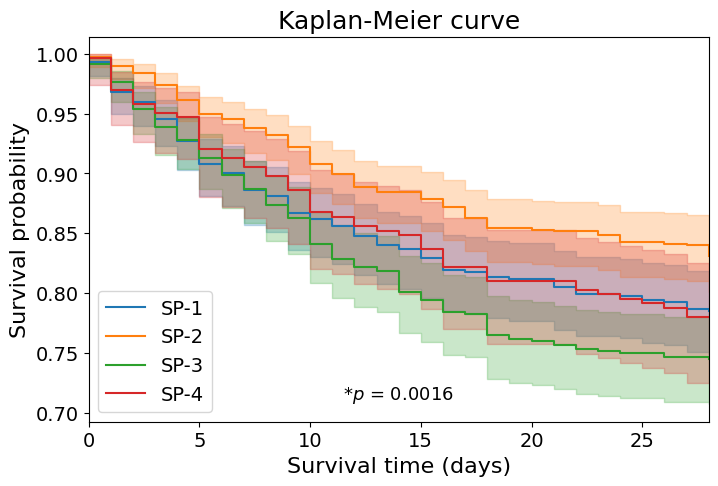

In [46]:
ClusterDFs = [Cluster1, Cluster2, Cluster3, Cluster4]
survivalR, length_survivalR = KM_curve_creation(ClusterDFs, 28)

In [31]:
# from lifelines import KaplanMeierFitter
# import matplotlib.pyplot as plt
# from matplotlib import style 
# from lifelines.statistics import multivariate_logrank_test
# from matplotlib.offsetbox import AnchoredText
# def KM_curve_creation(ClusterDFs, day_mortality=28, ci_display=True):
#     # ClusterDFs: list of all cluster dataframes
#     # day_mortality: duration of mortality to be displayed (default: 28)
#     # ci_display: Show confidence interval (default: True)
#     # plt.figure(figsize=(8,5))
#     fig, ax = plt.subplots(figsize=(8,5))
#     survivalR = []
#     length_survivalR = []
#     ClusterDF_death_all = pd.DataFrame([])
#     for i, ClusterDF in enumerate(ClusterDFs):
#         ClusterDF_death = ClusterDF.copy() #merge(s_dead1,on=['studyID','disch_date'],how='left') #Intersection 
#         ClusterDF_death['disch_date'] = pd.to_datetime(ClusterDF_death['disch_date'])
#         ClusterDF_death['t_sepsis'] = pd.to_datetime(ClusterDF_death['t_sepsis'])
#         ClusterDF_death = ClusterDF_death[['studyID','t_sepsis','disch_date']].drop_duplicates()
#         ClusterDF_death['duration'] = (ClusterDF_death['disch_date'] - ClusterDF_death['t_sepsis']).dt.days
#         ClusterDF_death = ClusterDF_death[['studyID','duration']]
#         ClusterDF_death['death'] = np.array(~ClusterDF_death['duration'].isnull(),dtype='int')
#         ClusterDF_death.index = ClusterDF_death['studyID']
#         ClusterDF_death.drop(['studyID'],axis=1, inplace=True)
#         ClusterDF_death.duration.clip(lower=0,inplace=True) #outlier correction 
#         ClusterDF_death['duration'] = ClusterDF_death['duration'].fillna(ClusterDF_death.duration.max() + 1000000) #replace Nan with max+1: these patient are not dead
#         ClusterDF_death['phenotype'] = i
        
#         #print(ClusterDF_death['death'].value_counts(), len(ClusterDF_death))
#         lbl = ['SP-1','SP-2','SP-3','SP-4']
#         #break;
    
#         kmf = KaplanMeierFitter() 
#         kmf.fit(ClusterDF_death['duration'], ClusterDF_death['death'], label=lbl[i])
#         kmf.plot(loc=slice(0,day_mortality), ci_show=ci_display)
#         # surR = list(kmf.survival_function_.KM_estimate) 
#         # survivalR = np.append(survivalR, surR)
#         # length_survivalR = np.append(length_survivalR, len(surR)) 
        
#         ClusterDF_death_all = pd.concat([ClusterDF_death_all, ClusterDF_death])
        
#     p = multivariate_logrank_test(ClusterDF_death_all['duration'], ClusterDF_death_all['phenotype'], ClusterDF_death_all['death'])
#     if np.max([p.p_value, 0.0001]) == 0.0001: p_approx = '$p$ < '+str(0.0001)
#     else: p_approx = '$*p$ = '+str(np.round(p.p_value, 4))
#     ax.add_artist(AnchoredText(p_approx, frameon=False, loc='lower center', prop=dict(size=13)))
#     plt.title("Kaplan-Meier curve")
#     plt.xlabel("Survival time (days)")
#     plt.ylabel("Survival probability")
#     plt.legend(loc='lower left', prop=dict(size=14))
#     plt.xlim([0, day_mortality])

    
#     plt.rc('axes', titlesize=18)
#     plt.rc('axes', labelsize=16)
#     plt.rc('xtick', labelsize=14)
#     plt.rc('ytick', labelsize=14)
#     plt.savefig("Figures/Sepsis_KM_allPats_physiomarkers_pittsICU.png", format="png", bbox_inches="tight", dpi=300)
#     plt.savefig("Figures/Sepsis_KM_allPats_physiomarkers_pittsICU.svg", format="svg", bbox_inches="tight", dpi=300)
#     plt.show()
#     return survivalR, length_survivalR

In [33]:
from lifelines import CoxPHFitter


def Cox_PH_28day(ClusterDFs, day_mortality=28):

    combined_df = pd.DataFrame([])
    labels = ['SP-1', 'SP-2', 'SP-3', 'SP-4']

    for i, ClusterDF in enumerate(ClusterDFs):

        df = ClusterDF.copy()

        df['t_sepsis'] = pd.to_datetime(df['t_sepsis'])
        df['disch_date'] = pd.to_datetime(df['disch_date'])

        # Raw time-to-death
        df['raw_duration'] = (df['disch_date'] - df['t_sepsis']).dt.days

        # Event indicator
        df['event'] = df['death'].astype(int)

        # Administrative censoring at 28 days
        df['duration'] = np.where(
            df['event'] == 1,
            df['raw_duration'],
            day_mortality
        )

        df['duration'] = np.minimum(df['duration'], day_mortality)

        df['event'] = np.where(
            df['raw_duration'] <= day_mortality,
            df['event'],
            0
        )

        df['duration'] = df['duration'].clip(lower=0)

        df['phenotype'] = labels[i]

        combined_df = pd.concat([
            combined_df,
            df[['duration', 'event', 'phenotype']]
        ])

    # One-hot encode phenotype (SP-1 as reference)
    combined_df = pd.get_dummies(
        combined_df,
        columns=['phenotype'],
        drop_first=True
    )

    # Fit Cox model
    cph = CoxPHFitter()
    cph.fit(
        combined_df,
        duration_col='duration',
        event_col='event'
    )

    print("\nCox Proportional Hazards Model (28-day Mortality)\n")
    cph.print_summary()

    # Extract clean HR table
    hr_table = cph.summary[['exp(coef)', 'exp(coef) lower 95%', 
                            'exp(coef) upper 95%', 'p']]

    hr_table.columns = ['Hazard Ratio',
                        'CI Lower 95%',
                        'CI Upper 95%',
                        'p-value']

    return cph, hr_table


In [35]:
ClusterDFs = [Cluster1, Cluster2, Cluster3, Cluster4]
cph, hr_table = Cox_PH_28day(ClusterDFs, 28)


Cox Proportional Hazards Model (28-day Mortality)



<lifelines.CoxPHFitter: fitted with 2106 total observations, 1661 right-censored observations>
             duration col = 'duration'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 2106
number of events observed = 445
   partial log-likelihood = -3347.07
         time fit was run = 2026-02-19 20:51:35 UTC

---
                coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                       
phenotype_SP-2 -0.29      0.75      0.13           -0.54           -0.03                0.58                0.97
phenotype_SP-3  0.19      1.21      0.12           -0.05            0.43                0.95                1.54
phenotype_SP-4  0.02      1.02      0.16           -0.30            0.33                0.74                1.39

                cmp to     z    p  -log2(p)
covariate                                  
phenotype_SP-2    0.00 -2.20 0.03      5.18
phenotype_SP-3    0.00  1.57 0.12      3.11
phenotype_SP-4    0.00  0.09 0.92      0.11
---
Concordance = 0.51
Partial AIC = 6700.15
log-likelihood ratio test = 15.40 on 3 df
-log2(p) of ll-ratio test = 9.38

In [36]:
cph

<lifelines.CoxPHFitter: fitted with 2106 total observations, 1661 right-censored observations>

In [37]:
hr_table

,Hazard Ratio,CI Lower 95%,CI Upper 95%,p-value
covariate,,,,
phenotype_SP-2,0.751643,0.582967,0.969124,0.027676
phenotype_SP-3,1.212165,0.953654,1.540750,0.115903
phenotype_SP-4,1.015180,0.742337,1.388305,0.924843


## Feature Map

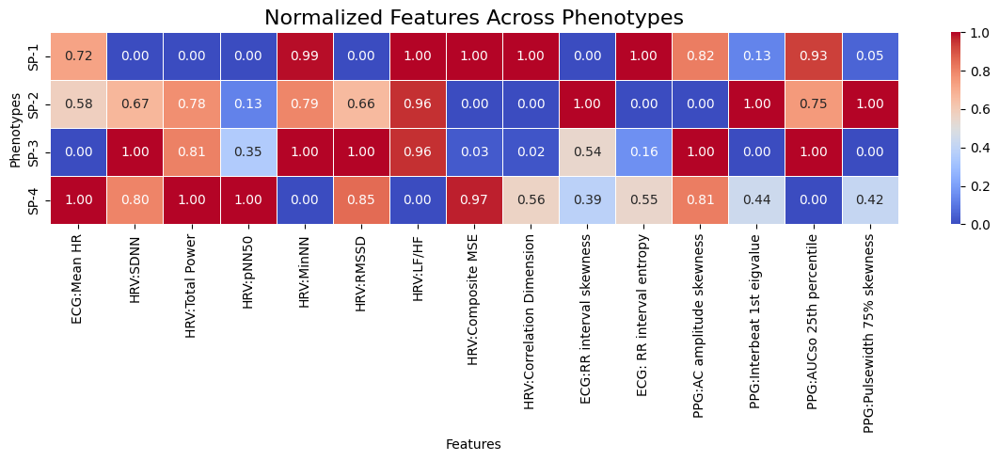

In [38]:
### Median



import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Cohorts mapping
cohorts = ['SP-1', 'SP-2', 'SP-3', 'SP-4']
# cohorts = [r'$\alpha$', r'$\beta$', r'$\gamma$', r'$\delta$']

# Features (mean values)
# data = {
#     'HRV_SDNN': [204.546, 24.042, 234.811, 316.776, 261.237],
#     'HRV_TP': [0.089, 0.041, 0.105, 0.104, 0.117],
#     'HRV_pNN50': [22.415, 3.708, 16.037, 28.059, 66.741],
#     'HRV_MinNN': [588.009, 626.745, 582.153, 620.280, 449.632],
#     'HRV_MaxNN': [2234.983, 782.279, 2823.931, 2809.057, 2503.062],
#     'HRV_RMSSD': [280.713, 28.758, 317.765, 439.289, 369.375],
#     'HRV_LFHF': [1.004, 1.074, 1.054, 0.989, 0.752],
#     'ECG_RR_Skewness': [3.998, 0.407, 6.821, 4.543, 2.969],
#     'ECG_RR_Entropy': [0.910, 1.689, 0.428, 0.604, 1.203],
#     'PPG_AC_mean': [0.356, 0.363, 0.376, 0.337, 0.329],
#     'PPG_PW75_mean': [195.223, 189.357, 183.846, 216.544, 190.783],
#     'PPG_AUCos_nu_mean': [0.152, 0.151, 0.140, 0.160, 0.167],
#     'PPG_AUCso_nu_mean': [0.339, 0.341, 0.329, 0.354, 0.324],
#     'PPG_ppgInterbeat_eigval1': [3.213, 2.865, 4.605, 2.039, 2.860]
# }

# Features (median values)
data = {
    'ECG:Mean HR': [87.925,86.066,78.513, 91.517],#'ECG_HR_bpm_mean'
    'HRV:SDNN':[9.280,184.614,271.662, 219.034],#'HRV_HRV_SDNN'
    'HRV:Total Power': [0.026,0.099,0.102, 0.120],#'HRV_HRV_TP'
    'HRV:pNN50':[0,9.028,25.362, 71.455],#'HRV_HRV_pNN50'
    'HRV:MinNN':[614,579,616, 436.5],#'HRV_HRV_MinNN'
    # HRV_HRV_MaxNN:[717.5,2357,2476],
    'HRV:RMSSD':[8.879,249.684,373.849, 320.049],#'HRV_HRV_RMSSD'
    'HRV:LF/HF':[0.790,0.781,0.781, 0.590],#'HRV_HRV_LFHF'
    'HRV:Composite MSE':[1.218,0.361,0.388, 1.196],#'HRV_HRV_CMSEn'
    'HRV:Correlation Dimension':[
    1.687,
    0.160,
    0.193, 1.022],#'HRV_HRV_CD'
    'ECG:RR interval skewness':[
    0.107,
    5.965,
    3.293, 2.364],#'ECG_T_rr_ms_skewness'
    'ECG: RR interval entropy':[
    1.928,
    0.332,
    0.590, 1.206],#'ECG_T_rr_ms_entropy'
    'PPG:AC amplitude skewness':[
    -0.384,
    -1.345,
    -0.167, -0.386],#'PPG_A_AC_skewness
    'PPG:Interbeat 1st eigvalue':[
    1.721,
    4.580,
    1.288, 2.733],#'PPG_ppgInterbeat_eigval1'
    # PPG_AUCos_nu_mean, median [IQR]
    # 0.149 [0.129,0.172]
    # 0.149 [0.129,0.170]
    # 0.139 [0.124,0.156]
    # 0.159 [0.135,0.185]
    # PPG_AUCso_nu_mean, median [IQR]
    # 0.336 [0.315,0.364]
    # 0.339 [0.318,0.368]
    # 0.330 [0.308,0.349]
    # 0.353 [0.330,0.380]
    'PPG:AUCso 25th percentile':[
    0.315,
    0.302,
    0.320, 0.248],#'PPG_AUCso_nu_p25'
    # PPG_PW_75_mean, median [IQR]
    # 187.629 [149.412,230.484]
    # 186.727 [142.227,222.181]
    # 180.212 [139.857,215.605]
    # 206.682 [171.576,259.800]
    'PPG:Pulsewidth 75% skewness':[
    0.563,
    2.540,
    0.448, 1.317]#'PPG_PW_75_skewness'

}


# Create dataframe
df = pd.DataFrame(data, index=cohorts)

# Normalize values for heatmap (0-1)
scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

# Plot heatmap
plt.figure(figsize=(12, 5))
plt.rcdefaults()


sns.heatmap(df_norm, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Normalized Features Across Phenotypes", fontsize=16)
plt.ylabel("Phenotypes")
plt.xlabel("Features")
plt.tight_layout()
plt.show()


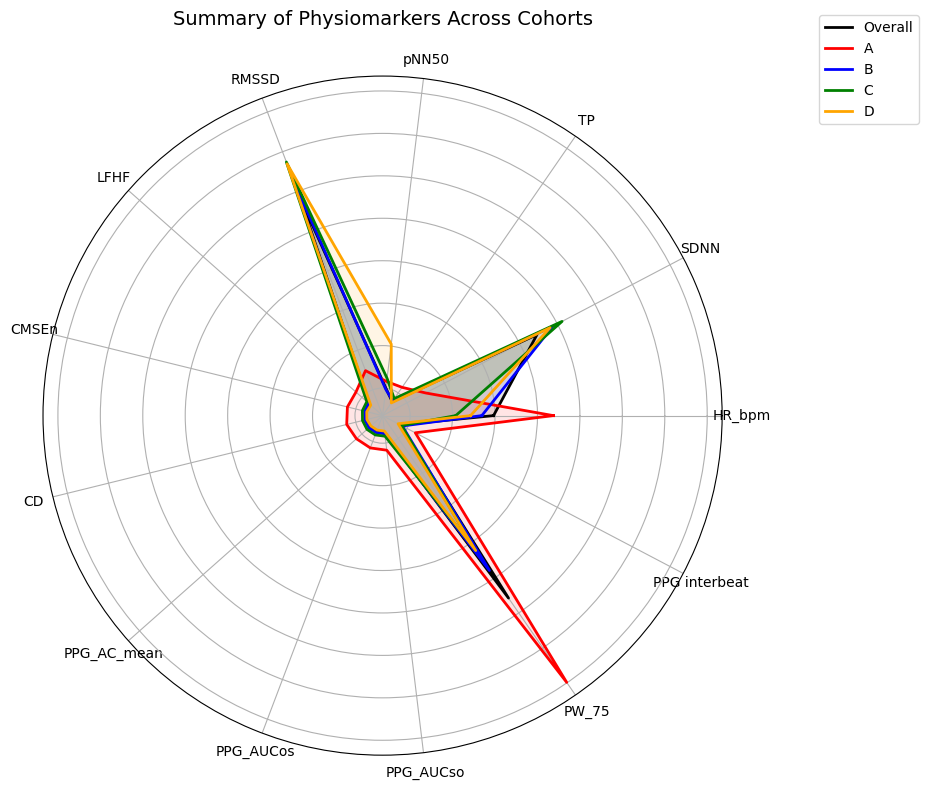

In [24]:
#### MEDIAN


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Cohort mapping
cohorts = ['Overall', 'A', 'B', 'C', 'D']

# Features: median values from your table (normalized later for plotting)
features = [
    'HR_bpm', 'SDNN', 'TP', 'pNN50', 'RMSSD',
    'LFHF', 'CMSEn', 'CD', 'PPG_AC_mean', 'PPG_AUCos',
    'PPG_AUCso', 'PW_75', 'PPG_interbeat'
]

# Median values per cohort 
data = {
    'Overall': [86.204, 144.351, 0.086, 9.795, 199.492, 0.786, 0.618, 0.387, 0.370, 0.149, 0.336, 187.629, 2.713],
    'A':       [87.925, 9.280, 0.026, 0.000, 8.879, 0.790, 1.218, 1.687, 0.373, 0.149, 0.339, 186.727, 1.721],
    'B':       [86.066, 184.614, 0.099, 9.028, 249.684, 0.781, 0.361, 0.160, 0.382, 0.139, 0.330, 180.212, 4.580],
    'C':       [78.513, 271.662, 0.102, 25.362, 373.849, 0.781, 0.388, 0.193, 0.370, 0.159, 0.353, 206.682, 1.288],
    'D':       [91.517, 219.034, 0.120, 71.455, 320.049, 0.590, 1.196, 1.022, 0.336, 0.163, 0.326, 187.296, 2.733]
}

# Convert to DataFrame
df = pd.DataFrame(data, index=features)

# Normalize for radar plot (0-1 scale)
# df_norm = (df - df.min()) / (df.max() - df.min())

df_norm = (df - df.mean())
df_norm = df_norm/df_norm.std()

# Radar plot setup
num_features = len(features)
angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

plt.figure(figsize=(10, 8))
ax = plt.subplot(111, polar=True)

# Plot each cohort
colors = ['black', 'red', 'blue', 'green', 'orange']
for i, cohort in enumerate(cohorts):
    values = df_norm[cohort].tolist()
    values += values[:1]  # Close the loop
    ax.plot(angles, values, color=colors[i], linewidth=2, label=cohort)
    ax.fill(angles, values, color=colors[i], alpha=0.1)

# Feature labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(features, fontsize=10)
ax.set_yticklabels([])  # Hide radial labels for clarity
ax.set_title('Summary of Physiomarkers Across Cohorts', fontsize=14, pad=20)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()


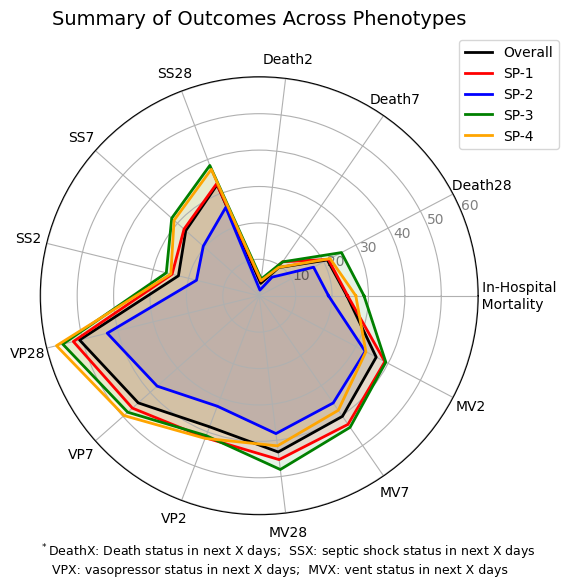

In [40]:
#### MEDIAN


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Cohort mapping
cohorts = ['Overall', 'SP-1', 'SP-2', 'SP-3', 'SP-4']

# Features: median values from your table (normalized later for plotting)
features = [
    '           In-Hospital \n       Mortality', 
    '     Death28', 'Death7', 'Death2', 
    'SS28', 'SS7', 'SS2',
    'VP28', 'VP7', 'VP2',
    'MV28', 'MV7', 'MV2'
]



# Percentage values per cohort 
data = {
    'Overall':   [24.07, 21.13, 9.4, 3.42, 32.61, 26.96, 22.86, 50.828, 44.388, 38.500, 43.238, 40.248, 36.293 ],
    'SP-1': [24.29, 21.45, 11.35, 4.08, 32.93, 27.59, 24.66, 52.586, 46.552, 41.724, 45.345, 42.931, 38.966 ],
    'SP-2':  [19.02, 16.86, 6.2, 1.56, 25.94, 20.53, 17.75, 42.996, 37.448, 32.455, 38.141, 35.784, 32.871 ],
    'SP-3': [28.77, 25.51, 11.3, 4.62, 38.27, 32.11, 26.29, 55.574, 48.253, 41.098, 48.087, 43.927, 39.268],
    'SP-4': [26.52, 21.97, 9.47, 4.17, 37.13, 31.25, 25, 57.353, 49.632, 41.912, 41.544, 38.235, 33.088]
}

# Convert to DataFrame
df = pd.DataFrame(data, index=features)

df_norm = df.copy()

# # Normalize for radar plot (0-1 scale)
# # df_norm = (df - df.min()) / (df.max() - df.min())

# df_norm = (df - df.mean())
# df_norm = df_norm/df_norm.std()

# Radar plot setup
num_features = len(features)
angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

plt.figure(figsize=(8, 6))
ax = plt.subplot(111, polar=True)

# Plot each cohort
colors = ['black', 'red', 'blue', 'green', 'orange']
for i, cohort in enumerate(cohorts):
    values = df_norm[cohort].tolist()
    values += values[:1]  # Close the loop
    ax.plot(angles, values, color=colors[i], linewidth=2, label=cohort)
    ax.fill(angles, values, color=colors[i], alpha=0.1)

# Feature labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(features, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), alpha=0.5)
# ax.set_yticklabels([])  # Hide radial labels for clarity
ax.set_title('Summary of Outcomes Across Phenotypes', fontsize=14, pad=20)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.text(
    0.00001, -0.14,
    "$^*$DeathX: Death status in next X days;  "
    "SSX: septic shock status in next X days\n"
    "   VPX: vasopressor status in next X days;  "
    "MVX: vent status in next X days",
    transform=plt.gca().transAxes,
    fontsize=9,
    ha='left',
    va='bottom',
)
plt.tight_layout()
plt.show()


## ECHO notes availability (cardiac injury) in next 24 hrs

In [26]:
df_echo = pd.read_csv(
    "./Data_folder/Event_Table/echo_notes_pitts.csv",
    # sep="\t",
    # engine="python",
    # quoting=0,          # csv.QUOTE_MINIMAL
    on_bad_lines="warn" #"skip"
)


In [27]:
df_echo.columns

Index(['note_row', 'Study_id', 'FIN_study_id', 'note_title', 'note_text',
       'rec_type', 'diagnosis', 'note_dt', 'procedure_dt', 'order_dt',
       'note_source_value', 'accession', 'title'],
      dtype='object')

In [28]:
df_echo

,note_row,Study_id,FIN_study_id,note_title,note_text,rec_type,diagnosis,note_dt,procedure_dt,order_dt,note_source_value,accession,title
0,9356,NaN,1061111,Anes-Echo Note,"Report ID\tPatient ID 58,5e2sUVnDw45X\t5e2sUVn...",OP,NaN,2023-04-06 16:22:00.000,NaN,NaN,NaN,NaN,ECHO
1,4143,NaN,1061011,Anes-Echo Note,"Report ID\tPatient ID 19,m/8WsZd4yTaa\tm/8WsZd...",OP,NaN,2022-01-23 16:30:00.000,NaN,NaN,NaN,NaN,ECHO
2,12442,NaN,1061168,Anes-Echo Note,"Report ID\tPatient ID 67,UazjujEZZQme\tUazjujE...",OP,NaN,2023-03-18 20:48:00.000,NaN,NaN,NaN,NaN,ECHO
3,12956,NaN,1061181,Anes-Echo Note,"Report ID\tPatient ID 27,6VyeUYZJ1RQc\t6VyeUYZ...",OP,NaN,2023-04-08 10:04:00.000,NaN,NaN,NaN,NaN,ECHO
4,23573,NaN,1061356,Anes-Echo Note,"Report ID\tPatient ID 50,dQI1r3NVG0WW\tdQI1r3N...",OP,NaN,2022-08-18 21:20:00.000,NaN,NaN,NaN,NaN,ECHO
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,1328982,NaN,1004753,ECTEE,"Report ID\tPatient ID 63,aUsjDDBTQD+d\taUsjDDB...",ECHO,NaN,2019-09-26 12:29:00.000,NaN,NaN,NaN,NaN,ECHO
1262,1328980,NaN,1004753,ECTEE,"Report ID\tPatient ID 61,aUsjDDBTQD+d\taUsjDDB...",ECHO,NaN,2019-10-04 01:06:00.000,NaN,NaN,NaN,NaN,ECHO
1263,1330190,NaN,1006724,ECTEE,"Report ID\tPatient ID 64,J6y5OVctRvba\tJ6y5OVc...",ECHO,NaN,2020-07-04 03:23:00.000,NaN,NaN,NaN,NaN,ECHO
1264,1330354,NaN,1003845,ECTEE,"Report ID\tPatient ID 79,88nDkvo4sSbt\t88nDkvo...",ECHO,NaN,2020-04-27 01:21:00.000,NaN,NaN,NaN,NaN,ECHO


In [29]:
df_presepsis_5min.shape

(2174, 1197)

In [30]:
df_echo['note_dt'] = pd.to_datetime(df_echo['note_dt'])
df_echo['fin'] = df_echo['FIN_study_id'].astype('int')
df_presepsis_5min['fin'] = df_presepsis_5min['fin'].astype('int')

In [ ]:
df_presepsis_5min_postecho = df_presepsis_5min.merge(df_echo, how='left', on=['fin'])
df_presepsis_5min_postecho['note_dt'] = pd.to_datetime(df_presepsis_5min_postecho['note_dt'])
df_presepsis_5min_postecho['t_sepsis'] = pd.to_datetime(df_presepsis_5min_postecho['t_sepsis'])
df_presepsis_5min_postecho.drop(columns=['Unnamed: 0.1','Unnamed: 0','index'], inplace=True)
df_presepsis_5min_postecho

In [32]:
df_presepsis_5min_postecho[df_presepsis_5min_postecho.title=='ECHO'].fin.nunique()

164

In [33]:
df_presepsis_5min_postecho['ECHO_status'] = np.array([1 if x == 'ECHO' else 0 for x in df_presepsis_5min_postecho.title])
df_presepsis_5min_postecho['ECHO_status']

0       0
1       0
2       0
3       1
4       0
       ..
2218    0
2219    0
2220    0
2221    0
2222    0
Name: ECHO_status, Length: 2223, dtype: int64

In [ ]:
'''
Fetching next 2/7/28-day cardiac injury status identified by ECHO after S3 onset.
'''
df_presepsis_5min_postecho['del_T_echo_post'] = df_presepsis_5min_postecho['note_dt'] - df_presepsis_5min_postecho['t_sepsis']

# Keep echo event AFTER sepsis and within 2days (2*24h)
df_echo_post1d = df_presepsis_5min_postecho[
    (df_presepsis_5min_postecho['del_T_echo_post'] >= pd.Timedelta(hours=0)) &
    (df_presepsis_5min_postecho['del_T_echo_post'] <= pd.Timedelta(hours=24))
].copy()
df_echo_post1d = df_echo_post1d[['fin','ECHO_status']].drop_duplicates()
df_echo_post1d = df_presepsis_5min[['fin','year_sepsis','studyID','ss28','ss7', 'ss2','vp28','vp7','vp2','v28', 'v7','v2','label']].merge(df_echo_post1d, how='left', on=['fin'])
df_echo_post1d['ci1'] = 1-df_echo_post1d['ECHO_status'].isnull().astype(int)
df_echo_post1d

In [ ]:
'''
Fetching next 2/7/28-day cardiac injury status identified by ECHO after S3 onset.
'''
df_presepsis_5min_postecho['del_T_echo_post'] = df_presepsis_5min_postecho['note_dt'] - df_presepsis_5min_postecho['t_sepsis']

# Keep echo event AFTER sepsis and within 2days (2*24h)
df_echo_post2d = df_presepsis_5min_postecho[
    (df_presepsis_5min_postecho['del_T_echo_post'] >= pd.Timedelta(hours=0)) &
    (df_presepsis_5min_postecho['del_T_echo_post'] <= pd.Timedelta(hours=2*24))
].copy()
df_echo_post2d = df_echo_post2d[['fin','ECHO_status']].drop_duplicates()
df_echo_post2d = df_presepsis_5min[['fin','year_sepsis','studyID','ss28','ss7', 'ss2','vp28','vp7','vp2','v28', 'v7','v2','label']].merge(df_echo_post2d, how='left', on=['fin'])
df_echo_post2d['ci2'] = 1-df_echo_post2d['ECHO_status'].isnull().astype(int)
df_echo_post2d

In [ ]:
'''
Fetching next 2/7/28-day cardiac injury status identified by ECHO after S3 onset.
'''
df_presepsis_5min_postecho['del_T_echo_post'] = df_presepsis_5min_postecho['note_dt'] - df_presepsis_5min_postecho['t_sepsis']

# Keep echo event AFTER sepsis and within 2days (2*24h)
df_echo_post7d = df_presepsis_5min_postecho[
    (df_presepsis_5min_postecho['del_T_echo_post'] >= pd.Timedelta(hours=0)) &
    (df_presepsis_5min_postecho['del_T_echo_post'] <= pd.Timedelta(hours=7*24))
].copy()
df_echo_post7d = df_echo_post7d[['fin','ECHO_status']].drop_duplicates()
df_echo_post7d = df_presepsis_5min[['fin','year_sepsis','studyID','ss28','ss7', 'ss2','vp28','vp7','vp2','v28', 'v7','v2','label']].merge(df_echo_post7d, how='left', on=['fin'])
df_echo_post7d['ci7'] = 1-df_echo_post7d['ECHO_status'].isnull().astype(int)
df_echo_post7d

In [ ]:
'''
Fetching next 2/7/28-day cardiac injury status identified by ECHO after S3 onset.
'''
df_presepsis_5min_postecho['del_T_echo_post'] = df_presepsis_5min_postecho['note_dt'] - df_presepsis_5min_postecho['t_sepsis']

# Keep echo event AFTER sepsis and within 2days (2*24h)
df_echo_post28d = df_presepsis_5min_postecho[
    (df_presepsis_5min_postecho['del_T_echo_post'] >= pd.Timedelta(hours=0)) &
    (df_presepsis_5min_postecho['del_T_echo_post'] <= pd.Timedelta(hours=28*24))
].copy()
df_echo_post28d = df_echo_post28d[['fin','ECHO_status']].drop_duplicates()
df_echo_post28d = df_presepsis_5min[['fin','year_sepsis','studyID','ss28','ss7', 'ss2','vp28','vp7','vp2','v28', 'v7','v2','label']].merge(df_echo_post28d, how='left', on=['fin'])
df_echo_post28d['ci28'] = 1-df_echo_post28d['ECHO_status'].isnull().astype(int)
df_echo_post28d['ci7'] = df_echo_post7d['ci7'].values
df_echo_post28d['ci2'] = df_echo_post2d['ci2'].values
df_echo_post28d['ci1'] = df_echo_post1d['ci1'].values
df_echo_post28d

In [44]:

from tableone import TableOne

colss = [#'vpfd28', 'vpfd7', 'vpfd2', 'vfd28', 'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2',
        'ss28','ss7', 'ss2',  'vp28', 'vp7','vp2','v28', 'v7','v2','ci28','ci7','ci2','ci1']
categorical=['ss28','ss7', 'ss2','vp28', 'vp7','vp2','v28', 'v7','v2','ci28','ci7','ci2','ci1']
nonnormal = []
groupby = 'label'
TableOne_med = TableOne(df_echo_post28d.copy(), decimals=3, missing=False, groupby=groupby, columns=colss, categorical=categorical,pval=True, htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med

Grouped by label                                                                                                           
                         Overall             0             1             2             3 P-Value                                       Test
n                           2174           580           721           601           272                                                   
ss28, n (%) 0.0    1465 (67.387)  389 (67.069)  534 (74.064)  371 (61.730)  171 (62.868)  <0.001                                Chi-squared
            1.0     709 (32.613)  191 (32.931)  187 (25.936)  230 (38.270)  101 (37.132)                                                   
ss7, n (%)  0.0    1588 (73.045)  420 (72.414)  573 (79.473)  408 (67.887)  187 (68.750)  <0.001                                Chi-squared
            1.0     586 (26.955)  160 (27.586)  148 (20.527)  193 (32.113)   85 (31.250)                                                   
ss2, n (%)  0.0    1677 (77.139)  437 (75.345)  593 (82.247)  443 (73.710)  204 (75.000)  <0.001                                Chi-squared
            1.0     497 (22.861)  143 (24.655)  128 (17.753)  158 (26.290)   68 (25.000)                                                   
vp28, n (%) 0.0    1069 (49.172)  275 (47.414)  411 (57.004)  267 (44.426)  116 (42.647)  <0.001                                Chi-squared
            1.0    1105 (50.828)  305 (52.586)  310 (42.996)  334 (55.574)  156 (57.353)                                                   
vp7, n (%)  0.0    1209 (55.612)  310 (53.448)  451 (62.552)  311 (51.747)  137 (50.368)  <0.001                                Chi-squared
            1.0     965 (44.388)  270 (46.552)  270 (37.448)  290 (48.253)  135 (49.632)                                                   
vp2, n (%)  0.0    1337 (61.500)  338 (58.276)  487 (67.545)  354 (58.902)  158 (58.088)  <0.001                                Chi-squared
            1.0     837 (38.500)  242 (41.724)  234 (32.455)  247 (41.098)  114 (41.912)                                                   
v28, n (%)  0.0    1234 (56.762)  317 (54.655)  446 (61.859)  312 (51.913)  159 (58.456)   0.002                                Chi-squared
            1.0     940 (43.238)  263 (45.345)  275 (38.141)  289 (48.087)  113 (41.544)                                                   
v7, n (%)   0.0    1299 (59.752)  331 (57.069)  463 (64.216)  337 (56.073)  168 (61.765)   0.009                                Chi-squared
            1.0     875 (40.248)  249 (42.931)  258 (35.784)  264 (43.927)  104 (38.235)                                                   
v2, n (%)   0.0    1385 (63.707)  354 (61.034)  484 (67.129)  365 (60.732)  182 (66.912)   0.030                                Chi-squared
            1.0     789 (36.293)  226 (38.966)  237 (32.871)  236 (39.268)   90 (33.088)                                                   
ci28, n (%) 0      2022 (93.008)  536 (92.414)  673 (93.343)  555 (92.346)  258 (94.853)   0.519                                Chi-squared
            1        152 (6.992)    44 (7.586)    48 (6.657)    46 (7.654)    14 (5.147)                                                   
ci7, n (%)  0      2071 (95.262)  552 (95.172)  687 (95.284)  566 (94.176)  266 (97.794)   0.142                                Chi-squared
            1        103 (4.738)    28 (4.828)    34 (4.716)    35 (5.824)     6 (2.206)                                                   
ci2, n (%)  0      2129 (97.930)  566 (97.586)  710 (98.474)  585 (97.338)  268 (98.529)   0.405                                Chi-squared
            1         45 (2.070)    14 (2.414)    11 (1.526)    16 (2.662)     4 (1.471)                                                   
ci1, n (%)  0      2144 (98.620)  569 (98.103)  715 (99.168)  590 (98.170)  270 (99.265)   0.216  Chi-squared (warning: expected count < 5)
            1         30 (1.380)    11 (1.897)     6 (0.832)    11 (1.830)     2 (0.735)

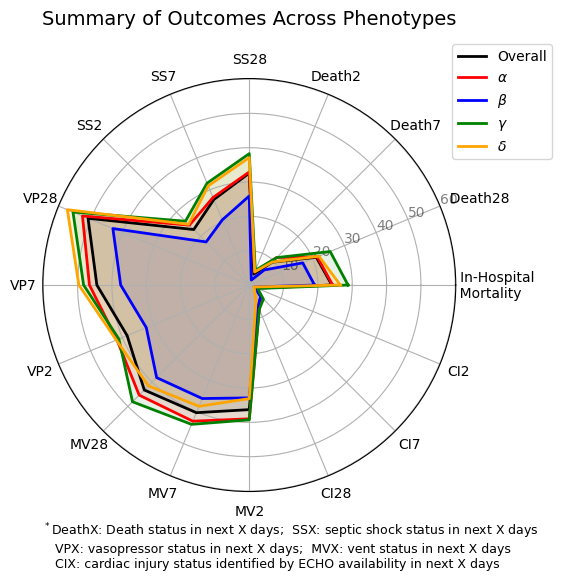

In [57]:
#### MEDIAN


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Cohort mapping
cohorts = ['Overall', r'$\alpha$', r'$\beta$', r'$\gamma$', r'$\delta$']

# Features: median values from your table (normalized later for plotting)
features = [
    '           In-Hospital \n       Mortality', 
    '          Death28', '   Death7', 'Death2', 
    'SS28', 'SS7', 'SS2',
    'VP28', 'VP7', 'VP2',
    'MV28', 'MV7', 'MV2',
    'CI28', 'CI7', 'CI2'
]



# Percentage values per cohort 
data = {
    'Overall':   [24.07, 21.13, 9.4, 3.42, 32.61, 26.96, 22.86, 50.828, 44.388, 38.500, 43.238, 40.248, 36.293, 6.99, 4.738, 2.070 ],
    r'$\alpha$': [24.29, 21.45, 11.35, 4.08, 32.93, 27.59, 24.66, 52.586, 46.552, 41.724, 45.345, 42.931, 38.966, 7.586, 4.828, 2.414 ],
    r'$\beta$':  [19.02, 16.86, 6.2, 1.56, 25.94, 20.53, 17.75, 42.996, 37.448, 32.455, 38.141, 35.784, 32.871, 6.657, 4.716, 1.526 ],
    r'$\gamma$': [28.77, 25.51, 11.3, 4.62, 38.27, 32.11, 26.29, 55.574, 48.253, 41.098, 48.087, 43.927, 39.268, 7.654, 5.824, 2.662],
    r'$\delta$': [26.52, 21.97, 9.47, 4.17, 37.13, 31.25, 25, 57.353, 49.632, 41.912, 41.544, 38.235, 33.088, 5.147, 2.206, 1.471]
}

# Convert to DataFrame
df = pd.DataFrame(data, index=features)

df_norm = df.copy()

# # Normalize for radar plot (0-1 scale)
# # df_norm = (df - df.min()) / (df.max() - df.min())

# df_norm = (df - df.mean())
# df_norm = df_norm/df_norm.std()

# Radar plot setup
num_features = len(features)
angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

plt.figure(figsize=(8, 6))
ax = plt.subplot(111, polar=True)

# Plot each cohort
colors = ['black', 'red', 'blue', 'green', 'orange']
for i, cohort in enumerate(cohorts):
    values = df_norm[cohort].tolist()
    values += values[:1]  # Close the loop
    ax.plot(angles, values, color=colors[i], linewidth=2, label=cohort)
    ax.fill(angles, values, color=colors[i], alpha=0.1)

# Feature labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(features, fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), alpha=0.5)
# ax.set_yticklabels([])  # Hide radial labels for clarity
ax.set_title('Summary of Outcomes Across Phenotypes', fontsize=14, pad=20)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1.1))
plt.text(
    0.00001, -0.19,
    "$^*$DeathX: Death status in next X days;  "
    "SSX: septic shock status in next X days\n"
    "   VPX: vasopressor status in next X days;  "
    "MVX: vent status in next X days\n"
    "   CIX: cardiac injury status identified by ECHO availability in next X days",
    transform=plt.gca().transAxes,
    fontsize=9,
    ha='left',
    va='bottom',
)
plt.tight_layout()
plt.show()


# CCI and Top comorbidities

**All ICD diagnosis codes recorded before or at the index time point (The index time point is:
admission and sepsis-3 time (time zero in your study))**


In [30]:
df_presepsis_5min['fin'] =  df_presepsis_5min['fin'].astype(int)
df_presepsis_5min['studyID'] =  df_presepsis_5min['studyID'].astype(str)
df_presepsis_5min.fin.nunique()

2174

In [31]:
df_icd_reg = pd.read_csv('Data_folder/Event_Table/EMR_icd_TYPE_Registration.csv')

In [32]:
df_icd_discharge = pd.read_csv('Data_folder/Event_Table/EMR_icd_TYPE_Discharge.csv')

In [33]:
df_icd_working = pd.read_csv('Data_folder/Event_Table/EMR_icd_TYPE_Working.csv')

In [34]:
df_icd_final = pd.read_csv('Data_folder/Event_Table/EMR_icd_TYPE_Final.csv')

In [35]:
df_icd_additional = pd.read_csv('Data_folder/Event_Table/EMR_icd_TYPE_Additional.csv')

In [36]:
def preprocess_icd(df_icd): #### Considering all before sepsis-3 time
    df_icd['fin'] =  df_icd['FIN_study_id'].astype(int)
    print(df_icd[df_icd.fin.isin(df_presepsis_5min.fin.unique())].fin.nunique())
    # df_icd.merge(df_presepsis_5min[['fin','label']], on='fin', how='inner').fin. nunique()
    df_icd_all = df_icd.merge(df_presepsis_5min[['fin','label','t_sepsis']], on='fin', how='inner')
    df_icd_all['t_sepsis'] = pd.to_datetime(df_icd_all['t_sepsis'])
    df_icd_all['CHART_DATE'] = pd.to_datetime(df_icd_all['CHART_DATE'])
    df_icd_all['del_icd_date'] = df_icd_all['t_sepsis'] - df_icd_all['CHART_DATE']
    df_icd_preprocessed = df_icd_all[df_icd_all['del_icd_date']>pd.Timedelta(hours=0)]
    return df_icd_preprocessed

In [37]:
df_icd_reg2 = preprocess_icd(df_icd_reg)
df_icd_reg2.fin.nunique()

2146


2132

In [38]:
df_icd_discharge2 = preprocess_icd(df_icd_discharge)
df_icd_discharge2.fin.nunique()

1544


779

In [39]:
df_icd_working2 = preprocess_icd(df_icd_working)
df_icd_working2.fin.nunique()

2093


1297

In [40]:
df_icd_final2 = preprocess_icd(df_icd_final)
df_icd_final2.fin.nunique()

2146


2132

In [41]:
df_icd_additional2 = preprocess_icd(df_icd_additional)
df_icd_additional2.fin.nunique()

965


722

In [42]:
df_icd_all = pd.concat([df_icd_additional2, df_icd_final2, df_icd_working2, df_icd_discharge2, df_icd_reg2]).reset_index()
df_icd_all.fin.nunique(), df_icd_all.shape

(2161, (153159, 17))

In [43]:
### Adding age too
demo = pd.read_csv('Data_folder/Event_Table/tcdemographics_mladi24_new.csv')
demo['studyID'] = demo.study_id.astype('str')
demo['fin'] = demo.FIN_study_id.astype('int')
demo.drop_duplicates(inplace=True)
demo.reset_index(inplace=True, drop=True)
print(df_icd_all.merge(demo[['fin','age']], on='fin', how='inner').fin.nunique())
df_icd_all_age = df_icd_all.merge(demo[['fin','age']], on='fin', how='inner')

2161


In [44]:

from scipy.stats import chi2_contingency, kruskal

# =========================
# Load and preprocess data
# =========================
df = df_icd_all_age.copy()
df = df[df["CODE_TYPE"] == "ICD-10-CM"].copy()
df = df.dropna(subset=["fin", "CODE", "label"])
df["fin"] = df["fin"].astype(int)

df["CODE"] = (
    df["CODE"]
    .astype(str)
    .str.upper()
    .str.replace(".", "", regex=False)
)

phenotype_map = {0: "SP-1", 1: "SP-2", 2: "SP-3", 3: "SP-4"}
df["Phenotype"] = df["label"].map(phenotype_map)

# one phenotype + age per encounter
phenotype_df = (
    df[["fin", "Phenotype", "age"]]
    .drop_duplicates("fin")
)

codes_by_encounter = (
    df.groupby("fin")["CODE"]
    .apply(set)
    .reset_index(name="codes")
    .merge(phenotype_df, on="fin", how="left")
)

# =========================
# Quan ICD-10 mappings
# =========================
COMORBIDITIES = {
    "Myocardial infarction": ["I21","I22","I252"],
    "Congestive heart failure": ["I50"],
    "Peripheral vascular disease": ["I70","I71","I731","I738","I739","I771","I790","K551","K558","K559","Z958","Z959"],
    "Cerebrovascular disease": ["I60","I61","I62","I63","I64","I65","I66","I67","I68","I69","G45","G46"],
    "Dementia": ["F00","F01","F02","F03","G30"],
    "Chronic pulmonary disease": ["J40","J41","J42","J43","J44","J45","J46","J47","J60","J61","J62","J63","J64","J65","J66","J67"],
    "Rheumatologic disease": ["M05","M06","M32","M33","M34","M35","M36"],
    "Peptic ulcer disease": ["K25","K26","K27","K28"],
    "Mild liver disease": ["B18","K700","K701","K702","K703","K709","K713","K714","K715","K717","K73","K74"],
    "Diabetes": ["E10","E11","E12","E13","E14"],
    "Diabetes with complications": ["E102","E112","E122","E132","E142"],
    "Hemiplegia/paraplegia": ["G81","G82"],
    "Renal disease": ["N18","N19","N052","N053","N054","N055","N056","N057","N250","Z490","Z491","Z492","Z940","Z992"],
    "Any malignancy": [
        "C00","C01","C02","C03","C04","C05","C06","C07","C08","C09","C10","C11","C12","C13","C14",
        "C15","C16","C17","C18","C19","C20","C21","C22","C23","C24","C25","C26"
    ],
    "Moderate/severe liver disease": ["K704","K711","K721","K729","K765","K766","K767"],
    "Metastatic solid tumor": ["C77","C78","C79","C80"],
    "HIV/AIDS": ["B20","B21","B22","B24"],
}

# =========================
# Helpers
# =========================
def has_prefix(codes, prefixes):
    prefixes = tuple(prefixes)
    return any(code.startswith(prefixes) for code in codes)

# =========================
# Binary flags
# =========================
flags = codes_by_encounter[["fin", "Phenotype", "age"]].copy()

for name, prefixes in COMORBIDITIES.items():
    flags[name] = codes_by_encounter["codes"].apply(
        lambda c: has_prefix(c, prefixes)
    ).astype(int)

# =========================
# Charlson Comorbidity Index
# =========================
def compute_cci(row):
    score = 0
    score += row["Myocardial infarction"]
    score += row["Congestive heart failure"]
    score += row["Peripheral vascular disease"]
    score += row["Cerebrovascular disease"]
    score += row["Dementia"]
    score += row["Chronic pulmonary disease"]
    score += row["Rheumatologic disease"]
    score += row["Peptic ulcer disease"]

    if row["Moderate/severe liver disease"]:
        score += 3
    elif row["Mild liver disease"]:
        score += 1

    if row["Diabetes with complications"]:
        score += 2
    elif row["Diabetes"]:
        score += 1

    score += 2 * row["Hemiplegia/paraplegia"]
    score += 2 * row["Renal disease"]

    if row["Metastatic solid tumor"]:
        score += 6
    elif row["Any malignancy"]:
        score += 2

    score += 6 * row["HIV/AIDS"]
    return score

flags["CCI"] = flags.apply(compute_cci, axis=1)

# =========================
# Age-adjusted CCI (ACCI)
# =========================
def age_points(age):
    if pd.isna(age):
        return 0
    elif age < 50:
        return 0
    elif age < 60:
        return 1
    elif age < 70:
        return 2
    elif age < 80:
        return 3
    else:
        return 4

flags["Age_points"] = flags["age"].apply(age_points)
flags["ACCI"] = flags["CCI"] + flags["Age_points"]

# =========================
# TableOne-style summary
# =========================
rows = []

phenotypes = sorted(flags["Phenotype"].dropna().unique())
groups = {p: flags[flags["Phenotype"] == p] for p in phenotypes}

for var in COMORBIDITIES.keys():
    row = {"Variable": var}

    overall_n = flags[var].sum()
    row["Overall"] = f"{overall_n} ({100*overall_n/len(flags):.1f}%)"

    contingency = []
    for p in phenotypes:
        sub = groups[p]
        n = sub[var].sum()
        row[p] = f"{n} ({100*n/len(sub):.1f}%)"
        contingency.append([n, len(sub) - n])

    contingency = np.array(contingency)

    if np.any(contingency == 0):
        p_value = np.nan
    else:
        p_value = chi2_contingency(
            contingency,
            correction=False,
            lambda_="log-likelihood"
        )[1]

    row["p-value"] = "NA" if np.isnan(p_value) else f"{p_value:.3f}"
    rows.append(row)


####### --------------------
######## CCI row (median IQR)
row = {"Variable": "Charlson Comorbidity Index"}

row["Overall"] = (
    f"{flags['CCI'].median():.2g} "
    f"({flags['CCI'].quantile(0.25):.2g}, {flags['CCI'].quantile(0.75):.2g})"
)

kw_groups = []
for p in phenotypes:
    sub = groups[p]["CCI"]
    row[p] = f"{sub.median():.2g} ({sub.quantile(0.25):.2g}, {sub.quantile(0.75):.2g})"
    kw_groups.append(sub)

row["p-value"] = f"{kruskal(*kw_groups)[1]:.3f}"
rows.append(row)
####### --------------------

# ---- ACCI row ----
row = {"Variable": "Age-adjusted Charlson Comorbidity Index"}

row["Overall"] = (
    f"{flags['ACCI'].median():.1f} "
    f"({flags['ACCI'].quantile(0.25):.1f}, "
    f"{flags['ACCI'].quantile(0.75):.1f})"
)

kw_groups = []
for p in phenotypes:
    sub = groups[p]["ACCI"]
    row[p] = (
        f"{sub.median():.1f} "
        f"({sub.quantile(0.25):.1f}, "
        f"{sub.quantile(0.75):.1f})"
    )
    kw_groups.append(sub)

row["p-value"] = f"{kruskal(*kw_groups)[1]:.3f}"
rows.append(row)

###### --------------------



table1 = pd.DataFrame(rows)
table1


,Variable,Overall,SP-1,SP-2,SP-3,SP-4,p-value
0,Myocardial infarction,375 (17.4%),97 (16.8%),111 (15.4%),100 (16.8%),67 (24.7%),0.010
1,Congestive heart failure,568 (26.3%),121 (21.0%),179 (24.9%),143 (24.1%),125 (46.1%),0.000
2,Peripheral vascular disease,282 (13.0%),69 (12.0%),77 (10.7%),83 (14.0%),53 (19.6%),0.003
3,Cerebrovascular disease,335 (15.5%),91 (15.8%),96 (13.4%),103 (17.3%),45 (16.6%),0.221
4,Dementia,108 (5.0%),20 (3.5%),41 (5.7%),20 (3.4%),27 (10.0%),0.000
5,Chronic pulmonary disease,726 (33.6%),177 (30.7%),258 (35.9%),183 (30.8%),108 (39.9%),0.014
6,Rheumatologic disease,91 (4.2%),26 (4.5%),31 (4.3%),29 (4.9%),5 (1.8%),0.139
7,Peptic ulcer disease,119 (5.5%),26 (4.5%),40 (5.6%),40 (6.7%),13 (4.8%),0.381
8,Mild liver disease,327 (15.1%),89 (15.4%),114 (15.9%),90 (15.2%),34 (12.5%),0.612
9,Diabetes,821 (38.0%),214 (37.1%),272 (37.8%),203 (34.2%),132 (48.7%),0.001


In [53]:
# ### df_icd_all = df_icd[df_icd.fin.isin(df_presepsis_5min.fin.unique())]

a_fin=df_presepsis_5min[df_presepsis_5min.label==0].fin.unique()
b_fin=df_presepsis_5min[df_presepsis_5min.label==1].fin.unique()
c_fin=df_presepsis_5min[df_presepsis_5min.label==2].fin.unique()
d_fin=df_presepsis_5min[df_presepsis_5min.label==3].fin.unique()

df_icd_a = df_icd_all[df_icd_all.fin.isin(a_fin)]
df_icd_b = df_icd_all[df_icd_all.fin.isin(b_fin)]
df_icd_c = df_icd_all[df_icd_all.fin.isin(c_fin)]
df_icd_d = df_icd_all[df_icd_all.fin.isin(d_fin)]

In [55]:
df_icd_a.DISP.value_counts()[:20] #alpha

DISP
                                                          28495
Acute posthemorrhagic anemia                                115
Acute kidney failure, unspecified                           114
Essential (primary) hypertension                            114
Anxiety disorder, unspecified                               102
Sepsis, unspecified organism                                100
Acute respiratory failure with hypoxia                       96
Acidosis                                                     96
Gastro-esophageal reflux disease without esophagitis         95
Hyperlipidemia, unspecified                                  94
Major depressive disorder, single episode, unspecified       92
Pneumonitis due to inhalation of food and vomit              84
Severe sepsis with septic shock                              81
Encounter for palliative care                                78
Long term (current) use of aspirin                           75
Unspecified protein-calorie malnutr

In [56]:
df_icd_b.DISP.value_counts()[:20] #beta

DISP
                                                                                   34829
Gastro-esophageal reflux disease without esophagitis                                 157
Acute kidney failure, unspecified                                                    152
Essential (primary) hypertension                                                     147
Acute respiratory failure with hypoxia                                               144
Acidosis                                                                             134
Acute posthemorrhagic anemia                                                         119
Major depressive disorder, single episode, unspecified                               119
Pneumonitis due to inhalation of food and vomit                                      118
Personal history of nicotine dependence                                              116
Anxiety disorder, unspecified                                                        114
Hyperlipidemia, 

In [57]:
df_icd_c.DISP.value_counts()[:20] #gamma

DISP
                                                                                   36332
Acidosis                                                                             112
Hyperlipidemia, unspecified                                                          105
Acute kidney failure, unspecified                                                    101
Essential (primary) hypertension                                                     100
Acute respiratory failure with hypoxia                                                98
Acute posthemorrhagic anemia                                                          95
Unspecified protein-calorie malnutrition                                              91
Gastro-esophageal reflux disease without esophagitis                                  87
Do not resuscitate                                                                    86
Encounter for palliative care                                                         86
Sepsis, unspecif

In [58]:
df_icd_d.DISP.value_counts()[:20] #delta

DISP
                                                                                   15299
Hyperlipidemia, unspecified                                                           86
Unspecified atrial fibrillation                                                       83
Atherosclerotic heart disease of native coronary artery without angina pectoris       75
Acute kidney failure, unspecified                                                     67
Long term (current) use of anticoagulants                                             64
Sepsis, unspecified organism                                                          61
Personal history of nicotine dependence                                               59
Long term (current) use of aspirin                                                    56
Acute posthemorrhagic anemia                                                          51
Acute respiratory failure with hypoxia                                                50
Acidosis        

# Characterize with labs

In [25]:
df_presepsis_5min['fin'] = df_presepsis_5min['fin'].astype('int')
df_presepsis_5min['studyID'] = df_presepsis_5min['studyID'].astype('str')


## Load labs and vital sign features

In [ ]:
path = '../pitts_emr_data'
labs1 = pd.read_csv(path + '/labs_Albumin.csv', low_memory=False)
labs2 = pd.read_csv(path + '/labs_AlkPhos.csv', low_memory=False)
labs3 = pd.read_csv(path + '/labs_ALT.csv', low_memory=False)
labs4 = pd.read_csv(path + '/labs_ArterialPh.csv', low_memory=False)
labs5 = pd.read_csv(path + '/labs_AST.csv', low_memory=False)
labs6 = pd.read_csv(path + '/labs_BaseDeficitArterial.csv', low_memory=False)
labs7 = pd.read_csv(path + '/labs_Bicarb.csv', low_memory=False)
labs8 = pd.read_csv(path + '/labs_BNP.csv', low_memory=False)
labs9 = pd.read_csv(path + '/labs_BUN.csv', low_memory=False)
labs10 = pd.read_csv(path + '/labs_Calcium.csv', low_memory=False)
labs11 = pd.read_csv(path + '/labs_Chloride.csv', low_memory=False)
labs12 = pd.read_csv(path + '/labs_Cr.csv', low_memory=False)
labs13 = pd.read_csv(path + '/labs_Glucose.csv', low_memory=False)
labs14 = pd.read_csv(path + '/labs_Hgb.csv', low_memory=False)
labs15 = pd.read_csv(path + '/labs_iCal.csv', low_memory=False)
labs16 = pd.read_csv(path + '/labs_INR.csv', low_memory=False)
labs17 = pd.read_csv(path + '/labs_Lactate.csv', low_memory=False)
labs18 = pd.read_csv(path + '/labs_Neut_perc.csv', low_memory=False)
labs19 = pd.read_csv(path + '/labs_PaO2.csv', low_memory=False)
labs20 = pd.read_csv(path + '/labs_Platelets.csv', low_memory=False)
labs21 = pd.read_csv(path + '/labs_PTT.csv', low_memory=False)
labs22 = pd.read_csv(path + '/labs_Sodium.csv', low_memory=False)
labs23 = pd.read_csv(path + '/labs_totalBl.csv', low_memory=False)
labs24 = pd.read_csv(path + '/labs_Troponin.csv', low_memory=False)
labs25 = pd.read_csv(path + '/labs_WBC.csv', low_memory=False)
labs26 = pd.read_csv(path + '/labs_Potassium.csv', low_memory=False)

df_labs = pd.concat([labs1,labs2,labs3,labs4,labs5,labs6,labs7,labs8,labs9,labs10,labs11,
     labs12,labs13,labs14,labs15,labs16,labs17,labs18,labs19,labs20,labs21,labs22,labs23,
     labs24,labs25,labs26])

df_labs['fin'] = df_labs.FIN_study_id.values
df_labs['studyID'] = df_labs.study_id.values
df_labs = df_labs[['fin', 'studyID','EVENT_DATE', 'eUTCOffset', 'ORDERED_AS','EVENT_DISP', 'RESULT_VAL', 'RESULT_UNIT', 'Labs']]
df_labs.drop_duplicates(inplace=True)
df_labs

In [27]:
df_labs['fin'] = df_labs['fin'].astype(int)
df_labs['studyID'] = df_labs['studyID'].astype(str)
# df_Sepsis_latest_wTarget['fin'] = df_Sepsis_latest_wTarget['fin'].astype(int)
# df_Sepsis_latest_wTarget['studyID'] = df_Sepsis_latest_wTarget['studyID'].astype(str)

In [28]:
df_labs0 = df_labs[df_labs.fin.isin(df_presepsis_5min.fin)]

In [ ]:
df_labs0

In [30]:
# df_Sepsis_latest_wTarget = df_Sepsis_latest_wTarget.drop(columns=['Unnamed: 0.1', 'Unnamed: 0', 'index', 'waveID',
#        'year_sepsis', 't_origin', 't_sepsis','studyID_y'], axis=1).drop_duplicates()

In [31]:
print("df_labs0['fin'] dtype:", df_labs0['fin'].dtype)
print("df_presepsis_5min['fin'] dtype:", df_presepsis_5min['fin'].dtype)

df_labs0['fin'] dtype: int64
df_presepsis_5min['fin'] dtype: int64


In [32]:
df_labs1 = df_labs0.merge(df_presepsis_5min, how='left', on=['fin']) #,'studyID'

In [36]:
# results = []

# chunk_size = 10000
# for i in range(0, df_labs0.shape[0], chunk_size):
#     chunk = df_labs0.iloc[i:i+chunk_size]
#     merged = chunk.merge(df_Sepsis_latest_wTarget, how='left', on='fin')
#     results.append(merged)

# df_labs1 = pd.concat(results, ignore_index=True)

In [37]:
# import dask.dataframe as dd

# ddf_labs0 = dd.from_pandas(df_labs0, npartitions=10)
# ddf_Sepsis = dd.from_pandas(df_Sepsis_latest_wTarget, npartitions=1)

# merged = ddf_labs0.merge(ddf_Sepsis, how='left', on='fin')
# df_labs1 = merged.compute()

In [ ]:
df_labs_f = df_labs1[~df_labs1['Unnamed: 0'].isnull()]
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])
# PT/INR Correction
df_labs_f['Labs'][(df_labs_f.Labs=='INR') & (df_labs_f.RESULT_UNIT=='sec')] = 'PT'
df_labs_f

In [34]:
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])

### Rolling Window Lab Averages Before Sepsis Onset

In [ ]:
'''
Fetching 6/12/24hr average lab value before to S3 onset.
'''


import pandas as pd

# --------------------------------------------------
# 1. Ensure datetime & numeric types
# --------------------------------------------------
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])
df_labs_f['RESULT_VAL'] = pd.to_numeric(df_labs_f['RESULT_VAL'], errors='coerce')

# --------------------------------------------------
# 2. Time difference (sepsis - lab time)
# --------------------------------------------------
df_labs_f['del_T_labs'] = df_labs_f['t_sepsis'] - df_labs_f['EVENT_DATE']

# Only keep labs BEFORE sepsis and within 24h max window
df_pre = df_labs_f[
    (df_labs_f['del_T_labs'] >= pd.Timedelta(hours=0)) &
    (df_labs_f['del_T_labs'] <= pd.Timedelta(hours=24))
].copy()

# --------------------------------------------------
# 3. Define rolling windows (in hours)
# --------------------------------------------------
windows = {
    'avg_6h_prior':  pd.Timedelta(hours=6),
    'avg_12h_prior': pd.Timedelta(hours=12),
    'avg_24h_prior': pd.Timedelta(hours=24)
}

# --------------------------------------------------
# 4. Compute rolling averages per window
# --------------------------------------------------
dfs = []

for suffix, window in windows.items():
    df_w = df_pre[df_pre['del_T_labs'] <= window]

    df_w_avg = (
        df_w
        .groupby(['fin', 'Labs'], as_index=False)['RESULT_VAL']
        .mean()
        .rename(columns={'RESULT_VAL': suffix})
    )

    dfs.append(df_w_avg)

# --------------------------------------------------
# 5. Merge all windows together
# --------------------------------------------------
from functools import reduce

df_features = reduce(
    lambda left, right: pd.merge(left, right, on=['fin', 'Labs'], how='outer'),
    dfs
)

# --------------------------------------------------
# 6. Pivot to wide format
# --------------------------------------------------
df_X = (
    df_features
    .pivot(index='fin', columns='Labs')
)

# Flatten column names: LABNAME_avg_6h, LABNAME_avg_12h, ...
df_X.columns = [
    f"{lab}_{stat}" for stat, lab in df_X.columns
]

df_X = df_X.reset_index()

# --------------------------------------------------
# 7. (Optional) Merge patient-level metadata
# --------------------------------------------------
meta_cols = ['fin', 't_sepsis', 'studyID_x','label']  # add others if needed
df_meta = df_labs_f[meta_cols].drop_duplicates('fin')

df_X = df_meta.merge(df_X, on='fin', how='left')
df_X

In [50]:
from tableone import TableOne

suffix = '_avg_24h_prior'

colss0 = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
colss = []
for k in colss0:
    colss.append(k+suffix)
categorical=[]
nonnormal = colss.copy()
groupby = 'label'
TableOne_med = TableOne(df_X.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
TableOne_med

Grouped by label                                                                                                    
                                                          Overall                  0                   1                  2                  3 P-Value           Test
n                                                            2152                575                 713                593                271                       
Albumin_avg_24h_prior, mean (SD)                    3.225 (0.674)      3.260 (0.697)       3.222 (0.667)      3.212 (0.694)      3.182 (0.586)   0.621  One-way ANOVA
AlkPhos_avg_24h_prior, mean (SD)                111.365 (111.778)  120.125 (139.981)   114.232 (117.350)   101.166 (75.453)   108.192 (95.010)   0.114  One-way ANOVA
ALT_avg_24h_prior, mean (SD)                     95.333 (356.868)  106.276 (369.572)    76.557 (313.276)  116.186 (422.159)   72.144 (251.842)   0.308  One-way ANOVA
ArterialPh_avg_24h_prior, mean (SD)                 7.340 (0.103)      7.344 (0.092)       7.339 (0.102)      7.330 (0.113)      7.356 (0.109)   0.429  One-way ANOVA
AST_avg_24h_prior, mean (SD)                    143.421 (555.032)  166.173 (568.070)   107.524 (359.053)  175.890 (738.426)  112.540 (439.833)   0.226  One-way ANOVA
BaseDeficitArterial_avg_24h_prior, mean (SD)        5.286 (4.417)      4.539 (3.579)       4.680 (3.979)      6.235 (5.110)      5.985 (4.828)   0.025  One-way ANOVA
Bicarb_avg_24h_prior, mean (SD)                    23.221 (5.966)     22.705 (5.792)      23.708 (6.108)     22.673 (5.599)     24.307 (6.537)  <0.001  One-way ANOVA
BNP_avg_24h_prior, mean (SD)                    671.659 (786.908)  651.066 (903.126)   609.144 (656.411)  827.232 (958.400)  636.114 (490.101)   0.412  One-way ANOVA
BUN_avg_24h_prior, mean (SD)                      32.358 (26.074)    32.994 (26.720)     29.750 (23.122)    32.060 (28.278)    38.590 (25.801)  <0.001  One-way ANOVA
Calcium_avg_24h_prior, mean (SD)                    9.205 (0.794)      9.194 (0.698)       9.283 (0.716)      9.065 (0.899)      9.367 (0.836)   0.053  One-way ANOVA
Chloride_avg_24h_prior, mean (SD)                 101.845 (7.212)    101.642 (7.184)     101.600 (7.171)    102.312 (7.062)    101.860 (7.712)   0.390  One-way ANOVA
Creatinine_avg_24h_prior, mean (SD)                 1.895 (2.099)      1.953 (1.934)       1.765 (1.957)      1.989 (2.546)      1.900 (1.602)   0.331  One-way ANOVA
Glucose_avg_24h_prior, mean (SD)                160.433 (100.331)  165.625 (105.429)   163.019 (112.907)   152.368 (83.657)   160.956 (87.274)   0.195  One-way ANOVA
Hgb_avg_24h_prior, mean (SD)                       11.259 (2.484)     11.435 (2.624)      11.305 (2.478)     11.211 (2.418)     10.882 (2.312)   0.057  One-way ANOVA
iCal_avg_24h_prior, mean (SD)                       1.119 (0.135)      1.126 (0.131)       1.132 (0.126)      1.090 (0.143)      1.142 (0.138)   0.103  One-way ANOVA
INR_avg_24h_prior, mean (SD)                        1.540 (0.993)      1.518 (0.852)       1.418 (0.549)      1.556 (1.027)      1.864 (1.732)  <0.001  One-way ANOVA
PT_avg_24h_prior, mean (SD)                        17.931 (7.844)     17.822 (7.089)      17.000 (4.900)     17.910 (7.973)    20.594 (12.984)  <0.001  One-way ANOVA
Lactate_avg_24h_prior, mean (SD)                    2.728 (2.675)      2.804 (2.661)       2.439 (2.188)      2.968 (3.045)      2.743 (2.883)   0.073  One-way ANOVA
Neut_perc_avg_24h_prior, mean (SD)                78.965 (13.067)    80.348 (11.563)     79.379 (12.479)    77.401 (14.199)    78.527 (14.472)   0.010  One-way ANOVA
PaO2_avg_24h_prior, mean (SD)                    150.709 (97.048)   159.884 (99.955)   141.695 (102.616)   155.827 (89.230)   141.311 (93.415)   0.361  One-way ANOVA
Platelets_avg_24h_prior, mean (SD)              221.365 (119.061)  228.386 (120.662)   213.705 (110.533)  231.850 (127.343)  203.238 (115.272)   0.006  One-way ANOVA
PTT_avg_24h_prior, mean (SD)                      35.870 (15.142)

In [51]:
suffix = '_avg_12h_prior'

colss0 = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
colss = []
for k in colss0:
    colss.append(k+suffix)
categorical=[]
nonnormal = colss.copy()
groupby = 'label'
TableOne_med = TableOne(df_X.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
TableOne_med

Grouped by label                                                                                                    
                                                          Overall                  0                   1                  2                  3 P-Value           Test
n                                                            2152                575                 713                593                271                       
Albumin_avg_12h_prior, mean (SD)                    3.205 (0.673)      3.231 (0.694)       3.211 (0.667)      3.179 (0.692)      3.196 (0.595)   0.785  One-way ANOVA
AlkPhos_avg_12h_prior, mean (SD)                113.222 (114.724)  122.586 (144.273)   116.692 (121.228)   102.216 (76.066)   108.867 (95.107)   0.106  One-way ANOVA
ALT_avg_12h_prior, mean (SD)                    100.930 (376.803)  114.542 (403.855)    80.873 (326.589)  122.588 (440.196)   74.322 (260.873)   0.319  One-way ANOVA
ArterialPh_avg_12h_prior, mean (SD)                 7.340 (0.105)      7.345 (0.091)       7.338 (0.103)      7.330 (0.116)      7.357 (0.111)   0.387  One-way ANOVA
AST_avg_12h_prior, mean (SD)                    152.196 (588.368)  178.121 (626.254)   112.987 (373.939)  187.361 (773.188)  118.401 (456.787)   0.235  One-way ANOVA
BaseDeficitArterial_avg_12h_prior, mean (SD)        5.300 (4.473)      4.450 (3.586)       4.735 (3.984)      6.340 (5.241)      5.975 (4.858)   0.019  One-way ANOVA
Bicarb_avg_12h_prior, mean (SD)                    23.126 (6.062)     22.621 (5.892)      23.652 (6.198)     22.483 (5.639)     24.278 (6.704)  <0.001  One-way ANOVA
BNP_avg_12h_prior, mean (SD)                    650.556 (739.220)  572.045 (748.784)   610.115 (641.259)  830.907 (967.166)  638.744 (479.475)   0.228  One-way ANOVA
BUN_avg_12h_prior, mean (SD)                      32.780 (26.316)    33.425 (26.834)     30.086 (23.234)    32.618 (28.807)    38.796 (26.026)   0.001  One-way ANOVA
Calcium_avg_12h_prior, mean (SD)                    9.197 (0.790)      9.177 (0.724)       9.284 (0.733)      9.054 (0.858)      9.352 (0.837)   0.055  One-way ANOVA
Chloride_avg_12h_prior, mean (SD)                 101.836 (7.326)    101.618 (7.222)     101.594 (7.258)    102.321 (7.239)    101.855 (7.910)   0.406  One-way ANOVA
Creatinine_avg_12h_prior, mean (SD)                 1.922 (2.132)      1.980 (1.950)       1.771 (1.972)      2.058 (2.624)      1.891 (1.604)   0.189  One-way ANOVA
Glucose_avg_12h_prior, mean (SD)                161.773 (102.018)  166.416 (106.523)   164.472 (115.004)   154.187 (85.421)   161.771 (88.781)   0.282  One-way ANOVA
Hgb_avg_12h_prior, mean (SD)                       11.205 (2.492)     11.406 (2.623)      11.215 (2.498)     11.147 (2.433)     10.883 (2.292)   0.095  One-way ANOVA
iCal_avg_12h_prior, mean (SD)                       1.119 (0.138)      1.125 (0.135)       1.136 (0.130)      1.088 (0.145)      1.141 (0.140)   0.088  One-way ANOVA
INR_avg_12h_prior, mean (SD)                        1.558 (1.028)      1.536 (0.883)       1.434 (0.555)      1.575 (1.077)      1.890 (1.798)  <0.001  One-way ANOVA
PT_avg_12h_prior, mean (SD)                        18.068 (8.055)     17.965 (7.341)      17.150 (4.947)     18.014 (8.197)    20.793 (13.411)  <0.001  One-way ANOVA
Lactate_avg_12h_prior, mean (SD)                    2.770 (2.730)      2.852 (2.715)       2.475 (2.243)      3.014 (3.102)      2.771 (2.922)   0.086  One-way ANOVA
Neut_perc_avg_12h_prior, mean (SD)                78.878 (13.360)    80.303 (11.766)     79.184 (12.783)    77.225 (14.757)    78.703 (14.412)   0.016  One-way ANOVA
PaO2_avg_12h_prior, mean (SD)                    151.133 (98.184)  159.396 (100.314)   142.919 (104.239)   156.305 (91.005)   141.794 (94.203)   0.450  One-way ANOVA
Platelets_avg_12h_prior, mean (SD)              221.317 (119.140)  228.309 (120.834)   213.767 (110.338)  230.912 (127.058)  205.117 (117.376)   0.018  One-way ANOVA
PTT_avg_12h_prior, mean (SD)                      36.282 (15.645)

In [52]:
suffix = '_avg_6h_prior'

colss0 = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
colss = []
for k in colss0:
    colss.append(k+suffix)
categorical=[]
nonnormal = colss.copy()
groupby = 'label'
TableOne_med = TableOne(df_X.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
TableOne_med

Grouped by label                                                                                                    
                                                        Overall                   0                  1                  2                  3 P-Value           Test
n                                                          2152                 575                713                593                271                       
Albumin_avg_6h_prior, mean (SD)                   3.204 (0.678)       3.202 (0.708)      3.214 (0.670)      3.188 (0.691)      3.217 (0.603)   0.961  One-way ANOVA
AlkPhos_avg_6h_prior, mean (SD)               113.638 (113.051)   123.991 (150.868)  117.898 (119.649)   102.639 (74.503)   106.066 (64.525)   0.096  One-way ANOVA
ALT_avg_6h_prior, mean (SD)                   107.503 (402.238)   126.620 (439.188)   84.409 (348.258)  127.873 (465.290)   82.512 (278.572)   0.379  One-way ANOVA
ArterialPh_avg_6h_prior, mean (SD)                7.339 (0.107)       7.344 (0.093)      7.339 (0.105)      7.327 (0.119)      7.353 (0.111)   0.429  One-way ANOVA
AST_avg_6h_prior, mean (SD)                   162.824 (626.891)   194.918 (670.587)  116.364 (392.330)  201.026 (825.815)  131.713 (488.088)   0.244  One-way ANOVA
BaseDeficitArterial_avg_6h_prior, mean (SD)       5.496 (4.569)       4.542 (3.577)      4.984 (4.085)      6.594 (5.366)      6.029 (4.954)   0.023  One-way ANOVA
Bicarb_avg_6h_prior, mean (SD)                   22.992 (6.200)      22.461 (6.104)     23.474 (6.377)     22.318 (5.739)     24.395 (6.637)  <0.001  One-way ANOVA
BNP_avg_6h_prior, mean (SD)                   662.740 (754.910)   562.150 (740.109)  618.108 (661.721)  864.580 (991.255)  658.583 (493.785)   0.168  One-way ANOVA
BUN_avg_6h_prior, mean (SD)                     33.316 (26.393)     33.545 (26.339)    30.868 (22.770)    33.011 (29.378)    39.677 (27.103)   0.003  One-way ANOVA
Calcium_avg_6h_prior, mean (SD)                   9.207 (0.799)       9.116 (0.680)      9.348 (0.738)      9.043 (0.898)      9.410 (0.847)   0.009  One-way ANOVA
Chloride_avg_6h_prior, mean (SD)                101.736 (7.412)     101.627 (7.290)    101.341 (7.487)    102.227 (7.190)    101.881 (7.947)   0.378  One-way ANOVA
Creatinine_avg_6h_prior, mean (SD)                1.974 (2.218)       2.036 (2.024)      1.833 (2.076)      2.099 (2.726)      1.920 (1.601)   0.341  One-way ANOVA
Glucose_avg_6h_prior, mean (SD)               164.904 (105.717)   168.662 (109.337)  168.957 (120.778)   157.906 (89.637)   162.216 (88.551)   0.371  One-way ANOVA
Hgb_avg_6h_prior, mean (SD)                      11.188 (2.524)      11.473 (2.708)     11.189 (2.507)     11.063 (2.446)     10.877 (2.303)   0.045  One-way ANOVA
iCal_avg_6h_prior, mean (SD)                      1.116 (0.136)       1.123 (0.133)      1.132 (0.134)      1.088 (0.144)      1.131 (0.125)   0.199  One-way ANOVA
INR_avg_6h_prior, mean (SD)                       1.571 (1.067)       1.517 (0.836)      1.442 (0.566)      1.600 (1.132)      1.943 (1.916)  <0.001  One-way ANOVA
PT_avg_6h_prior, mean (SD)                       18.156 (8.303)      17.818 (6.986)     17.229 (5.036)     18.190 (8.587)    21.179 (14.245)  <0.001  One-way ANOVA
Lactate_avg_6h_prior, mean (SD)                   2.830 (2.826)       2.896 (2.771)      2.507 (2.315)      3.120 (3.233)      2.816 (3.039)   0.069  One-way ANOVA
Neut_perc_avg_6h_prior, mean (SD)               79.088 (13.620)     80.536 (12.210)    79.321 (13.328)    77.197 (15.013)    79.567 (13.633)   0.018  One-way ANOVA
PaO2_avg_6h_prior, mean (SD)                   151.945 (98.756)    156.707 (97.198)  146.709 (106.327)   158.772 (93.580)   140.003 (95.489)   0.578  One-way ANOVA
Platelets_avg_6h_prior, mean (SD)             222.023 (118.719)   228.195 (122.975)  215.729 (109.552)  229.337 (123.488)  209.636 (120.752)   0.142  One-way ANOVA
PTT_avg_6h_prior, mean (SD)                     36.179 (15.246)     36.184 (15.967)    35.583 (13.948)    34.52

### Rolling Window Lab Averages After Sepsis Onset

In [ ]:
'''
Fetching 6/12/24hr average lab value after to S3 onset.
'''


import pandas as pd
from functools import reduce

# --------------------------------------------------
# 1. Ensure correct dtypes
# --------------------------------------------------
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])
df_labs_f['RESULT_VAL'] = pd.to_numeric(df_labs_f['RESULT_VAL'], errors='coerce')

# --------------------------------------------------
# 2. Time difference (lab time - sepsis time)
# --------------------------------------------------
df_labs_f['del_T_labs_post'] = df_labs_f['EVENT_DATE'] - df_labs_f['t_sepsis']

# Keep labs AFTER sepsis and within 24h
df_post = df_labs_f[
    (df_labs_f['del_T_labs_post'] >= pd.Timedelta(hours=0)) &
    (df_labs_f['del_T_labs_post'] <= pd.Timedelta(hours=24))
].copy()

# --------------------------------------------------
# 3. Define rolling windows
# --------------------------------------------------
windows = {
    'avg_6h_post':  pd.Timedelta(hours=6),
    'avg_12h_post': pd.Timedelta(hours=12),
    'avg_24h_post': pd.Timedelta(hours=24)
}

# --------------------------------------------------
# 4. Compute averages per window
# --------------------------------------------------
dfs = []

for suffix, window in windows.items():
    df_w = df_post[df_post['del_T_labs_post'] <= window]

    df_w_avg = (
        df_w
        .groupby(['fin', 'Labs'], as_index=False)['RESULT_VAL']
        .mean()
        .rename(columns={'RESULT_VAL': suffix})
    )

    dfs.append(df_w_avg)

# --------------------------------------------------
# 5. Merge windowed features
# --------------------------------------------------
df_features = reduce(
    lambda left, right: pd.merge(left, right, on=['fin', 'Labs'], how='outer'),
    dfs
)

# --------------------------------------------------
# 6. Pivot to wide format
# --------------------------------------------------
df_X_post = (
    df_features
    .pivot(index='fin', columns='Labs')
)

# Flatten column names: LAB_avg_6h_post, ...
df_X_post.columns = [
    f"{lab}_{stat}" for stat, lab in df_X_post.columns
]

df_X_post = df_X_post.reset_index()

# --------------------------------------------------
# 7. (Optional) Merge patient metadata
# --------------------------------------------------
meta_cols = ['fin', 't_sepsis', 'studyID_x', 'label']
df_meta = df_labs_f[meta_cols].drop_duplicates('fin')

df_X_post = df_meta.merge(df_X_post, on='fin', how='left')
df_X_post

In [56]:
suffix = '_avg_24h_post'

colss0 = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
colss = []
for k in colss0:
    colss.append(k+suffix)
categorical=[]
nonnormal = colss.copy()
groupby = 'label'
TableOne_med = TableOne(df_X_post.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
TableOne_med

Grouped by label                                                                                                    
                                                        Overall                   0                  1                  2                  3 P-Value           Test
n                                                          2152                 575                713                593                271                       
Albumin_avg_24h_post, mean (SD)                   2.950 (0.577)       2.928 (0.580)      2.976 (0.565)      2.930 (0.580)      2.972 (0.597)   0.609  One-way ANOVA
AlkPhos_avg_24h_post, mean (SD)               106.047 (120.474)   111.790 (163.265)  107.076 (111.378)    97.306 (74.168)  111.185 (120.764)   0.437  One-way ANOVA
ALT_avg_24h_post, mean (SD)                   119.097 (423.918)   135.862 (442.246)   98.264 (387.101)  128.291 (413.561)  117.730 (501.068)   0.666  One-way ANOVA
ArterialPh_avg_24h_post, mean (SD)                7.354 (0.079)       7.346 (0.076)      7.361 (0.077)      7.351 (0.086)      7.364 (0.077)   0.103  One-way ANOVA
AST_avg_24h_post, mean (SD)                   184.216 (667.374)   228.506 (755.703)  131.339 (440.724)  202.652 (743.596)  188.673 (781.546)   0.254  One-way ANOVA
BaseDeficitArterial_avg_24h_post, mean (SD)       4.893 (3.884)       5.005 (3.563)      4.663 (3.773)      5.135 (4.334)      4.432 (3.487)   0.453  One-way ANOVA
Bicarb_avg_24h_post, mean (SD)                   23.709 (5.458)      23.306 (5.189)     24.220 (5.589)     23.058 (5.273)     24.662 (5.827)  <0.001  One-way ANOVA
BNP_avg_24h_post, mean (SD)                   637.323 (823.672)   522.625 (703.562)  540.449 (861.061)  697.763 (696.109)  930.515 (991.443)   0.098  One-way ANOVA
BUN_avg_24h_post, mean (SD)                     31.752 (25.279)     31.996 (25.389)    30.035 (22.936)    31.369 (27.665)    36.621 (24.950)   0.009  One-way ANOVA
Calcium_avg_24h_post, mean (SD)                   9.125 (0.733)       9.052 (0.647)      9.167 (0.716)      9.068 (0.769)      9.302 (0.837)   0.055  One-way ANOVA
Chloride_avg_24h_post, mean (SD)                103.479 (6.792)     103.095 (6.595)    103.240 (6.901)    104.216 (6.759)    103.268 (6.903)   0.034  One-way ANOVA
Creatinine_avg_24h_post, mean (SD)                1.800 (1.906)       1.874 (1.883)      1.728 (1.836)      1.851 (2.185)      1.723 (1.402)   0.504  One-way ANOVA
Glucose_avg_24h_post, mean (SD)                146.721 (58.411)    150.366 (62.099)   146.814 (59.371)   145.430 (56.918)   141.620 (50.323)   0.271  One-way ANOVA
Hgb_avg_24h_post, mean (SD)                      10.567 (2.242)      10.643 (2.271)     10.657 (2.310)     10.480 (2.194)     10.369 (2.100)   0.246  One-way ANOVA
iCal_avg_24h_post, mean (SD)                      1.132 (0.113)       1.129 (0.114)      1.150 (0.112)      1.118 (0.115)      1.128 (0.107)   0.063  One-way ANOVA
INR_avg_24h_post, mean (SD)                       1.714 (1.176)       1.757 (1.151)      1.609 (1.002)      1.699 (1.247)      1.915 (1.403)   0.051  One-way ANOVA
PT_avg_24h_post, mean (SD)                       18.972 (7.895)      19.299 (7.921)     17.981 (5.577)     18.736 (8.204)    21.245 (10.867)  <0.001  One-way ANOVA
Lactate_avg_24h_post, mean (SD)                   2.330 (2.379)       2.343 (2.128)      2.083 (1.775)      2.631 (3.124)      2.230 (2.198)   0.016  One-way ANOVA
Neut_perc_avg_24h_post, mean (SD)               79.449 (12.753)     80.003 (12.155)    79.278 (11.988)    79.124 (13.356)    79.470 (14.382)   0.762  One-way ANOVA
PaO2_avg_24h_post, mean (SD)                   143.634 (70.466)    139.627 (65.273)   134.224 (68.008)   158.989 (74.373)   137.994 (72.588)  <0.001  One-way ANOVA
Platelets_avg_24h_post, mean (SD)             202.809 (109.627)   208.823 (110.782)   194.695 (98.083)  211.616 (119.902)  192.192 (110.506)   0.017  One-way ANOVA
PTT_avg_24h_post, mean (SD)                     39.298 (19.715)     40.174 (23.777)    39.047 (18.665)    37.76

In [57]:
suffix = '_avg_12h_post'

colss0 = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
colss = []
for k in colss0:
    colss.append(k+suffix)
categorical=[]
nonnormal = colss.copy()
groupby = 'label'
TableOne_med = TableOne(df_X_post.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
TableOne_med

Grouped by label                                                                                                    
                                                        Overall                   0                  1                  2                  3 P-Value           Test
n                                                          2152                 575                713                593                271                       
Albumin_avg_12h_post, mean (SD)                   3.001 (0.605)       2.970 (0.596)      3.026 (0.600)      2.990 (0.609)      3.026 (0.636)   0.694  One-way ANOVA
AlkPhos_avg_12h_post, mean (SD)               104.308 (100.049)   110.044 (134.812)   102.377 (87.752)   100.888 (76.911)   105.268 (91.551)   0.747  One-way ANOVA
ALT_avg_12h_post, mean (SD)                   116.713 (407.922)   120.182 (350.642)  105.132 (424.412)  120.820 (360.261)  130.890 (564.638)   0.938  One-way ANOVA
ArterialPh_avg_12h_post, mean (SD)                7.348 (0.085)       7.342 (0.081)      7.354 (0.082)      7.342 (0.092)      7.359 (0.082)   0.161  One-way ANOVA
AST_avg_12h_post, mean (SD)                   194.855 (689.422)   233.360 (764.241)  147.154 (508.550)  209.749 (738.947)  203.736 (813.152)   0.507  One-way ANOVA
BaseDeficitArterial_avg_12h_post, mean (SD)       5.214 (4.206)       5.317 (3.916)      4.845 (3.939)      5.626 (4.769)      4.637 (3.728)   0.235  One-way ANOVA
Bicarb_avg_12h_post, mean (SD)                   23.057 (5.740)      22.689 (5.486)     23.390 (5.974)     22.430 (5.433)     24.382 (6.085)  <0.001  One-way ANOVA
BNP_avg_12h_post, mean (SD)                   597.503 (773.566)   486.089 (673.805)  572.686 (915.901)  640.097 (605.847)  795.280 (791.152)   0.437  One-way ANOVA
BUN_avg_12h_post, mean (SD)                     33.185 (26.619)     33.439 (25.774)    31.328 (24.197)    32.815 (29.523)    38.011 (26.737)   0.035  One-way ANOVA
Calcium_avg_12h_post, mean (SD)                   9.120 (0.783)       9.014 (0.715)      9.196 (0.734)      9.068 (0.862)      9.270 (0.827)   0.106  One-way ANOVA
Chloride_avg_12h_post, mean (SD)                103.165 (7.270)     102.789 (6.886)    102.835 (7.597)    103.843 (7.161)    103.222 (7.397)   0.126  One-way ANOVA
Creatinine_avg_12h_post, mean (SD)                1.904 (2.025)       2.005 (2.039)      1.817 (1.859)      1.963 (2.372)      1.781 (1.464)   0.419  One-way ANOVA
Glucose_avg_12h_post, mean (SD)                154.924 (71.122)    161.726 (77.283)   155.047 (69.555)   151.415 (69.087)   148.495 (65.511)   0.082  One-way ANOVA
Hgb_avg_12h_post, mean (SD)                      10.666 (2.367)      10.735 (2.461)     10.735 (2.506)     10.668 (2.234)     10.353 (2.101)   0.267  One-way ANOVA
iCal_avg_12h_post, mean (SD)                      1.134 (0.112)       1.132 (0.117)      1.150 (0.098)      1.122 (0.122)      1.134 (0.101)   0.218  One-way ANOVA
INR_avg_12h_post, mean (SD)                       1.668 (1.131)       1.695 (1.043)      1.566 (0.837)      1.676 (1.301)      1.848 (1.423)   0.138  One-way ANOVA
PT_avg_12h_post, mean (SD)                       18.765 (7.717)      19.352 (8.391)     17.922 (5.856)     18.383 (7.082)    20.644 (10.920)   0.006  One-way ANOVA
Lactate_avg_12h_post, mean (SD)                   2.470 (2.594)       2.458 (2.462)      2.276 (2.036)      2.758 (3.232)      2.315 (2.421)   0.084  One-way ANOVA
Neut_perc_avg_12h_post, mean (SD)               79.783 (12.939)     80.406 (12.689)    79.550 (12.181)    79.683 (12.924)    79.350 (15.108)   0.793  One-way ANOVA
PaO2_avg_12h_post, mean (SD)                   149.135 (76.856)    146.335 (71.119)   136.899 (75.042)   166.899 (81.665)   142.304 (75.147)  <0.001  One-way ANOVA
Platelets_avg_12h_post, mean (SD)             204.977 (111.869)   210.488 (114.908)  194.135 (100.383)  216.091 (119.264)  195.455 (112.851)   0.015  One-way ANOVA
PTT_avg_12h_post, mean (SD)                     38.719 (18.750)     38.561 (19.711)    39.087 (18.999)    38.12

In [58]:
suffix = '_avg_6h_post'

colss0 = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
colss = []
for k in colss0:
    colss.append(k+suffix)
categorical=[]
nonnormal = colss.copy()
groupby = 'label'
TableOne_med = TableOne(df_X_post.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
TableOne_med

Grouped by label                                                                                                     
                                                       Overall                   0                   1                  2                  3 P-Value           Test
n                                                         2152                 575                 713                593                271                       
Albumin_avg_6h_post, mean (SD)                   3.037 (0.629)       2.995 (0.626)       3.062 (0.628)      3.031 (0.618)      3.082 (0.671)   0.668  One-way ANOVA
AlkPhos_avg_6h_post, mean (SD)               105.262 (108.169)   117.064 (162.710)    105.119 (89.552)    98.650 (75.064)    94.847 (56.336)   0.309  One-way ANOVA
ALT_avg_6h_post, mean (SD)                   116.733 (402.598)   126.843 (389.158)   107.557 (410.743)  115.626 (343.524)  122.610 (534.825)   0.970  One-way ANOVA
ArterialPh_avg_6h_post, mean (SD)                7.339 (0.091)       7.332 (0.090)       7.348 (0.083)      7.331 (0.099)      7.353 (0.090)   0.116  One-way ANOVA
AST_avg_6h_post, mean (SD)                   186.643 (628.924)   240.289 (836.989)   150.215 (509.504)  187.288 (570.046)  165.799 (512.847)   0.541  One-way ANOVA
BaseDeficitArterial_avg_6h_post, mean (SD)       5.440 (4.427)       5.487 (4.333)       5.188 (4.023)      5.827 (4.883)      4.680 (4.069)   0.366  One-way ANOVA
Bicarb_avg_6h_post, mean (SD)                   22.587 (6.089)      22.257 (5.895)      22.824 (6.268)     21.983 (5.731)     24.172 (6.621)   0.005  One-way ANOVA
BNP_avg_6h_post, mean (SD)                   598.321 (785.124)   441.229 (607.453)  657.457 (1020.918)  591.968 (556.233)  754.895 (742.102)   0.494  One-way ANOVA
BUN_avg_6h_post, mean (SD)                     34.553 (28.400)     35.000 (27.620)     32.908 (24.877)    33.537 (31.802)    40.491 (29.510)   0.070  One-way ANOVA
Calcium_avg_6h_post, mean (SD)                   9.131 (0.843)       9.022 (0.789)       9.274 (0.756)      8.991 (0.937)      9.315 (0.893)   0.037  One-way ANOVA
Chloride_avg_6h_post, mean (SD)                102.769 (7.774)     102.098 (7.248)     102.781 (8.106)    103.332 (7.614)    102.804 (8.348)   0.284  One-way ANOVA
Creatinine_avg_6h_post, mean (SD)                2.000 (2.218)       2.105 (2.111)       1.938 (2.025)      2.034 (2.693)      1.844 (1.551)   0.673  One-way ANOVA
Glucose_avg_6h_post, mean (SD)                164.624 (86.969)    174.372 (97.546)    164.278 (87.762)   159.542 (80.282)   156.617 (73.840)   0.076  One-way ANOVA
Hgb_avg_6h_post, mean (SD)                      10.862 (2.467)      10.870 (2.698)      10.949 (2.547)     10.884 (2.280)     10.557 (2.184)   0.499  One-way ANOVA
iCal_avg_6h_post, mean (SD)                      1.139 (0.112)       1.143 (0.107)       1.146 (0.106)      1.125 (0.126)      1.159 (0.081)   0.259  One-way ANOVA
INR_avg_6h_post, mean (SD)                       1.661 (1.144)       1.657 (0.920)       1.594 (0.924)      1.672 (1.339)      1.813 (1.460)   0.513  One-way ANOVA
PT_avg_6h_post, mean (SD)                       18.701 (7.672)      19.087 (7.596)      18.057 (6.339)     18.439 (7.170)    20.269 (11.296)   0.119  One-way ANOVA
Lactate_avg_6h_post, mean (SD)                   2.636 (2.854)       2.625 (2.646)       2.376 (2.300)      2.952 (3.475)      2.556 (2.863)   0.090  One-way ANOVA
Neut_perc_avg_6h_post, mean (SD)               80.198 (12.354)     80.800 (12.382)     79.872 (11.579)    79.899 (12.564)    80.519 (13.734)   0.826  One-way ANOVA
PaO2_avg_6h_post, mean (SD)                   155.936 (87.020)    152.875 (81.756)    144.637 (86.378)   174.918 (91.355)   140.844 (81.710)   0.002  One-way ANOVA
Platelets_avg_6h_post, mean (SD)             210.182 (117.545)   212.367 (121.719)   198.185 (104.078)  225.400 (127.019)  199.715 (114.522)   0.025  One-way ANOVA
PTT_avg_6h_post, mean (SD)                     38.082 (17.687)     38.287 (18.565)     37.560 (15.333)    37.6

In [ ]:
'''



Fetching most recent lab value but just prior to S3 onset.



'''


df_labs_f['del_T_labs'] = df_labs_f['t_sepsis'] - df_labs_f['EVENT_DATE'] 
df_labs_f['del_T_labs'][df_labs_f['del_T_labs']<pd.Timedelta(days=0)] = pd.Timedelta(days=100) #Garbage value as need to be discarded
ufin = df_labs_f.fin.unique()
ulabs = df_labs_f.Labs.unique()

df_X = pd.DataFrame()
for i in tqdm(ufin):
    df_i = df_labs_f[df_labs_f.fin == i]
    records = []
    for k in ulabs:
        df_ik = df_i[df_i.Labs == k]
        if not df_ik.empty:
            try:
                min_row = df_ik.loc[df_ik.del_T_labs.idxmin()]
                records.append(min_row)
            except ValueError:
                pass  # In case idxmin fails

    if records:
        df_Y = pd.DataFrame(records)
        pivoted_df = df_Y.pivot_table(
            index=[],      # or use another unique identifier if available
            columns='Labs',
            values='RESULT_VAL',
            aggfunc='first'                  # in case of duplicates, pick the first
        ).reset_index()

        z = pd.DataFrame([], columns=ulabs)
        z = pd.concat([z, pivoted_df], ignore_index=True)
        df_Z = pd.concat([pd.DataFrame(df_Y.iloc[0]).T.reset_index(), z], axis=1)
        df_Z.drop(['index','studyID_y','EVENT_DATE', 'eUTCOffset','ORDERED_AS','EVENT_DISP','RESULT_VAL','RESULT_UNIT','Labs','del_T_labs'], axis=1, inplace=True)
        df_X = pd.concat([df_X, df_Z], ignore_index=True)

df_X

In [38]:
ind = list(df_X.columns).index('Albumin')
for j in list(df_X.iloc[:,ind:].columns):
    # Step 1: Convert valid strings to numeric, coerce errors to NaN
    df_X[j] = pd.to_numeric(df_X[j], errors='coerce')
    # Step 2: Impute NaNs with the mean
    df_X[j].fillna(df_X[j].mean(), inplace=True)

In [40]:
df_X.columns[-40:]

Index(['bfd2', 'ss28', 'ss7', 'ss2', 'ss1', 'vp28', 'vp7', 'vp2', 'v28', 'v7',
       'v2', 'v1', 'label', 'Albumin', 'AlkPhos', 'ALT', 'ArterialPh', 'AST',
       'BaseDeficitArterial', 'Bicarb', 'BNP', 'BUN', 'Calcium', 'Chloride',
       'Creatinine', 'Glucose', 'Hgb', 'iCal', 'INR', 'PT', 'Lactate',
       'Neut_perc', 'PaO2', 'Platelets', 'PTT', 'Sodium', 'Bilirubin_total',
       'Troponin', 'WBC', 'Potassium'],
      dtype='object')

In [41]:
df_X0 = df_X[df_X.label==0]
df_X1 = df_X[df_X.label==1]
df_X2 = df_X[df_X.label==2]
df_X3 = df_X[df_X.label==3]

print('Percentage count of lactate>2 across phenotypes:')
100*(df_X0['Lactate']>2).sum()/df_X0.shape[0], 100*(df_X1['Lactate']>2).sum()/df_X1.shape[0], 100*(df_X2['Lactate']>2).sum()/df_X2.shape[0], 100*(df_X3['Lactate']>2).sum()/df_X3.shape[0]

Percentage count of lactate>2 across phenotypes:


(70.95652173913044, 66.7601683029453, 69.47723440134908, 67.89667896678966)

In [42]:
print('Maximum value of lactate across phenotypes:')
df_X0['Lactate'].max(), df_X1['Lactate'].max(), df_X2['Lactate'].max(), df_X3['Lactate'].max()

Maximum value of lactate across phenotypes:


(17.0, 13.7, 24.9, 6.9)

In [43]:
from tableone import TableOne

colss = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
categorical=[]
nonnormal = ['Albumin',
       'AlkPhos', 'ALT', 'ArterialPh', 'AST', 'BaseDeficitArterial', 'Bicarb',
       'BNP', 'BUN', 'Calcium', 'Chloride', 'Creatinine', 'Glucose', 'Hgb',
       'iCal', 'INR', 'PT', 'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT',
       'Sodium', 'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
groupby = 'label'
TableOne_med = TableOne(df_X.copy(), decimals=3, missing=False, groupby=groupby, 
                        columns=colss, nonnormal=[],pval=True,
                       htest_name=True) 
#, limit=limit) 
#, columns=columns, categorical=categorical, groupby=groupby, nonnormal=nonnormal, rename=labels)
TableOne_med

Grouped by label                                                                                                   
                                           Overall                  0                  1                  2                  3 P-Value           Test
n                                             2152                575                713                593                271                       
Albumin, mean (SD)                   3.169 (0.622)      3.181 (0.637)      3.171 (0.615)      3.173 (0.634)      3.130 (0.586)   0.718  One-way ANOVA
AlkPhos, mean (SD)               107.533 (104.936)  116.873 (142.099)  107.680 (100.579)    97.920 (65.145)   108.367 (91.798)   0.023  One-way ANOVA
ALT, mean (SD)                    87.755 (317.659)   92.643 (310.296)   74.211 (280.156)  101.922 (351.944)   82.019 (345.882)   0.440  One-way ANOVA
ArterialPh, mean (SD)                7.353 (0.081)      7.350 (0.082)      7.356 (0.080)      7.348 (0.086)      7.360 (0.071)   0.145  One-way ANOVA
AST, mean (SD)                   129.338 (474.968)  144.491 (483.163)  100.224 (305.652)  156.737 (626.308)  113.832 (435.775)   0.137  One-way ANOVA
BaseDeficitArterial, mean (SD)       4.906 (3.108)      4.950 (3.017)      4.847 (3.047)      5.010 (3.434)      4.738 (2.682)   0.611  One-way ANOVA
Bicarb, mean (SD)                   23.344 (5.694)     22.820 (5.468)     23.871 (5.853)     22.813 (5.395)     24.234 (6.150)  <0.001  One-way ANOVA
BNP, mean (SD)                   755.122 (511.335)  743.379 (351.473)  754.263 (736.628)  763.001 (307.574)  765.060 (426.034)   0.908  One-way ANOVA
BUN, mean (SD)                     32.134 (24.997)    32.073 (24.766)    30.316 (22.137)    32.099 (28.133)    37.125 (24.756)   0.002  One-way ANOVA
Calcium, mean (SD)                   9.170 (0.454)      9.131 (0.403)      9.179 (0.416)      9.154 (0.509)      9.262 (0.507)  <0.001  One-way ANOVA
Chloride, mean (SD)                102.268 (6.896)    101.987 (6.795)    102.053 (6.880)    102.692 (6.746)    102.502 (7.436)   0.241  One-way ANOVA
Creatinine, mean (SD)                1.863 (1.931)      1.884 (1.749)      1.811 (1.903)      1.913 (2.278)      1.842 (1.499)   0.794  One-way ANOVA
Glucose, mean (SD)                157.073 (91.082)   161.880 (98.559)   157.067 (99.751)   152.801 (80.262)   156.237 (70.612)   0.403  One-way ANOVA
Hgb, mean (SD)                      11.057 (2.426)     11.128 (2.531)     11.123 (2.443)     11.059 (2.370)     10.729 (2.249)   0.113  One-way ANOVA
iCal, mean (SD)                      1.131 (0.073)      1.130 (0.074)      1.135 (0.073)      1.127 (0.075)      1.131 (0.064)   0.260  One-way ANOVA
INR, mean (SD)                       1.525 (0.955)      1.490 (0.738)      1.453 (0.785)      1.548 (1.075)      1.735 (1.372)  <0.001  One-way ANOVA
PT, mean (SD)                       17.730 (6.935)     17.579 (6.183)     17.036 (4.842)     17.849 (7.599)    19.615 (10.417)  <0.001  One-way ANOVA
Lactate, mean (SD)                   2.183 (1.463)      2.208 (1.462)      2.112 (1.268)      2.297 (1.829)      2.063 (0.940)   0.064  One-way ANOVA
Neut_perc, mean (SD)               79.191 (12.343)    80.220 (10.972)    79.262 (11.992)    78.143 (13.206)    79.114 (13.838)   0.040  One-way ANOVA
PaO2, mean (SD)                   146.829 (78.699)   146.764 (76.223)   141.724 (77.129)   153.606 (83.730)   145.567 (75.890)   0.058  One-way ANOVA
Platelets, mean (SD)             221.845 (117.619)  231.816 (126.889)  211.251 (104.473)  230.699 (125.225)  209.183 (109.443)  <0.001  One-way ANOVA
PTT, mean (SD)                     37.997 (12.063)    37.669 (10.143)    38.442 (13.384)    37.200 (10.760)    39.267 (14.509)   0.072  One-way ANOVA
Sodium, mean (SD)                  136.683 (5.703)    136.385 (5.409)    136.571 (5.966)    136.805 (5.529)    137.344 (5.941)   0.124  One-way ANOVA
Bilirubin_total, mean (SD)           1.703 (3.735)      1.825 (4.276)      1.852 (4.156)      1.539 (3.232)      1.409 (1.893)   0.206

In [ ]:
'''
SUPERVISED UMAP:

Fetching 6/12/24hr average lab value after to S3 onset.



In these figures, UMAP embeddings were constructed using physiomarker features with weak categorical supervision
from sepsis phenotype labels. Laboratory values were overlaid post hoc for interpretability and were not used to 
guide the embedding construction.


'''


import pandas as pd
from functools import reduce

# --------------------------------------------------
# 1. Ensure correct dtypes
# --------------------------------------------------
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])
df_labs_f['RESULT_VAL'] = pd.to_numeric(df_labs_f['RESULT_VAL'], errors='coerce')

# --------------------------------------------------
# 2. Time difference (lab time - sepsis time)
# --------------------------------------------------
df_labs_f['del_T_labs_post'] = df_labs_f['EVENT_DATE'] - df_labs_f['t_sepsis']

# Keep labs AFTER sepsis and within 24h
df_post = df_labs_f[
    (df_labs_f['del_T_labs_post'] >= pd.Timedelta(hours=0)) &
    (df_labs_f['del_T_labs_post'] <= pd.Timedelta(hours=24))
].copy()

# --------------------------------------------------
# 3. Define rolling windows
# --------------------------------------------------
windows = {
    'avg_6h_post':  pd.Timedelta(hours=6),
    'avg_12h_post': pd.Timedelta(hours=12),
    'avg_24h_post': pd.Timedelta(hours=24)
}

# --------------------------------------------------
# 4. Compute averages per window
# --------------------------------------------------
dfs = []

for suffix, window in windows.items():
    df_w = df_post[df_post['del_T_labs_post'] <= window]

    df_w_avg = (
        df_w
        .groupby(['fin', 'Labs'], as_index=False)['RESULT_VAL']
        .mean()
        .rename(columns={'RESULT_VAL': suffix})
    )

    dfs.append(df_w_avg)

# --------------------------------------------------
# 5. Merge windowed features
# --------------------------------------------------
df_features = reduce(
    lambda left, right: pd.merge(left, right, on=['fin', 'Labs'], how='outer'),
    dfs
)

# --------------------------------------------------
# 6. Pivot to wide format
# --------------------------------------------------
df_X_post = (
    df_features
    .pivot(index='fin', columns='Labs')
)

# Flatten column names: LAB_avg_6h_post, ...
df_X_post.columns = [
    f"{lab}_{stat}" for stat, lab in df_X_post.columns
]

df_X_post = df_X_post.reset_index()

# --------------------------------------------------
# 7. (Optional) Merge patient metadata
# --------------------------------------------------
meta_cols = ['fin', 't_sepsis', 'studyID_x', 'label']
df_meta = df_labs_f[meta_cols].drop_duplicates('fin')

df_X_post = df_meta.merge(df_X_post, on='fin', how='left')
df_X_post

In [36]:
df_X_post.columns

Index(['fin', 't_sepsis', 'studyID_x', 'label', 'ALT_avg_6h_post',
       'AST_avg_6h_post', 'Albumin_avg_6h_post', 'AlkPhos_avg_6h_post',
       'ArterialPh_avg_6h_post', 'BNP_avg_6h_post', 'BUN_avg_6h_post',
       'BaseDeficitArterial_avg_6h_post', 'Bicarb_avg_6h_post',
       'Bilirubin_total_avg_6h_post', 'Calcium_avg_6h_post',
       'Chloride_avg_6h_post', 'Creatinine_avg_6h_post', 'Glucose_avg_6h_post',
       'Hgb_avg_6h_post', 'INR_avg_6h_post', 'Lactate_avg_6h_post',
       'Neut_perc_avg_6h_post', 'PT_avg_6h_post', 'PTT_avg_6h_post',
       'PaO2_avg_6h_post', 'Platelets_avg_6h_post', 'Potassium_avg_6h_post',
       'Sodium_avg_6h_post', 'Troponin_avg_6h_post', 'WBC_avg_6h_post',
       'iCal_avg_6h_post', 'ALT_avg_12h_post', 'AST_avg_12h_post',
       'Albumin_avg_12h_post', 'AlkPhos_avg_12h_post',
       'ArterialPh_avg_12h_post', 'BNP_avg_12h_post', 'BUN_avg_12h_post',
       'BaseDeficitArterial_avg_12h_post', 'Bicarb_avg_12h_post',
       'Bilirubin_total_avg_12h_post'

In [37]:
cols_final = ['fin','label']
cols_final.extend(list(feature_list))
len(cols_final)

274

In [38]:
# df_X_noPhysiomarker = df_X_post.drop(feature_list, axis=1)
df_X_noPhysiomarker = df_X_post.drop(['label'], axis=1)

In [39]:
df_presepsis_5min_labs = df_presepsis_5min[cols_final].merge(df_X_noPhysiomarker, how='left', on=['fin']) 
df_presepsis_5min_labs.shape

(2174, 357)

In [40]:
df_presepsis_5min_labs.loc[:,'ALT_avg_6h_post':].columns

Index(['ALT_avg_6h_post', 'AST_avg_6h_post', 'Albumin_avg_6h_post',
       'AlkPhos_avg_6h_post', 'ArterialPh_avg_6h_post', 'BNP_avg_6h_post',
       'BUN_avg_6h_post', 'BaseDeficitArterial_avg_6h_post',
       'Bicarb_avg_6h_post', 'Bilirubin_total_avg_6h_post',
       'Calcium_avg_6h_post', 'Chloride_avg_6h_post', 'Creatinine_avg_6h_post',
       'Glucose_avg_6h_post', 'Hgb_avg_6h_post', 'INR_avg_6h_post',
       'Lactate_avg_6h_post', 'Neut_perc_avg_6h_post', 'PT_avg_6h_post',
       'PTT_avg_6h_post', 'PaO2_avg_6h_post', 'Platelets_avg_6h_post',
       'Potassium_avg_6h_post', 'Sodium_avg_6h_post', 'Troponin_avg_6h_post',
       'WBC_avg_6h_post', 'iCal_avg_6h_post', 'ALT_avg_12h_post',
       'AST_avg_12h_post', 'Albumin_avg_12h_post', 'AlkPhos_avg_12h_post',
       'ArterialPh_avg_12h_post', 'BNP_avg_12h_post', 'BUN_avg_12h_post',
       'BaseDeficitArterial_avg_12h_post', 'Bicarb_avg_12h_post',
       'Bilirubin_total_avg_12h_post', 'Calcium_avg_12h_post',
       'Chloride_avg_1

In [41]:
ind = list(df_presepsis_5min_labs.columns).index('ALT_avg_6h_post')
for j in list(df_presepsis_5min_labs.iloc[:,ind:].columns):
    # Step 1: Convert valid strings to numeric, coerce errors to NaN
    df_presepsis_5min_labs[j] = pd.to_numeric(df_presepsis_5min_labs[j], errors='coerce')
    # Step 2: Impute NaNs with the mean
    df_presepsis_5min_labs[j].fillna(df_presepsis_5min_labs[j].mean(), inplace=True)

In [41]:
# '''
# CLIPPING:

# To mitigate the influence of extreme laboratory outliers on distance-based embedding and clustering, laboratory values were constrained to clinically plausible ranges prior to normalization. 

# This approach preserves physiologically meaningful gradients while preventing rare extreme values from dominating the embedding geometry.

# '''


# plausible_bounds = {
#     'Troponin_avg_24h_post': (0, 200),
#     'ALT_avg_24h_post': (5, 3000),
#     'AST_avg_24h_post': (5, 5000),
#     'BNP_avg_24h_post': (0, 5000),
#     'Platelets_avg_24h_post': (10, 1000),
# }

# for col, (lo, hi) in plausible_bounds.items():
#     df_presepsis_5min_labs[col] = df_presepsis_5min_labs[col].clip(lo, hi)

In [42]:
'''
Reproducibility

'''

import os

import random
import tensorflow as tf

#For Reproducibility (also dropout, but currently ignored)
seed = 25  # Or any integer of your choice

# 1. Set Python random seed
random.seed(seed)

# 2. Set NumPy random seed
np.random.seed(seed)

# 3. Set TensorFlow random seed
tf.random.set_seed(seed)

# 4. Ensure deterministic ops (where possible)
os.environ["PYTHONHASHSEED"] = str(seed)

import tc_tabular_consensus_clustering_pipeline_v4 as tcc

2026-02-09 01:05:00.414824: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2026-02-09 01:05:00.474611: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-09 01:05:02.447914: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-02-09 01:05:07.991878: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To tur

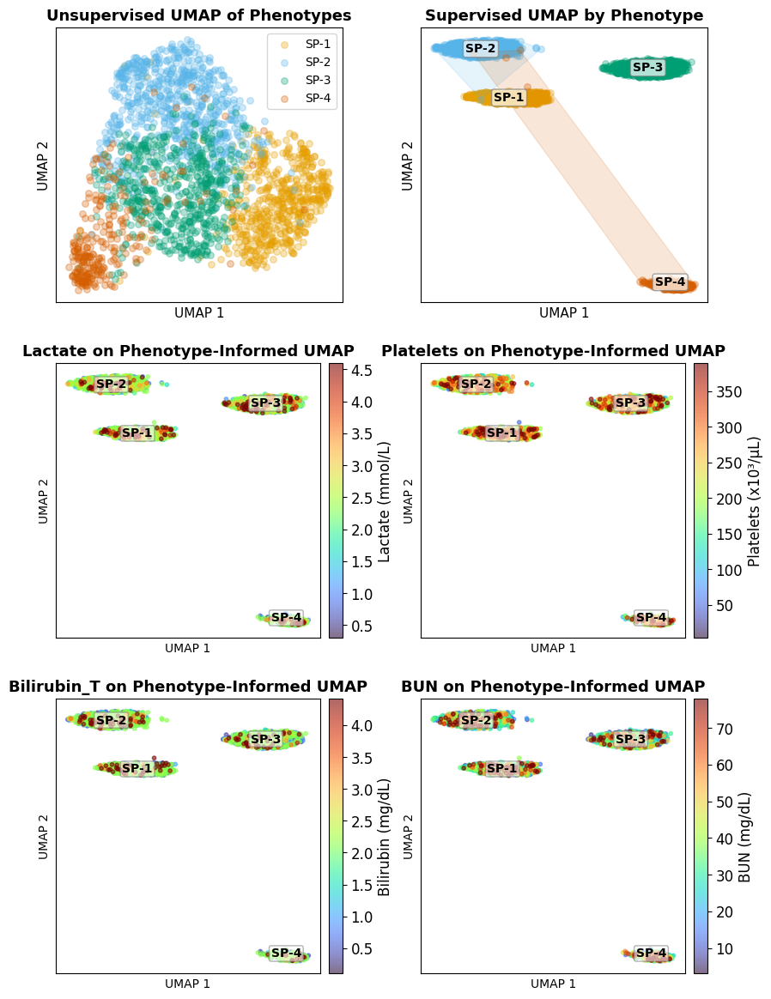

In [50]:
# =========================
# PUBLICATION-READY: 4x2 UMAP Figure
# Panels:
# [0,0]: Unsupervised UMAP
# [0,1]: Supervised UMAP (with hulls & labels)
# [1,0]-[3,1]: 6 Lab overlays (Lactate, Troponin, BNP, Platelets, Bilirubin, PaO2)
# =========================

import umap
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import ConvexHull

# ---- Step 1: Preprocessing (unchanged) ----
feat_data = tcc.preprocessing_pipeline(
    df_presepsis_5min_labs[feature_list],
    standard_minmax='standard',
    var_thresh=0.01,
    corr_thresh=0.85
)
phenotype_labels = df_presepsis_5min_labs['label'].astype(int).values

# ---- Step 2: UMAP embeddings ----
# Supervised
reducer_sup = umap.UMAP(
    n_components=2,
    n_neighbors=30,
    target_metric='categorical',
    target_weight=0.06,
    random_state=10
)
embedding_sup = reducer_sup.fit_transform(feat_data, y=phenotype_labels)

# Unsupervised
reducer_unsup = umap.UMAP(
    n_components=2,
    n_neighbors=30,
    random_state=10
)
embedding_unsup = reducer_unsup.fit_transform(feat_data)

# ---- Step 3: Build DataFrames ----
# Supervised UMAP df (for panels 0,1 and lab overlays)
df_umap_sup = pd.DataFrame({
    'UMAP1': embedding_sup[:, 0],
    'UMAP2': embedding_sup[:, 1],
    'Phenotype': phenotype_labels,
    'Lactate': df_presepsis_5min_labs['Lactate_avg_24h_post'].values,
    'Troponin': df_presepsis_5min_labs['Troponin_avg_24h_post'].values,
    'PaO2': df_presepsis_5min_labs['PaO2_avg_24h_post'].values,
    'BNP': df_presepsis_5min_labs['BNP_avg_24h_post'].values,
    'Bilirubin_T': df_presepsis_5min_labs['Bilirubin_total_avg_24h_post'].values,
    'BUN': df_presepsis_5min_labs['BUN_avg_24h_post'].values,
    'Platelets': df_presepsis_5min_labs['Platelets_avg_24h_post'].values,
    'Creatinine': df_presepsis_5min_labs['Creatinine_avg_24h_post'].values    
})

# Unsupervised UMAP df
df_umap_unsup = pd.DataFrame({
    'UMAP1': embedding_unsup[:, 0],
    'UMAP2': embedding_unsup[:, 1],
    'Phenotype': phenotype_labels
})

# Phenotype mapping
phenotype_map = {0: 'SP-1', 1: 'SP-2', 2: 'SP-3', 3: 'SP-4'}
df_umap_sup['Phenotype_label'] = df_umap_sup['Phenotype'].map(phenotype_map)
df_umap_unsup['Phenotype_label'] = df_umap_unsup['Phenotype'].map(phenotype_map)

# Okabe-Ito palette
okabe_ito = ['#E69F00', '#56B4E9', '#009E73', '#D55E00']
phenotype_order = ['SP-1', 'SP-2', 'SP-3', 'SP-4']
palette = dict(zip(phenotype_order, okabe_ito))

# Centroids (use supervised embedding)
centroids = df_umap_sup.groupby('Phenotype')[['UMAP1', 'UMAP2']].mean().reset_index()
centroids['Phenotype_label'] = centroids['Phenotype'].map(phenotype_map)

# Labs to plot (select 6 for 3 rows)
lab_list = [
    ('Lactate', 'Lactate (mmol/L)'),
    # ('Troponin', 'Troponin (ng/mL)'),
    # ('Creatinine', 'Creatinine (mg/dL)'),
    # ('BNP', 'BNP (pg/mL)'),
    ('Platelets', 'Platelets (x10³/μL)'),
    ('Bilirubin_T', 'Bilirubin (mg/dL)'),
    # ('PaO2', 'PaO₂ (mmHg)')
    ('BUN', 'BUN (mg/dL)')
]

# =========================
# FIGURE: 4x2 Grid
# =========================
fig, axes = plt.subplots(3, 2, figsize=(9, 12))  # 4 rows, 2 cols

# --- Panel [0,0]: Unsupervised UMAP ---
ax = axes[0, 0]
for pheno in phenotype_order:
    subset = df_umap_unsup[df_umap_unsup['Phenotype_label'] == pheno]
    ax.scatter(subset['UMAP1'], subset['UMAP2'], 
               c=[palette[pheno]], s=30, alpha=0.3, label=pheno)
ax.set_title('Unsupervised UMAP of Phenotypes', fontsize=13, fontweight='bold')
ax.set_xlabel('UMAP 1', fontsize=11)
ax.set_ylabel('UMAP 2', fontsize=11)
ax.legend()
ax.set_xticks([])
ax.set_yticks([])

# --- Panel [0,1]: Supervised UMAP with hulls ---
ax = axes[0, 1]
for pheno in phenotype_order:
    subset = df_umap_sup[df_umap_sup['Phenotype_label'] == pheno]
    color = palette[pheno]
    ax.scatter(subset['UMAP1'], subset['UMAP2'], c=[color], s=30, alpha=0.3)
    if len(subset) >= 3:
        points = subset[['UMAP1', 'UMAP2']].values
        try:
            hull = ConvexHull(points)
            hull_points = points[hull.vertices]
            ax.fill(hull_points[:, 0], hull_points[:, 1], color=color, alpha=0.15)
        except:
            pass  # In case hull fails (collinear points)

# Centroid labels
for _, row in centroids.iterrows():
    ax.text(row['UMAP1'], row['UMAP2'], row['Phenotype_label'],
            fontsize=10, fontweight='bold', 
            ha='center', va='center',
            bbox=dict(boxstyle="round,pad=0.2", facecolor='white', edgecolor='gray', alpha=0.7))

ax.set_title('Supervised UMAP by Phenotype', fontsize=13, fontweight='bold')
ax.set_xlabel('UMAP 1', fontsize=11)
ax.set_ylabel('UMAP 2', fontsize=11)
ax.set_xticks([])
ax.set_yticks([])

# --- Panels [1,0] to [3,1]: Lab Overlays ---
lab_axes = [(1,0), (1,1), (2,0), (2,1), (3,0), (3,1)]

for (row, col), (lab_key, lab_label) in zip(lab_axes, lab_list):
    ax = axes[row, col]
    # Drop NaN
    df_plot = df_umap_sup.dropna(subset=[lab_key]).copy()
    if df_plot.empty:
        ax.text(0.5, 0.5, f'No data\nfor {lab_key}', ha='center', va='center')
        ax.set_xticks([])
        ax.set_yticks([])
        continue
    
    # Sort by value (high on top)
    df_plot = df_plot.sort_values(lab_key)
    
    # Clamp to 95th percentile
    vmax = np.percentile(df_plot[lab_key], 95)
    vmin = df_plot[lab_key].min()
    
    # Scatter
    sc = ax.scatter(df_plot['UMAP1'], df_plot['UMAP2'],
                    c=df_plot[lab_key],
                    cmap='turbo',
                    vmin=vmin, vmax=vmax,
                    s=10, alpha=0.6)
    
    # Centroid labels (for reference)
    for _, r in centroids.iterrows():
        ax.text(r['UMAP1'], r['UMAP2'], r['Phenotype_label'],
                fontsize=10, fontweight='bold', 
                ha='center', va='center',
                bbox=dict(boxstyle="round,pad=0.15", facecolor='white', edgecolor='gray', alpha=0.6))
    
    ax.set_title(lab_key+' on Phenotype-Informed UMAP', fontsize=13, fontweight='bold')
    ax.set_xlabel('UMAP 1', fontsize=10)
    ax.set_ylabel('UMAP 2', fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # # Colorbar inside plot
    # from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    # cax = inset_axes(ax, width="4%", height="50%", loc='center right', borderpad=3)
    # cbar = plt.colorbar(sc, cax=cax)
    # cbar.ax.tick_params(labelsize=7)
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = plt.colorbar(sc, cax=cax)
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label(lab_label, fontsize=12)

# Adjust layout
plt.tight_layout(pad=2.0)

# # Save
# plt.savefig('Figures/UMAP_4x2_Comprehensive.svg', dpi=300, bbox_inches='tight')
# plt.savefig('Figures/UMAP_4x2_Comprehensive.pdf', dpi=300, bbox_inches='tight')

plt.show()

In [100]:
for lab in ['BNP', 'Troponin']:
    vals = df_umap_sup[lab].dropna()
    print(f"\n{lab}:")
    print(f"  Median = {vals.median():.2f}")
    print(f"  % at median = {100 * (vals == vals.median()).mean():.1f}%")
    print(f"  Unique values = {vals.nunique()}")


BNP:
  Median = 637.32
  % at median = 91.3%
  Unique values = 165

Troponin:
  Median = 81.97
  % at median = 82.7%
  Unique values = 254


In [96]:
df_umap_sup.iloc[:,3:-1].describe()

,Lactate,Troponin,PaO2,BNP,Bilirubin_total,BUN,Platelets,Creatinine
count,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000
mean,2.329638,70.756386,143.634494,637.322751,2.107954,31.752438,202.811796,1.800305
std,1.816634,31.023421,45.399547,242.272084,3.357279,23.274478,100.487522,1.745750
min,0.300000,0.100000,31.000000,16.000000,0.100000,3.000000,10.000000,0.200000
25%,1.504167,81.969028,143.050000,637.322751,0.700000,16.000000,138.000000,0.800000
50%,2.329638,81.969028,143.634494,637.322751,2.107954,29.000000,202.808806,1.366667
75%,2.329638,81.969028,143.634494,637.322751,2.107954,37.000000,240.000000,1.800305
max,29.925000,200.000000,540.000000,4140.000000,49.000000,268.500000,868.500000,25.316667


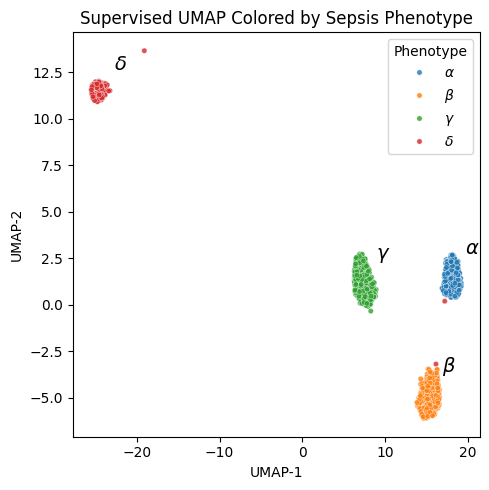

In [112]:
# =========================
# Supervised UMAP + Phenotype Identification + Lab Overlay
# =========================

import umap
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---- Step 1: Preprocess features (already defined by you) ----
feat_data = tcc.preprocessing_pipeline(
    df_presepsis_5min_labs[feature_list],
    standard_minmax='standard',
    var_thresh=0.01,
    corr_thresh=0.85
)

phenotype_labels = df_presepsis_5min_labs['label'].astype(int).values

# ---- Step 2: Supervised UMAP ----
reducer = umap.UMAP(
    n_components=2,
    init='spectral',
    n_neighbors=30,
    target_metric='categorical',
    target_weight=0.09,   # weak supervision
    random_state=10
)

embedding = reducer.fit_transform(feat_data, y=phenotype_labels)

# ---- Step 3: Build UMAP DataFrame ----
df_umap = pd.DataFrame({
    'UMAP1': embedding[:, 0],
    'UMAP2': embedding[:, 1],
    'Phenotype': phenotype_labels,
    'Lactate': df_presepsis_5min_labs['Lactate_avg_24h_post'].values,
    'Troponin': df_presepsis_5min_labs['Troponin_avg_24h_post'].values,
    'PaO2': df_presepsis_5min_labs['PaO2_avg_24h_post'].values,
    'BNP': df_presepsis_5min_labs['BNP_avg_24h_post'].values,
    'Bilirubin_total': df_presepsis_5min_labs['Bilirubin_total_avg_24h_post'].values,
    'BUN': df_presepsis_5min_labs['BUN_avg_24h_post'].values,
    'Platelets': df_presepsis_5min_labs['Platelets_avg_24h_post'].values,
    'Creatinine': df_presepsis_5min_labs['Creatinine_avg_24h_post'].values    
})

# ---- Step 4: Compute phenotype centroids ----
centroids = (
    df_umap
    .groupby('Phenotype')[['UMAP1', 'UMAP2']]
    .mean()
    .reset_index()
)


phenotype_map = {
    0: r'$\alpha$',
    1: r'$\beta$',
    2: r'$\gamma$',
    3: r'$\delta$'
}
df_umap['Phenotype_label'] = df_umap['Phenotype'].map(phenotype_map)

#Convert the label column to an ordered categorical
phenotype_order = [r'$\alpha$', r'$\beta$', r'$\gamma$', r'$\delta$']
df_umap['Phenotype_label'] = pd.Categorical(
    df_umap['Phenotype_label'],
    categories=phenotype_order,
    ordered=True
)

# =========================
# Plot 1: Phenotype-labeled UMAP (identity check)
# =========================
plt.figure(figsize=(5,5))
sns.scatterplot(
    data=df_umap,
    x='UMAP1',
    y='UMAP2',
    hue='Phenotype_label',
    hue_order=phenotype_order, 
    palette='tab10',
    s=15,
    alpha=0.8
)

# Annotate centroids with Greek letters
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold'
    )

plt.title('Supervised UMAP Colored by Sepsis Phenotype')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.legend(title='Phenotype')
plt.tight_layout()
plt.show()


In [88]:
df_umap.columns

Index(['UMAP1', 'UMAP2', 'Phenotype', 'Lactate', 'Phenotype_label'], dtype='object')

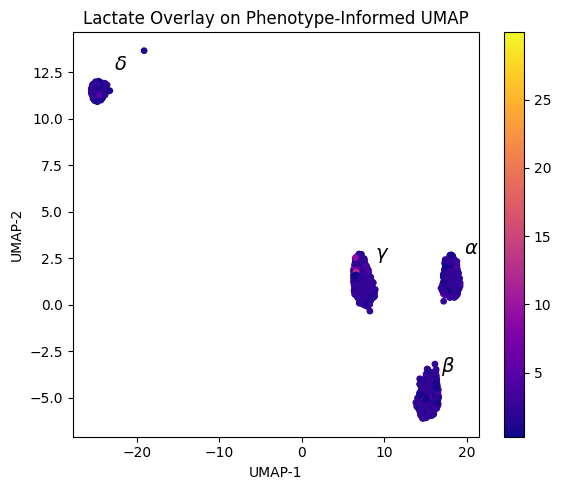

In [113]:
# =========================
# Plot 2: Lab overlay (interpretability)
# =========================
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['Lactate'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('Lactate Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

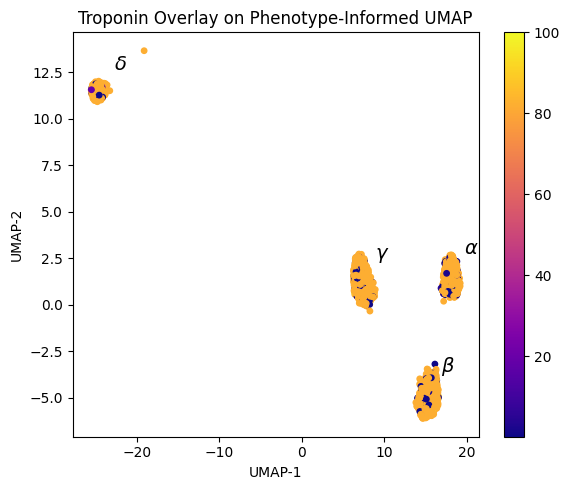

In [114]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['Troponin'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('Troponin Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

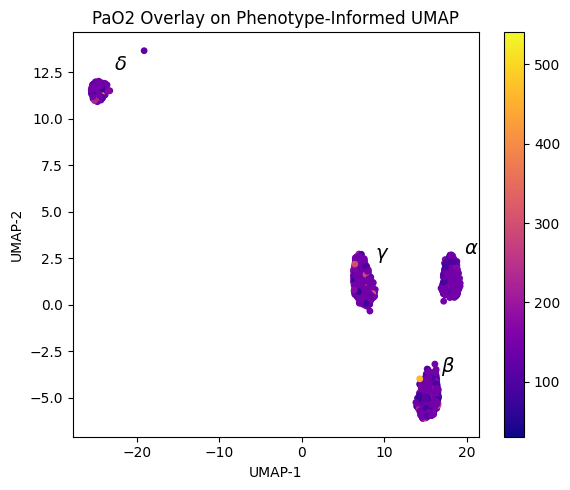

In [115]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['PaO2'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('PaO2 Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

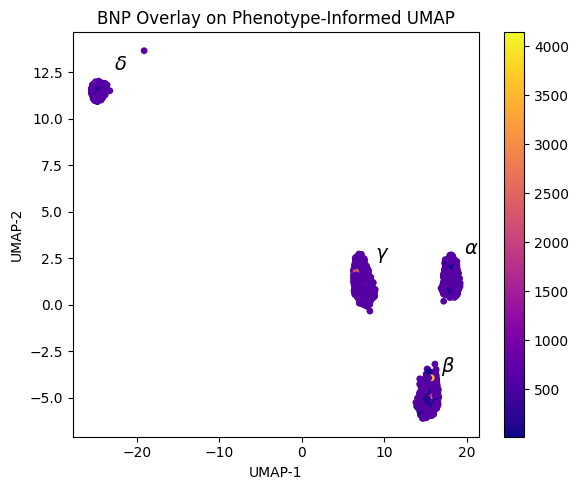

In [116]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['BNP'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('BNP Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

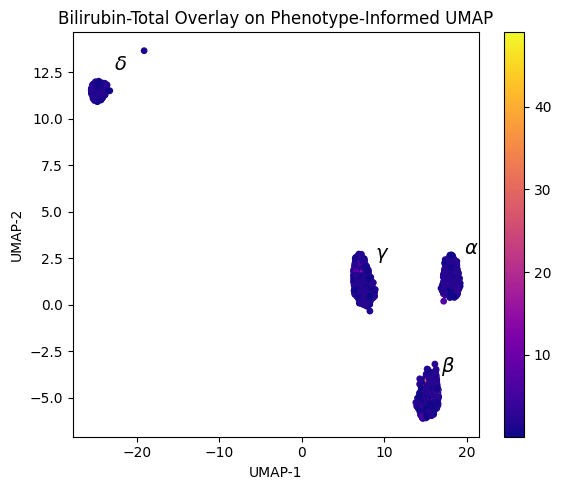

In [117]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['Bilirubin_total'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('Bilirubin-Total Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

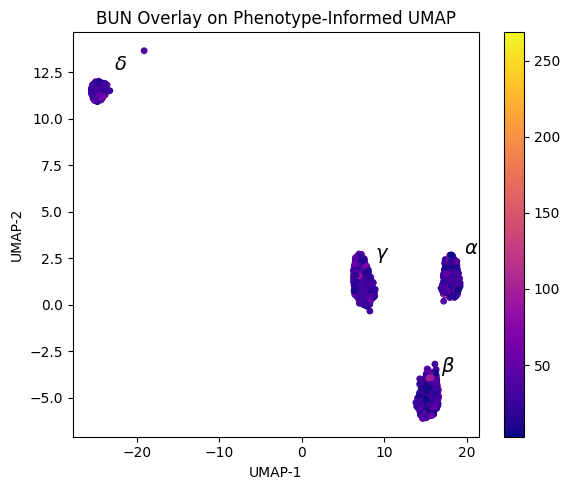

In [118]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['BUN'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('BUN Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

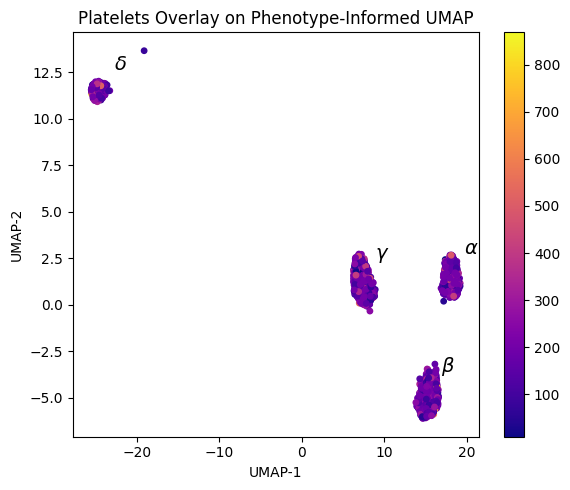

In [119]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['Platelets'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('Platelets Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

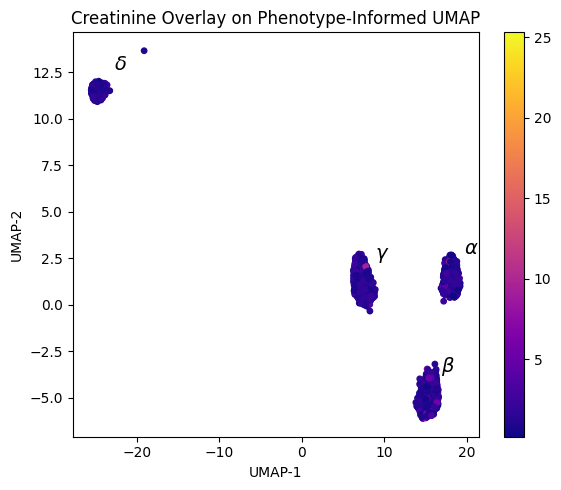

In [120]:
plt.figure(figsize=(6,5))
sc = plt.scatter(
    df_umap['UMAP1'],
    df_umap['UMAP2'],
    c=df_umap['Creatinine'],
    cmap='plasma',
    s=15
)

# Annotate phenotype centroids
for _, row in centroids.iterrows():
    label = phenotype_map[int(row['Phenotype'])]  # α, β, γ, δ
    plt.text(
        row['UMAP1']+1.5,
        row['UMAP2']+1.3,
        label,
        fontsize=14,
        weight='bold',
        color='black'
    )

plt.colorbar(sc)#, label='Troponin (ng/mL)')
plt.title('Creatinine Overlay on Phenotype-Informed UMAP')
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.show()

In [61]:
df_presepsis_5min_labs.loc[:,'ALT_avg_24h_post':].describe()

,ALT_avg_24h_post,AST_avg_24h_post,Albumin_avg_24h_post,AlkPhos_avg_24h_post,ArterialPh_avg_24h_post,BNP_avg_24h_post,BUN_avg_24h_post,BaseDeficitArterial_avg_24h_post,Bicarb_avg_24h_post,Bilirubin_total_avg_24h_post,...,Neut_perc_avg_24h_post,PT_avg_24h_post,PTT_avg_24h_post,PaO2_avg_24h_post,Platelets_avg_24h_post,Potassium_avg_24h_post,Sodium_avg_24h_post,Troponin_avg_24h_post,WBC_avg_24h_post,iCal_avg_24h_post
count,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,...,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000,2174.000000
mean,119.097448,184.215739,2.949689,106.047052,7.354004,637.322751,31.752438,4.892669,23.708700,2.107954,...,79.448512,18.971627,39.297896,143.634494,202.808806,4.108722,137.434767,81.969028,12.769056,1.131657
std,309.594993,488.445344,0.423368,88.173530,0.051417,242.272084,23.274478,2.140582,5.001809,3.357279,...,10.877589,5.708288,10.732789,45.399547,100.493358,0.587833,5.293242,294.791630,6.739971,0.058343
min,3.000000,6.500000,1.000000,17.000000,6.990000,16.000000,3.000000,0.000000,6.666667,0.100000,...,2.000000,11.600000,21.100000,31.000000,3.500000,2.000000,108.727273,0.100000,0.200000,0.600000
25%,22.000000,32.000000,2.900000,74.000000,7.354004,637.322751,16.000000,4.892669,21.000000,0.700000,...,78.000000,16.400000,39.297896,143.050000,138.000000,3.700000,135.000000,81.969028,8.600000,1.131657
50%,119.097448,184.215739,2.949689,106.047052,7.354004,637.322751,29.000000,4.892669,23.708700,2.107954,...,79.448512,18.971627,39.297896,143.634494,202.808806,4.108722,137.434767,81.969028,12.769056,1.131657
75%,119.097448,184.215739,3.000000,106.047052,7.354004,637.322751,37.000000,4.892669,25.666667,2.107954,...,85.500000,18.971627,39.297896,143.634494,240.000000,4.400000,140.000000,81.969028,14.900000,1.131657
max,4605.000000,8650.000000,4.900000,1976.000000,7.580000,4140.000000,268.500000,24.000000,51.333333,49.000000,...,98.000000,109.566667,183.700000,540.000000,868.500000,7.150000,171.500000,12510.750000,82.800000,1.760000


# Univariate prediction analysis of mortality from HR

In [63]:
df_1stSeg_5min = df_presepsis_5min.merge(df_Sepsis_latest_demo[df_Sepsis_latest_demo.segmentID==0], how='left', on=['fin'])
demo_table_RR = df_1stSeg_5min[~df_1stSeg_5min.label.isnull()][['fin','ECG_T_rr_ms_mean',
       'ECG_T_rr_ms_median','ECG_T_rr_ms_min', 'ECG_T_rr_ms_max','death', 'Death28','Death7','Death2','Death1']]

In [64]:
demo_table_hr = df_1stSeg_5min[~df_1stSeg_5min.label.isnull()][['fin','ECG_HR_bpm_mean',
       'ECG_HR_bpm_median','ECG_HR_bpm_min', 'ECG_HR_bpm_max','death', 'Death28','Death7','Death2','Death1']]

In [71]:
demo_table_qsofa = df_1stSeg_5min[~df_1stSeg_5min.label.isnull()][['fin','age','qSOFA_sbp_x',
       'qSOFA_rr_x', 'qSOFA_gcs_x', 'qSOFA_total_x','death', 'Death28','Death7','Death2','Death1']]

In [66]:
demo_table_RR.shape

(2174, 10)

In [67]:
df_1stSeg_5min.columns[20:]

Index(['ECG_T_rr_ms_p25', 'ECG_T_rr_ms_p75', 'ECG_T_rr_ms_skewness',
       'ECG_T_rr_ms_kurtosis', 'ECG_T_rr_ms_entropy', 'ECG_T_rr_ms_slope',
       'ECG_T_rr_ms_autocorr_lag1', 'ECG_T_rr_ms_gini_index',
       'ECG_T_rr_ms_valid_n', 'ECG_HR_bpm_mean',
       ...
       'study_id', 'FIN_study_id', 'age', 'sex', 'race', 'ethnicity',
       'disch_disp', 'disch_date', 'studyID_y', 'death'],
      dtype='object', length=2350)

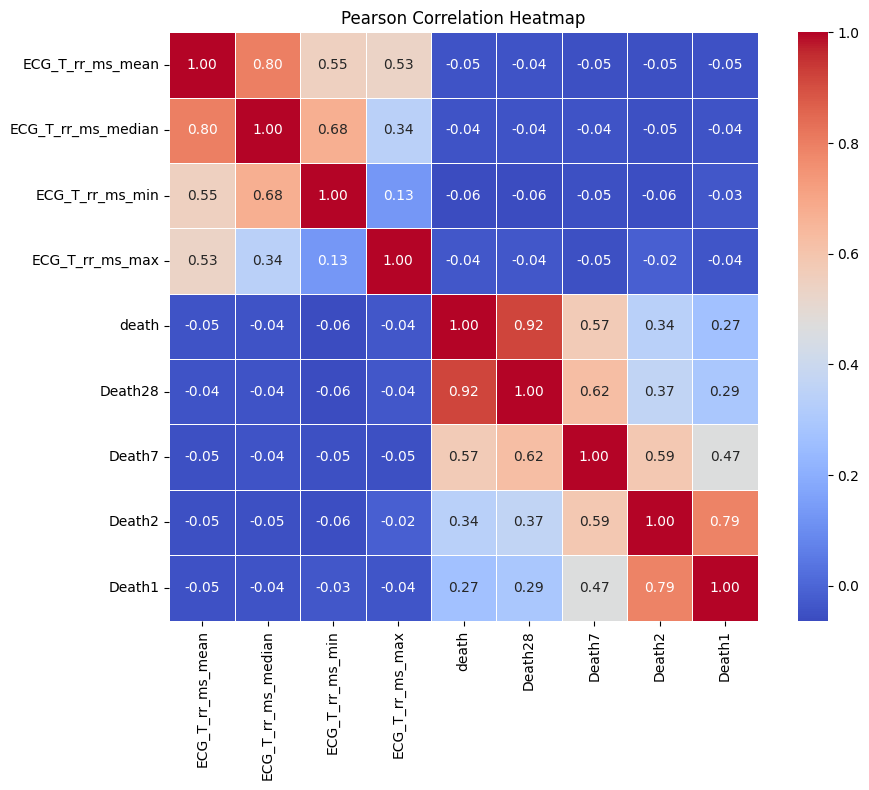

In [68]:
import seaborn as sns
# import matplotlib.pyplot as plt


# Compute Pearson correlation matrix
corr_matrix = demo_table_RR.iloc[:,1:].corr(method='pearson')

# Plot
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=.5)
plt.title('Pearson Correlation Heatmap')
plt.tight_layout()
plt.show()

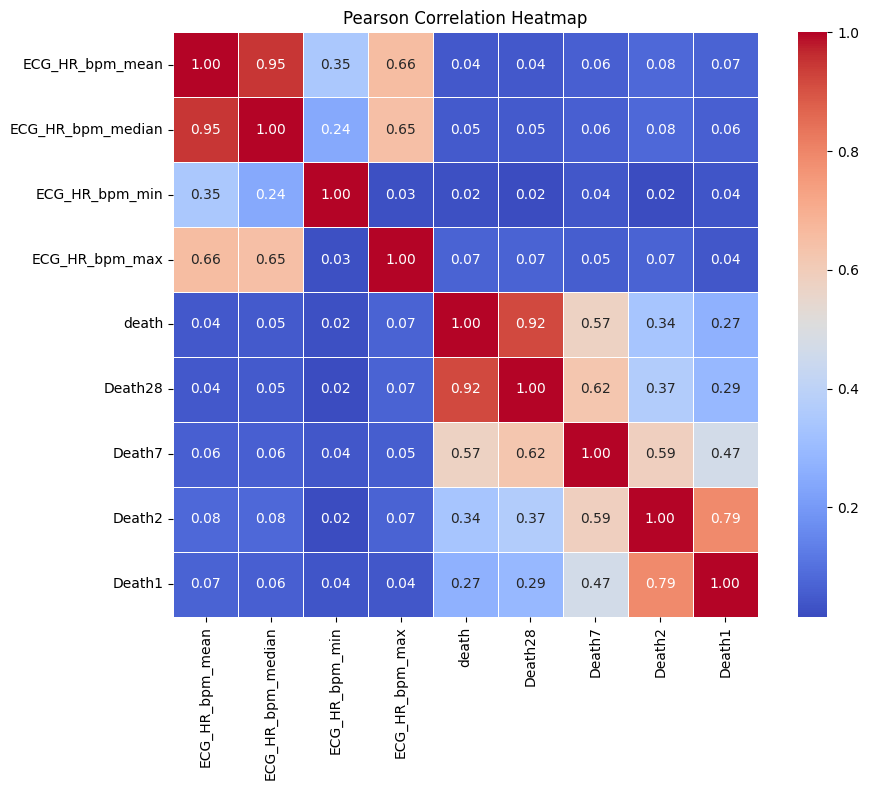

In [69]:
# Compute Pearson correlation matrix
corr_matrix = demo_table_hr.iloc[:,1:].corr(method='pearson')

# Plot
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=.5)
plt.title('Pearson Correlation Heatmap')
plt.tight_layout()
plt.show()

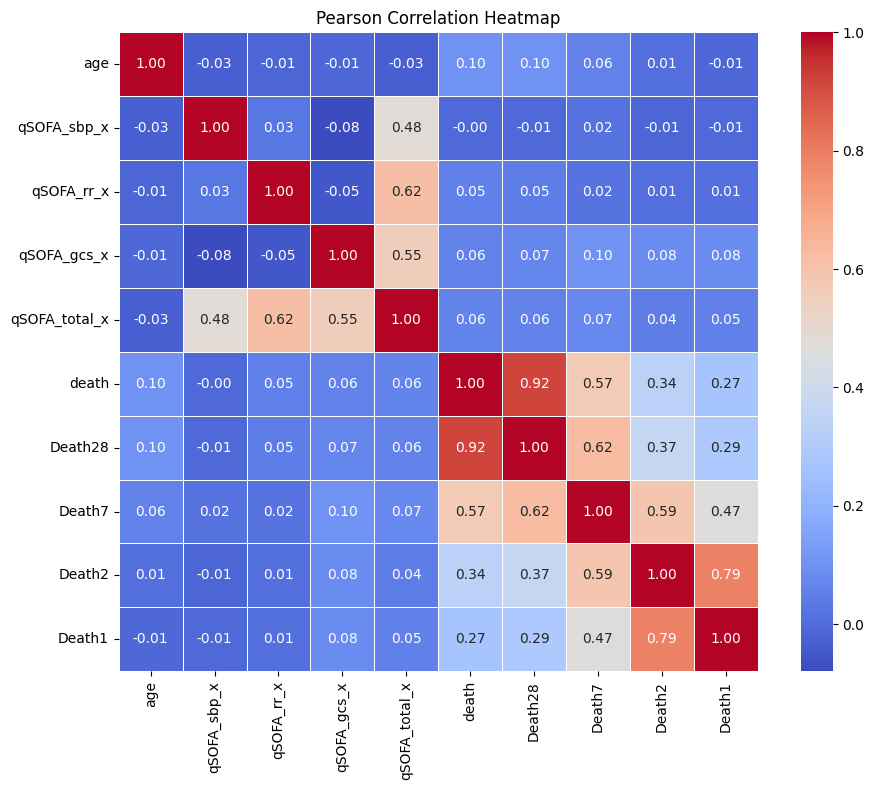

In [72]:
# Compute Pearson correlation matrix
corr_matrix = demo_table_qsofa.iloc[:,1:].corr(method='pearson')

# Plot
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=.5)
plt.title('Pearson Correlation Heatmap')
plt.tight_layout()
plt.show()

## Further Analysis with current SOFA and EMR variables:

In [73]:
df_sepsis = pd.read_csv('../Sepsis_PittsSuper_table_2_12_24.csv') #having lots of s3 times and lab-records per patient 

In [ ]:
df_sepsis

In [27]:
#Making single lab&SOFA entry per fin-ID, corresponding to have closest but prior s3 time
df_sepsis['t_sepsis'] = pd.to_datetime(df_sepsis.t_sepsis)
df_sepsis['hourly'] = pd.to_datetime(df_sepsis.hourly)
df_sepsis['del_t'] = df_sepsis['t_sepsis']-df_sepsis['hourly']

for each fin--->
df_sepsis['del_t'].min()

SyntaxError: invalid syntax (1534569533.py, line 6)

In [28]:
#Now merging with wave-matched sepsis table

df_presepsis_5min.merge()

TypeError: DataFrame.merge() missing 1 required positional argument: 'right'

In [20]:
df_presepsis_5min

NameError: name 'df_presepsis_5min' is not defined

In [29]:
len(feature_list)

780

In [30]:
np.array(feature_list)

array(['T_rr_ms_mean', 'T_rr_ms_median', 'T_rr_ms_std', 'T_rr_ms_mad',
       'T_rr_ms_iqr', 'T_rr_ms_min', 'T_rr_ms_max', 'T_rr_ms_p75',
       'T_rr_ms_skewness', 'T_rr_ms_kurtosis', 'T_rr_ms_entropy',
       'T_rr_ms_slope', 'T_rr_ms_autocorr_lag1', 'T_rr_ms_gini_index',
       'HR_bpm_mean', 'HR_bpm_std', 'HR_bpm_mad', 'HR_bpm_iqr',
       'HR_bpm_min', 'HR_bpm_p25', 'HR_bpm_skewness', 'HR_bpm_kurtosis',
       'HR_bpm_entropy', 'HR_bpm_slope', 'HR_bpm_autocorr_lag1',
       'edr_rate_Bpm_mean', 'edr_rate_Bpm_median', 'edr_rate_Bpm_std',
       'edr_rate_Bpm_mad', 'edr_rate_Bpm_iqr', 'edr_rate_Bpm_min',
       'edr_rate_Bpm_max', 'edr_rate_Bpm_p25', 'edr_rate_Bpm_p75',
       'edr_rate_Bpm_skewness', 'edr_rate_Bpm_kurtosis',
       'edr_rate_Bpm_entropy', 'edr_rate_Bpm_slope',
       'edr_rate_Bpm_autocorr_lag1', 'edr_rate_Bpm_gini_index',
       'atrialSys_phase_mean', 'atrialSys_phase_std',
       'atrialSys_phase_mad', 'atrialSys_phase_iqr',
       'atrialSys_phase_min', 'atrial

# Step 5: Phenotype prediction

In [76]:
# #### Load the saved model
# import pickle
# filename = 'Data_folder/xgb_SepsisPhysiologicPhenotype_Predictor_v8.sav'

# # pickle.dump(xgbmodel, open(filename, 'wb'))











# #### load the model
# xgbmodel = pickle.load(open(filename, 'rb'))


# 109 selected


FileNotFoundError: [Errno 2] No such file or directory: 'Data_folder/xgb_SepsisPhysiologicPhenotype_Predictor_v8.sav'

In [66]:
xgbmodel

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [18]:
# https://seaborn.pydata.org/generated/seaborn.pairplot.html

# https://www.researchgate.net/figure/Comparison-of-the-classification-outcomes-and-the-probability-distributions-for-the-two_fig3_380195975

# https://jonathanherreracom.wordpress.com/2021/01/30/regresion-lineal-con-python-y-scikit-learn/

In [67]:
int(6*60/5)

72

In [68]:
len(feature_list)

272

In [69]:
df_Sepsis_latest_wTarget.columns[-30:]

Index(['RESP_resp_rate_Bpm_gini_index', 'RESP_resp_rate_Bpm_valid_n',
       'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total', 'Death28',
       'Death7', 'Death2', 'Death1', 'vpfd28', 'vpfd7', 'vpfd2', 'vfd28',
       'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2', 'ss28', 'ss7', 'ss2', 'ss1',
       'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2', 'v1'],
      dtype='object')

In [70]:
### Prediction of phenotype memberships for each of the 5min segments (total 72).

df_allFIN = df_Sepsis_latest_wTarget.drop_duplicates(subset='fin').reset_index(drop=True)[['fin','studyID','year_sepsis']]
for i in tqdm(range(int(6*60/5))):
    df_segment = df_Sepsis_latest_wTarget[df_Sepsis_latest_wTarget.segmentID==i]
    df_initials = df_segment[['fin','studyID']]
    feat_data = df_segment[feature_list]
    y_pred = xgbmodel.predict(feat_data)
    df_initials['label_seg'+str(i)] = y_pred
    df_allFIN = df_allFIN.merge(df_initials, on=['fin','studyID'], how='left')

100%|██████████| 72/72 [00:01<00:00, 43.80it/s]


In [ ]:
df_allFIN

In [88]:
# df_allFIN.iloc[:,3:6].to_csv('xyz15.csv')

In [89]:
df_allFIN.label_seg71.isnull().sum()

2009

# Step 6: Saving

In [72]:
# df_allFIN.to_csv('Data_folder/df_step2_TS_pitts_s3_phenotypePredictedSegments_v8_ftt.csv')










df_allFIN = pd.read_csv('Data_folder/df_step2_TS_pitts_s3_phenotypePredictedSegments_v8_ftt.csv')

# Exploratory Individual Block Analysis: Correlation, Pairplot, Mutual information for Rationale

In [73]:
from tc_physiophenotypic_feature_analysis import *

In [ ]:
df_allFIN_feature = tc_phenotypic_feature_extraction(df=df_allFIN.copy(), block_duration='15min')
df_allFIN_feature

In [88]:
df_Sepsis_latest_wTarget.columns[-25:]

Index(['qSOFA_total', 'Death28', 'Death7', 'Death2', 'Death1', 'vpfd28',
       'vpfd7', 'vpfd2', 'vfd28', 'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2',
       'ss28', 'ss7', 'ss2', 'ss1', 'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2',
       'v1'],
      dtype='object')

In [ ]:
colz = ['fin','studyID','Death28', 'Death7', 'Death2', 'vpfd28', 'vpfd7', 'vpfd2', 'vfd28',
       'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2', 'ss28','ss7','ss2','vp28', 'vp7', 'vp2', 'v28', 'v7',
       'v2', 'v1'] #,'segmentID'
df_feature_wTarget = df_allFIN_feature.merge(df_Sepsis_latest_wTarget[colz], how='left', on=['fin','studyID']).drop_duplicates()
df_feature_wTarget.reset_index(inplace=True, drop=True)
df_feature_wTarget

In [90]:
df_feature_wTarget.Death28.unique()

array([0., 1.])

In [91]:
from sklearn.preprocessing import StandardScaler
col_id0 = list(df_feature_wTarget.columns).index('label_seg71') #column number of last presepsis segment 
col_id1 = list(df_feature_wTarget.columns).index('Death28') #column number of 1st target variable
df_std_feat = StandardScaler().fit_transform(df_feature_wTarget.iloc[:,col_id0+1:col_id1])
df_std_feat = pd.DataFrame(df_std_feat, columns = df_feature_wTarget.iloc[:,col_id0+1:col_id1].columns)

In [92]:
outcm = df_feature_wTarget[['Death28', 'Death7', 'Death2', 'vpfd28', 'vpfd7', 'vpfd2', 'vfd28',
       'vfd7', 'vfd2', 'bfd28', 'bfd7', 'bfd2', 'ss28','ss7','ss2','vp28', 'vp7', 'vp2', 'v28', 'v7',
       'v2', 'v1']]
df_std_feat_extend = pd.concat([df_std_feat, outcm], axis=1)

df1_death28 = pd.concat([df_std_feat, df_feature_wTarget[['Death28']]], axis=1)
df1_death7 = pd.concat([df_std_feat, df_feature_wTarget[['Death7']]], axis=1)
df1_death2 = pd.concat([df_std_feat, df_feature_wTarget[['Death2']]], axis=1)

df1_vpfd28 = pd.concat([df_std_feat, df_feature_wTarget[['vpfd28']]], axis=1)
df1_vpfd7 = pd.concat([df_std_feat, df_feature_wTarget[['vpfd7']]], axis=1)
df1_vpfd2 = pd.concat([df_std_feat, df_feature_wTarget[['vpfd2']]], axis=1)

df1_vfd28 = pd.concat([df_std_feat, df_feature_wTarget[['vfd28']]], axis=1)
df1_vfd7 = pd.concat([df_std_feat, df_feature_wTarget[['vfd7']]], axis=1)
df1_vfd2 = pd.concat([df_std_feat, df_feature_wTarget[['vfd2']]], axis=1)

df1_bfd28 = pd.concat([df_std_feat, df_feature_wTarget[['bfd28']]], axis=1)
df1_bfd7 = pd.concat([df_std_feat, df_feature_wTarget[['bfd7']]], axis=1)
df1_bfd2 = pd.concat([df_std_feat, df_feature_wTarget[['bfd2']]], axis=1)

df1_ss28 = pd.concat([df_std_feat, df_feature_wTarget[['ss28']]], axis=1)
df1_ss7 = pd.concat([df_std_feat, df_feature_wTarget[['ss7']]], axis=1)
df1_ss2 = pd.concat([df_std_feat, df_feature_wTarget[['ss2']]], axis=1)

df1_vp28 = pd.concat([df_std_feat, df_feature_wTarget[['vp28']]], axis=1)
df1_vp7 = pd.concat([df_std_feat, df_feature_wTarget[['vp7']]], axis=1)
df1_vp2 = pd.concat([df_std_feat, df_feature_wTarget[['vp2']]], axis=1)

df1_v28 = pd.concat([df_std_feat, df_feature_wTarget[['v28']]], axis=1)
df1_v7 = pd.concat([df_std_feat, df_feature_wTarget[['v7']]], axis=1)
df1_v2 = pd.concat([df_std_feat, df_feature_wTarget[['v2']]], axis=1)

In [93]:
df_std_feat_extend.iloc[:,5:]

,15min_CTP_0-2,15min_CTP_0-3,15min_CTP_1-0,15min_CTP_1-2,15min_CTP_1-3,15min_CTP_2-0,15min_CTP_2-1,15min_CTP_2-3,15min_CTP_3-0,15min_CTP_3-1,...,ss28,ss7,ss2,vp28,vp7,vp2,v28,v7,v2,v1
0,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
3,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0
4,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2180,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2181,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
2182,-0.12966,-0.089784,1.877408,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
2183,-0.12966,-0.089784,-0.286166,-0.147331,-0.04157,-0.138601,-0.144725,-0.076158,-0.097158,-0.034956,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0


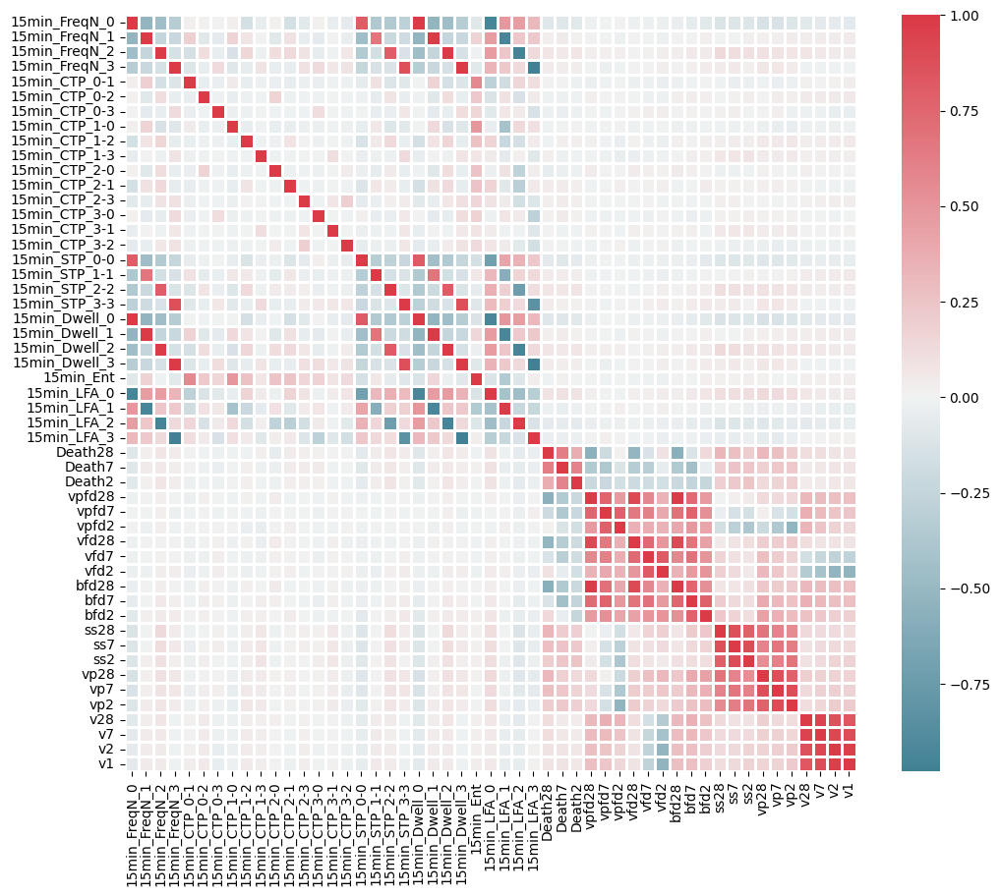

In [94]:
import seaborn as sns
corrx = df_std_feat_extend.corr()
f, ax = plt.subplots(figsize=(12,10))
cmap0 = sns.diverging_palette(220, 10, as_cmap=True)
heatmap0 = sns.heatmap(corrx, cmap=cmap0, center=0.0, vmax=1, linewidth=1, ax=ax)

In [86]:

'''Final death profile post-sepsis-onset'''

print(f'%Patients died after their sepsis-onset: d_A_perc, d_B_perc, d_C_perc, d_D_perc')
df_Sepsis_latest_demo['studyID'] = df_Sepsis_latest_demo['studyID_y'].astype('str')
cl = ['studyID','label_seg0','death']
dx = df_feature_wTarget.merge(df_Sepsis_latest_demo[df_Sepsis_latest_demo.segmentID==0][['fin','studyID','death']], how='left', on=['fin','studyID'])[cl]
dx_n = dx[~dx.death.isnull()].drop_duplicates().reset_index(drop=True)

d_A = dx_n[dx_n.label_seg0==0][['studyID','death']].drop_duplicates()
d_B = dx_n[dx_n.label_seg0==1][['studyID','death']].drop_duplicates()
d_C = dx_n[dx_n.label_seg0==2][['studyID','death']].drop_duplicates()
d_D = dx_n[dx_n.label_seg0==3][['studyID','death']].drop_duplicates()
d_all = dx_n[['studyID','death']].drop_duplicates()

d_A_perc = 100*(d_A.death==1).sum()/d_A.shape[0]
d_B_perc = 100*(d_B.death==1).sum()/d_B.shape[0]
d_C_perc = 100*(d_C.death==1).sum()/d_C.shape[0]
d_D_perc = 100*(d_D.death==1).sum()/d_D.shape[0]
d_all_perc = 100*(d_all.death==1).sum()/d_all.shape[0]


print(f'%Patients died after their sepsis-onset: {d_A_perc:.2f}, {d_B_perc:.2f}, {d_C_perc:.2f}, {d_D_perc:.2f}, (whole: {d_all_perc:.2f})')


'''Death profile within 28 days post-sepsis-onset'''



d28_A = df_feature_wTarget[df_feature_wTarget.label_seg0==0][['studyID','Death28']].drop_duplicates()
d28_B = df_feature_wTarget[df_feature_wTarget.label_seg0==1][['studyID','Death28']].drop_duplicates()
d28_C = df_feature_wTarget[df_feature_wTarget.label_seg0==2][['studyID','Death28']].drop_duplicates()
d28_D = df_feature_wTarget[df_feature_wTarget.label_seg0==3][['studyID','Death28']].drop_duplicates()

d28_A_perc = 100*(d28_A.Death28==1).sum()/d28_A.shape[0]
d28_B_perc = 100*(d28_B.Death28==1).sum()/d28_B.shape[0]
d28_C_perc = 100*(d28_C.Death28==1).sum()/d28_C.shape[0]
d28_D_perc = 100*(d28_D.Death28==1).sum()/d28_D.shape[0]

print(f'%Patients died in 28 days post-sepsis-onset: {d28_A_perc:.2f}, {d28_B_perc:.2f}, {d28_C_perc:.2f}, {d28_D_perc:.2f}')




%Patients died after their sepsis-onset: d_A_perc, d_B_perc, d_C_perc, d_D_perc
%Patients died after their sepsis-onset: 20.42, 24.50, 30.77, 29.50, (whole: 24.37)
%Patients died in 28 days post-sepsis-onset: 18.14, 21.21, 27.14, 25.00


In [ ]:
df_Sepsis_latest_demo

In [96]:
100*(d_all.death==1).sum()/d_all.shape[0]

24.206596141879277

In [97]:
dff = df_Sepsis_latest_demo.drop_duplicates(subset=['studyID'], keep='first')
100*dff.death.value_counts()/dff.shape[0]

death
False    75.95253
True     24.04747
Name: count, dtype: float64

### Mutual Information:
You’ll often see MI ≥ 0.03–0.05 for the top phenotype variables even when Pearson ≈ 0.

In [98]:
from sklearn.feature_selection import mutual_info_regression
mi_d28 = mutual_info_regression(df_std_feat, df1_death28['Death28'].values, discrete_features='auto')
pd.Series(mi_d28, index=df_std_feat.columns).sort_values(ascending=False).head(10)


30min_Dwell_1    0.024521
30min_Dwell_0    0.023577
30min_Ent        0.021369
30min_LFA_1      0.019676
30min_STP_3-3    0.018867
30min_CTP_3-0    0.014834
30min_CTP_0-2    0.013771
30min_LFA_2      0.013240
30min_CTP_1-2    0.013228
30min_STP_2-2    0.012040
dtype: float64

In [99]:
mi_d28 = mutual_info_regression(df_std_feat, df1_vpfd2['vpfd2'].values, discrete_features='auto')
pd.Series(mi_d28, index=df_std_feat.columns).sort_values(ascending=False).head(10)

30min_LFA_0      0.025132
30min_CTP_2-3    0.023752
30min_STP_2-2    0.018025
30min_STP_3-3    0.017180
30min_STP_0-0    0.015695
30min_CTP_1-3    0.012528
30min_FreqN_2    0.011865
30min_FreqN_0    0.011378
30min_CTP_1-0    0.010702
30min_FreqN_1    0.008165
dtype: float64

In [100]:
df_1stSeg_5min.reset_index(drop=True, inplace=True)
# df_1stSeg_5min

In [101]:
df_1stSeg_5min.columns

Index(['Unnamed: 0_x', 'waveID_x', 'fin', 'segmentID_x', 'year_sepsis_x',
       'studyID', 't_origin_x', 't_sepsis_x', 'sofa_x', 'DN_exists_x',
       ...
       'study_id', 'FIN_study_id', 'age', 'sex', 'race', 'ethnicity',
       'disch_disp', 'disch_date', 'studyID_y', 'death'],
      dtype='object', length=367)

In [102]:
z1 = df_1stSeg_5min[feature_list+['Death28','Death7', 'Death2','vpfd28','vpfd7','vpfd2','vfd28','vfd7','vfd2','bfd28','bfd7','bfd2']]
# z2 = pd.concat([z1, df_feature_wTarget[['label_seg0']]], axis=1)
corr1 = z1.corr()
f, ax = plt.subplots(figsize=(29,23))
cmap0 = sns.diverging_palette(220, 10, as_cmap=True)
heatmap0 = sns.heatmap(corr1, cmap=cmap0, center=0.0, vmax=1, linewidth=1, ax=ax)

KeyError: "['T_rr_ms', 'edr_rate_Bpm', 'atrialSys_phase', 'P_duration', 'QRS_duration', 'T_duration', 'pr_interval_ms', 'pr_segment_ms', 'st_interval_ms', 'st_segment_ms', 'ecgBeatCenterFreq', 'ecgInterbeat_eigval1', 'ecgInterbeat_eigval2', 'HRV_rqa_REC', 'HRV_rqa_DET', 'HRV_rqa_LAM', 'HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_MadNN', 'HRV_SDRMSSD', 'HRV_Prc80NN', 'HRV_pNN50', 'HRV_MinNN', 'HRV_MaxNN', 'HRV_TINN', 'HRV_VLF', 'HRV_LF', 'HRV_HF', 'HRV_VHF', 'HRV_LFHF', 'HRV_LFn', 'HRV_HFn', 'HRV_LnHF', 'HRV_SD1SD2', 'HRV_S', 'HRV_CVI', 'HRV_PIP', 'HRV_PSS', 'HRV_PAS', 'HRV_SI', 'HRV_AI', 'HRV_PI', 'HRV_C1d', 'HRV_C2d', 'HRV_Cd', 'HRV_DFA_alpha1', 'HRV_MFDFA_alpha1_Width', 'HRV_MFDFA_alpha1_Peak', 'HRV_MFDFA_alpha1_Mean', 'HRV_MFDFA_alpha1_Max', 'HRV_MFDFA_alpha1_Asymmetry', 'HRV_MFDFA_alpha1_Fluctuation', 'HRV_MFDFA_alpha1_Increment', 'HRV_DFA_alpha2', 'HRV_MFDFA_alpha2_Width', 'HRV_MFDFA_alpha2_Peak', 'HRV_MFDFA_alpha2_Mean', 'HRV_MFDFA_alpha2_Max', 'HRV_MFDFA_alpha2_Delta', 'HRV_MFDFA_alpha2_Asymmetry', 'HRV_MFDFA_alpha2_Fluctuation', 'HRV_MFDFA_alpha2_Increment', 'HRV_ApEn', 'HRV_SampEn', 'HRV_ShanEn', 'HRV_MSEn', 'HRV_HFD', 'HRV_KFD', 'HRV_LZC', 'MSE_0', 'MSE_1', 'MSE_2', 'MSE_3', 'MSE_4', 'MSE_5', 'MSE_6', 'MSE_7', 'AUC_pulse_nu', 'AUCow_nu', 'AUCwo_nu', 'AUCos_nu', 'AUCso_nu', 'T_ow_ms', 'T_os_ms', 'A_AC', 'A_off', 'A_dn', 'mean_slope_os', 'mean_slope_so', 'max_upslope', 'Delta_A_sp_sp', 'mean_ppg', 'skewness_ppg', 'kurtosis_ppg', 'entropy_ppg', 'energy_ppg', 'ppgBeatCenterFreq', 'ppgInterbeat_eigval1', 'ppgInterbeat_eigval2', 'ppgInterbeat_eigval3', 'insp_time', 'exp_time', 'insp_exp_ratio', 'resp_width_PPresp_s', 'qSOFA_sbp', 'qSOFA_rr', 'qSOFA_gcs', 'qSOFA_total'] not in index"

In [112]:
colss = df_std_feat_extend.columns.to_list()
# colss.remove('segmentID')

In [113]:
colss

['30min_FreqN_0',
 '30min_FreqN_1',
 '30min_FreqN_2',
 '30min_FreqN_3',
 '30min_CTP_0-1',
 '30min_CTP_0-2',
 '30min_CTP_0-3',
 '30min_CTP_1-0',
 '30min_CTP_1-2',
 '30min_CTP_1-3',
 '30min_CTP_2-0',
 '30min_CTP_2-1',
 '30min_CTP_2-3',
 '30min_CTP_3-0',
 '30min_CTP_3-1',
 '30min_CTP_3-2',
 '30min_STP_0-0',
 '30min_STP_1-1',
 '30min_STP_2-2',
 '30min_STP_3-3',
 '30min_Dwell_0',
 '30min_Dwell_1',
 '30min_Dwell_2',
 '30min_Dwell_3',
 '30min_Ent',
 '30min_LFA_0',
 '30min_LFA_1',
 '30min_LFA_2',
 '30min_LFA_3',
 'Death28',
 'Death7',
 'Death2',
 'vpfd28',
 'vpfd7',
 'vpfd2',
 'vfd28',
 'vfd7',
 'vfd2',
 'bfd28',
 'bfd7',
 'bfd2',
 'ss28',
 'ss7',
 'ss2']

In [114]:
df_std_feat_extend

,30min_FreqN_0,30min_FreqN_1,30min_FreqN_2,30min_FreqN_3,30min_CTP_0-1,30min_CTP_0-2,30min_CTP_0-3,30min_CTP_1-0,30min_CTP_1-2,30min_CTP_1-3,...,vpfd2,vfd28,vfd7,vfd2,bfd28,bfd7,bfd2,ss28,ss7,ss2
0,-0.758720,1.617680,-0.635037,-0.424047,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,-0.166850,...,0,26,5,0,25,6,1,1,1,1
1,-0.758720,0.392000,0.903240,-0.424047,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,-0.166850,...,2,25,7,2,25,7,2,0,0,0
2,1.665026,-0.833681,-0.635037,-0.424047,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,-0.166850,...,2,27,6,1,27,6,1,0,0,0
3,-0.758720,1.617680,-0.635037,-0.424047,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,-0.166850,...,0,28,7,2,27,6,1,0,0,0
4,0.049196,-0.833681,1.415999,-0.424047,-0.246874,1.669175,-0.076365,-0.252889,-0.340955,-0.166850,...,1,19,1,0,28,7,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1643,-0.758720,-0.833681,-0.635037,2.594873,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,-0.166850,...,0,28,7,2,28,7,2,1,1,1
1644,-0.758720,-0.833681,2.441517,-0.424047,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,-0.166850,...,0,28,7,2,28,7,2,0,0,0
1645,-0.758720,1.209120,-0.635037,0.079106,-0.246874,-0.284588,-0.076365,-0.252889,-0.340955,8.144537,...,1,28,7,2,28,7,2,0,0,0
1646,0.049196,-0.833681,1.415999,-0.424047,-0.246874,2.646056,-0.076365,-0.252889,-0.340955,-0.166850,...,1,28,7,2,28,7,2,0,0,0


IndexError: index 30 is out of bounds for axis 0 with size 30

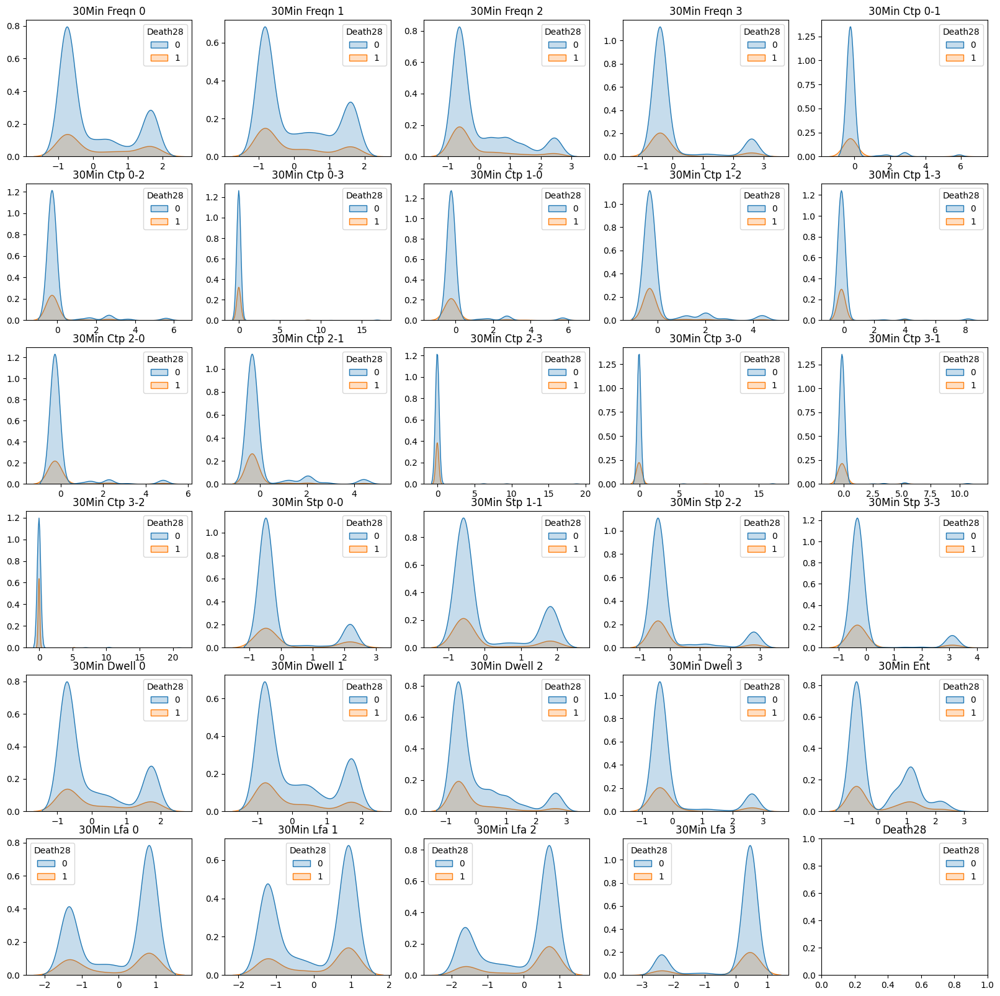

In [115]:
# Set up subplots
fig, axes = plt.subplots(6, 5, figsize=(20, 20))
axes = axes.flatten()

# Plot KDEs or distributions for each feature
for i, feature in enumerate(colss[:-12]):
    sns.kdeplot(data=df_std_feat_extend, x=feature, hue="Death28", fill=True, ax=axes[i])
    axes[i].set_title(feature.replace("_", " ").title())
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
plt.tight_layout()

In [254]:
sns.pairplot(df1_death, hue="Death28")

NameError: name 'df1_death' is not defined

In [ ]:
sns.pairplot(df1_vpfd, hue="Vasopressor-free days")

In [ ]:
sns.pairplot(df1_vfd, hue="Ventilator-free days")

In [ ]:
sns.pairplot(df1_bfd, hue="Bolus-free days")